In [1]:
#.jp-Cell:has(.cm-builtin) .jp-Cell-inputWrapper { display: none !important; }
from IPython.display import HTML
display(HTML("""
<style>

.jp-MarkdownCell h1 {
  font-family: sans-serif;
  font-size: 35px;
  font-weight: 600;
  color: #111;
  margin: 2.5rem 0 0.75rem 0;
}

.jp-MarkdownCell h2 {
  font-family: sans-serif;
  font-size: 25px;
  font-weight: 600;
  color: #333;
  margin: 2rem 0 0.75rem 0;
}

</style>
"""))

# Computational Creativity Assessment

***

<div style="background: #dbeafe; border-left: 3px solid #1d4ed8; border-radius: 0 6px 6px 0; padding: 14px 18px; display: flex; gap: 12px; align-items: flex-start;">
  <p style="margin: 0; font-size: 14px; color: #1e3a8a; line-height: 1.6; font-family: sans-serif;">
    This notebook is part of a study that compares human vs. LLM creativity. The results gathered here will be used as part of the research results, among human-assessment and LLM-assessment of the same dataset. The full research project is available at
    <a href="https://github.com/liseferinga/HumanLLMStories" target="_blank" style="color: #1d4ed8; font-weight: 600; text-decoration: underline;">this GitHub repository</a>.
  </p>
</div>

In [170]:
%%html
<style>
  .nb-info { background:#dbeafe; border-left:3px solid #1d4ed8; border-radius:0 8px 8px 0; padding:14px 18px; display:flex; gap:12px; align-items:flex-start; margin-bottom:2rem; }
  .nb-info p { margin:0; font-size:14px; color:#1e3a8a; line-height:1.6; font-family:sans-serif; }
  .nb-info a { color:#1d4ed8; font-weight:500; }
  .rq { background:#f8f8f8; border-left:3px solid #aaa; padding:12px 18px; margin:1.25rem 0; }
  .rq p { margin:0; font-size:15px; color:#444; line-height:1.7; font-style:italic; }
  .section-label { font-size:11px; font-weight:600; letter-spacing:.06em; text-transform:uppercase; color:#999; margin:0 0 8px 0; }
  .cat-card { background:#fff; border:1px solid #e5e5e5; border-radius:10px; padding:1rem 1.25rem; }
  .cat-header { display:flex; align-items:center; gap:8px; margin-bottom:12px; }
  .cat-badge { font-size:11px; font-weight:500; padding:3px 10px; border-radius:20px; margin-left:auto; }
  .cat-items { list-style:none; margin:0; padding:0; }
  .cat-items li { font-size:13px; color:#555; padding:5px 0; border-bottom:1px solid #f0f0f0; display:flex; gap:10px; line-height:1.4; }
  .cat-items li:last-child { border-bottom:none; }
  .ttcw-num { font-size:11px; font-weight:600; color:#aaa; min-width:52px; padding-top:1px; }
  .grid-2 { display:grid; grid-template-columns:repeat(auto-fit, minmax(280px, 1fr)); gap:12px; }
  .prose { font-size:15px; color:#444; line-height:1.75; margin:0 0 1rem 0; }
</style>

<h2 style="font-size:22px;font-weight:600;margin:0 0 .5rem 0;">About the research</h2>
<p class="prose">This study is part of a Digital Humanities Master Thesis project on computational (LLM-generated) creativity in comparison to human creativity. The general research question of the study is:</p>

<div class="rq"><p>Are short stories created by GenAI by prompting comparable with short stories written by human writers in terms of creativity?</p></div>


<p class="prose">Creativity is operationalized through the framework of <strong><a href = "https://arxiv.org/pdf/2309.14556" style="color:#000000;"> Chakrabarty et al. (2024)</a></strong>. In the first part of their study they, with the help of 8 creative writing professionals (that are either published authors, master creative writing students/lecturers), propose a 4-level <i> 'creativity measuring test' </i> based on 14 questions named the <strong> Torrance Test of Creative Writing </strong>. 


<p class="prose"><strong><a href = "https://doi.org/10.3758/s13428-020-01453-w" style="color:#000000;">Beaty &amp; Johnson (2020)</a></strong> state that although human-based ratings on creativity are proven to be useful, these ratings are often costly (raters need to be willing to give feedback on several tests) and subjective (different raters have different preferences or visions on what is creative). It would be ideal if there could be a measure that solves these 'threats to reliability and viability' in creativity research. Computationally approaching creativity could be such a measure.
    However, the current study does not only rely on this more 'effective' way of assessing creativity on texts. It views computational creativity assessment as a <strong>complementary</strong> measure to human assessment. The results of the creativity measures here will be studied as individual constructs, but also used to identify and seek an explenation of the structural differences in the text pointed out by the human assessors. </p>


<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">The TTCW framework proposed by <strong><a href = "https://arxiv.org/pdf/2309.14556" style="color:#000000;"> Chakrabarty et al. (2024)</a></strong>
</p>

<div class="grid-2">
  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#534AB7;"><a href="#ttcwFLUENCY" style="color:inherit;">Fluency</a></strong>
      <span class="cat-badge" style="background:#EEEDFE;color:#3C3489;">5 criteria</span>
    </div>
    <ul class="cat-items">
      <li><span class="ttcw-num"><a href="#ttcw1" style="color:inherit;" >TTCW 1</a></span> Narrative pacing</li>
      <li><span class="ttcw-num"><a href="#ttcw2" style="color:inherit;" >TTCW 2</a></span> Scene vs. exposition</li>
      <li><span class="ttcw-num"><a href="#ttcw3" style="color:inherit;" >TTCW 3</a></span> Literary devices</li>
      <li><span class="ttcw-num"><a href="#ttcw4" style="color:inherit;" >TTCW 4</a></span> Narrative ending</li>
      <li><span class="ttcw-num"><a href="#ttcw5" style="color:inherit;" >TTCW 5</a></span> Understandability &amp; coherence</li>
    </ul>
  </div>
  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#0F6E56;"><a href="#ttcwFLEXIBILITY" style="color:inherit;">Flexibility</a></strong>
      <span class="cat-badge" style="background:#E1F5EE;color:#085041;">3 criteria</span>
    </div>
    <ul class="cat-items">
      <li><span class="ttcw-num"><a href="#ttcw6" style="color:inherit;" >TTCW 6</a></span> Perspective &amp; voice flexibility</li>
      <li><span class="ttcw-num"><a href="#ttcw7" style="color:inherit;">TTCW 7</a></span> Emotional flexibility</li>
      <li><span class="ttcw-num"><a href="#ttcw8" style="color:inherit;">TTCW 8</a></span> Structural flexibility</li>
    </ul>
  </div>
  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#993C1D;"><a href="#ttcwORIGINALITY" style="color:inherit;" >Originality</a></strong>
      <span class="cat-badge" style="background:#FAECE7;color:#712B13;">3 criteria</span>
    </div>
    <ul class="cat-items">
      <li><span class="ttcw-num"><a href="#ttcw9" style="color:inherit;" >TTCW 9</a></span> Theme and content</li>
      <li><span class="ttcw-num"><a href="#ttcw10" style="color:inherit;" >TTCW 10</a></span> Originality in thought</li>
      <li><span class="ttcw-num"><a href="#ttcw11" style="color:inherit;" >TTCW 11</a></span> Originality in form &amp; structure</li>
    </ul>
  </div>
  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#854F0B;"><a href="#ttcwELABORATION" style="color:inherit;" >Elaboration</a></strong>
      <span class="cat-badge" style="background:#FAEEDA;color:#633806;">3 criteria</span>
    </div>
    <ul class="cat-items">
      <li><span class="ttcw-num"><a href="#ttcw12" style="color:inherit;" >TTCW 12</a></span> World building &amp; setting</li>
      <li><span class="ttcw-num"><a href="#ttcw13" style="color:inherit;" >TTCW 13</a></span> Character development</li>
      <li><span class="ttcw-num"><a href="#ttcw14" style="color:inherit;" >TTCW 14</a></span> Rhetorical complexity</li>
    </ul>
  </div>
</div>

<p class="prose" style="margin-top:1.5rem;"> The assessment will be stuctured using the 14 questions within the 4 categories of the TTCW. Each question will be approached by a different computational framework grounded in various literature in the domain of Digital Humanities. This will be further explained in the sections of each measure. </p>

<link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@tabler/icons-webfont@latest/tabler-icons.min.css">
  <hr style="border:none;">
  <div style="display:flex; align-items:center; gap:10px; margin-bottom:6px;">
    <div style="background:#F5F5DC; border-radius:8px; padding:8px 10px; display:flex; align-items:center; justify-content:center;">
      <i class="ti ti-writing" style="font-size:2px; color: #F5F5DC;"></i>
    </div>
    <div>
      <div style="display:flex; align-items:center; gap:8px;">
        <h1 style="font-size:27px; font-weight:600; color: black; margin:0; padding-left: 15px; ">General Functions</h1>
    </div>
    <p style="font-size:15px; color:#aaa; margin:2px 0 0 0; padding-left: 15px;">Building a corpus of 36 story-sets. <br> Defining a function to view one of those sets. <br> Defining a function to iterate through story sets to compare the four stories associated with the same prompt.</p>
  </div>

In [3]:
SOURCES = ["human", "claude", "gpt", "gemini"]

COLORS = {
    "human":   "#2C6E49",
    "claude":  "#E07A5F",
    "gpt":     "#3D405B",
    "gemini":  "#81B29A",
}

In [4]:
import pandas as pd
import re 
from collections import defaultdict

def build_corpus(df):
    corpus = defaultdict(dict)
    for _, row in df.iterrows():
        corpus[row["story_id"]][row["source"]] = row["clean_text"]
    return corpus

In [5]:
def get_story_set(df: pd.DataFrame, story_id: int):
    return df[df["story_id"] == story_id]

In [6]:
def iter_story_sets(df: pd.DataFrame):
    for sid in sorted(df["story_id"].unique()):
        yield sid, df[df["story_id"] == sid]

<link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@tabler/icons-webfont@latest/tabler-icons.min.css">
  <hr style="border:none;">
  <div style="display:flex; align-items:center; gap:10px; margin-bottom:6px;">
    <div style="background:#F5F5DC; border-radius:8px; padding:8px 10px; display:flex; align-items:center; justify-content:center;">
      <i class="ti ti-writing" style="font-size:2px; color: #F5F5DC;"></i>
    </div>
    <div>
      <div style="display:flex; align-items:center; gap:8px;">
        <h1 style="font-size:27px; font-weight:600; color: black; margin:0; padding-left: 15px; ">Cleaning and Preprocessing</h1>
    </div>
    <p style="font-size:15px; color:#aaa; margin:2px 0 0 0; padding-left: 15px;">The texts are normalized by removing formatting artefacts. <br>  Whitespace is standardized. <br> The column 'clean_text' is returned into a copy of the dataset. </p>
  </div>

In [7]:
def clean_text(text):
    text = re.sub(r"\*\*", "", text)   # remove markdown bold markers (**)
    text = re.sub(r"\*", "", text)     # remove markdown italics markers (*)
    text = re.sub(r"##+", "", text)    # remove markdown headers (##)
    text = re.sub(r"\s+", " ", text)   # normalize excess whitespace
    return text.strip()

In [8]:
def preprocess_df(df: pd.DataFrame) -> pd.DataFrame:
    df = df.copy()
    df["clean_text"] = df["text"].apply(clean_text)
    return df

<link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@tabler/icons-webfont@latest/tabler-icons.min.css">
  <hr style="border:none;">
  <div style="display:flex; align-items:center; gap:10px; margin-bottom:6px;">
    <div style="background:#F5F5DC; border-radius:8px; padding:8px 10px; display:flex; align-items:center; justify-content:center;">
      <i class="ti ti-writing" style="font-size:2px; color: #F5F5DC;"></i>
    </div>
    <div>
      <div style="display:flex; align-items:center; gap:8px;">
        <h1 style="font-size:27px; font-weight:600; color: black; margin:0; padding-left: 15px; ">Load in Dataset</h1>
      </div>
    </div>
  </div>
  <div style="padding-left: 15px; margin-bottom: 16px;">
    <p style="font-size:14px; color:#333; line-height:1.6; margin:0;">
      Running the following cell below will either <strong>load the dataset from a local cache</strong> 
      (<code>stories_df.csv</code> and <code>corpus.pkl</code>) or  <strong>pull all 180 story files 
      directly from the GitHub repository</strong>. 
    </p>
    <p style="font-size:14px; color:#333; line-height:1.6; margin-top:8px;">
      No manual download is required. If the cache files are present, this runs instantly 
      offline. If not, the first run takes roughly 30–90 seconds and requires an internet 
      connection. One story (Gemini, prompt set 15) is known to be missing and is excluded 
      automatically. this is expected, not an error. Gemini's n is 35, everyone else's is 36.
    </p>
    <p style="font-size:14px; color:#333; line-height:1.6; margin-top:8px;">
      To force a fresh pull from GitHub (e.g. after the source repository is updated), 
      delete <code>stories_df.csv</code> and <code>corpus.pkl</code> before re-running this cell.
    </p>
  </div>

In [167]:
import requests
import pandas as pd
import re

REPO = "liseferinga/HumanLLMStories"
BRANCH = "main"

KNOWN_MISSING = {
    (15, "gemini"): "Gemini skipped/refused this prompt; file contains no story.",
}

# Map folder names to source labels
FOLDER_TO_SOURCE = {
    "Claude stories": "claude",
    "Human stories": "human",
    "Gemini stories": "gemini",
    "GPT stories": "gpt",
}

def list_txt_files(repo=REPO, branch=BRANCH):
    url = f"https://api.github.com/repos/{repo}/git/trees/{branch}?recursive=1"
    resp = requests.get(url)
    resp.raise_for_status()
    tree = resp.json()["tree"]
    return [item["path"] for item in tree if item["path"].endswith(".txt")]

def fetch_raw_text(path, repo=REPO, branch=BRANCH):
    url = f"https://raw.githubusercontent.com/{repo}/{branch}/{path}"
    resp = requests.get(url)
    resp.raise_for_status()
    return resp.text

FILENAME_PATTERN = re.compile(r"story_(?P<story_id>\d+)\.txt$", re.IGNORECASE)

def parse_path(path):
    parts = path.split("/")
    if len(parts) < 2:
        return None, None
    folder = parts[-2]
    filename = parts[-1]
    source = FOLDER_TO_SOURCE.get(folder)
    if source is None:
        return None, None
    match = FILENAME_PATTERN.search(filename)
    if not match:
        return None, None
    return source, int(match.group("story_id"))

from concurrent.futures import ThreadPoolExecutor

def build_dataframe_from_github_parallel(repo=REPO, branch=BRANCH, max_workers=10):
    paths = list_txt_files(repo, branch)

    def fetch_one(path):
        source, story_id = parse_path(path)
        if source is None:
            print(f"Skipped unrecognized path: {path}")
            return None
        if (story_id, source) in KNOWN_MISSING:
            return None
        text = fetch_raw_text(path, repo, branch)
        return {
            "story_id": story_id,
            "source": source,
            "text": text,
            "filepath": path,
        }

    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        results = list(executor.map(fetch_one, paths))

    for (sid, src), reason in KNOWN_MISSING.items():
        print(f"Excluded known-missing story: {src} story_id={sid} ({reason})")

    return pd.DataFrame([r for r in results if r is not None])

In [168]:
import os
import pickle
import pandas as pd

CORPUS_PATH = "corpus.pkl"
DF_PATH = "stories_df.csv"

def load_or_build_corpus():
    if os.path.exists(CORPUS_PATH) and os.path.exists(DF_PATH):
        df = pd.read_csv(DF_PATH)
        with open(CORPUS_PATH, "rb") as f:
            corpus = pickle.load(f)
        print(f"Loaded cached corpus: {len(corpus)} story sets")
    else:
        df_raw = build_dataframe_from_github_parallel()
        df = preprocess_df(df_raw)
        corpus = build_corpus(df)
        df.to_csv(DF_PATH, index=False)
        with open(CORPUS_PATH, "wb") as f:
            pickle.dump(dict(corpus), f)
        print(f"Pulled fresh corpus: {len(corpus)} story sets")
    return df, corpus

df, corpus = load_or_build_corpus()

Loaded cached corpus: 36 story sets


In [169]:
get_story_set(df, 20)

,story_id,source,text,filepath,clean_text
12,20,claude,**De laatste millimeter**\n\nIk heb mezelf van...,claude_story_20.txt,De laatste millimeter Ik heb mezelf vandaag vo...
47,20,gemini,**Drie millimeter niets**\n\nStop. Leg die lip...,gemini_story_20.txt,Drie millimeter niets Stop. Leg die lippenstif...
83,20,gpt_5.5,De overbrugging\n\nIk heb een kloof in mijn bo...,gpt_5.5_story_20.txt,De overbrugging Ik heb een kloof in mijn borst...
119,20,gpt,### De Kloof\n\nStaande op de rand van deze im...,gpt_story_20.txt,De Kloof Staande op de rand van deze imposante...
155,20,human,De dingen in het donker \n**Mamma heeft de zak...,human_story_20.txt,De dingen in het donker Mamma heeft de zaklant...


<link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@tabler/icons-webfont@latest/tabler-icons.min.css">
<div id="ttcw1" style="font-family:sans-serif; display:flex; align-items:center; margin:0.5rem 0;">
  <div style="background:#eef2ff; border-radius:25px; padding:6px 20px; display:inline-flex; align-items:center;">
    <h2 style="font-size:20px; font-weight:600; color:#3730a3; margin:0;">TTCW 1 — Narrative Pacing</h2>
  </div>
</div>

<p class="prose"> <a href = "https://arxiv.org/pdf/2309.14556" style="color:#534AB7;"> Chakrabarty et al. (2024)</a> define <b>narrative pacing</b> as the way a writer shapes time in the story. Time can either be stretched (story time > real time: e.g. heavy descriptions of a split second event) or compressed (story time < real time: e.g. summarization of a sequence of events). </p>

<p class="prose"><a href = "https://doi.org/10.48694/jcls.4215" style="color:#534AB7;"> Solissa et al. (2025) </a> refine this notion by showing that events in fiction are described using a wave-like alternation regarding speed (tension rises, pauses, slows for description, accelerates, pauses for reflection, accelerates again). They base this on <a href = "https://ceur-ws.org/Vol-2989/short_paper18.pdf" style="color:#534AB7;">Vauth et al. (2021)</a>, in which it is described how <b>event spans</b> can be used for narrative pacing detection. Event spans are essentially text fragments with a verb. A verb in an event span can, according to <a href = "https://ceur-ws.org/Vol-2989/short_paper18.pdf" style="color:#534AB7;">Vauth et al. (2021)</a>, be assigned to one of the four event types: </p>

<p class="section-label">Event types used for narrative pacing detection <a href = "https://ceur-ws.org/Vol-2989/short_paper18.pdf" style="color:#534AB7;">(Vauth et al., 2021)</a></p>


<div class="grid-2">

  <div class="cat-card" style="width:100%; box-sizing:border-box;">
    <div class="cat-header">
      <strong style="color:#534AB7;">Non-event</strong>
      <span class="cat-badge" style="background:#EEEDFE;color:#3C3489;">Score 0</span>
    </div>
    <ul class="cat-items">
      <li>Text fragment cannot be assigned to a verb.</li>
      <li>Refers to an event outside the story world.</li>
    </ul>
  </div>

  <div class="cat-card" style="width:100%; box-sizing:border-box;">
    <div class="cat-header">
      <strong style="color:#534AB7;">Stative Event</strong>
      <span class="cat-badge" style="background:#EEEDFE;color:#3C3489;">Score 3</span>
    </div>
    <ul class="cat-items">
      <li>Describes a state or condition of an entity.</li>
      <li>Never indicates temporal change.</li>
    </ul>
  </div>

  <div class="cat-card" style="width:100%; box-sizing:border-box;">
    <div class="cat-header">
      <strong style="color:#534AB7;">Process Event</strong>
      <span class="cat-badge" style="background:#EEEDFE;color:#3C3489;">Score 5</span>
    </div>
    <ul class="cat-items">
      <li>Actions that do not lead to a (permanent) change of state.</li>
    </ul>
  </div>

  <div class="cat-card" style="width:100%; box-sizing:border-box;">
    <div class="cat-header">
      <strong style="color:#534AB7;">Change of State</strong>
      <span class="cat-badge" style="background:#EEEDFE;color:#3C3489;">Score 7</span>
    </div>
    <ul class="cat-items">
      <li>Signals a permanent change for an entity.</li>
      <li>Expressed through a single verbal phrase.</li>
    </ul>
  </div>

</div>
<br>
<p class="prose">
The resulting narrative-pacing score over the story as a whole is a wave-like graph.
<a href = "https://ceur-ws.org/Vol-2989/short_paper18.pdf" style="color:#534AB7;">(Vauth et al., 2021)</a> illustrate this by visualizing
the sequence of narrative events in <i>Metamorphosis</i> (Figure 1).
</p>

<figure style="margin:1.5rem 0;">
  <img
    src="vauth_wave_metamorphosis.png"
    alt="Narrative pacing graph of Kafka's Metamorphosis"
    style="width:100%; max-width:900px; border:1px solid #e5e5e5; border-radius:10px;"
  />
  <figcaption style="
      margin-top:.75rem;
      font-size:13px;
      color:#666;
      line-height:1.6;
      text-align:left;
  ">
    <p style="margin:0;"><strong>Figure 1</strong>
    <em>Narrative-Event Sequence in Metamorphosis</em></p>
    <p style="margin:.5rem 0 0; font-size:11px;">
      <em>Note.</em> Cosine-weighted smoothing with a window of 50 events causes the scores to collapse the 0–7 range to the 1–4 range visible here. The labels represent story fragments that peak in narrative score in comparison with the rest of the story. Adapted from <a href = "https://ceur-ws.org/Vol-2989/short_paper18.pdf" style="color:#534AB7;">(Vauth et al., 2021)</a>
    </p>
  </figcaption>
</figure>

<p class="prose"> A peak in narrativity means the story is dense with <code>process_events</code> and <code>change_of_state</code> (that means high pacing: a dense cluster of events. <a href = "https://ceur-ws.org/Vol-2989/short_paper18.pdf" style="color:#534AB7;">Vauth et al. (2021)</a> find that narrative peaks tend to cluster among the end and/or the beginning of the story. What is also interesting is that they find that peak width (how long a burst of high-paced narrativity sustains) does not grow with text length. </p>
    
<p class="prose"> <a href = "https://people.math.harvard.edu/~ctm/home/text/others/shannon/entropy/entropy.pdf" style="color:#534AB7;">Shannon (1948) </a> introduces the concept of <b>entropy</b> as a measure of diversity. The more diverse the distribution of event types is (that is, the degree to which all four event types are represented rather than the narrative being dominated by one or two types), the higher the entropy-score will be. </p>

In [12]:
import numpy as np
import pandas as pd
import spacy
import matplotlib.pyplot as plt
import random
 
from collections import Counter
from scipy.stats import entropy as scipy_entropy, kruskal, mannwhitneyu, wilcoxon, rankdata, spearmanr
from scipy.ndimage import uniform_filter1d
from scipy.signal import find_peaks, peak_widths

nlp = spacy.load("nl_core_news_lg")

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Narrative pacing · Event span extraction</p>

<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  1. Span extraction
</h3>

<p class="prose">
  <a href = "https://ceur-ws.org/Vol-2989/short_paper18.pdf" style="color:#534AB7;">Vauth et al. (2021)</a> descibe a concrete way of automatically detecting event spans. They base event spans on the finite verbs in a sentence and their verbal phrases. </p>

<p class="prose">
To detect finite verbs and their verbal phrases, <a href = "https://ceur-ws.org/Vol-2989/short_paper18.pdf" style="color:#534AB7;">Vauth et al. (2021)</a> rely on a pre-trained tagger and parser. SpaCy offers such a parser for Dutch langugae: <code>nl_core_news_lg</code>. Each span is defined by a finite verb and its directly subordinated dependencies. To avoid overlapping annotations, subtree traversal halts when a token's syntactic head is itself a finite verb other than the current anchor verb. This ensures that subordinated verbal phrases are treated as independent spans rather than absorbed into parent span. Relative clauses are excluded from the dependency tree. 
<br>

In [13]:
def get_finite_verbs(doc):
    return [
        token for token in doc
        if token.pos_ in ["VERB", "AUX"]
        and "Fin" in token.morph.get("VerbForm")
    ]

In [14]:
def dependency_span(verb, finite_verb_indices: set):
    tokens = [
        t for t in verb.subtree
        if t.dep_ != "relcl"
        and not (t.head.i in finite_verb_indices and t.head.i != verb.i)
    ]
    tokens = sorted(tokens, key=lambda x: x.i)
    return " ".join(t.text for t in tokens)

In [15]:
def extract_event_spans(text: str) -> list[dict]:
    doc   = nlp(text)
    verbs = get_finite_verbs(doc)
    finite_verb_indices = {v.i for v in verbs}
    return [
        {
            "verb":     verb.text,
            "lemma":    verb.lemma_,
            "span":     dependency_span(verb, finite_verb_indices),
            "sentence": verb.sent.text,
        }
        for verb in verbs
    ]

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Narrative pacing · Event type classification</p>

<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  2. Event-type classification
</h3>

<p class="prose"> Each extracted span is assigned to one of the four event types as defined by <a href = "https://ceur-ws.org/Vol-2989/short_paper18.pdf" style="color:#534AB7;">Vauth et al. (2021)</a>. The scores of these event types are subsequently mapped onto narrativity scores (0, 3, 5, and 7). Classification order will be accounted for: first it will be decided if a span is a <code> non_event</code>, an <code>active_event</code> or a <code>stative_event</code>. If the span is classified as an <code>active_event</code>, it will be then further classified into either <code>change_of_state</code> or <code>process_event</code>. <code>process_event</code> is the default fallback for the active verbs that are not <code>change_of_state</code>. This is the same structured pipeline <a href = "https://ceur-ws.org/Vol-2989/short_paper18.pdf" style="color:#534AB7;">Vauth et al. (2021)</a> use. 
</p>

<p class="prose"> The German event-type definitions of  <a href = "https://doi.org/10.5281/zenodo.5078175" style="color:#534AB7;">Vauth &amp; Gius (2021)</a> are operationalized for Dutch through a rule-based  labeller that approximates the original annotation guidelines. </p>

<div class="nb-info" style="margin:1rem 0;"> <p class = "prose"> <b>Note</b>. The weak labeler implemented here has been arbitrary validated by manually encoding 100 extracted spans.<br><br>
<code>Overall accuracy: 78.00% (n=100) 
non_event            80.00%  (n=20) 
stative_event        84.00%  (n=25) 
process_event        78.57%  (n=42)
change_of_state      61.54%  (n=13)</code></p>
</div>
<br>

In [16]:
NARRATIVITY = {
    "non_event":       0,
    "stative_event":   3,
    "process_event":   5,
    "change_of_state": 7,
}

In [17]:
NEGATION_MARKERS    = { "niet", "nooit", "nergens", "niemand", "geen", "nee", "nimmer", "nooitgedacht", "nooits", "nietmeer", 
                       "niks", "niets", "noch", "zonder", "geenszins", "allerminst", "volstrekt niet", 
                       "absoluut niet", "geen zier", "geen snars", "geen biet", "geen klap", "geen reet", "geen fluit", "geen spat", 
                       "geen moer"}
MODAL_LEMMAS        = { "mogen", "moeten", "zullen", "verwachten",  "kunnen", "willen", "hoeven", "lijken", "schijnen", "blijken", 
                       "dunken", "toeschijnen", "voorkomen", "hopen", "wensen", "pogen", "proberen", "trachten", "behoeven","peizen", 
                       "achten", "veronderstellen", "vermoeden", "denken",  "geloven", "vrezen", "eisen", "verlangen", "bepalen", "dienen", 
                       "horen", "plegen", }
CONDITIONAL_MARKERS = { "als", "wanneer", "indien", "mits", "tenzij", "op voorwaarde dat", "in het geval dat", 
                       "gesteld dat", "aangenomen dat", "voor zover", "voorzover", "zoals", "zo", "zoverre", "behoudens", 
                       "stel dat", "verondersteld dat", "ingeval van", "behalve", }
QUESTION_WORDS      = { "wat", "wie", "waar", "waarom", "hoe", "welke", "welk",  "wanneer", "wiens", "wier", "hoeveel", 
                        "waaraan", "waaraf", "waaronder", "waarbij", "waarmee", "waarnaar", "waarna", "waarop", "waarin", "waaroor", 
                        "waaruit", "waarover", "waartegen", "waartoe", "waarvan", "waaraf", "waaras", "waarachter", "waarbinnen", "waor",
                        "hoever", "hoelaat", "hoelang", "hoeveelste",}
GENERIC_MARKERS     = {"altijd", "iedereen", "men", "alles", "ieder", "iedere", "elk", "elke", "al", 
                       "alle", "allen",  "alomaanwezig", "overal", "wereldwijd", "universeel",
                      "iemand", "sommige", "sommigen", "vele", "velen", "menig", "menige",  "verscheidene", "bepaalde", 
                      "allerlei", "allerhande", "verscheidenen"}


STATIVE_LEMMAS = {
    "zijn", "bestaan", "heten", "lijken", "schijnen", "blijken",
    "liggen", "zitten", "staan", "hangen", "bevinden",
    "hebben", "bezitten", "bevatten", "kosten", "duren",
    "omhullen", "omgeven", "bedekken",
    "willen", "wensen", "verlangen",
    "weten", "kennen", "kunnen", "onthouden", "vermoeden", "veronderstellen",
    "betekenen", "vinden", "achten", "waarderen", "respecteren", "vertrouwen", "houden van", "haten", "vrezen", "bewonderen", "verfoeien", 
    "lijden", "behoren", "passen", "overeenkomen", "verschillen", "gelijken", 
    "betreffen", "betrokken zijn", "vereisen", "afhangen", "dienen", "ruiken", "smaken", "klinken", "voelen",
    "zweven", "steken", "klemmen", "verblijven"
}

CHANGE_IRREVERSIBLE = {
    "afsterven", "amputeren", "atrofiëren", "bakken", "barsten", 
    "bederven", "beëindigen", "begraven", "bekrachtigen", "bevriezen", "breken", 
    "calcificeren", "cancellen", "coaguleren", "cremeren", "degraderen", "doodgaan", 
    "doorslaan", "doorsnijden", "elimineren", "eroderen", "escaleren", "evolueren", 
    "exploderen", "failliet gaan", "fijnmalen", "fuseren", 
    "gedaante veranderen", "gedaante verwisselen", 
    "herscheppen", "hervormen", "indammen", "instemmen", "instorten", 
    "institutionaliseren", "karameliseren", "kenteren", "koken", 
    "liquidatie", "littekenen", "modificeren", "muteren", "necrotiseren", "omkomen", 
    "omvormen", "omzetten", "onherroepelijk verklaren", "onherroepelijk worden", 
    "ontbinden", "ontkiemen", "ontkoppelen", "overdragen", "overlijden", "oxideren", 
    "rijpen", "roesten", "shredderen", "slopen", "smelten", "steken", "stollen", 
    "sterven", "transitioneren", "uitroeien", "unificeren", "vastleggen", 
    "verashen", "verassen", "verbleken", "verbranden", "verdampen", "verdelgen", 
    "verdorren", "verdrinken", "verdwijnen", "vergaan", "verharden", "verjaren", 
    "verkleuren", "verkolen", "verlammen", "verlittekenen", "vernietigen", "verongelukken", 
    "verouderen", "verpoppen", "verpulveren", "verslijten", "versmelten", "versnipperen", 
    "verstijven", "verstenen", "vertakken", "verteren", "vervagen", "vervalsen", 
    "vervelen", "vervormen", "vervreemden", "verwelken", "verweren", "verwoesten", "wissen"
}

CHANGE_MENTAL = {
    "beseffen", "realiseren", "besluiten", "schrikken", "overtuigen", "ontwikkelen", "bijstellen", "omdenken",
    "heroriënteren", "de knoop doorhakken", "inzien", "achterhalen", "ontdekken", "snappen", "begrijpen", "omzwaaien", "bijdraaien", 
    "bekeren", "overstag gaan", "veranderen van gedachte",
    "heroverwegen", "herzien", "terugkomen op", "distanciëren",
    "doorhebben", "doorgronden", "achterkomen",  "verwerken", "accepteren", "berusten", "loslaten", "aanpassen", "wennen",
    "ontgoochelen", "ontsubstantiëren", "volwassen worden", 
}
CHANGE_REVERSIBLE = {
    "veranderen", "transformeren", "worden",
    "ontwaken", "bijkomen", "afwisselen", "wijzigen", "verbeteren", "wisselen", 
    "aankomen", "bereiken", "winnen", "afstuderen", "trouwen",
    "opengaan", "dichtgaan", "uitbarsten", "ophouden", "verliezen", "aanpassen", 
    "keren", "corrigeren", "verschuiven", "verbouwen", "verplaatsen", "bewerken", 
    "opwarmen", "afkoelen", "uitzetten", "krimpen", "opladen", "leeglopen", 
    "opblazen", "leegzuigen", "buigen", "strekken", "plooien", "omdraaien", "kantelen", "roteren", "stijgen", "dalen", "klimmen", 
    "zakken", "versnellen", "vertragen", "omkeren", "verhuizen", 
    "aanzetten", "uitzetten", "inschakelen", "uitschakelen", "vergrendelen", 
    "ontgrendelen", "openen", "sluiten", "vouwen", "ontvouwen", 
    "stijgen", "dalen", "fluctueren", "toenemen", "afnemen", "groeien", 
    "krimpen", "verdubbelen", "halveren", "verhuren", "lenen", "uitlenen", "reserveren", "annuleren", 
    "opschorten", "hervatten", "kleden", "uitkleden", "vullen"
    
}
ZIJN_PERFECT_CUES = {
    "gevallen", "gestorven", "gebroken", "verdwenen",
    "aangekomen", "vertrokken", "geboren", "ontwaakt", "beseft", "besloten",
    "gegaan", "gekomen", "gereden", "gevlogen", "gelopen", "gevaren", 
    "geklommen", "gedaald", "ingestapt", "uitgestapt", "gearriveerd", 
}

CHANGE_LEMMAS = CHANGE_IRREVERSIBLE | CHANGE_MENTAL | CHANGE_REVERSIBLE

def weak_label(span: str, lemma: str) -> str:
    text   = span.lower()
    verb   = lemma.lower()
    words  = set(text.split())
    tokens = text.split()

    #1: non-event?
    if (
        NEGATION_MARKERS & words
        or verb in MODAL_LEMMAS
        or "zou" in words or "zouden" in words
        or CONDITIONAL_MARKERS & words
        or QUESTION_WORDS & words or text.endswith("?")
        or (len(tokens) > 0 and len(tokens) <= 3 and tokens[0] == verb)
        or GENERIC_MARKERS & words
    ):
        return "non_event"

    # 2: stative or active?
    if verb in STATIVE_LEMMAS:
        return "stative_event"

    # 3: process or change of state?
    if verb == "worden" and words & ZIJN_PERFECT_CUES:
        return "process_event"  # passive construction

    if verb in CHANGE_LEMMAS or words & ZIJN_PERFECT_CUES:
        return "change_of_state"

    return "process_event"

In [18]:
def classify_text(text: str) -> list[dict]:
    # 1: extract finite verb phrase spans 
    # 2: classify each span with weak_label()
    # 3: return a list of dicts with verb, lemma, span, sentence, label, and narrativity score

    spans   = extract_event_spans(text)
    results = []
    for s in spans:
        label = weak_label(span=s["span"], lemma=s.get("lemma", ""))
        results.append({
            "verb":        s["verb"],
            "lemma":       s.get("lemma"),
            "span":        s["span"],
            "sentence":    s["sentence"],
            "label":       label,
            "narrativity": NARRATIVITY[label],
        })
    return results

In [19]:
def apply_classification(df: pd.DataFrame) -> pd.DataFrame:
    df["event_labels"] = df["clean_text"].apply(classify_text)
    return df

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Narrative pacing · Detect narrative peaks & calculate entropy</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  3. Pacing metrics
</h3>
<p class="prose"> After event spans have been classified, <b>the peaks in narrative pacing</b> (where the story is most densely packed with action spans, and thus where the narrative time is fast) will be calculated to characterize the pacing profile of a story. Then, <b>entropy</b> will give information about the distribution of the event types (how diverse the narrative-pacing events in the story are). 
<div class="nb-info" style="margin:1rem 0;"> <p class = "prose"> <b>Note</b>. Entropy does not give information about narrative pacing (slowing down vs speeding up) in the literal sense, since it computes a 'diversity profile' for each story that is more related to the form of the narrative. It is included here because it does capture a feature of narrative pacing that the peak metrics don't.  A story dominated by <code>process_events</code> has low entropy even if it has clear peaks. A story that constantly alternates between <code>non_events</code> and <code>change_of_state</code> also has low entropy but a very different character.
 <br>
</p>
</div>
<table style="width:100%; border-collapse:collapse; font-family:sans-serif; font-size:14px; color:#333; back">
  <thead>
    <tr class="prose" style="border-bottom:1px solid #ddd;">
      <th style="text-align:left; padding:10px 8px;">Metric</th>
      <th style="text-align:left; padding:10px 8px;">Meaning</th>
      <th style="text-align:left; padding:10px 8px;">Interpretation</th>
    </tr>
  </thead>
  <tbody>
    <tr class="prose" style="border-bottom:1px solid #f0f0f0;">
      <td style="padding:10px 8px; vertical-align:top;">
        <b >Narrative peaks</b><br>
        <span style="color:#666; font-size:12px;">Most action-dense points</span>
      </td>
      <td style="padding:10px 8px; vertical-align:top;">
        Captures the point in the story where action-density is the highest. 
      </td>
      <td style="padding:10px 8px; vertical-align:top;">
        High narrative score → time moves fast<br>
        Low narrative score → time slows down
      </td>
    </tr>
    <tr>
      <td class="prose" style="padding:10px 8px; vertical-align:top;">
        <b>Entropy</b><br>
        <span style="color:#666; font-size:12px;">Diversity</span>
      </td>
      <td class="prose" style="padding:10px 8px; vertical-align:top;">
        Captures whether a story draws on the full range of event types or leans heavily on one or two.
      </td>
      <td class="prose" style="padding:10px 8px; vertical-align:top;">
        High entropy → different event types occur <br>
        Low entropy → one or two event types dominate
      </td>
    </tr>
  </tbody>
</table>

In [20]:
def smoothed_curve(seq: np.ndarray, smooth_window: int = 50) -> np.ndarray:
    if len(seq) < smooth_window:
        smooth_window = max(3, len(seq) // 2)
    return uniform_filter1d(seq, size=smooth_window)

In [21]:
def peak_metrics(seq: np.ndarray, smooth_window: int = 50, threshold_pct: float = 0.7) -> dict:
    if len(seq) < 10:
        return {k: np.nan for k in [
            "peak_count", "mean_peak_width", "mean_peak_height",
            "mean_peak_distance", "opening_narrativity", "closing_narrativity"
        ]}
 
    curve     = smoothed_curve(seq, smooth_window)
    threshold = np.max(curve) * threshold_pct
    peaks, _  = find_peaks(curve, height=threshold)
    widths    = peak_widths(curve, peaks, rel_height=0.5)[0] if len(peaks) > 0 else np.array([])
 
    n = len(seq)
    opening = float(np.mean(curve[:max(1, n // 10)]))
    closing = float(np.mean(curve[-(max(1, n // 10)):]))
 
    return {
        "peak_count":          len(peaks), # number of narrative peaks above 70%
        "mean_peak_width":     float(np.mean(widths))               if len(widths) > 0  else 0.0, #average width of peaks (in spans)
        "mean_peak_height":    float(np.mean(curve[peaks]))         if len(peaks) > 0   else 0.0, # average height of peaks (narrativity score) 
        "mean_peak_distance":  float(np.mean(np.diff(peaks)))       if len(peaks) > 1   else np.nan, #average distance between peaks (in spans)
        "opening_narrativity": opening, # mean narrativity of first 10% of spans
        "closing_narrativity": closing, # mean narrativity of last 10% of spans
    }

In [22]:
def pacing_entropy(event_labels: list[dict]) -> float:
    if len(event_labels) == 0:
        return np.nan
    label_order = ["non_event", "stative_event", "process_event", "change_of_state"]
    counts = Counter(e["label"] for e in event_labels)
    freqs  = np.array([counts.get(l, 0) for l in label_order], dtype=float)
    probs  = freqs / freqs.sum() #     normalised to 0-1
    return round(float(scipy_entropy(probs, base=2)) / np.log2(4), 4)

In [23]:
def compute_story_metrics(df: pd.DataFrame, smooth_window: int = 50) -> pd.DataFrame:
    rows = []
    for _, row in df.iterrows():
        labels = row["event_labels"]
        seq    = np.array([e["narrativity"] for e in labels], dtype=float)
        peaks  = peak_metrics(seq, smooth_window=smooth_window)
        rows.append({
            "story_id": row["story_id"],
            "source":   row["source"],
            "n_spans":  len(seq),
            "entropy":  pacing_entropy(labels),
            **peaks,
        })
    return pd.DataFrame(rows)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Narrative pacing · Aggregate source comparison</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  4. Aggregating results per source 
</h3>

<p class="prose">
  To make a comparison between the four sources inside the dataset, each pacing metric (peaks + entropy) will be put together inside one aggregrated result for each source. This is done by taking the <b>median</b><sup><a href="#fn1">*</a></sup> across all stories  and using that for a typical event-distribution-profile per source. This process is carried out by <code>compute_source_metrics()</code> 
</p>
<hr>

<div id="fn1" style="font-size:12px; color:#666;">
  <sup>*</sup> The median is calculated instead of the mean since the data is not normally distributed (see section 5)
  <a href="#fn1-ref">↩</a>
</div>

In [24]:
# calculate the event types per story, normalize these and aggregrate by source 
METRICS = [
    "peak_count", "mean_peak_width", "mean_peak_height",
    "mean_peak_distance", "opening_narrativity", "closing_narrativity",
    "entropy",
]
 
def compute_source_metrics(df_story: pd.DataFrame) -> pd.DataFrame:
    return (
        df_story
        .groupby("source")[METRICS]
        .agg(['median', ('mean', 'mean')])
        .round(4)
        .reset_index()
    )

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Narrative pacing · Statistical analysis</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  5. Pacing profiles and statistical testing
</h3>
<p class="prose">Three statistical tests will be run in sequence:</p>
<div class="grid-2" style="margin:1rem 0 1.5rem 0;">
  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#534AB7;">1. Shapiro–Wilk</strong>
      <span class="cat-badge" style="background:#EEEDFE;color:#3C3489;">Normality</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
      To test whether the results are normally distributed within each source, the binary Shapiro-Wilk test will be applied to each subset. Shapiro-Wilk tests work when the number of observations is > 3 and < 50. Here, the test runs per group, so it's testing normality on n=36 per source. 
    </p>
  </div>
  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#534AB7;">2. Kruskal–Wallis</strong>
      <span class="cat-badge" style="background:#EEEDFE;color:#3C3489;">Group comparison</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
     The Shapiro–Wilk test indicated that normality assumptions were violated for most source–metric combinations. The Kruskal-Wallis test is chosen here since it is a <b>non-parametric test</b> of whether the <b>median</b> differences across sources exceed what would be expected by chance. 
    </p>
  </div>
  <div class="cat-card" style="grid-column: 1 / -1;">
    <div class="cat-header">
      <strong style="color:#534AB7;">3. Mann–Whitney U</strong>
      <span class="cat-badge" style="background:#EEEDFE;color:#3C3489;">Pairwise · Bonferroni</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
Only runs when the Kruskal-Wallis gives significant results. The Mann-Whitney U test is used to compare each LLM model to the human writers. This test is chosen since these are pairwise comparisons (human vs. each LLM individually). Bonferroni correction adjusts for the number of simultaneous comparisons (n metrics × 3 LLM sources) to reduce the risk of false positives. Alongside each p-value, <b>Cliff's delta</b> is reported as an effect size.
    </p>
  </div>
</div>
<br>

In [25]:
def test_normality(df_story: pd.DataFrame):
    from scipy.stats import shapiro
    print("Shapiro-Wilk normality tests")
    print(f"{'Metric':<22} {'Source':<10} {'W':>8} {'p':>10}  normal?")
    print("─" * 55)
    for metric in METRICS:
        for source in SOURCES:
            vals = df_story[df_story["source"] == source][metric].dropna()
            if len(vals) < 3:
                continue
            stat, p = shapiro(vals)
            print(f"{metric:<22} {source:<10} {stat:>8.4f} {p:>10.4f}  {'yes' if p > 0.05 else 'NO'}")
        print()

In [26]:
def test_kruskal(df_story: pd.DataFrame) -> pd.DataFrame:
    rows    = []
    n_total = len(df_story)
    k       = len(SOURCES)

    print("Kruskal-Wallis — across all sources")
    print(f"{'Metric':<25} {'H':>8} {'p':>10}  {'high':<10} {'low':<10}  sig?")
    print("─" * 65)
    for metric in METRICS:
        groups = [
            df_story[df_story["source"] == s][metric].dropna().values
            for s in SOURCES
        ]
        stat, p  = kruskal(*groups)
        sig      = p < 0.05
        medians  = {s: df_story[df_story["source"] == s][metric].median() for s in SOURCES}
        highest  = max(medians, key=medians.get)
        lowest   = min(medians, key=medians.get)
        print(f"{metric:<25} {stat:>8.4f} {p:>10.4f}  {highest:<10} {lowest:<10}  {'*' if sig else ''}")
        rows.append({"metric": metric, "H": stat, "p": p, "significant": sig,
                     "highest": highest, "lowest": lowest})
    return pd.DataFrame(rows)

In [27]:
def cliffs_delta(a, b):
    a, b = np.asarray(a), np.asarray(b)
    greater = sum(x > y for x in a for y in b)
    less    = sum(x < y for x in a for y in b)
    return (greater - less) / (len(a) * len(b))

def interpret_effect(d):
    d = abs(d)
    if d < 0.147: return "negligible"
    if d < 0.33:  return "small"
    if d < 0.474: return "medium"
    return "large"

def test_scene_mannwhitney(df_scene: pd.DataFrame, kruskal_results: pd.DataFrame):
    significant_metrics = kruskal_results[kruskal_results["significant"]]["metric"].tolist()

    if not significant_metrics:
        print("No significant Kruskal-Wallis results — Mann-Whitney U not run.")
        return

    llm_sources   = ["claude", "gpt", "gemini"]
    n_comparisons = len(llm_sources) * len(significant_metrics)
 
    print("\nMann-Whitney U — Human vs. each LLM (Bonferroni corrected)")
    print(f"(only metrics significant in Kruskal-Wallis: {', '.join(significant_metrics)})")
    print(f"{'Metric':<25} {'vs.':<10} {'U':>8} {'p_raw':>10} {'p_corr':>10}  "
          f"{'direction':<22}  sig?")
    print("─" * 85)
 
    human_data = df_scene[df_scene["source"] == "human"]
    for metric in significant_metrics:
        for llm in llm_sources:
            h    = human_data[metric].dropna().values
            l    = df_scene[df_scene["source"] == llm][metric].dropna().values
            u, p = mannwhitneyu(h, l, alternative="two-sided")
            delta = cliffs_delta(h, l)                          # ← new line
            p_corr       = min(p * n_comparisons, 1.0)
            direction    = f"human {'>' if np.median(h) > np.median(l) else '<'} {llm}"
            print(f"{metric:<25} {'vs ' + llm:<10} {u:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
                  f"{direction:<22}  {delta:>7.3f} ({interpret_effect(delta)})  "    # ← extended print
                  f"{'*' if p_corr < 0.05 else ''}")
        print()

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Narrative pacing · GPT-4o vs. GPT-5.5</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  6. Direct model-version comparison
</h3>
<p class="prose">
  To find if there is a significant difference between GPT 4-o and GPT 5.5 a Wilcoxon signed-rank test will be run separately. It asks specifically whether <b>upgrading the model</b> changes its pacing profile.
</p>
<div class="nb-info" style="margin:1rem 0;">
  <p class="prose" style="margin:0;">
    Each GPT-4o and GPT-5.5 story comes from the <b>same prompt</b> (matched by <code>story_id</code>), so a <b>paired Wilcoxon signed-rank test</b> is used instead of the unpaired Mann-Whitney U applied before. Pairing controls for prompt-to-prompt variance and gives more power at the same n=36. Bonferroni correction is applied across the 7 metrics within this test only, separate from the human-vs-LLM correction. Alongside each p-value, the <b>matched rank-biserial correlation</b> is reported as an effect size, to show the magnitude of any shift, not just its significance.
  </p>
</div>
<p class="prose">
  Only when this test returns a significant result for a given metric, a follow-up comparison is run: GPT-5.5 vs. human on that metric only. This checks whether the model-version shift moved GPT-5.5 closer to or further from human pacing.
</p>

In [28]:
from scipy.stats import wilcoxon

def matched_rank_biserial(a, b):
    diffs = np.array(a) - np.array(b)
    diffs = diffs[diffs != 0]
    ranks = rankdata(np.abs(diffs))
    pos_sum = ranks[diffs > 0].sum()
    neg_sum = ranks[diffs < 0].sum()
    return (pos_sum - neg_sum) / (pos_sum + neg_sum)

def test_gpt_version_comparison(df_story: pd.DataFrame, paired: bool = False) -> pd.DataFrame:
    gpt4o = df_story[df_story["source"] == "gpt"].set_index("story_id")
    gpt55 = df_story[df_story["source"] == "gpt_5.5"].set_index("story_id")

    test_name = "paired Wilcoxon signed-rank" if paired else "unpaired Mann-Whitney U"
    n_comparisons = len(METRICS)

    print("\nGPT-4o vs. GPT-5.5 — direct model comparison")
    print(f"({test_name}, Bonferroni corrected across {n_comparisons} metrics)")
    print(f"{'Metric':<25} {'stat':>8} {'p_raw':>10} {'p_corr':>10}  {'effect':>8} {'(size)':<12} {'direction':<20}  sig?")
    print("─" * 100)

    rows = []
    for metric in METRICS:
        if paired:
            common_ids = gpt4o.index.intersection(gpt55.index)
            a = gpt4o.loc[common_ids, metric].dropna()
            b = gpt55.loc[common_ids, metric].dropna()
            common_ids = a.index.intersection(b.index)
            a, b = a.loc[common_ids], b.loc[common_ids]
            if len(a) < 1:
                continue
            stat, p = wilcoxon(a.values, b.values)
            effect = matched_rank_biserial(a.values, b.values)
        else:
            a = gpt4o[metric].dropna()
            b = gpt55[metric].dropna()
            if len(a) < 1 or len(b) < 1:
                continue
            stat, p = mannwhitneyu(a.values, b.values, alternative="two-sided")
            effect = cliffs_delta(a.values, b.values)

        p_corr    = min(p * n_comparisons, 1.0)
        direction = f"gpt {'>' if a.median() > b.median() else '<'} gpt_5.5"
        sig       = p_corr < 0.05
        effect_label = interpret_effect(effect)

        print(f"{metric:<25} {stat:>8.1f} {p:>10.4f} {p_corr:>10.4f}  {effect:>8.3f} ({effect_label:<10}) {direction:<20}  {'*' if sig else ''}")
        rows.append({
            "metric": metric, "stat": stat, "p": p, "p_corr": p_corr,
            "significant": sig, "direction": direction,
            "effect_size": effect, "effect_label": effect_label,
        })

    return pd.DataFrame(rows)

In [29]:
def test_gpt55_vs_human(df_story: pd.DataFrame, gpt_comparison: pd.DataFrame) -> pd.DataFrame:
    significant_metrics = gpt_comparison[gpt_comparison["significant"]]["metric"].tolist()

    if not significant_metrics:
        print("No significant GPT-4o vs. GPT-5.5 differences — GPT-5.5 vs. human not run.")
        return pd.DataFrame()

    human = df_story[df_story["source"] == "human"]
    gpt55 = df_story[df_story["source"] == "gpt_5.5"]
    n_comparisons = len(significant_metrics)

    print(f"\nGPT-5.5 vs. Human (only metrics where GPT-4o→GPT-5.5 shifted: {', '.join(significant_metrics)})")
    print(f"{'Metric':<25} {'U':>8} {'p_raw':>10} {'p_corr':>10}  {'delta':>8}  {'direction':<20}  sig?")
    print("─" * 90)

    rows = []
    for metric in significant_metrics:
        h = human[metric].dropna().values
        g = gpt55[metric].dropna().values
        u, p   = mannwhitneyu(h, g, alternative="two-sided")
        delta  = cliffs_delta(h, g)
        p_corr = min(p * n_comparisons, 1.0)
        sig    = p_corr < 0.05
        direction = f"human {'>' if np.median(h) > np.median(g) else '<'} gpt_5.5"

        print(f"{metric:<25} {u:>8.1f} {p:>10.4f} {p_corr:>10.4f}  {delta:>8.3f}  {direction:<20}  {'*' if sig else ''}")
        rows.append({"metric": metric, "U": u, "p_raw": p, "p_corr": p_corr,
                     "cliffs_delta": delta, "direction": direction, "significant": sig})

    return pd.DataFrame(rows)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Narrative pacing · Visualization</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  Visualization
</h3>
<p class="prose">To give a clear overview of the data, 2 plots will be generated:</p>

<ul class="cat-items" style="border:1px solid #e5e5e5;border-radius:10px;padding:0 1.25rem;margin:0;">
  <li style="padding:14px 0;">
    <code>plot_averaged_wave()</code>
    <span>This function normalises each story's narrativity curve to 0-1 position, interpolates to n_points, then averages per source. <br>The result shows the typical narrative wave shape per source with a shadow of ± 1 IQR.</span>
  </li>
  <li style="padding:14px 0;">
    <code>plot_pacing_boxplots()</code>
    <span>This function gives boxplots per metric grouped by source for direct visual comparison of distributions across human and LLM writers.</span>
  </li>
</ul>
<br>

In [30]:
def plot_averaged_wave(df: pd.DataFrame, smooth_window: int = 50, n_points: int = 200):
    fig, ax = plt.subplots(figsize=(14, 5))
    x_norm  = np.linspace(0, 1, n_points)

    for source in SOURCES:
        curves = []
        for _, row in df[df["source"] == source].iterrows():
            seq = np.array([e["narrativity"] for e in row["event_labels"]], dtype=float)
            if len(seq) < smooth_window:
                continue
            smoothed     = smoothed_curve(seq, smooth_window)
            x_original   = np.linspace(0, 1, len(smoothed))
            interpolated = np.interp(x_norm, x_original, smoothed)
            curves.append(interpolated)

        if not curves:
            continue

        curves_arr  = np.array(curves)
        median_curve = np.median(curves_arr, axis=0)
        lower        = np.percentile(curves_arr, 25, axis=0)
        upper        = np.percentile(curves_arr, 75, axis=0)

        ax.plot(x_norm, median_curve, color=COLORS[source], linewidth=2.5, label=source.upper())
        ax.fill_between(x_norm, lower, upper, color=COLORS[source], alpha=0.12)

    ax.set_xlabel("Narrative position (normalised)", fontsize=11)
    ax.set_ylabel("Median narrativity score", fontsize=11)
    ax.set_title("Median narrativity wave per source\n(shading = IQR)", fontsize=12)
    ax.spines[["top", "right"]].set_visible(False)
    ax.legend(fontsize=10)
    plt.tight_layout()
    plt.savefig("averaged_wave_ttcw1.png", dpi=150, bbox_inches="tight")
    plt.show()
    print("Saved: averaged_wave_ttcw1.png")

In [31]:
def plot_pacing_boxplots(df_story: pd.DataFrame):
    metric_labels = {
        "peak_count":          "Peak count",
        "mean_peak_width":     "Mean peak width (spans)",
        "mean_peak_height":    "Mean peak height",
        "mean_peak_distance":  "Mean distance between peaks",
        "opening_narrativity": "Opening narrativity",
        "closing_narrativity": "Closing narrativity",
        "entropy":             "Event type diversity (entropy)",
    }
 
    fig, axes = plt.subplots(2, 4, figsize=(18, 9))
    axes      = axes.flatten()
 
    for ax, (col, label) in zip(axes, metric_labels.items()):
        data   = [df_story[df_story["source"] == s][col].dropna().values for s in SOURCES]
        colors = [COLORS[s] for s in SOURCES]
        bp     = ax.boxplot(data, patch_artist=True,
                            medianprops={"color": "white", "linewidth": 2})
        for patch, color in zip(bp["boxes"], colors):
            patch.set_facecolor(color)
            patch.set_alpha(0.85)
        ax.set_xticks(range(1, len(SOURCES) + 1))
        ax.set_xticklabels([s.upper() for s in SOURCES], fontsize=9)
        ax.set_title(label, fontsize=10, fontweight="bold")
        ax.spines[["top", "right"]].set_visible(False)
 
    # hide unused subplot
    for ax in axes[len(metric_labels):]:
        ax.set_visible(False)
 
    plt.suptitle("Narrative pacing metrics — Human vs. LLM sources",
                 fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.savefig("pacing_boxplots.png", dpi=150, bbox_inches="tight")
    plt.show()
    print("Saved: pacing_boxplots.png")

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Narrative pacing · Run the code</p>

<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  Run everything
</h3>

In [32]:
# 1. classify all event spans in the stories
print("Step 1: Classifying event spans...")
df = apply_classification(df)
print(f"  Done. Total stories: {len(df)}")

Step 1: Classifying event spans...
  Done. Total stories: 179


Step 2: Computing story-level metrics...
         peak_count  mean_peak_width  mean_peak_height  mean_peak_distance  \
source                                                                       
claude         15.0            3.081             3.177               5.931   
gemini         13.0            3.467             3.380               6.300   
gpt            10.0            3.080             3.059               6.191   
gpt_5.5        22.5            3.295             2.954               6.500   
human          13.0            4.093             2.830               7.375   

         opening_narrativity  closing_narrativity  entropy  
source                                                      
claude                 3.008                3.001    0.849  
gemini                 3.198                3.399    0.840  
gpt                    3.014                2.852    0.869  
gpt_5.5                2.637                2.876    0.847  
human                  2.550                2.

/opt/anaconda3/envs/metaphor_env/lib/python3.11/site-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  res = hypotest_fun_out(*samples, **kwds)
/opt/anaconda3/envs/metaphor_env/lib/python3.11/site-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  res = hypotest_fun_out(*samples, **kwds)


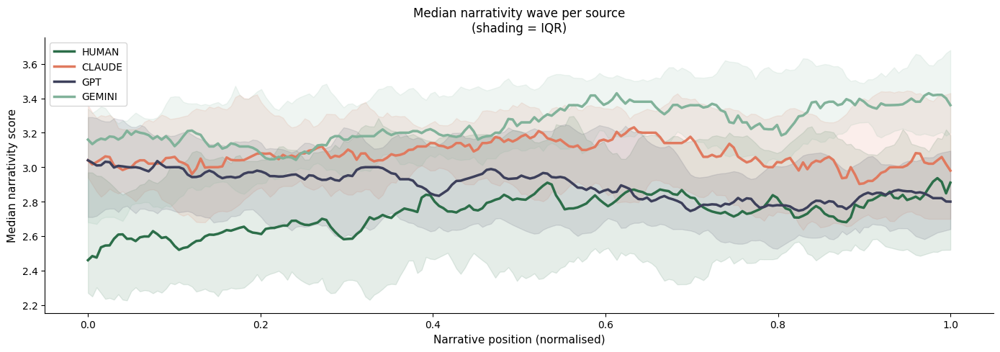

Saved: averaged_wave_ttcw1.png


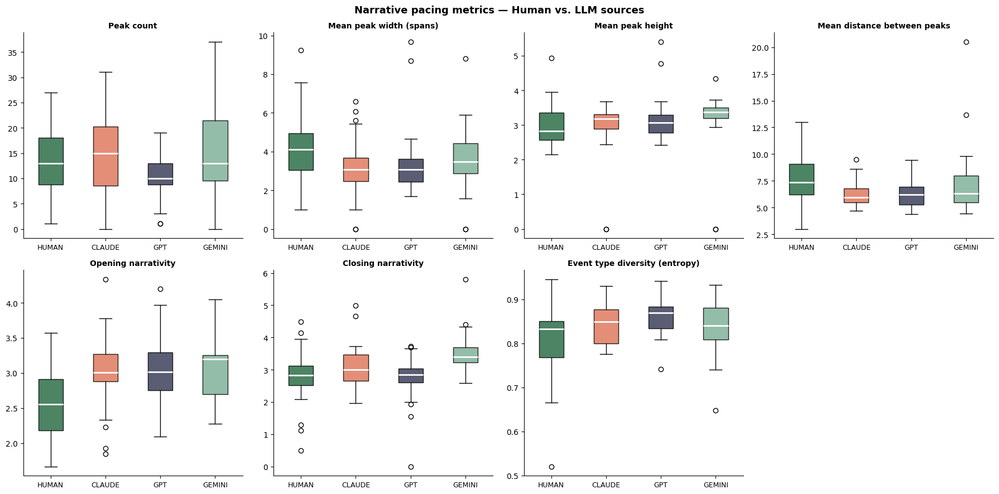

Saved: pacing_boxplots.png


In [62]:
smooth_window = 50


# 2. compute metrics
print("Step 2: Computing story-level metrics...")
df_story = compute_story_metrics(df, smooth_window=smooth_window)
print(df_story.groupby("source")[METRICS].median().round(3))
print("\nMean n_spans per source:")
print(df_story.groupby("source")["n_spans"].agg(['median', 'mean', 'sum', 'count']).round(1))

corr, p = spearmanr(df_story["n_spans"], df_story["peak_count"])
print(f"n_spans vs peak_count: rho={corr:.3f}, p={p:.4f}")
 
# 3. source-level aggregation 
print("\nStep 3: Source-level aggregation...")
df_source = compute_source_metrics(df_story)
print(df_source.to_string(index=False))

print("\nStep 4: Statistical tests...")
test_normality(df_story)
kruskal_results = test_kruskal(df_story)
test_scene_mannwhitney(df_story, kruskal_results)
gpt_comparison = test_gpt_version_comparison(df_story, paired=True)
gpt55_vs_human = test_gpt55_vs_human(df_story, gpt_comparison) 

# 5. Visualization
print("\nStep 5: Plots...")
plot_averaged_wave(df, smooth_window=smooth_window)
plot_pacing_boxplots(df_story)

<link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@tabler/icons-webfont@latest/tabler-icons.min.css">
<div id="ttcw2" style="font-family:sans-serif; display:flex; align-items:center; margin:0.5rem 0;">
  <div style="background:#eef2ff; border-radius:25px; padding:6px 20px; display:inline-flex; align-items:center;">
    <h2 style="font-size:20px; font-weight:600; color:#3730a3; margin:0;">TTCW 2 - Scene vs. Exposition</h2>
  </div>
</div>

<p class="prose">TTCW2 revolves around the way information is transmitted inside a story. Is an event in the story simply stated (<b>exposition</b>) or does the reader actively experience the event (<b>scene</b>)? <a href="https://15orient.com/files/genette-on-narrative-discourse.pdf" style="color:#534AB7;">Genette (1980)</a> uses a similar distinction between "mimesis" (showing) and "diegesis" (telling). He describes the concept of the scene as follows:</p>

<div class="rq">
  <p>"scene, most often in dialogue, which, as we have already observed, realizes conventionally the equality of time between narrative and story dialogue" <a href="https://15orient.com/files/genette-on-narrative-discourse.pdf" style="color:#534AB7;">(Genette, 1980, p. 94)</a></p>
</div>

<p class="prose"><a href="https://dataverse.nl/file.xhtml?fileId=19166&version=2.0" style="color:#534AB7;">Gius et al. (2019)</a> and <a href="https://aclanthology.org/2021.eacl-main.276.pdf" style="color:#534AB7;">Zehe et al. (2021)</a> build on this definition by describing four core aspects of scenes. A scene is a segment of the narrative where:</p>

<ul class="cat-items" style="border:1px solid #e5e5e5;border-radius:10px;padding:0 1.25rem;margin:0 0 1rem 0;">
  <li style="padding:14px 0;">
    <span class="ttcw-num">Time</span>
    <span>Time is told chronologically with a uniform pace (relates to the narrative events in TTCW1)</span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num">Space </span>
    <span>The story stays in the same place (or moves between spaces that correlate with each other, Concreteness ratio — named places and entities anchor the narrative spatially) </span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num">Action</span>
    <span>The story revolves around a particular action (how many elements are active events? = action ratio) </span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num">Characters</span>
    <span>the character configuration is stable  (Dialogue ratio — characters speaking to each other implies co-presence)</span>
  </li>
</ul>

<p class="prose"><a href="https://aclanthology.org/2021.eacl-main.276.pdf" style="color:#534AB7;">Zehe et al. (2021)</a> note that change in the event sequence (the actions) is the most important detector for scenes, followed by character constellation, time and finally space. Building on this, the following proxies will be used to calculate a scene score for each story:</p>

<p class="prose">1. <code>action_ratio</code>: proportion of event spans classified as <code>process_event</code> or <code>change_of_state</code> in TTCW1.</p>
<p class="prose"> 2. <code>dialogue_ratio</code>: proportion of text inside quotation marks.</p>
<p class="prose"> 3. <code>temporal_uniformity</code>: mean absolute difference between consecutive narrativity scores of spans extracted in TTCW1. This approximates consistent narrative pace. </p>
<p class="prose"> 4. <code>concreteness_ratio</code>: proportion of sentences containing proper nouns or concrete named entities.</p>
<br>

In [34]:
import re
import numpy as np
import pandas as pd
import spacy
import matplotlib.pyplot as plt

from scipy.stats import kruskal, mannwhitneyu, shapiro, wilcoxon, rankdata

nlp = spacy.load("nl_core_news_lg")
COLORS  = {"human": "#2C6E49", "claude": "#E07A5F", "gpt": "#3D405B", "gemini": "#81B29A"}
SOURCES = ["human", "claude", "gpt", "gemini"] 

In [35]:
SCENE_METRICS = [
    "action_ratio",
    "dialogue_ratio",
    "temporal_uniformity",
    "concreteness_ratio",
    "scene_score",
]

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Scene vs Exposition · Action ratio</p>

<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  1. Action ratio
</h3>

<p class="prose">
  <a href = "https://aclanthology.org/2021.eacl-main.276.pdf" style="color:#534AB7;">Zehe et al. (2021)</a> define action ratio as the strongest detector of scene boundaries.The <code>event_labels</code> produced by TTCW1 will be reused to capture the proportion of spans classified as active events: either <code>process_event</code> or <code>change_of_state</code>.  </p>
<br>

In [36]:
def action_ratio(event_labels: list[dict]) -> float:
    if not event_labels:
        return np.nan
    active = sum(
        1 for e in event_labels
        if e["label"] in {"process_event", "change_of_state"}
    )
    return round(active / len(event_labels), 4)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Scene vs Exposition · Dialogue ratio</p>

<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  2. Dialogue ratio
</h3>

<p class="prose">
The proportion of totall characters inside quoted spans: straight quotes ("...") and typographic quotes („..." and '...'). </p>

<div class="nb-info" style="margin:1rem 0;"> <p class = "prose"><b>Note</b>. Dialogue ratio measures how much dialogue there is, not whether characters are co-present (as <a href="https://dataverse.nl/file.xhtml?fileId=19166&version=2.0" style="color:#534AB7;">Gius et al. (2019)</a> and <a href="https://aclanthology.org/2021.eacl-main.276.pdf" style="color:#534AB7;">Zehe et al. (2021)</a> describe). A story could have long internal monologue in quotes that isn't dialogue at all. This is acknowledged as a boundary condition of the operationalization.</p>
</div>

In [37]:
QUOTE_PATTERNS = [
    r'"[^"]{2,}"',        # straight double quotes
    r'„[^"]{2,}"',        # lower-upper
    r'\u2018[^\u2019]{2,}\u2019',  # single curly quotes
    r'\u201c[^\u201d]{2,}\u201d',  # double curly quotes
]
 
QUOTE_RE = re.compile("|".join(QUOTE_PATTERNS), re.DOTALL)

In [38]:
def dialogue_ratio(text: str) -> float:
    if not text:
        return 0.0
    quoted_chars = sum(len(m.group()) for m in QUOTE_RE.finditer(text))
    return round(quoted_chars / len(text), 4)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Scene vs Exposition · Temporal uniformity</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  3. Temporal uniformity
</h3>

<p class="prose">A scene is a fragment of a story where someone does something or something is happening to someone (<a href="https://aclanthology.org/2021.eacl-main.276.pdf" style="color:#534AB7;">Zehe et al. (2021)</a>). TTCW1 uses classification labels with concrete scores (0, 3, 5, 7). <a href="https://aclanthology.org/2021.eacl-main.276.pdf" style="color:#534AB7;">Zehe et al. (2021)</a> states that if the pace in a story (fragment) is stable and high (either <code>process_event</code> or <code>change_of_state</code>), the more likely it is that a scene is happening. To calculate to scene ratio (with temporal uniformity, the <b>mean absolute difference between consecutive narrativity scores from TTCW1</b> will be calculated.</p>

<ul class="cat-items" style="border:1px solid #e5e5e5;border-radius:10px;padding:0 1.25rem;margin:0 0 1rem 0;">
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#2C6E49;min-width:140px;">High & uniform</span>
    <span>Span has a high narrativity score (≥ 5, i.e. <code>process_event</code> or <code>change_of_state</code>) and stays consistent with neighbouring spans → active, uniform pace → <b>scene-like</b></span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#993C1D;min-width:140px;">Low or varied</span>
    <span>Span has a low narrativity score (< 5) or jumps sharply between categories → inactive or unstable pace → <b>exposition-like</b></span>
  </li>
</ul>

In [39]:
def temporal_uniformity(event_labels: list[dict],
                        activity_threshold: float = 5.0) -> float:
    if len(event_labels) < 2:
        return np.nan

    scores = np.array([e["narrativity"] for e in event_labels], dtype=float)
    diffs  = np.abs(np.diff(scores))

    padded     = np.concatenate([[diffs[0]], diffs])
    right      = np.concatenate([diffs, [diffs[-1]]])
    local_diff = (padded + right) / 2

    scene_spans = sum(
        1 for i, score in enumerate(scores)
        if score >= 5.0 and local_diff[i] <= 5.0
    )

    return round(scene_spans / len(scores), 4)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Scene vs Exposition · Concreteness ratio</p>

<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  4. Concreteness ratio
</h3>

<p class="prose">
This proxy uses spaCy's named entity recognition and part-of-speech tags to compute, per sentence, whether it is anchored in concrete named entities (persons, places, objects, times) or dominated by abstract nouns and general claims.

A sentence will be counted as 'concrete' if it contains at least one named entity (<code>PERSON</code>, <code>LOC</code>, <code>GPE</code>, <code>ORG</code>, <code>PRODUCT</code>, <code>EVENT</code>) or a proper noun (<code>PROPN</code>). The ratio is the proportion of concrete sentences out of all sentences.</p>
<br>

<div class="nb-info" style="margin:1rem 0;"> <p class = "prose"> <b>Note.</b> <code>PROPN</code> in Dutch NLP can be noisy, titles and abstract proper nouns may trigger it. A safety measure is implemented in the code that triggers if a <code>PROPN</code> is mentioned more than two times in a sentence. </p>
</div>
<br>

In [40]:
CONCRETE_ENT_TYPES = {"PERSON", "LOC", "GPE", "ORG", "PRODUCT", "EVENT",}

In [41]:
def concreteness_ratio(text: str) -> float:
    doc   = nlp(text)
    sents = list(doc.sents)
    if not sents:
        return np.nan
    concrete = 0
    for sent in sents:
        ent_types  = {ent.label_ for ent in sent.ents}
        has_entity = bool(ent_types & CONCRETE_ENT_TYPES)
        has_propn  = sum(1 for tok in sent if tok.pos_ == "PROPN") >= 2
        if has_entity or has_propn:
            concrete += 1
    return round(concrete / len(sents), 4)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Scene vs Exposition · Scene score</p>

<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
5. Composite 'scene-score' per story 
</h3>

In [42]:
def scene_score(
    action:   float,
    dialogue: float,
    temporal: float,
    concrete: float,
) -> float:
    values = {
        "action_ratio":        action,
        "dialogue_ratio":      dialogue,
        "temporal_uniformity": temporal,  # no longer inverted
        "concreteness_ratio":  concrete,
    }
    valid  = [v for v in values.values() if not np.isnan(v)]
    return round(np.mean(valid), 4) if valid else np.nan

In [43]:
def compute_scene_metrics(df: pd.DataFrame) -> pd.DataFrame:
    rows = []
    for _, row in df.iterrows():
        action   = action_ratio(row["event_labels"])
        dialogue = dialogue_ratio(row["clean_text"])
        concrete = concreteness_ratio(row["clean_text"])
        temporal = temporal_uniformity(row["event_labels"])
        score    = scene_score(action, dialogue, temporal, concrete)
 
        rows.append({
            "story_id":            row["story_id"],
            "source":              row["source"],
            "action_ratio":        action,
            "dialogue_ratio":      dialogue,
            "concreteness_ratio":  concrete,
            "temporal_uniformity": temporal,       
            "scene_score":         score,           # composite (higher = more scene-like)
        })
 
    return (
        pd.DataFrame(rows)
        .sort_values(["story_id", "source"])
        .reset_index(drop=True)
    )

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Scene vs exposition · Aggregate source comparison</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  6. Aggregating results per source 
</h3>

<p class="prose">
  To make a comparison between the four sources inside the dataset, each scene metric (action + dialogue + concreteness + temporal uniformity) will be put together inside one aggregrated result for each source. This is done by taking the <b>median</b><sup><a href="#fn1">*</a></sup> across all 36 stories in that source. This process is carried out by <code>compute_scene_source_metrics()</code> 
</p>
<hr>

<div id="fn1" style="font-size:12px; color:#666;">
  <sup>*</sup> The median is calculated instead of the mean since the data is not normally distributed (see section 7)
  <a href="#fn1-ref">↩</a>
</div>

In [44]:
def compute_scene_source_metrics(df_scene: pd.DataFrame) -> pd.DataFrame:
    return (
        df_scene
        .groupby("source")[SCENE_METRICS]
        .agg(["median", lambda x: x.quantile(0.75) - x.quantile(0.25)])
        .round(4)
        .reset_index()
    )

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Scene vs. Exposition · Statistical Analysis</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  7. Statistical testing
</h3>
<p class="prose">Three statistical tests will be run in sequence:</p>
<div class="grid-2" style="margin:1rem 0 1.5rem 0;">
  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#534AB7;">1. Shapiro–Wilk</strong>
      <span class="cat-badge" style="background:#EEEDFE;color:#3C3489;">Normality</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
      To test whether the results are normally distributed within each source, the Shapiro-Wilk test will be applied to each subset. Shapiro-Wilk tests work when the number of observations is > 3 and < 50. Here, the test runs per group, so it's testing normality on n=36 per source.
    </p>
  </div>
  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#534AB7;">2. Kruskal–Wallis</strong>
      <span class="cat-badge" style="background:#EEEDFE;color:#3C3489;">Group comparison</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
      The Shapiro–Wilk test indicated that normality assumptions were violated for most source–metric combinations. The Kruskal-Wallis test is chosen here since it is a <b>non-parametric test</b> of whether the <b>median</b> differences across sources exceed what would be expected by chance.
    </p>
  </div>
  <div class="cat-card" style="grid-column: 1 / -1;">
    <div class="cat-header">
      <strong style="color:#534AB7;">3. Mann–Whitney U</strong>
      <span class="cat-badge" style="background:#EEEDFE;color:#3C3489;">Pairwise · Bonferroni</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
      Only runs when the Kruskal-Wallis gives significant results. The Mann-Whitney U test is used to compare each LLM model to the human writers. This test is chosen since these are pairwise comparisons (human vs. each LLM individually). Bonferroni correction adjusts for the number of simultaneous comparisons (n metrics × 3 LLM sources) to reduce the risk of false positives. Alongside each p-value, <b>Cliff's delta</b> is reported as an effect size.
    </p>
  </div>
</div>

In [45]:
def test_normality_scene(df_scene: pd.DataFrame):
    print("Shapiro-Wilk normality tests — scene metrics")
    print(f"{'Metric':<25} {'Source':<10} {'W':>8} {'p':>10}  normal?")
    print("─" * 60)
    for metric in SCENE_METRICS:
        for source in SOURCES:
            vals = df_scene[df_scene["source"] == source][metric].dropna()
            if len(vals) < 3:
                continue
            stat, p = shapiro(vals)
            print(f"{metric:<25} {source:<10} {stat:>8.4f} {p:>10.4f}  "
                  f"{'yes' if p > 0.05 else 'NO'}")
        print()

In [46]:
def test_scene_kruskal(df_scene: pd.DataFrame) -> pd.DataFrame:
    rows = []
    print("Kruskal-Wallis — scene metrics across sources")
    print(f"{'Metric':<25} {'H':>8} {'p':>10}  {'high':<10} {'low':<10}  sig?")
    print("─" * 65)
    for metric in SCENE_METRICS:
        groups  = [
            df_scene[df_scene["source"] == s][metric].dropna().values
            for s in SOURCES
        ]
        stat, p = kruskal(*groups)
        sig     = p < 0.05
        medians = {s: df_scene[df_scene["source"] == s][metric].median() for s in SOURCES}
        highest = max(medians, key=medians.get)
        lowest  = min(medians, key=medians.get)
        print(f"{metric:<25} {stat:>8.4f} {p:>10.4f}  {highest:<10} {lowest:<10}  "
              f"{'*' if sig else ''}")
        rows.append({"metric": metric, "H": stat, "p": p, "significant": sig,
                     "highest": highest, "lowest": lowest})
    return pd.DataFrame(rows)

In [47]:
def cliffs_delta(a, b):
    a, b = np.asarray(a), np.asarray(b)
    greater = sum(x > y for x in a for y in b)
    less    = sum(x < y for x in a for y in b)
    return (greater - less) / (len(a) * len(b))

def interpret_effect(d):
    d = abs(d)
    if d < 0.147: return "negligible"
    if d < 0.33:  return "small"
    if d < 0.474: return "medium"
    return "large"

def test_scene_mannwhitney(df_scene: pd.DataFrame, kruskal_results: pd.DataFrame):
    significant_metrics = kruskal_results[kruskal_results["significant"]]["metric"].tolist()

    if not significant_metrics:
        print("No significant Kruskal-Wallis results — Mann-Whitney U not run.")
        return pd.DataFrame()

    llm_sources   = ["claude", "gpt", "gemini"]
    n_comparisons = len(llm_sources) * len(significant_metrics)

    print("\nMann-Whitney U — Human vs. each LLM (Bonferroni corrected)")
    print(f"(only metrics significant in Kruskal-Wallis: {', '.join(significant_metrics)})")
    print(f"{'Metric':<25} {'vs.':<10} {'U':>8} {'p_raw':>10} {'p_corr':>10}  "
          f"{'delta':>8} {'(size)':<12} {'direction':<22}  sig?")
    print("─" * 100)

    human_data = df_scene[df_scene["source"] == "human"]
    rows = []
    for metric in significant_metrics:
        for llm in llm_sources:
            h     = human_data[metric].dropna().values
            l     = df_scene[df_scene["source"] == llm][metric].dropna().values
            u, p  = mannwhitneyu(h, l, alternative="two-sided")
            delta = cliffs_delta(h, l)
            label = interpret_effect(delta)
            p_corr    = min(p * n_comparisons, 1.0)
            direction = f"human {'>' if np.median(h) > np.median(l) else '<'} {llm}"
            print(f"{metric:<25} {'vs ' + llm:<10} {u:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
                  f"{delta:>8.3f} ({label:<10}) {direction:<22}  {'*' if p_corr < 0.05 else ''}")
            rows.append({"metric": metric, "vs": llm, "U": u, "p": p, "p_corr": p_corr,
                         "cliffs_delta": delta, "effect_label": label,
                         "direction": direction, "significant": p_corr < 0.05})
        print()
    return pd.DataFrame(rows)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Scene vs. Exposition · GPT-4o vs. GPT-5.5</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  8. Direct model-version comparison
</h3>
<p class="prose">
  To find if there is a significant difference between GPT-4o and GPT-5.5 on scene metrics, a Wilcoxon signed-rank test will be run separately. It asks specifically whether <b>upgrading the model</b> changes how scene-like or exposition-like its stories are.
</p>
<div class="nb-info" style="margin:1rem 0;">
  <p class="prose" style="margin:0;">
    Each GPT-4o and GPT-5.5 story comes from the <b>same prompt</b> (matched by <code>story_id</code>), so a <b>paired Wilcoxon signed-rank test</b> is used instead of the unpaired Mann-Whitney U applied above. Pairing controls for prompt-to-prompt variance and gives more power at the same n=36. Bonferroni correction is applied across the 5 scene metrics within this test only, separate from the human-vs-LLM correction above. Alongside each p-value, the <b>matched rank-biserial correlation</b> is reported as an effect size, to show the magnitude of any shift, not just its significance.
  </p>
</div>
<p class="prose">
  Only when this test returns a significant result for a given metric, a follow-up comparison is run: GPT-5.5 vs. human on that metric only. This checks whether the model-version shift moved GPT-5.5 closer to or further from human-like scene/exposition balance.
</p>

In [48]:
def matched_rank_biserial(a, b):
    """Effect size for paired Wilcoxon. Range -1 to 1."""
    diffs = np.array(a) - np.array(b)
    diffs = diffs[diffs != 0]
    ranks = rankdata(np.abs(diffs))
    pos_sum = ranks[diffs > 0].sum()
    neg_sum = ranks[diffs < 0].sum()
    return (pos_sum - neg_sum) / (pos_sum + neg_sum)

def test_scene_gpt_version_comparison(df_scene: pd.DataFrame, paired: bool = True) -> pd.DataFrame:
    gpt4o = df_scene[df_scene["source"] == "gpt"].set_index("story_id")
    gpt55 = df_scene[df_scene["source"] == "gpt_5.5"].set_index("story_id")

    test_name = "paired Wilcoxon signed-rank" if paired else "unpaired Mann-Whitney U"
    n_comparisons = len(SCENE_METRICS)

    print("\nGPT-4o vs. GPT-5.5 — direct model comparison (scene metrics)")
    print(f"({test_name}, Bonferroni corrected across {n_comparisons} metrics)")
    print(f"{'Metric':<25} {'stat':>8} {'p_raw':>10} {'p_corr':>10}  "
          f"{'effect':>8} {'(size)':<12} {'direction':<20}  sig?")
    print("─" * 100)

    rows = []
    for metric in SCENE_METRICS:
        if paired:
            common_ids = gpt4o.index.intersection(gpt55.index)
            a = gpt4o.loc[common_ids, metric].dropna()
            b = gpt55.loc[common_ids, metric].dropna()
            common_ids = a.index.intersection(b.index)
            a, b = a.loc[common_ids], b.loc[common_ids]
            if len(a) < 1:
                continue
            stat, p = wilcoxon(a.values, b.values)
            effect = matched_rank_biserial(a.values, b.values)
        else:
            a = gpt4o[metric].dropna()
            b = gpt55[metric].dropna()
            if len(a) < 1 or len(b) < 1:
                continue
            stat, p = mannwhitneyu(a.values, b.values, alternative="two-sided")
            effect = cliffs_delta(a.values, b.values)

        p_corr       = min(p * n_comparisons, 1.0)
        direction    = f"gpt {'>' if a.median() > b.median() else '<'} gpt_5.5"
        sig          = p_corr < 0.05
        effect_label = interpret_effect(effect)

        print(f"{metric:<25} {stat:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
              f"{effect:>8.3f} ({effect_label:<10}) {direction:<20}  {'*' if sig else ''}")
        rows.append({"metric": metric, "stat": stat, "p": p, "p_corr": p_corr,
                     "significant": sig, "direction": direction,
                     "effect_size": effect, "effect_label": effect_label})

    return pd.DataFrame(rows)

In [49]:
def test_scene_gpt55_vs_human(df_scene: pd.DataFrame, gpt_comparison: pd.DataFrame) -> pd.DataFrame:
    significant_metrics = gpt_comparison[gpt_comparison["significant"]]["metric"].tolist()

    if not significant_metrics:
        print("No significant GPT-4o vs. GPT-5.5 differences — GPT-5.5 vs. human not run.")
        return pd.DataFrame()

    human = df_scene[df_scene["source"] == "human"]
    gpt55 = df_scene[df_scene["source"] == "gpt_5.5"]
    n_comparisons = len(significant_metrics)

    print(f"\nGPT-5.5 vs. Human — scene metrics "
          f"(only metrics where GPT-4o→GPT-5.5 shifted: {', '.join(significant_metrics)})")
    print(f"{'Metric':<25} {'U':>8} {'p_raw':>10} {'p_corr':>10}  "
          f"{'delta':>8} {'(size)':<12} {'direction':<20}  sig?")
    print("─" * 100)

    rows = []
    for metric in significant_metrics:
        h = human[metric].dropna().values
        g = gpt55[metric].dropna().values
        u, p   = mannwhitneyu(h, g, alternative="two-sided")
        delta  = cliffs_delta(h, g)
        label  = interpret_effect(delta)
        p_corr = min(p * n_comparisons, 1.0)
        sig    = p_corr < 0.05
        direction = f"human {'>' if np.median(h) > np.median(g) else '<'} gpt_5.5"

        print(f"{metric:<25} {u:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
              f"{delta:>8.3f} ({label:<10}) {direction:<20}  {'*' if sig else ''}")
        rows.append({"metric": metric, "U": u, "p": p, "p_corr": p_corr,
                     "cliffs_delta": delta, "effect_label": label,
                     "direction": direction, "significant": sig})

    return pd.DataFrame(rows)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Scene vs exposition · Visualization</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  Visualization
</h3>
<p class="prose">To give a clear overview of the data, 2 plots will be generated:</p>

<ul class="cat-items" style="border:1px solid #e5e5e5;border-radius:10px;padding:0 1.25rem;margin:0;">
  <li style="padding:14px 0;">
    <code>plot_scene_overview()</code>
    <span>This function gives one bar per source, showing the median composit scene score. Reference line at 0.5 as scene/exposition boundary with IQR error bars.</span>
  </li>
  <li style="padding:14px 0;">
    <code>plot_scene_boxplots()</code>
    <span>This function gives boxplots per metric grouped by source for direct visual comparison of distributions across human and LLM writers.</span>
  </li>
</ul>
<br>

In [50]:
def plot_scene_overview(df_scene: pd.DataFrame):
    fig, ax = plt.subplots(figsize=(8, 5))

    medians = []
    q1s     = []
    q3s     = []

    for s in SOURCES:
        vals = df_scene[df_scene["source"] == s]["scene_score"].dropna()
        medians.append(vals.median())
        q1s.append(vals.quantile(0.25))
        q3s.append(vals.quantile(0.75))

    medians   = np.array(medians)
    lower_err = medians - np.array(q1s)
    upper_err = np.array(q3s) - medians
    colors    = [COLORS[s] for s in SOURCES]

    bars = ax.bar(range(len(SOURCES)), medians, color=colors, alpha=0.85,
                  edgecolor="white", linewidth=1.5, width=0.5)

    # IQR error bars
    ax.errorbar(range(len(SOURCES)), medians,
                yerr=[lower_err, upper_err],
                fmt="none", color="#555", capsize=6,
                linewidth=1.5, capthick=1.5)

    # reference line at 0.5
    ax.axhline(0.5, color="#aaa", linewidth=1.2, linestyle="--")
    ax.text(len(SOURCES) - 0.5, 0.51, "scene / exposition boundary",
            fontsize=9, color="#aaa", va="bottom", ha="right")

    # annotate median + IQR
    for i, (median, q1, q3, color) in enumerate(zip(medians, q1s, q3s, colors)):
        ax.text(i, q3 + 0.03,
                f"Mdn={median:.2f}\nIQR={q3-q1:.2f}",
                ha="center", va="bottom",
                fontsize=8, fontweight="bold",
                color=color)

    ax.set_xticks(range(len(SOURCES)))
    ax.set_xticklabels([s.upper() for s in SOURCES],
                       fontsize=10, fontweight="bold")
    for tick, color in zip(ax.get_xticklabels(), colors):
        tick.set_color(color)

    ax.set_ylim(0, 1)
    ax.set_ylabel("Median composite scene score", fontsize=10)
    ax.set_title("Scene vs. Exposition — median score per source\n"
                 "(error bars = IQR, above 0.5 = scene-dominant)",
                 fontsize=11, fontweight="bold")
    ax.spines[["top", "right"]].set_visible(False)

    plt.tight_layout()
    plt.savefig("scene_overview.png", dpi=150, bbox_inches="tight")
    plt.show()
    print("Saved: scene_overview.png")

In [51]:
def plot_scene_boxplots(df_scene: pd.DataFrame):
    metric_labels = {
        "action_ratio":        "Action ratio",
        "dialogue_ratio":      "Dialogue ratio",
        "temporal_uniformity": "Temporal uniformity\n(higher = more scene-like)",
        "concreteness_ratio":  "Concreteness ratio",
        "scene_score":         "Composite scene score",
    }

    fig, axes = plt.subplots(1, 5, figsize=(20, 5))

    for ax, (col, label) in zip(axes, metric_labels.items()):
        data   = [df_scene[df_scene["source"] == s][col].dropna().values for s in SOURCES]
        colors = [COLORS[s] for s in SOURCES]
        bp     = ax.boxplot(data, patch_artist=True,
                            medianprops={"color": "white", "linewidth": 2})

        for patch, color in zip(bp["boxes"], colors):
            patch.set_facecolor(color)
            patch.set_alpha(0.85)

        ax.set_xticks(range(1, len(SOURCES) + 1))
        ax.set_xticklabels([s.upper() for s in SOURCES],
                           fontsize=9, fontweight="bold")

        for tick, color in zip(ax.get_xticklabels(), colors):
            tick.set_color(color)

        ax.set_title(label, fontsize=10, fontweight="bold")
        ax.set_ylim(0, 1)
        ax.spines[["top", "right"]].set_visible(False)

    plt.suptitle("TTCW2 — Scene metrics: Human vs. LLM",
                 fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.savefig("scene_boxplots.png", dpi=150, bbox_inches="tight")
    plt.show()
    print("Saved: scene_boxplots.png")

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Scene vs exposition · Run the code</p>

<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  Run everything
</h3>

In [52]:
# 1. Compute all scene metrics across the dataset 
print("Step 1: Computing scene metrics...")
df_scene = compute_scene_metrics(df)
print(df_scene.groupby("source")[SCENE_METRICS].median().round(3))

Step 1: Computing scene metrics...
         action_ratio  dialogue_ratio  temporal_uniformity  \
source                                                       
claude          0.429           0.181                0.414   
gemini          0.474           0.051                0.470   
gpt             0.386           0.105                0.386   
gpt_5.5         0.392           0.101                0.385   
human           0.375           0.109                0.375   

         concreteness_ratio  scene_score  
source                                    
claude                0.175        0.295  
gemini                0.158        0.313  
gpt                   0.277        0.300  
gpt_5.5               0.136        0.275  
human                 0.134        0.279  



Step 2: Source-level aggregation...
 source action_ratio            dialogue_ratio            temporal_uniformity            concreteness_ratio            scene_score           
              median <lambda_0>         median <lambda_0>              median <lambda_0>             median <lambda_0>      median <lambda_0>
 claude       0.4286     0.0957         0.1812     0.1881              0.4136     0.0985             0.1752     0.1348      0.2947     0.0694
 gemini       0.4737     0.0834         0.0506     0.1587              0.4700     0.0791             0.1585     0.1806      0.3128     0.0951
    gpt       0.3857     0.1065         0.1049     0.0957              0.3857     0.1112             0.2774     0.1998      0.3004     0.0729
gpt_5.5       0.3925     0.1145         0.1014     0.1634              0.3850     0.1079             0.1356     0.1109      0.2755     0.0774
  human       0.3750     0.1219         0.1092     0.2039              0.3750     0.1353             0.1339    

/opt/anaconda3/envs/metaphor_env/lib/python3.11/site-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  res = hypotest_fun_out(*samples, **kwds)
/opt/anaconda3/envs/metaphor_env/lib/python3.11/site-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  res = hypotest_fun_out(*samples, **kwds)


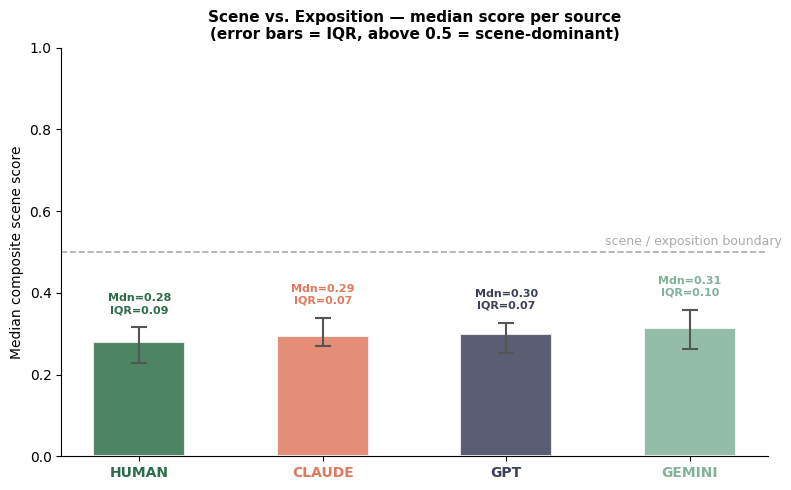

Saved: scene_overview.png


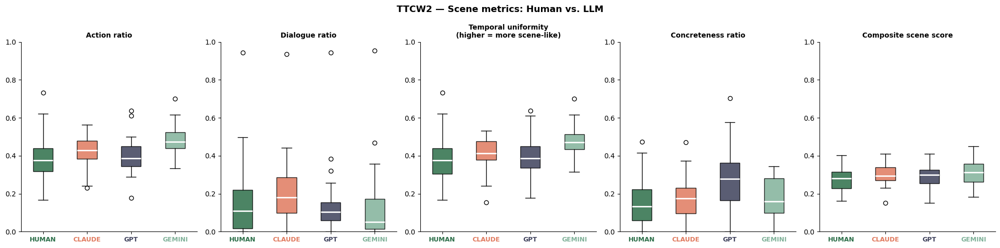

Saved: scene_boxplots.png


In [53]:
# 2. source-level aggregation 
print("\nStep 2: Source-level aggregation...")
df_source = compute_scene_source_metrics(df_scene)
print(df_source.to_string(index=False))

# 3. statistical tests 
print("\nStep 3: Statistical tests...")
test_normality_scene(df_scene)
kruskal_results   = test_scene_kruskal(df_scene)
mw_results        = test_scene_mannwhitney(df_scene, kruskal_results)
gpt_comparison     = test_scene_gpt_version_comparison(df_scene, paired=True)
gpt55_vs_human     = test_scene_gpt55_vs_human(df_scene, gpt_comparison)

# 4. Visualization
print("\nStep 4: Plots...")
plot_scene_overview(df_scene)
plot_scene_boxplots(df_scene)

<link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@tabler/icons-webfont@latest/tabler-icons.min.css">
<div id="ttcw3" style="font-family:sans-serif; display:flex; align-items:center; margin:0.5rem 0;">
  <div style="background:#eef2ff; border-radius:25px; padding:6px 20px; display:inline-flex; align-items:center;">
    <h2 style="font-size:20px; font-weight:600; color:#3730a3; margin:0;">TTCW 3 - Literary Devices</h2>
  </div>
</div>

<p class="prose"> In <a href = "https://arxiv.org/pdf/2309.14556" style="color:#534AB7;"> Chakrabarty et al. (2024)</a>, one of the experts explicitly points out that a creative text covers a 'surprising, skilled, and complex use of <b>metaphor/simile/allusion</b>' (<a href = "https://arxiv.org/pdf/2309.14556" style="color:#534AB7;"> Chakrabarty et al. (2024), p.6</a>). TTCW3 covers the use of literary devices in a text.  </p>

<p class="prose"> <b>Metaphors</b> are text fragments that compare objectively unrelated things to make a concept or idea more clear. In NLP-research metaphors are computationally detected using (manual) corpus annotation procedures such as MIPVU (<a href = "https://research.vu.nl/en/publications/a-method-for-linguistic-metaphor-identification-from-mip-to-mipvu/"; style="color:#534AB7;"> Steen et al., 2010 </a>), which has been applied to Dutch fiction (<a href = "https://research.vu.nl/en/publications/recognition-of-personifications-in-fiction-by-non-expert-readers/"; style="color:#534AB7;">Dorst, 2011</a>; <a href = "https://research.vu.nl/ws/portalfiles/portal/42200827/complete%20dissertation.pdf"; style="color:#534AB7;">Pasma, 2011</a>), and more recently through machine learning classifiers trained on such annotated corpora (<a href = "https://aclanthology.org/2021.nlp4if-1.2/"; style="color:#534AB7;">Lemmens et al., 2021</a>). <a href = "https://aclanthology.org/2022.mwe-1.11.pdf"; style="color:#534AB7;"> Schneider et al. (2022)</a> describes how metaphors can be detected by calculating the cosine distance between word embeddings in adjective-noun pairs. They state: </p> 

<div class="rq">'Words which occur often next to each other have a low distance by the nature of the word embeddings<sup><a href="#fn1">3</a></sup>. At the same time, unusual combinations like metaphors should have a higher distance.' (<a href = "https://aclanthology.org/2022.mwe-1.11.pdf"; style="color:#534AB7;">Schneider et al., 2022, p. 2)</a></div>

<p class="prose">In their study, this assumption is supported: the approach achieves an average precision of 0.70–0.77. Since their method relies only on POS tags and word embeddings in adjective-noun parts, the same approach can be applied using the word vectors provided by spaCy's <code>nl_core_news_lg</code> pipeline. An extension to this would be to implement verb-subject and verb-object pairs to capture verb-based metaphors, which are a common construction in Dutch fiction (<a href = "https://research.vu.nl/en/publications/a-method-for-linguistic-metaphor-identification-from-mip-to-mipvu/"; style="color:#534AB7;"> Steen et al., 2010 </a>; <a href = "https://research.vu.nl/ws/portalfiles/portal/42200827/complete%20dissertation.pdf"; style="color:#534AB7;">Pasma, 2011</a>)).</p>

<p class="prose"> A more restricted but highly reliable proxy is that of <b>similes </b>. Similes are literary devices that use an explicit comparative marker (e.g. <i>als</i>, <i>zoals</i>, <i>net als</i>, <i>alsof</i>). These are computationally detectable through rule-based detection of comparative markers between noun phrases, as done in <a href="https://aclanthology.org/D14-1215.pdf" style="color:#534AB7;">Niculae &amp; Danescu-Niculescu-Mizil, 2014</a>; <a href="https://joss.theoj.org/papers/10.21105/joss.07596.pdf" style="color:#534AB7;">Schneider &amp; Denzler, 2026</a>.</p>

<p class="prose"> The third notion of <a href = "https://arxiv.org/pdf/2309.14556" style="color:#534AB7;"> Chakrabarty et al. (2024)</a> on literary devices is <b>allusion</b>. Allusion is a referential device that relies heavily on cultural knowledge for both writer and reader. This is hard operationalize computationally without making very strong (subjective) assumptions. To keep a clean proxy, devices such as allusion, irony, and personification fall outside the scope of the current computational operationalization. </p>

Two metrics will be implemented for literary devices: 

 <ul class="cat-items" style="border:1px solid #e5e5e5;border-radius:10px;padding:0 1.25rem;margin:0 0 1rem 0;">
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#534AB7;min-width:120px;">Metaphors</span>
    <span>Cosine distance between word embeddings in adjective-noun and verb-argument pairs.</span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#534AB7;min-width:120px;">Similes</span>
    <span>Rule-based detection of explicit comparative markers per sentence.</span>
  </li>
</ul>   


<div id="fn1" style="font-size:12px; color:#666;">
  <sup>3</sup> This assumption is somewhat moderated in the paper: with low-resource data, not all word pairs with low embedding distance are conventional: a rare but 'normal' combination (e.g. <i>hij skeelerde</i>) may also have low distance simply due to infrequent co-occurrence. 
  <a href="#fn1-ref">↩</a>
</div>

In [112]:
import re
import numpy as np
from numpy.linalg import norm
import pandas as pd
import spacy
import matplotlib.pyplot as plt

from itertools import combinations
from scipy.stats import kruskal, mannwhitneyu, shapiro, gaussian_kde, wilcoxon, rankdata

nlp = spacy.load("nl_core_news_lg")

LITERARY_METRICS = ["metaphor_score", "simile_density"]
SOURCES = ["human", "claude", "gpt", "gemini"] 
COLORS  = {"human": "#2C6E49", "claude": "#E07A5F", "gpt": "#3D405B", "gemini": "#81B29A"}

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Literary devices · Cosine function</p>

<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  Shared function to extract cosine differences 
</h3>


In [113]:
def cosine_distance(vec1: np.ndarray, vec2: np.ndarray) -> float:
    if norm(vec1) == 0 or norm(vec2) == 0:
        return 0.0
    similarity = np.dot(vec1, vec2) / (norm(vec1) * norm(vec2))
    return 1 - float(np.clip(similarity, -1.0, 1.0))

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Literary devices · Metaphor score</p>

<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  1. Metaphor detection 
</h3>

<p class="prose">The metaphor detection is inspired by <a href="https://aclanthology.org/2022.mwe-1.11.pdf" style="color:#534AB7;">Schneider et al. (2022)</a> and extended to cover three pair types in Dutch fiction. For each pair, the cosine distance between the two word vectors is computed using <code>nl_core_news_lg</code>. Both tokens must have a vector in the model for a pair to be included:</p>

<ul class="cat-items" style="border:1px solid #e5e5e5;border-radius:10px;padding:0 1.25rem;margin:0 0 1rem 0;">
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#534AB7;min-width:140px;">Adjective–noun</span>
    <span>An adjective modifying a noun via the <code>amod</code> dependency relation (following Schneider et al., 2022). Example: <i>donkere gedachten</i>.</span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#534AB7;min-width:140px;">Verb–subject</span>
    <span>A verb and its subject via the <code>nsubj</code> dependency relation. Captures metaphors where the subject performs an action it cannot literally perform. Example: <i>de stilte schreeuwde</i>.</span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#534AB7;min-width:140px;">Verb–object</span>
    <span>A verb and its object via the <code>obj</code> dependency relation. Captures metaphors where a verb acts on an object in a non-literal way. Example: <i>het verdriet at haar op</i>.</span>
  </li>
</ul>

<p class="prose">The mean cosine distance across all pairs in a story is taken as the raw metaphor score. A higher score indicates more semantically unexpected combinations (potentially metaphorical language)</p>
<p class="prose">Following <a href="https://aclanthology.org/2022.mwe-1.11.pdf" style="color:#534AB7;">Schneider et al. (2022)</a>: high cosine distance between the adjective and noun vectors indicates a metaphorical pair, as words that commonly co-occur have low distance by the nature of word embeddings, while unusual combinations have higher distance.</p>


<div class="nb-info" style="margin:1rem 0;"> <p class = "prose"> <b>Note</b>. The metaphor score measures <b>semantic surprise</b> as a proxy for the use of literary devices in a text, not metaphors directly. High cosine distance between adjective-noun or verb-argument pairs indicates unusual combinations that correlate with metaphorical language.
 <br>
</p>
</div>


In [114]:
def extract_metaphor_pairs(text: str) -> list[dict]:
    doc   = nlp(text)
    pairs = []

    for token in doc:
        # type 1: adjective-noun (amod)
        if token.pos_ == "ADJ" and token.dep_ == "amod":
            noun = token.head
            if noun.pos_ == "NOUN" and token.has_vector and noun.has_vector:
                pairs.append({
                    "type":      "adj-noun",
                    "word1":     token.text,
                    "word2":     noun.text,
                    "vec1":      token.vector,
                    "vec2":      noun.vector,
                    "sentence":  token.sent.text,
                })

        # type 2: verb-subject (nsubj)
        if token.dep_ == "nsubj" and token.has_vector:
            verb = token.head
            if verb.pos_ in {"VERB", "AUX"} and verb.has_vector:
                pairs.append({
                    "type":      "verb-subj",
                    "word1":     verb.text,
                    "word2":     token.text,
                    "vec1":      verb.vector,
                    "vec2":      token.vector,
                    "sentence":  token.sent.text,
                })

        # type 3: verb-object (obj)
        if token.dep_ == "obj" and token.has_vector:
            verb = token.head
            if verb.pos_ in {"VERB", "AUX"} and verb.has_vector:
                pairs.append({
                    "type":      "verb-obj",
                    "word1":     verb.text,
                    "word2":     token.text,
                    "vec1":      verb.vector,
                    "vec2":      token.vector,
                    "sentence":  token.sent.text,
                })

    return pairs

In [115]:
def metaphor_score(text: str) -> float:
    pairs = extract_metaphor_pairs(text)
    if not pairs:
        return np.nan
    distances = [cosine_distance(p["vec1"], p["vec2"]) for p in pairs]
    return round(float(np.mean(distances)), 4)

In [116]:
def compute_max_distance(df: pd.DataFrame, percentile: float = 95) -> float:
    all_distances = []
    for _, row in df.iterrows():
        pairs = extract_metaphor_pairs(row["clean_text"])
        for p in pairs:
            all_distances.append(cosine_distance(p["vec1"], p["vec2"]))
    if not all_distances:
        return 1.0
    return float(np.percentile(all_distances, percentile))

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Literary devices · Similes</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  2. Similes
</h3>

<p class="prose">Similes are detected by matching sentences containing a comparative marker where the marker connects two noun phrases or a verb phrase to a noun phrase. Two types of markers are distinguished:</p>

<ul class="cat-items" style="border:1px solid #e5e5e5;border-radius:10px;padding:0 1.25rem;margin:0 0 1rem 0;">
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#534AB7;min-width:160px;">Unambiguous</span>
    <span>Markers that are always comparative: <i>zoals</i>, <i>net als</i>, <i>alsof</i>, <i>gelijk aan</i>. These are counted directly.</span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#534AB7;min-width:160px;">Ambiguous</span>
    <span><i>Als</i> is only counted when followed by a noun phrase (comparative use) (<i>hij liep als een beer</i>), not when used as a temporal conjunction followed by a finite verb (<i>als hij komt</i>).</span>
  </li>
</ul>

<p class="prose">The distinction is made using spaCy's part-of-speech tags: if the first non-punctuation token to the right of <i>als</i> is a noun, proper noun, adjective, or adverb, it is counted as a simile. If it is a verb or auxiliary, it is classified as temporal and excluded.</p>

In [117]:
SIMILE_MARKERS = re.compile(
    r'\b(zoals|net als|alsof|gelijk aan)\b',
    re.IGNORECASE
)

In [118]:
def _is_comparative_als(token) -> bool:
    if token.lemma_.lower() != "als":
        return False
    for right in token.rights:
        if right.pos_ in {"NOUN", "PROPN", "ADJ", "ADV"}:
            return True
        if right.pos_ in {"VERB", "AUX"}:
            return False
    return False

In [119]:
def count_similes(text: str) -> tuple[int, int]:
    doc       = nlp(text)
    sents     = list(doc.sents)
    n_similes = 0
    for sent in sents:
        n_similes += len(SIMILE_MARKERS.findall(sent.text))
        for token in sent:
            if _is_comparative_als(token):
                n_similes += 1
    return n_similes, len(sents)

In [120]:
def simile_density(text: str) -> float:
    if not text.strip():
        return np.nan
    n_sim, n_sent = count_similes(text)
    if n_sent == 0:
        return np.nan
    return round(n_sim / n_sent, 4) #normalised by story length (sentences) to allow comparison across stories of different lengths.

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Literary devices · Aggregate source comparison</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  3. Aggregating results per source 
</h3>

<p class="prose">
  To make a comparison between the four sources inside the dataset, each pacing metric (metaphor + similes) will be calculated per source.  This is done by taking the <b>median</b><sup><a href="#fn1">*</a></sup> across all stories and using that for a typical event-distribution-profile per source. This process is carried out by <code>compute_source_metrics()</code> 
</p>
<hr>

<div id="fn1" style="font-size:12px; color:#666;">
  <sup>*</sup> The median is calculated instead of the mean since the data is not normally distributed (see section 4)
  <a href="#fn1-ref">↩</a>
</div>


In [121]:
def compute_literary_metrics(df: pd.DataFrame) -> pd.DataFrame:
    rows = []
    for _, row in df.iterrows():
        rows.append({
            "story_id":       row["story_id"],
            "source":         row["source"],
            "metaphor_score": metaphor_score(row["clean_text"]),
            "simile_density": simile_density(row["clean_text"]),
        })
    return (
        pd.DataFrame(rows)
        .sort_values(["story_id", "source"])
        .reset_index(drop=True)
    )

In [122]:
def compute_literary_source_metrics(df_lit: pd.DataFrame) -> pd.DataFrame:
    return (
        df_lit
        .groupby("source")[LITERARY_METRICS]
        .agg(["median", lambda x: x.quantile(0.75) - x.quantile(0.25)])
        .round(4)
        .reset_index()
    )

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Literary Devices · Statistical Analysis</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  4. Statistical testing
</h3>
<p class="prose">Three statistical tests will be run in sequence:</p>
<div class="grid-2" style="margin:1rem 0 1.5rem 0;">
  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#534AB7;">1. Shapiro–Wilk</strong>
      <span class="cat-badge" style="background:#EEEDFE;color:#3C3489;">Normality</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
      To test whether the results are normally distributed within each source, the Shapiro-Wilk test will be applied to each subset. Shapiro-Wilk tests work when the number of observations is > 3 and < 50. Here, the test runs per group, so it's testing normality on n=36 per source.
    </p>
  </div>
  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#534AB7;">2. Kruskal–Wallis</strong>
      <span class="cat-badge" style="background:#EEEDFE;color:#3C3489;">Group comparison</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
      The Shapiro–Wilk test indicated that normality assumptions were violated for most source–metric combinations. The Kruskal-Wallis test is chosen here since it is a <b>non-parametric test</b> of whether the <b>median</b> differences across sources exceed what would be expected by chance.
    </p>
  </div>
  <div class="cat-card" style="grid-column: 1 / -1;">
    <div class="cat-header">
      <strong style="color:#534AB7;">3. Mann–Whitney U</strong>
      <span class="cat-badge" style="background:#EEEDFE;color:#3C3489;">Pairwise · Bonferroni</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
      Only runs when the Kruskal-Wallis gives significant results. The Mann-Whitney U test is used to compare each LLM model to the human writers. This test is chosen since these are pairwise comparisons (human vs. each LLM individually). Bonferroni correction adjusts for the number of simultaneous comparisons (n metrics × 3 LLM sources) to reduce the risk of false positives. Alongside each p-value, <b>Cliff's delta</b> is reported as an effect size. 
    </p>
  </div>
</div>

In [123]:
def test_normality_literary(df_lit: pd.DataFrame):
    print("Shapiro-Wilk normality tests — literary metrics")
    print(f"{'Metric':<20} {'Source':<10} {'W':>8} {'p':>10}  normal?")
    print("─" * 55)
    for metric in LITERARY_METRICS:
        for source in SOURCES:
            vals = df_lit[df_lit["source"] == source][metric].dropna()
            if len(vals) < 3:
                continue
            stat, p = shapiro(vals)
            print(f"{metric:<20} {source:<10} {stat:>8.4f} {p:>10.4f}  "
                  f"{'yes' if p > 0.05 else 'NO'}")
        print()

In [124]:
def test_literary_kruskal(df_lit: pd.DataFrame) -> pd.DataFrame:
    rows = []
    print("Kruskal-Wallis — literary metrics across sources")
    print(f"{'Metric':<20} {'H':>8} {'p':>10}  {'high':<10} {'low':<10}  sig?")
    print("─" * 60)
    for metric in LITERARY_METRICS:
        groups  = [df_lit[df_lit["source"] == s][metric].dropna().values
                   for s in SOURCES]
        stat, p = kruskal(*groups)
        sig     = p < 0.05
        medians = {s: df_lit[df_lit["source"] == s][metric].median()
                   for s in SOURCES}
        highest = max(medians, key=medians.get)
        lowest  = min(medians, key=medians.get)
        print(f"{metric:<20} {stat:>8.4f} {p:>10.4f}  {highest:<10} {lowest:<10}  "
              f"{'*' if sig else ''}")
        rows.append({"metric": metric, "H": stat, "p": p,
                     "significant": sig, "highest": highest, "lowest": lowest})
    return pd.DataFrame(rows)

In [125]:
def cliffs_delta(a, b):
    a, b = np.asarray(a), np.asarray(b)
    greater = sum(x > y for x in a for y in b)
    less    = sum(x < y for x in a for y in b)
    return (greater - less) / (len(a) * len(b))

def interpret_effect(d):
    d = abs(d)
    if d < 0.147: return "negligible"
    if d < 0.33:  return "small"
    if d < 0.474: return "medium"
    return "large"

def test_literary_mannwhitney(df_lit: pd.DataFrame,
                               kruskal_results: pd.DataFrame) -> pd.DataFrame:
    significant_metrics = kruskal_results[
        kruskal_results["significant"]]["metric"].tolist()

    if not significant_metrics:
        print("No significant Kruskal-Wallis results.")
        return pd.DataFrame()

    llm_sources   = ["claude", "gpt", "gemini"]
    n_comparisons = len(llm_sources) * len(significant_metrics)
    rows = []

    for metric in significant_metrics:
        print(f"\n{'═'*90}")
        print(f"  {metric.upper()}")
        print(f"{'═'*90}")
        print(f"\n  {'Comparison':<22} {'U':>8} {'p_raw':>10} {'p_corr':>10}  "
              f"{'delta':>8} {'(size)':<12} {'Direction':<25}  Sig?")
        print(f"  {'─'*95}")

        human_vals = df_lit[df_lit["source"] == "human"][metric].dropna().values

        for llm in llm_sources:
            llm_vals  = df_lit[df_lit["source"] == llm][metric].dropna().values
            u, p      = mannwhitneyu(human_vals, llm_vals, alternative="two-sided")
            delta     = cliffs_delta(human_vals, llm_vals)
            label     = interpret_effect(delta)
            p_corr    = min(p * n_comparisons, 1.0)
            direction = f"human {'>' if np.median(human_vals) > np.median(llm_vals) else '<'} {llm}"
            sig       = p_corr < 0.05
            print(f"  {'human vs ' + llm:<22} {u:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
                  f"{delta:>8.3f} ({label:<10}) {direction:<25}  {'*' if sig else ''}")
            rows.append({"metric": metric, "vs": llm, "U": u, "p": p, "p_corr": p_corr,
                         "cliffs_delta": delta, "effect_label": label,
                         "direction": direction, "significant": sig})

    return pd.DataFrame(rows)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Literary Devices · GPT-4o vs. GPT-5.5</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  5. Direct model-version comparison
</h3>
<p class="prose">
  To find if there is a significant difference between GPT-4o and GPT-5.5 on literary device use, a Wilcoxon signed-rank test will be run separately. It asks specifically whether <b>upgrading the model</b> changes its use of metaphor and simile.
</p>
<div class="nb-info" style="margin:1rem 0;">
  <p class="prose" style="margin:0;">
    Each GPT-4o and GPT-5.5 story comes from the <b>same prompt</b> (matched by <code>story_id</code>), so a <b>paired Wilcoxon signed-rank test</b> is used instead of the unpaired Mann-Whitney U applied above. Pairing controls for prompt-to-prompt variance and gives more power at the same n=36. Bonferroni correction is applied across the 2 literary metrics within this test only, separate from the human-vs-LLM correction above. Alongside each p-value, the <b>matched rank-biserial correlation</b> is reported as an effect size, to show the magnitude of any shift, not just its significance.
  </p>
</div>
<p class="prose">
  Only when this test returns a significant result for a given metric, a follow-up comparison is run: GPT-5.5 vs. human on that metric only. This checks whether the model-version shift moved GPT-5.5 closer to or further from human use of literary devices.
</p>

In [126]:
def matched_rank_biserial(a, b):
    diffs = np.array(a) - np.array(b)
    diffs = diffs[diffs != 0]
    ranks = rankdata(np.abs(diffs))
    pos_sum = ranks[diffs > 0].sum()
    neg_sum = ranks[diffs < 0].sum()
    return (pos_sum - neg_sum) / (pos_sum + neg_sum)

def test_literary_gpt_version_comparison(df_lit: pd.DataFrame, paired: bool = True) -> pd.DataFrame:
    gpt4o = df_lit[df_lit["source"] == "gpt"].set_index("story_id")
    gpt55 = df_lit[df_lit["source"] == "gpt_5.5"].set_index("story_id")

    test_name = "paired Wilcoxon signed-rank" if paired else "unpaired Mann-Whitney U"
    n_comparisons = len(LITERARY_METRICS)

    print("\nGPT-4o vs. GPT-5.5 — direct model comparison (literary metrics)")
    print(f"({test_name}, Bonferroni corrected across {n_comparisons} metrics)")
    print(f"{'Metric':<20} {'stat':>8} {'p_raw':>10} {'p_corr':>10}  "
          f"{'effect':>8} {'(size)':<12} {'direction':<20}  sig?")
    print("─" * 95)

    rows = []
    for metric in LITERARY_METRICS:
        if paired:
            common_ids = gpt4o.index.intersection(gpt55.index)
            a = gpt4o.loc[common_ids, metric].dropna()
            b = gpt55.loc[common_ids, metric].dropna()
            common_ids = a.index.intersection(b.index)
            a, b = a.loc[common_ids], b.loc[common_ids]
            if len(a) < 1:
                continue
            stat, p = wilcoxon(a.values, b.values)
            effect = matched_rank_biserial(a.values, b.values)
        else:
            a = gpt4o[metric].dropna()
            b = gpt55[metric].dropna()
            if len(a) < 1 or len(b) < 1:
                continue
            stat, p = mannwhitneyu(a.values, b.values, alternative="two-sided")
            effect = cliffs_delta(a.values, b.values)

        p_corr       = min(p * n_comparisons, 1.0)
        direction    = f"gpt {'>' if a.median() > b.median() else '<'} gpt_5.5"
        sig          = p_corr < 0.05
        effect_label = interpret_effect(effect)

        print(f"{metric:<20} {stat:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
              f"{effect:>8.3f} ({effect_label:<10}) {direction:<20}  {'*' if sig else ''}")
        rows.append({"metric": metric, "stat": stat, "p": p, "p_corr": p_corr,
                     "significant": sig, "direction": direction,
                     "effect_size": effect, "effect_label": effect_label})

    return pd.DataFrame(rows)

In [127]:
def test_literary_gpt55_vs_human(df_lit: pd.DataFrame, gpt_comparison: pd.DataFrame) -> pd.DataFrame:
    significant_metrics = gpt_comparison[gpt_comparison["significant"]]["metric"].tolist()

    if not significant_metrics:
        print("No significant GPT-4o vs. GPT-5.5 differences — GPT-5.5 vs. human not run.")
        return pd.DataFrame()

    human = df_lit[df_lit["source"] == "human"]
    gpt55 = df_lit[df_lit["source"] == "gpt_5.5"]
    n_comparisons = len(significant_metrics)

    print(f"\nGPT-5.5 vs. Human — literary metrics "
          f"(only metrics where GPT-4o→GPT-5.5 shifted: {', '.join(significant_metrics)})")
    print(f"{'Metric':<20} {'U':>8} {'p_raw':>10} {'p_corr':>10}  "
          f"{'delta':>8} {'(size)':<12} {'direction':<20}  sig?")
    print("─" * 95)

    rows = []
    for metric in significant_metrics:
        h = human[metric].dropna().values
        g = gpt55[metric].dropna().values
        u, p   = mannwhitneyu(h, g, alternative="two-sided")
        delta  = cliffs_delta(h, g)
        label  = interpret_effect(delta)
        p_corr = min(p * n_comparisons, 1.0)
        sig    = p_corr < 0.05
        direction = f"human {'>' if np.median(h) > np.median(g) else '<'} gpt_5.5"

        print(f"{metric:<20} {u:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
              f"{delta:>8.3f} ({label:<10}) {direction:<20}  {'*' if sig else ''}")
        rows.append({"metric": metric, "U": u, "p": p, "p_corr": p_corr,
                     "cliffs_delta": delta, "effect_label": label,
                     "direction": direction, "significant": sig})

    return pd.DataFrame(rows)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Literary devices · Visualization</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  Visualization
</h3>
<p class="prose">To give a clear overview of the data, 2 plots will be generated:</p>

<ul class="cat-items" style="border:1px solid #e5e5e5;border-radius:10px;padding:0 1.25rem;margin:0;">
  <li style="padding:14px 0;">
    <code>plot_metaphor_distribution()</code>
    <span>This function normalises gives a KDE distribution plot of metaphor scores per source overlaid onthe same axis.  Dashed lines mark source medians. </span>
  </li>
  <li style="padding:14px 0;">
    <code>plot_literary_boxplots()</code>
    <span>This function gives boxplots per metric grouped by source for direct visual comparison of distributions across human and LLM writers.</span>
  </li>
</ul>
<br>

In [128]:
def plot_metaphor_distribution(df_lit: pd.DataFrame):
    fig, ax = plt.subplots(figsize=(10, 5))

    for source in SOURCES:
        values = df_lit[df_lit["source"] == source]["metaphor_score"].dropna().values
        if len(values) < 2:
            continue
        kde      = gaussian_kde(values, bw_method="scott")
        x_range  = np.linspace(max(0, values.min() - 0.05),
                               min(1, values.max() + 0.05), 300)
        kde_vals = kde(x_range)
        ax.plot(x_range, kde_vals, color=COLORS[source],
                linewidth=2.5, label=source.upper())
        ax.fill_between(x_range, kde_vals, alpha=0.12, color=COLORS[source])
        median = np.median(values)
        ax.axvline(median, color=COLORS[source],
                   linewidth=1, linestyle="--", alpha=0.6)

    ax.set_xlabel("Metaphor score (mean cosine distance, normalised)", fontsize=10)
    ax.set_ylabel("Density", fontsize=10)
    ax.set_title("TTCW3 — Distribution of metaphor scores per source\n"
                 "(dashed lines = source median)",
                 fontsize=12, fontweight="bold")
    ax.legend(fontsize=9)
    ax.spines[["top", "right"]].set_visible(False)
    plt.tight_layout()
    plt.savefig("literary_metaphor_distribution.png", dpi=150, bbox_inches="tight")
    plt.show()
    print("Saved: literary_metaphor_distribution.png")

In [129]:
def plot_literary_boxplots(df_lit: pd.DataFrame):
    metric_labels = {
        "metaphor_score": "Metaphor score\n(semantic unexpectedness)",
        "simile_density": "Simile density\n(comparative markers per sentence)",
    }

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    for ax, (col, label) in zip(axes, metric_labels.items()):
        data   = [df_lit[df_lit["source"] == s][col].dropna().values
                  for s in SOURCES]
        colors = [COLORS[s] for s in SOURCES]
        bp     = ax.boxplot(data, patch_artist=True,
                            medianprops={"color": "white", "linewidth": 2})
        for patch, color in zip(bp["boxes"], colors):
            patch.set_facecolor(color)
            patch.set_alpha(0.85)

        ax.set_xticks(range(1, len(SOURCES) + 1))
        ax.set_xticklabels([s.upper() for s in SOURCES],
                           fontsize=9, fontweight="bold")
        for tick, color in zip(ax.get_xticklabels(), colors):
            tick.set_color(color)

        ax.set_title(label, fontsize=10, fontweight="bold")
        ax.set_ylim(0, 1)
        ax.spines[["top", "right"]].set_visible(False)

    plt.suptitle("TTCW3 — Human vs. LLM: literary device metrics",
                 fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.savefig("literary_boxplots.png", dpi=150, bbox_inches="tight")
    plt.show()
    print("Saved: literary_boxplots.png")

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Literary devices · Run the code</p>

<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  Run everything
</h3>

In [ ]:
# 1. compute metrics
print("Step 1: Computing literary metrics...")
df_lit = compute_literary_metrics(df)
print(df_lit.groupby("source")[LITERARY_METRICS].median().round(3))

Step 1: Computing literary metrics...
         metaphor_score  simile_density
source                                 
claude            0.841           0.025
gemini            0.823           0.012
gpt               0.805           0.033
gpt_5.5           0.846           0.067
human             0.833           0.010

Step 2: Source-level aggregation...
 source metaphor_score            simile_density           
                median <lambda_0>         median <lambda_0>
 claude         0.8412     0.0143         0.0250     0.0242
 gemini         0.8231     0.0215         0.0118     0.0242
    gpt         0.8052     0.0241         0.0334     0.0465
gpt_5.5         0.8459     0.0227         0.0668     0.0393
  human         0.8334     0.0262         0.0100     0.0227

Step 3: Statistical tests...
Shapiro-Wilk normality tests — literary metrics
Metric               Source            W          p  normal?
───────────────────────────────────────────────────────
metaphor_score       human    

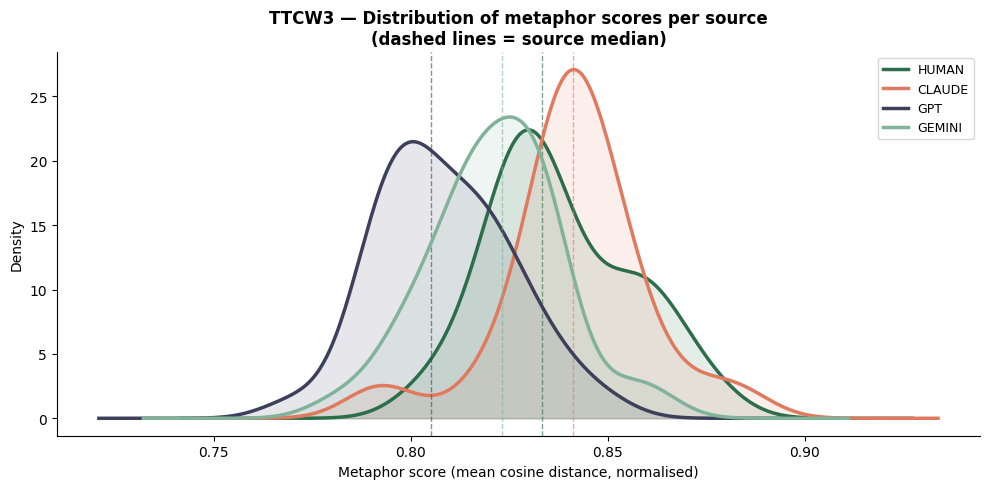

Saved: literary_metaphor_distribution.png


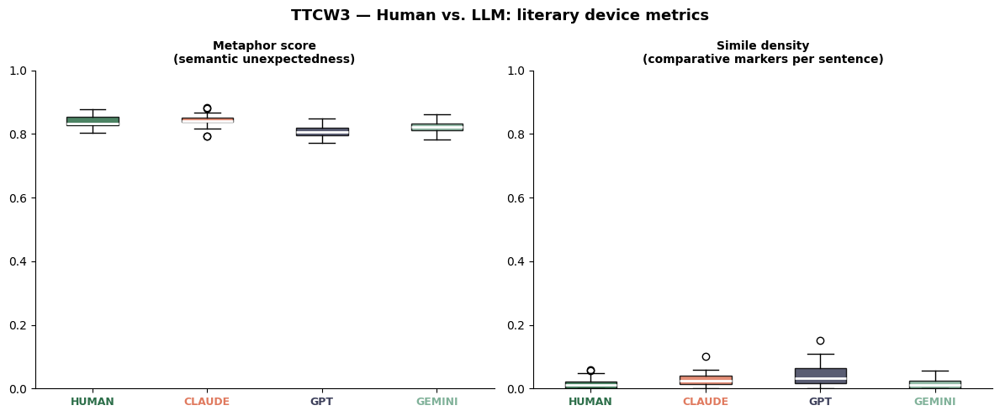

Saved: literary_boxplots.png


In [130]:
# 2. source-level aggregation 
print("\nStep 2: Source-level aggregation...")
df_source = compute_literary_source_metrics(df_lit)
print(df_source.to_string(index=False))

# 3. statistical tests 
print("\nStep 3: Statistical tests...")
test_normality_literary(df_lit)
kruskal_results = test_literary_kruskal(df_lit)
mw_results       = test_literary_mannwhitney(df_lit, kruskal_results)
gpt_comparison   = test_literary_gpt_version_comparison(df_lit, paired=True)
gpt55_vs_human   = test_literary_gpt55_vs_human(df_lit, gpt_comparison)

# 4. Visualization
print("\nStep 4: Plots...")
plot_metaphor_distribution(df_lit)
plot_literary_boxplots(df_lit)

In [ ]:
# ==========================================================
# INSTALL (run once if needed)
# ==========================================================
# pip install transformers torch spacy scipy pandas
# python -m spacy download nl_core_news_lg


# ==========================================================
# IMPORTS
# ==========================================================

import torch
import spacy
import pandas as pd

from transformers import AutoTokenizer, AutoModel
from scipy.spatial.distance import cosine



# ==========================================================
# LOAD MODELS
# ==========================================================

# Dutch dependency parser
nlp = spacy.load("nl_core_news_lg")


# Dutch BERT model (RobBERT)
model_name = "pdelobelle/robbert-v2-dutch-base"

tokenizer = AutoTokenizer.from_pretrained(model_name)

model = AutoModel.from_pretrained(model_name)

model.eval()

# ==========================================================
# ROBBERT EMBEDDINGS WITH CHUNKING
# ==========================================================

def get_robbert_embeddings(sentence):

    encoded = tokenizer(
        sentence,
        return_tensors="pt",
        return_offsets_mapping=True,
        truncation=True,
        max_length=512
    )

    offsets = encoded.pop("offset_mapping")


    with torch.no_grad():

        outputs = model(**encoded)


    embeddings = outputs.last_hidden_state[0]


    return embeddings, offsets[0]



def get_word_embedding(sentence, word_position):
    
    embeddings, offsets = get_robbert_embeddings(sentence)


    matching_tokens = []


    for i, (start, end) in enumerate(offsets):

        # ignore special tokens
        if start == end:
            continue


        if start <= word_position < end:

            matching_tokens.append(i)



    if len(matching_tokens) == 0:

        return None



    vector = embeddings[matching_tokens].mean(dim=0)


    return vector

# ==========================================================
# EXTRACT POSSIBLE METAPHOR RELATIONS
# ==========================================================

def extract_candidates(text):

    doc = nlp(text)

    candidates = []


    for token in doc:


        # -------------------------
        # Verb - Object
        # -------------------------

        if token.dep_ == "obj":

            verb = token.head


            if verb.pos_ == "VERB":

                candidates.append({

                    "word1": verb.text,
                    "word2": token.text,

                    "pos1": verb.idx,
                    "pos2": token.idx,

                    "relation": "verb-object"

                })
                
        # -------------------------
        # Adjective - Noun
        # -------------------------

        if token.dep_ == "amod":

            noun = token.head


            candidates.append({

                "word1": token.text,
                "word2": noun.text,

                "pos1": token.idx,
                "pos2": noun.idx,

                "relation": "adj-noun"

            })


    return candidates



# ==========================================================
# CALCULATE METAPHOR SCORE
# ==========================================================

def calculate_metaphor_score(sentence):

    candidates = extract_candidates(sentence)


    results = []


    for c in candidates:


        vec1 = get_word_embedding(
            sentence,
            c["pos1"]
        )


        vec2 = get_word_embedding(
            sentence,
            c["pos2"]
        )


        if vec1 is not None and vec2 is not None:


            similarity = 1 - cosine(
                vec1.numpy(),
                vec2.numpy()
            )


            results.append({

                "word1": c["word1"],
                "word2": c["word2"],

                "relation": c["relation"],

                "semantic_similarity": similarity,

                # high = more unusual relationship
                "metaphor_likelihood": 1 - similarity,

                "sentence": sentence

            })

    return results


# ==========================================================
# APPLY TO ALL 144 TEXTS
# ==========================================================

all_metaphors = []


for text_id, row in df.iterrows():


    text = row["text"]


    results = calculate_metaphor_score(text)



    for r in results:


        r["text_id"] = text_id


        all_metaphors.append(r)



# Create dataframe with all metaphor candidates

metaphor_df = pd.DataFrame(all_metaphors)



print(
    metaphor_df.head()
)

# ==========================================================
# CREATE ONE METAPHOR SCORE PER STORY
# ==========================================================

story_scores = (

    metaphor_df

    .groupby("text_id")

    ["metaphor_likelihood"]

    .mean()

    .reset_index()

)



story_scores.rename(

    columns={

        "metaphor_likelihood":
        "avg_metaphor_score"

    },

    inplace=True

)


# ==========================================================
# MERGE BACK INTO ORIGINAL DATAFRAME
# ==========================================================

df = df.merge(

    story_scores,

    left_index=True,

    right_on="text_id",

    how="left"

)



print(df.head())



In [163]:
import numpy as np
import pandas as pd
from scipy.stats import mannwhitneyu

df["source"] = df["source"].astype(str).str.strip().str.lower()

def get_metric(source):
    return df.loc[df["source"] == source, "avg_metaphor_score"].dropna()

def test_groups(x, y, name_x, name_y):
    x, y = np.array(x), np.array(y)
    if len(x) == 0 or len(y) == 0:
        raise ValueError(f"Empty group: {name_x} or {name_y}")
    u, p = mannwhitneyu(x, y, alternative="two-sided")
    n1, n2 = len(x), len(y)
    r_rb = 1 - (2 * u) / (n1 * n2)
    median_diff = np.median(x) - np.median(y)
    direction = (
        f"{name_x} > {name_y}" if median_diff > 0
        else f"{name_x} < {name_y}" if median_diff < 0
        else "no difference"
    )
    return {"U": u, "p_raw": p, "effect_size_r": r_rb,
            "median_diff": median_diff, "direction": direction}

sources = sorted(df["source"].unique())
pairs = [(s1, s2) for i, s1 in enumerate(sources) for s2 in sources[i+1:]]
n_comparisons = len(pairs)

print(f"avg_metaphor_score — pairwise Mann-Whitney U (Bonferroni k={n_comparisons})")
print(f"{'Comparison':<25} {'U':>8} {'p_raw':>10} {'p_corr':>10} {'r':>8}  {'direction':<25}  sig?")
print("─" * 95)

results = []
for s1, s2 in pairs:
    x, y = get_metric(s1), get_metric(s2)
    if len(x) == 0 or len(y) == 0:
        continue
    res = test_groups(x, y, s1, s2)
    p_corr = min(res["p_raw"] * n_comparisons, 1.0)
    sig = p_corr < 0.05
    print(f"{s1 + ' vs ' + s2:<25} {res['U']:>8.1f} {res['p_raw']:>10.4f} "
          f"{p_corr:>10.4f} {res['effect_size_r']:>8.3f}  "
          f"{res['direction']:<25}  {'*' if sig else ''}")
    results.append({**res, "comparison": f"{s1} vs {s2}", "p_corr": p_corr, "significant": sig})

df_results = pd.DataFrame(results)

print("\nMedian avg_metaphor_score per source:")
print(df.groupby("source")["avg_metaphor_score"].median().round(4))

avg_metaphor_score — pairwise Mann-Whitney U (Bonferroni k=10)
Comparison                       U      p_raw     p_corr        r  direction                  sig?
───────────────────────────────────────────────────────────────────────────────────────────────
claude vs gemini             980.0     0.0001     0.0006   -0.556  claude > gemini            *
claude vs gpt                867.0     0.0139     0.1386   -0.338  claude > gpt               
claude vs gpt_5.5            699.0     0.5695     1.0000   -0.079  claude < gpt_5.5           
claude vs human              704.0     0.5319     1.0000   -0.086  claude < human             
gemini vs gpt                453.0     0.0424     0.4236    0.281  gemini < gpt               
gemini vs gpt_5.5            315.0     0.0003     0.0030    0.500  gemini < gpt_5.5           *
gemini vs human              320.0     0.0004     0.0037    0.492  gemini < human             *
gpt vs gpt_5.5               480.0     0.0592     0.5924    0.259  gpt < g

In [165]:
df["quoted_chars"] = df["clean_text"].apply(
    lambda t: sum(len(m.group()) for m in QUOTE_RE.finditer(t))
)
print(df.groupby("source")["quoted_chars"].median())

source
claude     581.0
gemini     285.0
gpt        359.0
gpt_5.5    611.0
human      377.0
Name: quoted_chars, dtype: float64


<link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@tabler/icons-webfont@latest/tabler-icons.min.css">
<div id="ttcw4" style="font-family:sans-serif; display:flex; align-items:center; margin:0.5rem 0;">
  <div style="background:#eef2ff; border-radius:25px; padding:6px 20px; display:inline-flex; align-items:center;">
    <h2 style="font-size:20px; font-weight:600; color:#3730a3; margin:0;">TTCW4 - Narrative Ending</h2>
  </div>

<p class="prose"> TTCW4 asks whether the ending of a story feels 'fitted' (structurally and tonally consonant with the rest of the text).<a href = "https://archive.org/details/senseofendingstu0000kerm" style="color:#534AB7;"> Kermode (1967)</a> argues that in order to make sense of a story, there must be something he calls <i>consonance</i> between the 'orgin', 'middle' and 'ending'. <a href = "https://www.matthewjockers.net/2014/06/05/a-novel-method-for-detecting-plot/" style="color:#534AB7;">Jockers (2014)</a> &amp; <a href = "https://www.matthewjockers.net/2015/02/02/syuzhet/" style="color:#534AB7;">Jockers (2015)</a> further describe the process what Kermode calls consonance: the <b>emotional arc</b> of a story. A story follows a trajectory of sentiment that rises and falls across the narrative. This is shown in the figure 2.  An ending that breaks sharply from the established emotional trajectory is tonally <i>dissonant</i>: it violates the consonance between the story's emotional development and its conclusion. </p>

<figure style="margin:1.5rem 0;">
  <img
    src="da_vinci_code_Sentiment.png"
    alt="Narrative sentiment graph of Dan Brown's 'Da Vinci Code'"
    style="width:100%; max-width:900px; border:1px solid #e5e5e5; border-radius:10px;"
  />
  <figcaption style="
      margin-top:.75rem;
      font-size:13px;
      color:#666;
      line-height:1.6;
      text-align:left;
  ">
    <p style="margin:0;"><strong>Figure 2</strong>
    <em>Sentiment graph of Dan Brown's 'Da Vinci Code'</em></p>
    <p style="margin:.5rem 0 0; font-size:11px;">
      <em>Note.</em> Raw sentence-level sentiment scores across the full book, plotted as % of book progress on the x-axis and sentiment value (-1 to +1) on the y-axis. Each spike up is a positively charged passage, each dip down is a negatively charged one. Adapted from <a href = "https://www.matthewjockers.net/2014/06/05/a-novel-method-for-detecting-plot/" style="color:#534AB7;">Jockers, 2014)</a>
    </p>
  </figcaption>
</figure>

<p class="prose"><a href = "https://arxiv.org/pdf/1611.09028" style="color:#534AB7;"> Jannidis et al. (2016) </a> show empirically that meaningful classification of narrative endings is achieved when the ending constitutes no more than 25% of the text.</p>

<p class="prose">Two independent dimensions of consonance are measured:</p>

<ul class="cat-items" style="border:1px solid #e5e5e5;border-radius:10px;padding:0 1.25rem;margin:0 0 1rem 0;">
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#534AB7;min-width:200px;">local_dissonance</span>
    <span>|median sentiment (main) − median sentiment (ending)| = how far the ending drifts emotionally from the main body.</span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#534AB7;min-width:200px;">trajectory_break</span>
    <span>Disruption of emotional direction from start → main → ending — whether the ending continues or reverses the established emotional momentum.</span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#0F6E56;min-width:200px;">narrativity_dissonance</span>
    <span>|median narrativity (main) − median narrativity (ending)| = how far the ending drifts structurally from the main body, using TTCW1 event labels.</span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#0F6E56;min-width:200px;">narrativity_traj_break</span>
    <span>Disruption of narrativity direction from start → main → ending — whether the ending continues or reverses the established narrative momentum.</span>
  </li>
</ul>

<div class="nb-info" style="margin:1rem 0;">
  <p class="prose"><b>Note.</b> Both dimensions are reported independently. No composite is computed since <code>local_dissonance</code> and <code>trajectory_break</code> share the same underlying segment medians. The same applies to the narrativity dimension.</p>
</div>

Since lexicon-based approaches carry a well-documented limitation in literary contexts (e.g. they assume that sentiment is carried by individual words listed (<a href = "https://aclanthology.org/W19-3406/" style="color:#534AB7;">Kim & Klinger, 2019</a>), sentence-level sentiment is instead computed using RobBERT (<a href = "https://aclanthology.org/2020.findings-emnlp.292/" style="color:#534AB7;"> Delobelle et al., 2020</a>), a Dutch BERT-based language model (<a href = "https://aclanthology.org/N19-1423/" style="color:#534AB7;">Devlin et al., 2019 </a>) fine-tuned for sentiment classification. Unlike lexicon lookup, transformer-based models encode full sentence context, handling negation, irony, and domain-specific register more reliably (<a href = "https://aclanthology.org/W19-3406/" style="color:#534AB7;">Kim & Klinger, (2019)</a>). The specific model used is DTAI-KULeuven/robbert-v2-dutch-sentiment, fine-tuned on the Dutch Book Reviews Dataset (<a href = "https://arxiv.org/pdf/1910.00896" style="color:#534AB7;">Van den Burgh & Verberne, 2019</a>), which outputs a continuous score in [0, 1] representing the probability of positive sentiment, where values below 0.5 indicate negative and above 0.5 indicate positive affect

<div class="nb-info" style="margin:1rem 0;">
  <p class="prose"><b>Note.</b> Low sentiment-score means that the ending is not corresponding to the overall tone of the story, not that the ending is 'unfitted' or 'bad'. Consider for example Orwell's 1984 (1949), where the emotional collapse of the final pages contrasts sharply with the fragile hope sustained throughout the main body. This would be flagged in the current approach as 'highly unfitted', yet 1984 is regarded as one of the most perfectly crafted in English literature. However, artistical effectiveness falls outside the scope of the current operationalization. </p>
</div> 

In [131]:
from transformers import pipeline
from scipy.ndimage import uniform_filter1d
from scipy.stats import kruskal, mannwhitneyu, shapiro, wilcoxon, rankdata
from tqdm import tqdm

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import spacy

nlp = spacy.load("nl_core_news_lg")

SOURCES = ["human", "claude", "gpt", "gemini"]   # GPT-5.5 deliberately excluded from this family —
                                                   # see Section 6 for why
COLORS  = {"human": "#2C6E49", "claude": "#E07A5F", "gpt": "#3D405B",
           "gpt_5.5": "#8D93B0", "gemini": "#81B29A"}

/opt/anaconda3/envs/metaphor_env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [132]:
ENDING_METRICS = [
    "local_dissonance",
    "trajectory_break",
    "narrativity_dissonance",
    "narrativity_traj_break",
]

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Narrative ending · Sentiment scores</p>

<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  1. Sentiment classification
</h3>

<p class="prose"> The RobBERT sentiment model is loaded and maps a 3-class output into numeric scores: <br> 
    <code>positive = 1.0</code><br>
    <code>neutral = 0.0</code> <br>
    <code>negative = -1.0 </code> 
</p>

<div class="nb-info" style="margin:1rem 0;">
  <p class="prose"><b>Note.</b> While transformer-based models handle negation and context more reliably than lexicon approaches, RobBERT's binary positive/negative output collapses the full range of literary affect into one dimension. Nuanced emotional registers such as melancholy, irony, or sublimity are not distinguished. Sentiment scores should therefore be interpreted as a coarse directional signal rather than a precise emotional characterisation.</p>
</div>

In [133]:
from tqdm import tqdm

sentiment_pipeline = pipeline(
    "text-classification",
    model="DTAI-KULeuven/robbert-v2-dutch-sentiment",
    tokenizer="DTAI-KULeuven/robbert-v2-dutch-sentiment",
    truncation=True,
    max_length=512,
)
print("RobBERT loaded.")

print("Model loaded.")
print("id2label:", sentiment_pipeline.model.config.id2label)

Loading weights: 100%|█████████████████████| 201/201 [00:00<00:00, 27991.74it/s]


RobBERT loaded.
Model loaded.
id2label: {0: 'Negative', 1: 'Positive'}


In [134]:
def robbert_sentiment_prob(text: str) -> float:
    if not text or not text.strip():
        return np.nan
    try:
        result = sentiment_pipeline(text[:512])[0]
        if result["label"] == "Positive":
            return round(result["score"], 4)
        else:
            return round(1 - result["score"], 4)
    except Exception as e:
        print(f"Sentiment error: {e}")
        return np.nan

In [135]:
def story_sentiment_scores(text: str, window: int = 3) -> list[float]:
    doc   = nlp(text)
    sents = [s.text.strip() for s in doc.sents if s.text.strip()]
    if not sents:
        return []
 
    half   = window // 2
    scores = []
    for i in range(len(sents)):
        start   = max(0, i - half)
        end     = min(len(sents), i + half + 1)
        context = " ".join(sents[start:end])
        scores.append(robbert_sentiment_prob(context))
    return scores

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Narrative ending · Text segmentation</p>

<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  2. Text segmentation
</h3>

<p class="prose"> The text is split into three segments: beginning - 25%, main body - 50%, ending - 25% (<a href = "https://arxiv.org/pdf/1611.09028" style="color:#534AB7;">Jannidis et al. (2016)</a>) using word counts to ensure the proportions are exact, but the split point is adjusted to the nearest sentence boundary to avoid cutting mid-sentence.
</p>

In [136]:
def split_segments_by_words(text: str) -> tuple[list[int], list[int], list[int]]:
    doc   = nlp(text)
    sents = [s.text.strip() for s in doc.sents if s.text.strip()]
    if not sents:
        return [], [], []
 
    # word counts per sentence
    word_counts = [len(s.split()) for s in sents]
    total_words = sum(word_counts)
    cumulative  = np.cumsum(word_counts)
 
    target_25 = total_words * 0.25
    target_75 = total_words * 0.75
 
    # find nearest sentence boundary to 25% and 75%
    s_end = int(np.argmin(np.abs(cumulative - target_25))) + 1
    m_end = int(np.argmin(np.abs(cumulative - target_75))) + 1
 
    s_end = max(1, min(s_end, len(sents) - 2))
    m_end = max(s_end + 1, min(m_end, len(sents) - 1))
 
    start_idx  = list(range(0, s_end))
    main_idx   = list(range(s_end, m_end))
    ending_idx = list(range(m_end, len(sents)))
 
    return start_idx, main_idx, ending_idx

In [137]:
def segment_median(scores: list[float]) -> float:
    valid = [s for s in scores if not np.isnan(s)]
    return float(np.median(valid)) if valid else np.nan

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Narrative ending · Consonance measures</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  3. Consonance measures
</h3>

<p class="prose">Two independent dimensions of consonance are measured. One is based on sentiment (RobBERT) and one on narrativity (TTCW1 event labels). Each dimension produces two metrics: a <b>local dissonance</b> score measuring how far the ending drifts from the main body, and a <b>trajectory break</b> score measuring whether the ending disrupts the directional momentum established across the story.</p>

<p class="prose" style="margin-bottom:0.5rem;font-weight:600;color:#534AB7;">1. Sentiment consonance</p>
<ul class="cat-items" style="border:1px solid #EEEDFE;border-radius:10px;padding:0 1.25rem;margin:0 0 1.25rem 0;">
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#534AB7;min-width:210px;">local_dissonance</span>
    <span>|median<sub>sentiment</sub>(main) − median<sub>sentiment</sub>(ending)| — how far the ending drifts emotionally from the main body.<br>
    <span style="color:#2C6E49;font-size:13px;">↓ Low = ending matches the emotional tone of the main body.</span><br>
    <span style="color:#993C1D;font-size:13px;">↑ High = ending diverges sharply in emotional tone from the main body.</span></span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#534AB7;min-width:210px;">trajectory_break</span>
    <span>|(sentiment<sub>main</sub> − sentiment<sub>start</sub>) − (sentiment<sub>ending</sub> − sentiment<sub>main</sub>)| — whether the ending continues or reverses the emotional direction established from start to main body.<br>
    <span style="color:#2C6E49;font-size:13px;">↓ Low = ending continues the established emotional direction (e.g. negative → positive → positive).</span><br>
    <span style="color:#993C1D;font-size:13px;">↑ High = ending reverses the established emotional direction (e.g. negative → positive → negative).</span></span>
  </li>
</ul>

<p class="prose" style="margin-bottom:0.5rem;font-weight:600;color:#0F6E56;">2. Narrativity consonance</p>
<ul class="cat-items" style="border:1px solid #E1F5EE;border-radius:10px;padding:0 1.25rem;margin:0 0 1.25rem 0;">
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#0F6E56;min-width:210px;">narrativity_dissonance</span>
    <span>|median<sub>narrativity</sub>(main) − median<sub>narrativity</sub>(ending)| — how far the ending drifts structurally from the main body.<br>
    <span style="color:#2C6E49;font-size:13px;">↓ Low = ending maintains a similar level of narrative activity to the main body.</span><br>
    <span style="color:#993C1D;font-size:13px;">↑ High = ending diverges sharply in narrative activity (e.g. action-dense main body followed by a flat, stative ending).</span></span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#0F6E56;min-width:210px;">narrativity_traj_break</span>
    <span>|(narrativity<sub>main</sub> − narrativity<sub>start</sub>) − (narrativity<sub>ending</sub> − narrativity<sub>main</sub>)| — whether the ending continues or reverses the narrative momentum established from start to main body.<br>
    <span style="color:#2C6E49;font-size:13px;">↓ Low = ending continues the established narrative direction (e.g. building toward higher narrativity throughout).</span><br>
    <span style="color:#993C1D;font-size:13px;">↑ High = ending reverses the established narrative momentum (e.g. story builds toward action but ending suddenly drops to stative events).</span></span>
  </li>
</ul>

In [138]:
def local_dissonance(median_main: float, median_ending: float) -> float:
    if np.isnan(median_main) or np.isnan(median_ending):
        return np.nan
    return round(abs(median_ending - median_main), 4)

In [139]:
def trajectory_break(
    median_start:  float,
    median_main:   float,
    median_ending: float,
) -> float:
    
    if any(np.isnan(v) for v in [median_start, median_main, median_ending]):
        return np.nan
    direction_start_to_main = median_main   - median_start
    direction_main_to_end   = median_ending - median_main
    return round(abs(direction_start_to_main - direction_main_to_end), 4)

In [140]:
def compute_ending_metrics(df: pd.DataFrame) -> pd.DataFrame:
    rows = []
 
    for _, row in tqdm(df.iterrows(), total=len(df), desc="TTCW4"):
        text         = row["clean_text"]
        event_labels = row["event_labels"]
 
        # get sentence-level segment indices
        start_idx, main_idx, ending_idx = split_segments_by_words(text)
 
        if len(start_idx) == 0 or len(main_idx) == 0 or len(ending_idx) == 0:
            rows.append({
                "story_id":               row["story_id"],
                "source":                 row["source"],
                **{m: np.nan for m in [
                    "median_sentiment_start", "median_sentiment_main",
                    "median_sentiment_ending", "local_dissonance",
                    "trajectory_break", "median_narrativity_start",
                    "median_narrativity_main", "median_narrativity_ending",
                    "narrativity_dissonance", "narrativity_traj_break",
                ]}
            })
            continue
 
        # a: Sentiment consonance
        sent_scores = story_sentiment_scores(text)
 
        if len(sent_scores) < 4:
            s_sent = m_sent = e_sent = np.nan
        else:
            s_sent = segment_median([sent_scores[i] for i in start_idx
                                     if i < len(sent_scores)])
            m_sent = segment_median([sent_scores[i] for i in main_idx
                                     if i < len(sent_scores)])
            e_sent = segment_median([sent_scores[i] for i in ending_idx
                                     if i < len(sent_scores)])
 
        loc_dis  = local_dissonance(m_sent, e_sent)
        traj_brk = trajectory_break(s_sent, m_sent, e_sent)
 
        # b: Narrativity consonance (TTCW1) 
        n_spans = len(event_labels)
        if n_spans < 4:
            s_narr = m_narr = e_narr = np.nan
        else:
            n_s_end = max(1, round(n_spans * 0.25))
            n_m_end = max(n_s_end + 1, round(n_spans * 0.75))
 
            narr_scores = [e["narrativity"] for e in event_labels]
            s_narr = segment_median(narr_scores[:n_s_end])
            m_narr = segment_median(narr_scores[n_s_end:n_m_end])
            e_narr = segment_median(narr_scores[n_m_end:])
 
        narr_dis  = local_dissonance(m_narr, e_narr)
        narr_traj = trajectory_break(s_narr, m_narr, e_narr)
 
        rows.append({
            "story_id":                row["story_id"],
            "source":                  row["source"],
            # sentiment
            "median_sentiment_start":  round(s_sent, 4) if not np.isnan(s_sent) else np.nan,
            "median_sentiment_main":   round(m_sent, 4) if not np.isnan(m_sent) else np.nan,
            "median_sentiment_ending": round(e_sent, 4) if not np.isnan(e_sent) else np.nan,
            "local_dissonance":        loc_dis,
            "trajectory_break":        traj_brk,
            # narrativity
            "median_narrativity_start":  round(s_narr, 4) if not np.isnan(s_narr) else np.nan,
            "median_narrativity_main":   round(m_narr, 4) if not np.isnan(m_narr) else np.nan,
            "median_narrativity_ending": round(e_narr, 4) if not np.isnan(e_narr) else np.nan,
            "narrativity_dissonance":    narr_dis,
            "narrativity_traj_break":    narr_traj,
        })
 
    return (
        pd.DataFrame(rows)
        .sort_values(["story_id", "source"])
        .reset_index(drop=True)
    )

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Narrative ending · Aggregate source comparison</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  4. Aggregating results per source 
</h3>

<p class="prose">
  To make a comparison between the four sources inside the dataset, each pacing metric (sentiment consonance + narrativity consonance) will be put together taking the <b>median</b><sup><a href="#fn1">*</a></sup> across all stories and using that for a typical event-distribution-profile per source. This process is carried out by <code>compute_ending_source_metrics()</code> 
</p>
<hr>

<div id="fn1" style="font-size:12px; color:#666;">
  <sup>*</sup> The median is calculated instead of the mean since the data is not normally distributed (see section 5)
  <a href="#fn1-ref">↩</a>
</div>

In [141]:
def compute_ending_source_metrics(df_ending: pd.DataFrame) -> pd.DataFrame:
    return (
        df_ending
        .groupby("source")[ENDING_METRICS]
        .agg(["median", lambda x: x.quantile(0.75) - x.quantile(0.25)])
        .round(4)
        .reset_index()
    )

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Narrative Ending · Statistical Analysis</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  5. Ending profiles and statistical testing
</h3>
<p class="prose">Three statistical tests will be run in sequence:</p>
<div class="grid-2" style="margin:1rem 0 1.5rem 0;">
  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#534AB7;">1. Shapiro–Wilk</strong>
      <span class="cat-badge" style="background:#EEEDFE;color:#3C3489;">Normality</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
      To test whether the results are normally distributed within each source, the Shapiro-Wilk test will be applied to each subset. Shapiro-Wilk tests work when the number of observations is > 3 and < 50. Here, the test runs per group, so it's testing normality on n=36 per source.
    </p>
  </div>
  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#534AB7;">2. Kruskal–Wallis</strong>
      <span class="cat-badge" style="background:#EEEDFE;color:#3C3489;">Group comparison</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
      The Shapiro–Wilk test indicated that normality assumptions were violated for most source–metric combinations. The Kruskal-Wallis test is chosen here since it is a <b>non-parametric test</b> of whether the <b>median</b> differences across sources exceed what would be expected by chance.
    </p>
  </div>
  <div class="cat-card" style="grid-column: 1 / -1;">
    <div class="cat-header">
      <strong style="color:#534AB7;">3. Mann–Whitney U</strong>
      <span class="cat-badge" style="background:#EEEDFE;color:#3C3489;">Pairwise · Bonferroni</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
      Only runs when the Kruskal-Wallis gives significant results. The Mann-Whitney U test is used to compare each LLM model to the human writers. This test is chosen since these are pairwise comparisons (human vs. each LLM individually). Bonferroni correction adjusts for the number of simultaneous comparisons (n metrics × 3 LLM sources) to reduce the risk of false positives. Alongside each p-value, <b>Cliff's delta</b> is reported as an effect size.
    </p>
  </div>
</div>

In [142]:
def test_normality_ending(df_ending: pd.DataFrame):
    print("Shapiro-Wilk normality tests — ending metrics")
    print(f"{'Metric':<28} {'Source':<10} {'W':>8} {'p':>10}  normal?")
    print("─" * 62)
    for metric in ENDING_METRICS:
        for source in SOURCES:
            vals = df_ending[df_ending["source"] == source][metric].dropna()
            if len(vals) < 3:
                continue
            stat, p = shapiro(vals)
            print(f"{metric:<28} {source:<10} {stat:>8.4f} {p:>10.4f}  "
                  f"{'yes' if p > 0.05 else 'NO'}")
        print()

In [143]:
def test_ending_kruskal(df_ending: pd.DataFrame) -> pd.DataFrame:
    rows = []
    print("Kruskal-Wallis — ending metrics across sources")
    print(f"{'Metric':<28} {'H':>8} {'p':>10}  {'high':<10} {'low':<10}  sig?")
    print("─" * 68)
    for metric in ENDING_METRICS:
        groups  = [df_ending[df_ending["source"] == s][metric].dropna().values
                   for s in SOURCES]
        stat, p = kruskal(*groups)
        sig     = p < 0.05
        medians = {s: df_ending[df_ending["source"] == s][metric].median()
                   for s in SOURCES}
        highest = max(medians, key=medians.get)
        lowest  = min(medians, key=medians.get)
        print(f"{metric:<28} {stat:>8.4f} {p:>10.4f}  {highest:<10} {lowest:<10}  "
              f"{'*' if sig else ''}")
        rows.append({"metric": metric, "H": stat, "p": p,
                     "significant": sig, "highest": highest, "lowest": lowest})
    return pd.DataFrame(rows)

In [144]:
def cliffs_delta(a, b):
    a, b = np.asarray(a), np.asarray(b)
    greater = sum(x > y for x in a for y in b)
    less    = sum(x < y for x in a for y in b)
    return (greater - less) / (len(a) * len(b))

def interpret_effect(d):
    d = abs(d)
    if d < 0.147: return "negligible"
    if d < 0.33:  return "small"
    if d < 0.474: return "medium"
    return "large"

def test_ending_mannwhitney(df_ending: pd.DataFrame, kruskal_results: pd.DataFrame) -> pd.DataFrame:
    significant_metrics = kruskal_results[kruskal_results["significant"]]["metric"].tolist()

    if not significant_metrics:
        print("No significant Kruskal-Wallis results.")
        return pd.DataFrame()

    llm_sources = ["claude", "gpt", "gemini"]
    n_human     = len(llm_sources) * len(significant_metrics)
    rows = []

    for metric in significant_metrics:
        print(f"\n{'═'*95}")
        print(f"  {metric.upper()}")
        print(f"{'═'*95}")
        print(f"\n  Human vs. LLM")
        print(f"  {'Comparison':<22} {'U':>8} {'p_raw':>10} {'p_corr':>10}  "
              f"{'delta':>8} {'(size)':<12} {'Direction':<25}  Sig?")
        print(f"  {'─'*100}")

        human_vals    = df_ending[df_ending["source"] == "human"][metric].dropna().values
        any_human_sig = False

        for llm in llm_sources:
            llm_vals  = df_ending[df_ending["source"] == llm][metric].dropna().values
            u, p      = mannwhitneyu(human_vals, llm_vals, alternative="two-sided")
            delta     = cliffs_delta(human_vals, llm_vals)
            label     = interpret_effect(delta)
            p_corr    = min(p * n_human, 1.0)
            direction = f"human {'>' if np.median(human_vals) > np.median(llm_vals) else '<'} {llm}"
            sig       = p_corr < 0.05
            if sig:
                any_human_sig = True
            print(f"  {'human vs ' + llm:<22} {u:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
                  f"{delta:>8.3f} ({label:<10}) {direction:<25}  {'*' if sig else '–'}")
            rows.append({"metric": metric, "vs": llm, "U": u, "p": p, "p_corr": p_corr,
                         "cliffs_delta": delta, "effect_label": label,
                         "direction": direction, "significant": sig})

        if any_human_sig:
            print(f"\n  ✓ Significant human–LLM difference found.")

    return pd.DataFrame(rows)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Narrative Ending · GPT-4o vs. GPT-5.5</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  6. Direct model-version comparison
</h3>
<p class="prose">
  To find if there is a significant difference between GPT-4o and GPT-5.5 on ending consonance, a Wilcoxon signed-rank test will be run separately. It asks specifically whether <b>upgrading the model</b> changes how well its endings cohere with the rest of the story.
</p>
<div class="nb-info" style="margin:1rem 0;">
  <p class="prose" style="margin:0;">
    Each GPT-4o and GPT-5.5 story comes from the <b>same prompt</b> (matched by <code>story_id</code>), so a <b>paired Wilcoxon signed-rank test</b> is used instead of the unpaired Mann-Whitney U applied above. Pairing controls for prompt-to-prompt variance and gives more power at the same n=36. Bonferroni correction is applied across the 4 ending metrics within this test only, separate from the human-vs-LLM correction above. Alongside each p-value, the <b>matched rank-biserial correlation</b> is reported as an effect size, to show the magnitude of any shift, not just its significance.
  </p>
</div>
<p class="prose">
  Only when this test returns a significant result for a given metric, a follow-up comparison is run: GPT-5.5 vs. human on that metric only. This checks whether the model-version shift moved GPT-5.5 closer to or further from human-like narrative consonance.
</p>


In [145]:
def matched_rank_biserial(a, b):
    diffs = np.array(a) - np.array(b)
    diffs = diffs[diffs != 0]
    ranks = rankdata(np.abs(diffs))
    pos_sum = ranks[diffs > 0].sum()
    neg_sum = ranks[diffs < 0].sum()
    return (pos_sum - neg_sum) / (pos_sum + neg_sum)

def test_ending_gpt_version_comparison(df_ending: pd.DataFrame, paired: bool = True) -> pd.DataFrame:
    gpt4o = df_ending[df_ending["source"] == "gpt"].set_index("story_id")
    gpt55 = df_ending[df_ending["source"] == "gpt_5.5"].set_index("story_id")

    test_name = "paired Wilcoxon signed-rank" if paired else "unpaired Mann-Whitney U"
    n_comparisons = len(ENDING_METRICS)

    print("\nGPT-4o vs. GPT-5.5 — direct model comparison (ending metrics)")
    print(f"({test_name}, Bonferroni corrected across {n_comparisons} metrics)")
    print(f"{'Metric':<28} {'stat':>8} {'p_raw':>10} {'p_corr':>10}  "
          f"{'effect':>8} {'(size)':<12} {'direction':<20}  sig?")
    print("─" * 100)

    rows = []
    for metric in ENDING_METRICS:
        if paired:
            common_ids = gpt4o.index.intersection(gpt55.index)
            a = gpt4o.loc[common_ids, metric].dropna()
            b = gpt55.loc[common_ids, metric].dropna()
            common_ids = a.index.intersection(b.index)
            a, b = a.loc[common_ids], b.loc[common_ids]
            if len(a) < 1:
                continue
            stat, p = wilcoxon(a.values, b.values)
            effect = matched_rank_biserial(a.values, b.values)
        else:
            a = gpt4o[metric].dropna()
            b = gpt55[metric].dropna()
            if len(a) < 1 or len(b) < 1:
                continue
            stat, p = mannwhitneyu(a.values, b.values, alternative="two-sided")
            effect = cliffs_delta(a.values, b.values)

        p_corr       = min(p * n_comparisons, 1.0)
        direction    = f"gpt {'>' if a.median() > b.median() else '<'} gpt_5.5"
        sig          = p_corr < 0.05
        effect_label = interpret_effect(effect)

        print(f"{metric:<28} {stat:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
              f"{effect:>8.3f} ({effect_label:<10}) {direction:<20}  {'*' if sig else ''}")
        rows.append({"metric": metric, "stat": stat, "p": p, "p_corr": p_corr,
                     "significant": sig, "direction": direction,
                     "effect_size": effect, "effect_label": effect_label})

    return pd.DataFrame(rows)

In [146]:
def test_ending_gpt55_vs_human(df_ending: pd.DataFrame, gpt_comparison: pd.DataFrame) -> pd.DataFrame:
    significant_metrics = gpt_comparison[gpt_comparison["significant"]]["metric"].tolist()

    if not significant_metrics:
        print("No significant GPT-4o vs. GPT-5.5 differences — GPT-5.5 vs. human not run.")
        return pd.DataFrame()

    human = df_ending[df_ending["source"] == "human"]
    gpt55 = df_ending[df_ending["source"] == "gpt_5.5"]
    n_comparisons = len(significant_metrics)

    print(f"\nGPT-5.5 vs. Human — ending metrics "
          f"(only metrics where GPT-4o→GPT-5.5 shifted: {', '.join(significant_metrics)})")
    print(f"{'Metric':<28} {'U':>8} {'p_raw':>10} {'p_corr':>10}  "
          f"{'delta':>8} {'(size)':<12} {'direction':<20}  sig?")
    print("─" * 100)

    rows = []
    for metric in significant_metrics:
        h = human[metric].dropna().values
        g = gpt55[metric].dropna().values
        u, p   = mannwhitneyu(h, g, alternative="two-sided")
        delta  = cliffs_delta(h, g)
        label  = interpret_effect(delta)
        p_corr = min(p * n_comparisons, 1.0)
        sig    = p_corr < 0.05
        direction = f"human {'>' if np.median(h) > np.median(g) else '<'} gpt_5.5"

        print(f"{metric:<28} {u:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
              f"{delta:>8.3f} ({label:<10}) {direction:<20}  {'*' if sig else ''}")
        rows.append({"metric": metric, "U": u, "p": p, "p_corr": p_corr,
                     "cliffs_delta": delta, "effect_label": label,
                     "direction": direction, "significant": sig})

    return pd.DataFrame(rows)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Narrative ending · Visualization</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  Visualization
</h3>
<p class="prose">To give a clear overview of the data, 2 plots will be generated:</p>

<ul class="cat-items" style="border:1px solid #e5e5e5;border-radius:10px;padding:0 1.25rem;margin:0;">
  <li style="padding:14px 0;">
    <code>plot_sentiment_arc()</code>
    <span>This function plots the sentiment arc per source for one story. Segment boundaries follow word-count split. Neutral line at 0.5.</span>
  </li>
  <li style="padding:14px 0;">
    <code>plot_ending_boxplots()</code>
    <span>This function gives boxplots per metric grouped by source for direct visual comparison of distributions across human and LLM writers.</span>
  </li>
</ul>
<br>

In [147]:
def plot_sentiment_arc(
    df: pd.DataFrame,
    story_id: int,
    smooth_window: int = 5,
):
    fig, axes = plt.subplots(len(SOURCES), 1, figsize=(16, 12), sharex=False)
    fig.suptitle(f"Sentiment arc — Story {story_id}",
                 fontsize=13, fontweight="bold")
 
    for ax, source in zip(axes, SOURCES):
        row = df[(df["story_id"] == story_id) & (df["source"] == source)]
        if row.empty:
            ax.set_visible(False)
            continue
 
        text        = row.iloc[0]["clean_text"]
        sent_scores = story_sentiment_scores(text)
        scores_clean = [s if not np.isnan(s) else 0.5 for s in sent_scores]
 
        if len(scores_clean) < 4:
            ax.set_title(f"{source.upper()} — too short",
                         loc="left", fontsize=9, color=COLORS[source])
            continue
 
        # recompute segment boundaries for this story
        start_idx, main_idx, ending_idx = split_segments_by_words(text)
        s_end = start_idx[-1] + 1 if start_idx else 0
        m_end = main_idx[-1]  + 1 if main_idx  else s_end
 
        x        = np.arange(len(scores_clean))
        smoothed = uniform_filter1d(scores_clean, size=smooth_window)
 
        ax.plot(x, smoothed, color=COLORS[source], linewidth=2)
        ax.fill_between(x, smoothed, alpha=0.12, color=COLORS[source])
        ax.axhline(0.5, color="#aaa", linewidth=0.8, linestyle=":")
        ax.axvline(s_end, color="#E07A5F", linewidth=1.5,
                   linestyle="--", alpha=0.8, label="Start / Main (25%)")
        ax.axvline(m_end, color="#2C6E49", linewidth=1.5,
                   linestyle="--", alpha=0.8, label="Main / Ending (75%)")
 
        n = len(scores_clean)
        ax.text(s_end / 2,          0.05, "START",  fontsize=7,
                color="#E07A5F", ha="center", alpha=0.7)
        ax.text((s_end + m_end) / 2, 0.05, "MAIN",   fontsize=7,
                color="#555",    ha="center", alpha=0.7)
        ax.text((m_end + n) / 2,    0.05, "ENDING", fontsize=7,
                color="#2C6E49", ha="center", alpha=0.7)
 
        ax.set_ylim(0, 1)
        ax.set_title(source.upper(), loc="left", fontsize=10,
                     fontweight="bold", color=COLORS[source])
        ax.set_ylabel("P(Positive)", fontsize=8)
        ax.spines[["top", "right"]].set_visible(False)
 
        if source == SOURCES[-1]:
            ax.set_xlabel("Sentence index", fontsize=9)
            ax.legend(fontsize=8, loc="upper right", framealpha=0.5)
 
    plt.tight_layout()
    plt.savefig(f"sentiment_arc_story{story_id}.png", dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved: sentiment_arc_story{story_id}.png")

In [148]:
def plot_ending_boxplots(df_ending: pd.DataFrame):
    metric_labels = {
        "local_dissonance":       "Sentiment dissonance\n(main vs ending)",
        "trajectory_break":       "Sentiment trajectory break",
        "narrativity_dissonance": "Narrativity dissonance\n(main vs ending)",
        "narrativity_traj_break": "Narrativity trajectory break",
    }
 
    fig, axes = plt.subplots(1, 4, figsize=(18, 5))
 
    for ax, (col, label) in zip(axes, metric_labels.items()):
        data   = [df_ending[df_ending["source"] == s][col].dropna().values
                  for s in SOURCES]
        colors = [COLORS[s] for s in SOURCES]
        bp     = ax.boxplot(data, patch_artist=True,
                            medianprops={"color": "white", "linewidth": 2})
        for patch, color in zip(bp["boxes"], colors):
            patch.set_facecolor(color)
            patch.set_alpha(0.85)
 
        ax.set_xticks(range(1, len(SOURCES) + 1))
        ax.set_xticklabels([s.upper() for s in SOURCES],
                           fontsize=9, fontweight="bold")
        for tick, color in zip(ax.get_xticklabels(), colors):
            tick.set_color(color)
 
        ax.set_title(label, fontsize=10, fontweight="bold")
        ax.spines[["top", "right"]].set_visible(False)
 
    plt.suptitle("TTCW4 — Narrative ending: Human vs. LLM",
                 fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.savefig("ending_boxplots.png", dpi=150, bbox_inches="tight")
    plt.show()
    print("Saved: ending_boxplots.png")

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Narrative ending · Run the code</p>

<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  Run everything
</h3>

In [149]:
# Step 1: Compute all ending metrics 
print("Step 1: Computing ending metrics...")
df_ending = compute_ending_metrics(df)
print(df_ending.groupby("source")[ENDING_METRICS].median().round(3))

Step 1: Computing ending metrics...


TTCW4: 100%|██████████████████████████████████| 179/179 [09:04<00:00,  3.04s/it]

         local_dissonance  trajectory_break  narrativity_dissonance  \
source                                                                
claude              0.027             0.133                     1.5   
gemini              0.038             0.105                     1.0   
gpt                 0.001             0.009                     1.0   
gpt_5.5             0.034             0.197                     0.0   
human               0.099             0.263                     0.0   

         narrativity_traj_break  
source                           
claude                      2.0  
gemini                      2.0  
gpt                         2.0  
gpt_5.5                     0.0  
human                       0.5  



Step 2: Source-level aggregation...
 source local_dissonance            trajectory_break            narrativity_dissonance            narrativity_traj_break           
                  median <lambda_0>           median <lambda_0>                 median <lambda_0>                 median <lambda_0>
 claude           0.0268     0.1314           0.1327     0.3738                    1.5      2.000                    2.0       3.00
 gemini           0.0379     0.0922           0.1054     0.1860                    1.0      2.000                    2.0       2.00
    gpt           0.0012     0.0065           0.0088     0.0771                    1.0      2.000                    2.0       2.25
gpt_5.5           0.0340     0.3518           0.1974     0.6792                    0.0      1.125                    0.0       2.00
  human           0.0992     0.3280           0.2634     0.6066                    0.0      1.000                    0.5       2.00

Step 3: Statistical tests...
Shapiro-W

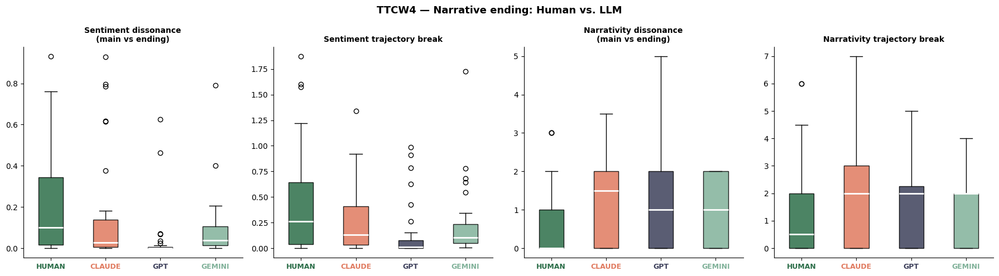

Saved: ending_boxplots.png


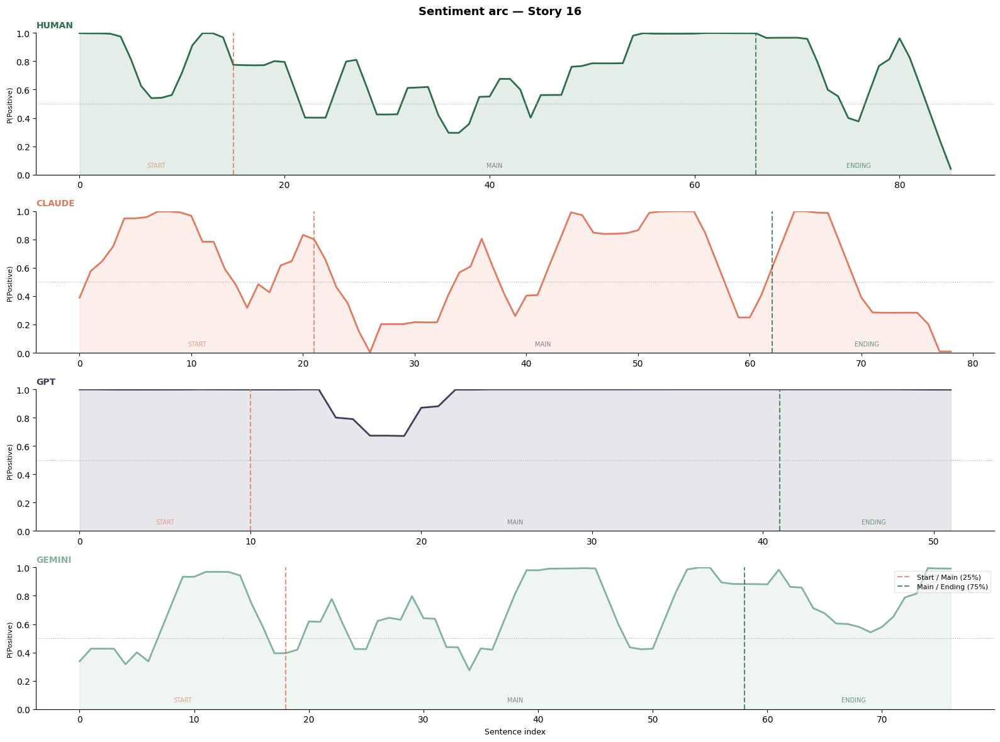

Saved: sentiment_arc_story16.png


In [150]:
# Step 2: Aggregrate at source level
print("\nStep 2: Source-level aggregation...")
df_source = compute_ending_source_metrics(df_ending)
print(df_source.to_string(index=False))

# Step 3: Run statistics 
print("\nStep 3: Statistical tests...")
test_normality_ending(df_ending)
kruskal_results = test_ending_kruskal(df_ending)
mw_results       = test_ending_mannwhitney(df_ending, kruskal_results)
gpt_comparison   = test_ending_gpt_version_comparison(df_ending, paired=True)
gpt55_vs_human   = test_ending_gpt55_vs_human(df_ending, gpt_comparison)

# Step 4: Plot
print("\nStep 4: Plots...")
plot_ending_boxplots(df_ending)

# plot the first story_id in the dataset
story_id = df["story_id"].iloc[7]
plot_sentiment_arc(df, story_id=story_id)

<link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@tabler/icons-webfont@latest/tabler-icons.min.css">
<div id="ttcw5" style="font-family:sans-serif; display:flex; align-items:center; margin:0.5rem 0;">
  <div style="background:#eef2ff; border-radius:25px; padding:6px 20px; display:inline-flex; align-items:center;">
    <h2 style="font-size:20px; font-weight:600; color:#3730a3; margin:0;">TTCW 5 - Understandability & Coherence</h2>
  </div>

<p class="prose"><a href="https://arxiv.org/pdf/2309.14556" style="color:#534AB7;">Chakrabarty et al. (2024)</a>define <b>narrative coherence</b> as the degree to which a story naturally 'flows': whether the beginning leads through the middle to the end in a way that feels deliberate and intentional, with all elements working together to form a unified whole. </p>

<p class="prose"><a href="https://aclanthology.org/J08-1001.pdf" style="color:#534AB7;">Barzilay & Lapata (2008)</a> developped a method for approaching local coherence in a story computationally. Their framework automatically abstracts a sequence of texts into 'a set of entity transition frequencies' and measures the local coherence between them. They show empirically that entity transition patterns predict coherence in text ordering, summary evaluation and readability assessment. <br>Their model works by tracking which entities appear in which sentences across a document. This is based on a sentence-to-sentence level. Each text is transformed into an <b>entity grid</b> that captures the flow of discourse entities inside a story. An example of such a grid is shown in Figure 3. </p>
    
<figure style="margin:1.5rem 0;">
    <img
    src="based_on_entity.png"
    alt="An example of a text described in Barzilay & Lapta (2008)"
    style="width:100%; max-width:900px; border:1px solid #e5e5e5; border-radius:10px;"
    />
  <img
    src="entity_grid.png"
    alt="An example of an entity grid described in Barzilay & Lapta (2008)"
    style="width:100%; max-width:900px; border:1px solid #e5e5e5; border-radius:10px;"
  />
  <figcaption style="
      margin-top:.75rem;
      font-size:13px;
      color:#666;
      line-height:1.6;
      text-align:left;
  ">
    <p style="margin:0;"><strong>Figure 3</strong>
    <em>Entity grid corresponding to the text. </em></p>
    <p style="margin:.5rem 0 0; font-size:11px;">
      <em>Note.</em> Rows correspond to sentences and columns correspond to discourse entities, with each cell recording whether the entity functions as a subject (S), object (O), other grammatical relation (X), or is absent (–) in that sentence. Adapted from <a href="https://aclanthology.org/J08-1001.pdf" style="color:#534AB7;">Barzilay & Lapata (2008)</a>
    </p>
  </figcaption>
</figure>

<p class="prose"> Their notion that coherent texts show regular patterns of entity distribution across sentences forms the theoretical basis of the current approach. </p>

<p class="prose"><a href="https://clinjournal.org/clinj/article/view/91" style="color:#534AB7;">Van Cranenburgh (2019)</a> demonstrates that entity coreference is both theoretically meaningful and computationally tractable in contemporary Dutch literary fiction specifically. He introduces a rule-based Dutch coreference resolution system based on the Stanford deterministic multi-pass sieve architecture (<a href="https://aclanthology.org/W11-1902.pdf" style="color:#534AB7;">Van Cranenburgh (2019)</a> Lee et al., 2011</a>). This system resolves full coreference chains, including pronouns, names and noun phrases, into entity clusters. So <i>hij</i>, <i>de man</i>, and <i>Jan</i> would all be assigned to the same cluster ID. Computing entity persistence from the output of this parser measures whether the same entity cluster persists across adjacent sentences, which is what  <a href="https://aclanthology.org/J08-1001.pdf" style="color:#534AB7;">Barzilay & Lapata (2008)</a> and <a href="https://aclanthology.org/J95-2003.pdf" style="color:#534AB7;">Grosz et al. (1995)</a> (Centering Theory) predict distinguishes coherent from incoherent discourse. However, this proxy only acounts for local coherence. To bring an extra (global) level to TTCW5, the approach will use the cosine similarity between sentence embeddings from TTCW4.</p>

<p class="prose">Two dimensions of coherence will be measured:</p>

<ul class="cat-items" style="border:1px solid #e5e5e5;border-radius:10px;padding:0 1.25rem;margin:0 0 1.25rem 0;">
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#534AB7;min-width:220px;">1. Entity persistence</span>
    <span>Proportion of consecutive sentence pairs sharing at least one coreference cluster ID. Measures <b>local cohesion</b> — whether the same entities persist across adjacent sentences. Computed globally and per segment (start 25%, main 50%, ending 25%), following the segmentation scheme established in TTCW4 (<a href = "https://arxiv.org/pdf/1611.09028" style="color:#534AB7;"> Jannidis et al. (2016) </a>; <a href = "https://archive.org/details/senseofendingstu0000kerm" style="color:#534AB7;"> Kermode (1967)</a>).</span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#0F6E56;min-width:220px;">2. Embedding similarity</span>
    <span>Mean cosine similarity between consecutive sentence embeddings (RobBERT). Measures <b>global coherence</b>: whether the semantic content stays consistent across the full story. This addresses the local/global gap in entity persistence alone. This is the same semantic space used for sentiment analysis in TTCW4 (<a href = "https://aclanthology.org/2020.findings-emnlp.292/" style="color:#534AB7;"> Delobelle et al., 2020</a>).</span>
  </li>
</ul>

<p class="prose">To run the pipeline, Alpino (<a href="https://www.clinjournal.org/CLIN_proceedings/XI/bouma.pdf" style="color:#534AB7;">Bouma et al., 2001</a>; <a href="https://aclanthology.org/2006.jeptalnrecital-invite.2.pdf" style="color:#534AB7;">van Noord, 2006</a>) must be installed locally via its official Docker distribution (<code>rug-compling/alpino-docker</code>). Alpino serves as the backbone infrastructure that <code>dutchcoref</code> requires: it tokenizes, parses and produces XML dependency trees for each story, which <code>dutchcoref</code> then uses to resolve coreference chains. All 144 stories are processed through this pipeline. The full coreference output is stored as one CoNLL file per story in the format <code>{source}_story_{story_id}.conll</code> and is made available for download on the accompanying GitHub page. 
    
<div class="nb-info" style="margin:1rem 0; background:#fef3c7; border-left:3px solid #d97706;">
  <p class="prose" style="color:#92400e;"> These CoNLL files must be downloaded before running the TTCW5 notebook cells.</b> Without them, all entity persistence scores will return <code>NaN</code>.
  </p>
</div>

<div class="nb-info" style="margin:1rem 0;">
  <p class="prose"><b>Note.</b> Entity persistence measures <b>local cohesion</b> — sentence-to-sentence entity flow — rather than global coherence directly. It is used as a proxy for coherence following <a href="https://aclanthology.org/J08-1001.pdf" style="color:#534AB7;">Barzilay & Lapata (2008)</a>. Embedding similarity is added as a complementary global measure to address this limitation.</p>
</div>

In [164]:
import numpy as np
import pandas as pd
import re
import os
import random
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
 
from collections import defaultdict, Counter
from itertools import combinations
from scipy.stats import kruskal, mannwhitneyu, shapiro
from scipy.spatial.distance import cosine
 
import spacy
import torch
from transformers import AutoTokenizer, AutoModel
 
nlp = spacy.load("nl_core_news_lg")

SOURCES = ["human", "claude", "gpt", "gemini"]
 
COHERENCE_METRICS = [
    "entity_persistence_global",
    "entity_persistence_start",
    "entity_persistence_main",
    "entity_persistence_ending",
    "embedding_similarity_global",
    "embedding_similarity_start",
    "embedding_similarity_main",
    "embedding_similarity_ending",
]

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Narrative coherence · Sentence embedding model</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  1. Sentence embedding model
</h3>
<p class="prose">
  To compute global coherence, sentence embeddings are produced using 
  <a href="https://github.com/iPieter/RobBERT" style="color:#534AB7;">RobBERT</a> 
  (<code>pdelobelle/robbert-v2-dutch-base</code>), a Dutch BERT-based language model 
  (<a href="#" style="color:#534AB7;">Delobelle et al., 2020</a>). For each sentence, 
  the token-level hidden states from the final layer are mean-pooled into a single 
  sentence vector. The cosine similarity between consecutive sentence vectors is then 
  computed. A high similarity indicates that adjacent sentences are semantically 
  consistent. The mean of all consecutive similarities is taken as the story-level embedding similarity score.
</p>
<br>

In [165]:
print("Loading RobBERT for sentence embeddings...")
_tokenizer = AutoTokenizer.from_pretrained("pdelobelle/robbert-v2-dutch-base")
_model     = AutoModel.from_pretrained("pdelobelle/robbert-v2-dutch-base")
_model.eval()
print("RobBERT loaded.")

Loading RobBERT for sentence embeddings...


Loading weights: 100%|██████████████████████| 197/197 [00:00<00:00, 5020.65it/s]
[transformers] RobertaModel LOAD REPORT from: pdelobelle/robbert-v2-dutch-base
Key                       | Status     | 
--------------------------+------------+-
lm_head.bias              | UNEXPECTED | 
lm_head.dense.weight      | UNEXPECTED | 
lm_head.layer_norm.weight | UNEXPECTED | 
lm_head.layer_norm.bias   | UNEXPECTED | 
lm_head.dense.bias        | UNEXPECTED | 
pooler.dense.bias         | MISSING    | 
pooler.dense.weight       | MISSING    | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING:	those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


RobBERT loaded.


In [166]:
def sentence_embedding(text: str) -> np.ndarray:
    inputs = _tokenizer(text, return_tensors="pt",
                        truncation=True, max_length=512,
                        padding=True)
    with torch.no_grad():
        outputs = _model(**inputs)
    return outputs.last_hidden_state.mean(dim=1).squeeze().numpy()

In [167]:
def embedding_similarity_sequence(sents: list[str]) -> list[float]:
    if len(sents) < 2:
        return []
    embeddings = [sentence_embedding(s) for s in sents]
    return [
        round(1 - float(cosine(embeddings[i], embeddings[i + 1])), 4)
        for i in range(len(embeddings) - 1)
    ]

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Narrative coherence · Text segmentation</p>

<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  2. Text segmentation
</h3>

<p class="prose"> The text is split into three segments: beginning - 25%, main body - 50%, ending - 25% (<a href = "https://arxiv.org/pdf/1611.09028" style="color:#534AB7;">Jannidis et al., 2016</a>) using word counts to ensure the proportions are exact, but the split point is adjusted to the nearest sentence boundary to avoid cutting mid-sentence.
</p>
<br>

In [168]:
def split_segments_by_words(sents: list[str]) -> tuple[list, list, list]:
    if not sents:
        return [], [], []
 
    word_counts = [len(s.split()) for s in sents]
    total_words = sum(word_counts)
    cumulative  = np.cumsum(word_counts)
 
    target_25 = total_words * 0.25
    target_75 = total_words * 0.75
 
    s_end = int(np.argmin(np.abs(cumulative - target_25))) + 1
    m_end = int(np.argmin(np.abs(cumulative - target_75))) + 1
 
    s_end = max(1, min(s_end, len(sents) - 2))
    m_end = max(s_end + 1, min(m_end, len(sents) - 1))
 
    return list(range(0, s_end)), list(range(s_end, m_end)), list(range(m_end, len(sents)))

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Narrative coherence · Entity persistence</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  2. Entity persistence score
</h3>

<p class="prose">The CoNLL output produced by dutchcoref is parsed into a list of entity cluster ID sets, one set per sentence. For each sentence, the coreference column of the CoNLL file is read and all cluster IDs present in that sentence are extracted. The entity persistence score is then computed as follows:</p>

<ul class="cat-items" style="border:1px solid #e5e5e5;border-radius:10px;padding:0 1.25rem;margin:0 0 1rem 0;">
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#534AB7;min-width:180px;">Step 1</span>
    <span>Parse the CoNLL file into a list of cluster ID sets (one set per sentence, containing all coreference cluster IDs active in that sentence)</span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#534AB7;min-width:180px;">Step 2</span>
    <span>For each pair of consecutive sentences, check whether the two sets share at least one cluster ID (whether the same entity is referenced in both sentences)</span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#534AB7;min-width:180px;">Step 3</span>
    <span>The entity persistence score is the proportion of consecutive sentence pairs that share at least one cluster ID. </span>
  </li>
</ul>

In [169]:
def parse_conll_entities(conll_path: str) -> list[set]:
    sentence_entities = []
    current_sentence  = set()
    in_document       = False
 
    with open(conll_path, encoding="utf-8") as f:
        for line in f:
            line = line.strip()
            if line.startswith("#begin document"):
                in_document      = True
                current_sentence = set()
                continue
            if line.startswith("#end document"):
                sentence_entities.append(current_sentence)
                in_document = False
                continue
            if not in_document:
                continue
            if line == "":
                sentence_entities.append(current_sentence)
                current_sentence = set()
                continue
            parts     = line.split()
            coref_col = parts[-1]
            if coref_col != "-":
                ids = re.findall(r'\d+', coref_col)
                current_sentence.update(ids)
 
    return sentence_entities

In [170]:
# Proportion of consecutive sentence pairs sharing at least one coreference cluster ID.
def _persistence(sentences: list[set]) -> float:
    if len(sentences) < 2:
        return np.nan
    pairs = overlap = 0
    for i in range(len(sentences) - 1):
        if sentences[i] and sentences[i + 1]:
            pairs += 1
            if sentences[i] & sentences[i + 1]:
                overlap += 1
    return round(overlap / pairs, 4) if pairs > 0 else np.nan
 

In [171]:
# Entity persistence across the full story.
def entity_persistence_segments(
    conll_path: str,
    text:       str,
) -> dict[str, float]:

    sentences     = parse_conll_entities(conll_path)
    doc           = nlp(text)
    sent_texts    = [s.text.strip() for s in doc.sents if s.text.strip()]
    start_idx, main_idx, ending_idx = split_segments_by_words(sent_texts)
 
    def _seg_persistence(idx: list[int]) -> float:
        seg = [sentences[i] for i in idx if i < len(sentences)]
        return _persistence(seg)
 
    return {
        "entity_persistence_global":  _persistence(sentences),
        "entity_persistence_start":   _seg_persistence(start_idx),
        "entity_persistence_main":    _seg_persistence(main_idx),
        "entity_persistence_ending":  _seg_persistence(ending_idx),
    }

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Narrative coherence · Embedding similarity</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  3. Embedding similarity score
</h3>

<p class="prose">The mean cosine similarity between consecutive sentence embeddings complements entity persistence, which only measures local cohesion at the sentence-to-sentence level.</p>

<ul class="cat-items" style="border:1px solid #e5e5e5;border-radius:10px;padding:0 1.25rem;margin:0 0 1rem 0;">
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#0F6E56;min-width:180px;">Step 1</span>
    <span>Each sentence is encoded into a dense vector using RobBERT (<code>pdelobelle/robbert-v2-dutch-base</code>) via mean pooling over the final-layer token embeddings.</span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#0F6E56;min-width:180px;">Step 2</span>
    <span>The cosine similarity between each pair of consecutive sentence embeddings is computed.</span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#0F6E56;min-width:180px;">Step 3</span>
    <span>The mean of all consecutive similarities is taken as the story-level embedding similarity score, computed globally and per segment (start 25%, main 50%, ending 25%), following the word-count segmentation established in TTCW4.</span>
  </li>
</ul>

<ul class="cat-items" style="border:1px solid #E1F5EE;border-radius:10px;padding:0 1.25rem;margin:0 0 1rem 0;">
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#0F6E56;min-width:180px;">High score</span>
    <span>Consecutive sentences are semantically close → the story maintains a consistent semantic thread → <b>globally coherent</b>.</span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#993C1D;min-width:180px;">Low score</span>
    <span>Consecutive sentences shift sharply in semantic content → the story jumps between unrelated topics or registers → <b>globally incoherent</b>.</span>
  </li>
</ul>

In [172]:
def embedding_similarity_segments(text: str) -> dict[str, float]:
    doc       = nlp(text)
    sents     = [s.text.strip() for s in doc.sents if s.text.strip()]
    start_idx, main_idx, ending_idx = split_segments_by_words(sents)
 
    def _seg_similarity(idx: list[int]) -> float:
        seg   = [sents[i] for i in idx if i < len(sents)]
        sims  = embedding_similarity_sequence(seg)
        valid = [s for s in sims if not np.isnan(s)]
        return round(float(np.mean(valid)), 4) if valid else np.nan
 
    all_sims  = embedding_similarity_sequence(sents)
    valid_all = [s for s in all_sims if not np.isnan(s)]
 
    return {
        "embedding_similarity_global":  round(float(np.mean(valid_all)), 4) if valid_all else np.nan,
        "embedding_similarity_start":   _seg_similarity(start_idx),
        "embedding_similarity_main":    _seg_similarity(main_idx),
        "embedding_similarity_ending":  _seg_similarity(ending_idx),
    }

In [173]:
def compute_coherence_metrics(
    df:        pd.DataFrame,
    coref_dir: str,
) -> pd.DataFrame:
   
    rows = []
    for _, row in df.iterrows():
        filename = f"{row['source']}_story_{row['story_id']}.conll"
        path     = os.path.join(coref_dir, filename)
 
        # ── entity persistence ──
        if not os.path.exists(path):
            print(f"Missing CoNLL: {filename}")
            ent_metrics = {m: np.nan for m in [
                "entity_persistence_global", "entity_persistence_start",
                "entity_persistence_main",   "entity_persistence_ending",
            ]}
        else:
            ent_metrics = entity_persistence_segments(path, row["clean_text"])
 
        # ── embedding similarity ──
        emb_metrics = embedding_similarity_segments(row["clean_text"])
 
        rows.append({
            "story_id": row["story_id"],
            "source":   row["source"],
            **ent_metrics,
            **emb_metrics,
        })
 
    return (
        pd.DataFrame(rows)
        .sort_values(["story_id", "source"])
        .reset_index(drop=True)
    )

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Narrative coherence · Aggregate source comparison</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  4. Aggregating results per source 
</h3>

<p class="prose">
  To make a comparison between the four sources inside the dataset, each coherence metric (entity persistence + embedding similarity) will be put together inside one aggregrated result for each source. This is done by taking the 085041;"<b>median</b><sup><a href="#fn1">*</a></sup> across all stories  and using that for a typical event-distribution-profile per source. This process is carried out by <code>compute_coherence_source_metrics()</code> 
</p>
<hr>

<div id="fn1" style="font-size:12px; color:#666;">
  <sup>*</sup> The median is calculated instead of the mean since the data is not normally distributed (see section 5)
  <a href="#fn1-ref">↩</a>
</div>

In [174]:
def compute_coherence_source_metrics(df_coh: pd.DataFrame) -> pd.DataFrame:
    return (
        df_coh
        .groupby("source")[COHERENCE_METRICS]
        .agg(["median", lambda x: x.quantile(0.75) - x.quantile(0.25)])
        .round(4)
        .reset_index()
    )

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Narrative coherence · Statistical analysis</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  5. Coherence profiles and statistical testing
</h3>

<p class="prose">Three statistical tests will be run in sequence:</p>

<div class="grid-2" style="margin:1rem 0 1.5rem 0;">

  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#534AB7;">1. Shapiro–Wilk</strong>
      <span class="cat-badge" style="background:#EEEDFE;color:#3C3489;">Normality</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
      To test whether the results are normally distributed within each source, the binary Shapiro-wilk test will be applied to each subset. Shapiro-Wilk tests work when the observations > 3 and < 50. Here, the test runs per group, so it's testing normality on n=36 per source. 
    </p>
  </div>

  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#534AB7;">2. Kruskal–Wallis</strong>
      <span class="cat-badge" style="background:#EEEDFE;color:#3C3489;">Group comparison</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
     The Shapiro–Wilk test indicated that normality assumptions were violated for most source–metric combinations. The Kruskal-Wallis test is chosen here since it is a <b>non-parametric test</b> of whether the <b>median</b> differences across sources exceed what would be expected by chance. 
    </p>
  </div>

  <div class="cat-card" style="grid-column: 1 / -1;">
    <div class="cat-header">
      <strong style="color:#534AB7;">3. Mann–Whitney U</strong>
      <span class="cat-badge" style="background:#EEEDFE;color:#3C3489;">Pairwise · Bonferroni</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
Only runs when the Kruskal-Wallis gives significant results. The Mann-Whitney U test is used to compare each LLM model to the human writers. This test is chosen since these are pairwise comparisons (human vs. each LLM individually). Bonferroni correction adjusts for the number of simultaneous comparisons (n metrics × 3 LLM sources) to reduce the risk of false positives. Alongside each p-value, Cliff's delta is reported as an effect size.
    </p>
  </div>

</div>

<br>

In [175]:
def test_normality_coherence(df_coh: pd.DataFrame):
    print("Shapiro-Wilk normality tests — coherence metrics")
    print(f"{'Metric':<35} {'Source':<10} {'W':>8} {'p':>10}  normal?")
    print("─" * 68)
    for metric in COHERENCE_METRICS:
        for source in SOURCES:
            vals = df_coh[df_coh["source"] == source][metric].dropna()
            if len(vals) < 3:
                continue
            stat, p = shapiro(vals)
            print(f"{metric:<35} {source:<10} {stat:>8.4f} {p:>10.4f}  "
                  f"{'yes' if p > 0.05 else 'NO'}")
        print()

In [176]:
def test_coherence_kruskal(df_coh: pd.DataFrame) -> pd.DataFrame:
    rows = []
    print("Kruskal-Wallis — coherence metrics across sources")
    print(f"{'Metric':<35} {'H':>8} {'p':>10}  {'high':<10} {'low':<10}  sig?")
    print("─" * 75)
    for metric in COHERENCE_METRICS:
        groups  = [df_coh[df_coh["source"] == s][metric].dropna().values
                   for s in SOURCES]
        stat, p = kruskal(*groups)
        sig     = p < 0.05
        medians = {s: df_coh[df_coh["source"] == s][metric].median()
                   for s in SOURCES}
        highest = max(medians, key=medians.get)
        lowest  = min(medians, key=medians.get)
        print(f"{metric:<35} {stat:>8.4f} {p:>10.4f}  {highest:<10} {lowest:<10}  "
              f"{'*' if sig else ''}")
        rows.append({"metric": metric, "H": stat, "p": p,
                     "significant": sig, "highest": highest, "lowest": lowest})
    return pd.DataFrame(rows)

In [177]:
def cliffs_delta(a, b):
    a, b = np.asarray(a), np.asarray(b)
    greater = sum(x > y for x in a for y in b)
    less    = sum(x < y for x in a for y in b)
    return (greater - less) / (len(a) * len(b))

def interpret_effect(d):
    d = abs(d)
    if d < 0.147: return "negligible"
    if d < 0.33:  return "small"
    if d < 0.474: return "medium"
    return "large"

def test_coherence_mannwhitney(df_coh: pd.DataFrame, kruskal_results: pd.DataFrame) -> pd.DataFrame:
    significant_metrics = kruskal_results[kruskal_results["significant"]]["metric"].tolist()
    if not significant_metrics:
        print("No significant Kruskal-Wallis results.")
        return pd.DataFrame()

    llm_sources = ["claude", "gpt", "gemini"]
    n_human     = len(llm_sources) * len(significant_metrics)
    rows = []

    for metric in significant_metrics:
        print(f"\n{'═'*100}\n  {metric.upper()}\n{'═'*100}")
        print(f"\n  Human vs. LLM")
        print(f"  {'Comparison':<22} {'U':>8} {'p_raw':>10} {'p_corr':>10}  "
              f"{'delta':>8} {'(size)':<12} {'Direction':<25}  Sig?")
        print(f"  {'─'*105}")

        human_vals    = df_coh[df_coh["source"] == "human"][metric].dropna().values
        any_human_sig = False

        for llm in llm_sources:
            llm_vals  = df_coh[df_coh["source"] == llm][metric].dropna().values
            u, p      = mannwhitneyu(human_vals, llm_vals, alternative="two-sided")
            delta     = cliffs_delta(human_vals, llm_vals)
            label     = interpret_effect(delta)
            p_corr    = min(p * n_human, 1.0)
            direction = f"human {'>' if np.median(human_vals) > np.median(llm_vals) else '<'} {llm}"
            sig       = p_corr < 0.05
            if sig:
                any_human_sig = True
            print(f"  {'human vs ' + llm:<22} {u:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
                  f"{delta:>8.3f} ({label:<10}) {direction:<25}  {'*' if sig else '–'}")
            rows.append({"metric": metric, "vs": llm, "U": u, "p": p, "p_corr": p_corr,
                         "cliffs_delta": delta, "effect_label": label,
                         "direction": direction, "significant": sig})

        print(f"\n  {'✓ Significant human–LLM difference found.' if any_human_sig else '→ No significant human–LLM differences.'}")

    return pd.DataFrame(rows)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Narrative Coherence · GPT-4o vs. GPT-5.5</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  6. Direct model-version comparison
</h3>
<p class="prose">
  To find if there is a significant difference between GPT-4o and GPT-5.5 on ending consonance, a Wilcoxon signed-rank test will be run separately. It asks specifically whether <b>upgrading the model</b> changes how well its endings cohere with the rest of the story.
</p>
<div class="nb-info" style="margin:1rem 0;">
  <p class="prose" style="margin:0;">
    Each GPT-4o and GPT-5.5 story comes from the <b>same prompt</b> (matched by <code>story_id</code>), so a <b>paired Wilcoxon signed-rank test</b> is used instead of the unpaired Mann-Whitney U applied above. Pairing controls for prompt-to-prompt variance and gives more power at the same n=36. Bonferroni correction is applied across the 4 ending metrics within this test only, separate from the human-vs-LLM correction above. Alongside each p-value, the <b>matched rank-biserial correlation</b> is reported as an effect size, to show the magnitude of any shift, not just its significance.
  </p>
</div>
<p class="prose">
  Only when this test returns a significant result for a given metric, a follow-up comparison is run: GPT-5.5 vs. human on that metric only. This checks whether the model-version shift moved GPT-5.5 closer to or further from human-like narrative consonance.
</p>


In [178]:
def matched_rank_biserial(a, b):
    diffs = np.array(a) - np.array(b)
    diffs = diffs[diffs != 0]
    ranks = rankdata(np.abs(diffs))
    pos_sum = ranks[diffs > 0].sum()
    neg_sum = ranks[diffs < 0].sum()
    return (pos_sum - neg_sum) / (pos_sum + neg_sum)

def test_coherence_gpt_version_comparison(df_coh: pd.DataFrame, paired: bool = True) -> pd.DataFrame:
    gpt4o = df_coh[df_coh["source"] == "gpt"].set_index("story_id")
    gpt55 = df_coh[df_coh["source"] == "gpt_5.5"].set_index("story_id")

    test_name = "paired Wilcoxon signed-rank" if paired else "unpaired Mann-Whitney U"
    n_comparisons = len(COHERENCE_METRICS)

    print("\nGPT-4o vs. GPT-5.5 — direct model comparison (coherence metrics)")
    print(f"({test_name}, Bonferroni corrected across {n_comparisons} metrics)")
    print(f"{'Metric':<32} {'stat':>8} {'p_raw':>10} {'p_corr':>10}  "
          f"{'effect':>8} {'(size)':<12} {'direction':<20}  sig?")
    print("─" * 105)

    rows = []
    for metric in COHERENCE_METRICS:
        if paired:
            common_ids = gpt4o.index.intersection(gpt55.index)
            a = gpt4o.loc[common_ids, metric].dropna()
            b = gpt55.loc[common_ids, metric].dropna()
            common_ids = a.index.intersection(b.index)
            a, b = a.loc[common_ids], b.loc[common_ids]
            if len(a) < 1:
                continue
            stat, p = wilcoxon(a.values, b.values)
            effect = matched_rank_biserial(a.values, b.values)
        else:
            a = gpt4o[metric].dropna()
            b = gpt55[metric].dropna()
            if len(a) < 1 or len(b) < 1:
                continue
            stat, p = mannwhitneyu(a.values, b.values, alternative="two-sided")
            effect = cliffs_delta(a.values, b.values)

        p_corr       = min(p * n_comparisons, 1.0)
        direction    = f"gpt {'>' if a.median() > b.median() else '<'} gpt_5.5"
        sig          = p_corr < 0.05
        effect_label = interpret_effect(effect)

        print(f"{metric:<32} {stat:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
              f"{effect:>8.3f} ({effect_label:<10}) {direction:<20}  {'*' if sig else ''}")
        rows.append({"metric": metric, "stat": stat, "p": p, "p_corr": p_corr,
                     "significant": sig, "direction": direction,
                     "effect_size": effect, "effect_label": effect_label})

    return pd.DataFrame(rows)

In [179]:
def test_coherence_gpt55_vs_human(df_coh: pd.DataFrame, gpt_comparison: pd.DataFrame) -> pd.DataFrame:
    significant_metrics = gpt_comparison[gpt_comparison["significant"]]["metric"].tolist()
    if not significant_metrics:
        print("No significant GPT-4o vs. GPT-5.5 differences — GPT-5.5 vs. human not run.")
        return pd.DataFrame()

    human = df_coh[df_coh["source"] == "human"]
    gpt55 = df_coh[df_coh["source"] == "gpt_5.5"]
    n_comparisons = len(significant_metrics)

    print(f"\nGPT-5.5 vs. Human — coherence metrics "
          f"(only metrics where GPT-4o→GPT-5.5 shifted: {', '.join(significant_metrics)})")
    print(f"{'Metric':<32} {'U':>8} {'p_raw':>10} {'p_corr':>10}  "
          f"{'delta':>8} {'(size)':<12} {'direction':<20}  sig?")
    print("─" * 105)

    rows = []
    for metric in significant_metrics:
        h = human[metric].dropna().values
        g = gpt55[metric].dropna().values
        u, p   = mannwhitneyu(h, g, alternative="two-sided")
        delta  = cliffs_delta(h, g)
        label  = interpret_effect(delta)
        p_corr = min(p * n_comparisons, 1.0)
        sig    = p_corr < 0.05
        direction = f"human {'>' if np.median(h) > np.median(g) else '<'} gpt_5.5"

        print(f"{metric:<32} {u:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
              f"{delta:>8.3f} ({label:<10}) {direction:<20}  {'*' if sig else ''}")
        rows.append({"metric": metric, "U": u, "p": p, "p_corr": p_corr,
                     "cliffs_delta": delta, "effect_label": label,
                     "direction": direction, "significant": sig})

    return pd.DataFrame(rows)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Narrative coherence · Visualization</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  6. Visualization
</h3>

<p class="prose">To visualize the entity grid as done in <a href="https://aclanthology.org/J08-1001.pdf" style="color:#534AB7;">Barzilay & Lapata (2008)</a>, the CoNLL output is combined with the Alpino XML parse trees produced during the preprocessing step. For each story, the most frequent coreference clusters are selected as columns, ranked by how often they appear across sentences. Grammatical roles are extracted from the Alpino XML dependency parse trees as follows:</p>

<ul class="cat-items" style="border:1px solid #e5e5e5;border-radius:10px;padding:0 1.25rem;margin:0 0 1.25rem 0;">
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#2563EB;min-width:60px;">S</span>
    <span>Subject — dependency relations <code>su</code> and <code>sup</code>.</span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#F97316;min-width:60px;">O</span>
    <span>Object — dependency relations <code>obj1</code>, <code>obj2</code>, <code>obj</code>, <code>me</code>, <code>se</code>.</span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#9CA3AF;min-width:60px;">X</span>
    <span>Other — all remaining grammatical relations, including cases where a coreference cluster is present in a sentence but no grammatical role can be determined from the parse tree.</span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="min-width:60px;">–</span>
    <span>Absent — the entity does not appear in this sentence.</span>
  </li>
</ul>

<p class="prose">To keep the visualization readable, the grid is truncated to the first 40 sentences. Dense columns correspond to the main characters and objects of the story; sparse columns correspond to entities introduced briefly and dropped. A coherent story in <a href="https://aclanthology.org/J08-1001.pdf" style="color:#534AB7;">Barzilay & Lapata's (2008)</a> sense should show several dense columns with frequent subject and object transitions.</p>

<p class="prose" style="margin-bottom:0.5rem;">In addition to the entity grid, a four-panel overview is generated for source-level comparison:</p>

<ul class="cat-items" style="border:1px solid #e5e5e5;border-radius:10px;padding:0 1.25rem;margin:0 0 1rem 0;">
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#534AB7;min-width:80px;">Panel 1</span>
    <span><b>Global entity persistence per source</b> — boxplot showing the distribution of global entity persistence scores across all 36 stories per source.</span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#534AB7;min-width:80px;">Panel 2</span>
    <span><b>Global embedding similarity per source</b> — boxplot showing the distribution of global embedding similarity scores across all 36 stories per source.</span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#534AB7;min-width:80px;">Panel 3</span>
    <span><b>Local entity persistence per segment</b> — grouped bar chart showing median entity persistence per segment (start, main, ending) per source.</span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#534AB7;min-width:80px;">Panel 4</span>
    <span><b>Local embedding similarity per segment</b> — grouped bar chart showing median embedding similarity per segment (start, main, ending) per source.</span>
  </li>
</ul>

In [180]:
def get_grammatical_role(node) -> str:
    rel = node.get("rel", "")
    if rel in {"su", "sup"}:
        return "S"
    elif rel in {"obj1", "obj2", "obj", "me", "se"}:
        return "O"
    else:
        return "X"

In [181]:
def extract_mentions_from_xml(xml_path: str) -> list[dict]:
    tree  = ET.parse(xml_path)
    root  = tree.getroot()
    mentions = []
    for node in root.iter("node"):
        pos    = node.get("pos", "")
        postag = node.get("postag", "")
        if pos in {"noun", "name", "pron"} or \
           postag.startswith("N(") or \
           postag.startswith("VNW(pers") or \
           postag.startswith("SPEC(deeleigen)"):
            word = node.get("word", "")
            if word:
                mentions.append({
                    "word":  word.lower(),
                    "lemma": node.get("lemma", word).lower(),
                    "begin": int(node.get("begin", "0")),
                    "end":   int(node.get("end",   "0")),
                    "role":  get_grammatical_role(node),
                })
    return mentions

In [182]:
def load_alpino_parses(parse_dir: str) -> dict[int, list[dict]]:
    parses    = {}
    xml_files = sorted(
        [f for f in os.listdir(parse_dir) if f.endswith(".xml")],
        key=lambda x: [int(n) for n in re.findall(r'\d+', x)]
    )
    for i, fname in enumerate(xml_files):
        path = os.path.join(parse_dir, fname)
        try:
            parses[i] = extract_mentions_from_xml(path)
        except ET.ParseError:
            parses[i] = []
    return parses

In [183]:
def extract_cluster_labels(conll_path: str) -> dict[str, str]:
    cluster_mentions = defaultdict(list)
    with open(conll_path, encoding="utf-8") as f:
        for line in f:
            line = line.strip()
            if line.startswith("#") or not line:
                continue
            parts = line.split("\t")
            if len(parts) < 12:
                continue
            token  = parts[3]
            postag = parts[4]
            coref  = parts[11]
            if coref == "-" or token == "*":
                continue
            for cid in re.findall(r'\d+', coref):
                cluster_mentions[cid].append((token, postag))
 
    cluster_labels = {}
    for cid, mentions in cluster_mentions.items():
        mention_counts = Counter(t for t, _ in mentions)
        proper = [t for t, p in mentions if "eigen" in p.lower()
                  or p.startswith("SPEC") or "deeleigen" in p]
        if proper:
            cluster_labels[cid] = Counter(proper).most_common(1)[0][0]
            continue
        nouns = [t for t, p in mentions if p.startswith("N(soort")]
        if nouns:
            cluster_labels[cid] = Counter(nouns).most_common(1)[0][0]
            continue
        pronouns = [t for t, p in mentions if p.startswith("VNW")]
        if pronouns:
            cluster_labels[cid] = Counter(pronouns).most_common(1)[0][0]
            continue
        cluster_labels[cid] = mention_counts.most_common(1)[0][0]
    return cluster_labels

In [184]:
def build_entity_grid(
    conll_path:   str,
    parse_dir:    str,
    max_entities: int = 25,
) -> tuple[np.ndarray, list[str], int]:
    sentence_entities = parse_conll_entities(conll_path)
    n_sents           = len(sentence_entities)
    if n_sents == 0:
        return np.zeros((0, 0)), [], 0
 
    cluster_labels = extract_cluster_labels(conll_path)
    entity_counts  = Counter()
    for sent in sentence_entities:
        entity_counts.update(sent)
 
    top_entities   = [e for e, _ in entity_counts.most_common(max_entities)]
    if not top_entities:
        return np.zeros((n_sents, 0)), [], n_sents
 
    entity_labels  = [cluster_labels.get(e, f"E{e}").capitalize()
                      for e in top_entities]
    entity_idx     = {e: i for i, e in enumerate(top_entities)}
    n_entities     = len(top_entities)
    grid           = np.zeros((n_sents, n_entities), dtype=int)
 
    for i, sent_ents in enumerate(sentence_entities):
        for ent in sent_ents:
            if ent in entity_idx:
                grid[i, entity_idx[ent]] = 3
 
    if os.path.isdir(parse_dir):
        parses = load_alpino_parses(parse_dir)
        for sent_idx in range(min(n_sents, len(parses))):
            for mention in parses.get(sent_idx, []):
                for ent_id in sentence_entities[sent_idx]:
                    if ent_id in entity_idx:
                        col = entity_idx[ent_id]
                        if grid[sent_idx, col] == 3:
                            if mention["role"] == "S":
                                grid[sent_idx, col] = 1
                            elif mention["role"] == "O":
                                grid[sent_idx, col] = 2
 
    return grid, entity_labels, n_sents

In [185]:
def plot_entity_grid(
    conll_path:   str,
    parse_dir:    str,
    story_id:     int,
    source:       str,
    max_entities: int = 25,
    max_sents:    int = 40,
):

    grid, entity_labels, n_sents = build_entity_grid(
        conll_path, parse_dir, max_entities=max_entities
    )
    if grid.size == 0:
        print(f"No grid data for story {story_id} [{source}]")
        return

    display_grid = grid[:max_sents, :]
    n_display    = display_grid.shape[0]
    n_entities   = display_grid.shape[1]

    label_map = {0: "–", 1: "s", 2: "o", 3: "x"}

    fig, ax = plt.subplots(
        figsize=(max(8, n_entities * 0.6), max(4, n_display * 0.35))
    )
    ax.set_xlim(-1, n_entities)
    ax.set_ylim(-1, n_display)
    ax.invert_yaxis()
    ax.axis("off")

    # column headers — rotated entity names
    for col, label in enumerate(entity_labels[:n_entities]):
        ax.text(col, -0.5, label,
                ha="left", va="bottom",
                fontsize=9, fontweight="bold",
                rotation=45, rotation_mode="anchor")

    # row numbers left and right
    for row in range(n_display):
        ax.text(-0.6, row, str(row + 1),
                ha="right", va="center",
                fontsize=9, fontweight="bold", color="#555")
        ax.text(n_entities - 0.4, row, str(row + 1),
                ha="left", va="center",
                fontsize=9, fontweight="bold", color="#555")

    # grid cells
    for row in range(n_display):
        for col in range(n_entities):
            val   = display_grid[row, col]
            label = label_map[val]
            weight = "bold" if val in {1, 2} else "normal"
            ax.text(col, row, label,
                    ha="center", va="center",
                    fontsize=10, fontweight=weight,
                    color="#111" if val in {1, 2} else "#888",
                    fontfamily="serif")

    ax.set_title(
        f"Entity grid — Story {story_id} [{source.upper()}]\n"
        f"(top {n_entities} entities, first {n_display} sentences)",
        fontsize=11, fontweight="bold", pad=20
    )

    plt.tight_layout()
    plt.savefig(f"entity_grid_{story_id}_{source}.png",
                dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved: entity_grid_{story_id}_{source}.png")

In [186]:
def plot_coherence_overview(df_coh: pd.DataFrame):
    source_colors = [COLORS[s] for s in SOURCES]
    segments      = ["start", "main", "ending"]
    seg_labels    = ["Start (25%)", "Main (50%)", "Ending (25%)"]
 
    fig, axes = plt.subplots(2, 2, figsize=(18, 12))
    fig.suptitle("TTCW5 — Coherence metrics across sources",
                 fontsize=14, fontweight="bold")
 
    # Panel 1: global entity persistence boxplot
    ax1 = axes[0, 0]
    data = [df_coh[df_coh["source"] == s]["entity_persistence_global"].dropna().values
            for s in SOURCES]
    bp   = ax1.boxplot(data, patch_artist=True,
                       medianprops={"color": "white", "linewidth": 2})
    for patch, color in zip(bp["boxes"], source_colors):
        patch.set_facecolor(color)
        patch.set_alpha(0.85)
    ax1.set_xticks(range(1, len(SOURCES) + 1))
    ax1.set_xticklabels([s.upper() for s in SOURCES], fontsize=9, fontweight="bold")
    for tick, color in zip(ax1.get_xticklabels(), source_colors):
        tick.set_color(color)
    ax1.set_ylabel("Entity persistence", fontsize=9)
    ax1.set_title("Global entity persistence\n(local cohesion)",
                  fontsize=10, fontweight="bold")
    ax1.set_ylim(0, 1)
    ax1.spines[["top", "right"]].set_visible(False)
 
    # Panel 2: global embedding similarity boxplot
    ax2 = axes[0, 1]
    data = [df_coh[df_coh["source"] == s]["embedding_similarity_global"].dropna().values
            for s in SOURCES]
    bp   = ax2.boxplot(data, patch_artist=True,
                       medianprops={"color": "white", "linewidth": 2})
    for patch, color in zip(bp["boxes"], source_colors):
        patch.set_facecolor(color)
        patch.set_alpha(0.85)
    ax2.set_xticks(range(1, len(SOURCES) + 1))
    ax2.set_xticklabels([s.upper() for s in SOURCES], fontsize=9, fontweight="bold")
    for tick, color in zip(ax2.get_xticklabels(), source_colors):
        tick.set_color(color)
    ax2.set_ylabel("Cosine similarity", fontsize=9)
    ax2.set_title("Global embedding similarity\n(global coherence)",
                  fontsize=10, fontweight="bold")
    ax2.set_ylim(0, 1)
    ax2.spines[["top", "right"]].set_visible(False)
 
    # Panel 3: local entity persistence grouped bar
    ax3   = axes[1, 0]
    x     = np.arange(len(segments))
    width = 0.18
    for i, (source, color) in enumerate(zip(SOURCES, source_colors)):
        medians = [df_coh[df_coh["source"] == source]
                   [f"entity_persistence_{seg}"].median()
                   for seg in segments]
        ax3.bar(x + (i - 1.5) * width, medians, width,
                label=source.upper(), color=color, alpha=0.85)
    ax3.set_xticks(x)
    ax3.set_xticklabels(seg_labels, fontsize=9)
    ax3.set_ylabel("Median entity persistence", fontsize=9)
    ax3.set_title("Entity persistence per segment",
                  fontsize=10, fontweight="bold")
    ax3.set_ylim(0, 1)
    ax3.legend(fontsize=8)
    ax3.spines[["top", "right"]].set_visible(False)
 
    # Panel 4: local embedding similarity grouped bar
    ax4   = axes[1, 1]
    for i, (source, color) in enumerate(zip(SOURCES, source_colors)):
        medians = [df_coh[df_coh["source"] == source]
                   [f"embedding_similarity_{seg}"].median()
                   for seg in segments]
        ax4.bar(x + (i - 1.5) * width, medians, width,
                label=source.upper(), color=color, alpha=0.85)
    ax4.set_xticks(x)
    ax4.set_xticklabels(seg_labels, fontsize=9)
    ax4.set_ylabel("Median cosine similarity", fontsize=9)
    ax4.set_title("Embedding similarity per segment",
                  fontsize=10, fontweight="bold")
    ax4.set_ylim(0, 1)
    ax4.legend(fontsize=8)
    ax4.spines[["top", "right"]].set_visible(False)
 
    plt.tight_layout()
    plt.savefig("ttcw5_coherence_overview.png", dpi=150, bbox_inches="tight")
    plt.show()
    print("Saved: ttcw5_coherence_overview.png")

In [210]:
import os, shutil

PARSE_BASE = os.path.expanduser("~/Desktop/stories/parsed")
GROREF_DIR = os.path.expanduser("~/Desktop/groref")

work_dir = os.path.join(GROREF_DIR, "_staging")
if os.path.exists(work_dir):
    shutil.rmtree(work_dir)
os.makedirs(work_dir)

src_xml_folder = os.path.join(PARSE_BASE, "gpt_5.5_story_1")
dst_xml_folder = os.path.join(work_dir, "gpt55")
os.makedirs(dst_xml_folder)

def natural_key(fname):
    base = fname[:-4]
    parts = base.split('-')
    return tuple(int(p) for p in parts)

xml_files = [f for f in os.listdir(src_xml_folder) if f.endswith('.xml')]
xml_files.sort(key=natural_key)
for new_idx, old_name in enumerate(xml_files, start=1):
    shutil.copy(os.path.join(src_xml_folder, old_name), os.path.join(dst_xml_folder, "%d.xml" % new_idx))

print(f"Staged {len(xml_files)} files")


Staged 48 files


<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Narrative coherence · Run the code</p>

<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  Run everything
</h3>

In [228]:
import os, re
import xml.etree.ElementTree as ET

def get_sentence_tokens(xml_path):
    tree = ET.parse(xml_path)
    tokens = [(int(n.get("begin")), n.get("word")) for n in tree.getroot().iter("node")
              if n.get("word") is not None and n.get("begin") is not None]
    tokens.sort(key=lambda t: t[0])
    return [w for _, w in tokens]

def natural_key(fname):
    return tuple(int(n) for n in re.findall(r'\d+', fname[:-4]))

def convert_story_to_conll_input(parse_dir, doc_id, output_path):
    xml_files = sorted([f for f in os.listdir(parse_dir) if f.endswith(".xml")], key=natural_key)
    with open(output_path, "w", encoding="utf-8") as out:
        out.write("#begin document (%s); part 000\n" % doc_id)
        global_tok = 0
        for sent_num, fname in enumerate(xml_files, start=1):
            for tok_in_sent, word in enumerate(get_sentence_tokens(os.path.join(parse_dir, fname)), start=1):
                global_tok += 1
                out.write("%s\t1\t%d\t%d\t%d\t%d\t%s\t-\n" % (doc_id, sent_num, sent_num, tok_in_sent, global_tok, word))
            out.write("\n")
        out.write("#end document\n")

PARSE_BASE      = os.path.expanduser("~/Desktop/stories/parsed")
CONLL_INPUT_DIR = os.path.expanduser("~/Desktop/all_conll_input")
os.makedirs(CONLL_INPUT_DIR, exist_ok=True)

# tag must be underscore-free for the staging logic; only gpt_5.5 needs substitution
SOURCES_MAP = {"human": "human", "claude": "claude", "gpt": "gpt", "gemini": "gemini", "gpt_5.5": "gpt55"}

for real_source, tag in SOURCES_MAP.items():
    for sid in range(1, 37):
        parse_dir = os.path.join(PARSE_BASE, "%s_story_%d" % (real_source, sid))
        if not os.path.isdir(parse_dir):
            print("Missing parse dir:", parse_dir)
            continue
        doc_id = "%s_story_%d" % (tag, sid)
        convert_story_to_conll_input(parse_dir, doc_id, os.path.join(CONLL_INPUT_DIR, doc_id + ".xml.conll"))

print("Done converting all 180.")

Done converting all 180.


In [201]:
coref_dir = os.path.expanduser("~/Desktop/coref_output")

# 1. Compute coherence metrics 
print("\nStep 1: Computing coherence metrics...")
df_coh = compute_coherence_metrics(df, coref_dir)
print(df_coh.groupby("source")[COHERENCE_METRICS].median().round(3))


Step 1: Computing coherence metrics...
         entity_persistence_global  entity_persistence_start  \
source                                                         
claude                       0.368                     0.341   
gemini                       0.398                     0.364   
gpt                          0.512                     0.500   
gpt_5.5                        NaN                       NaN   
human                        0.493                     0.466   

         entity_persistence_main  entity_persistence_ending  \
source                                                        
claude                     0.379                      0.369   
gemini                     0.406                      0.438   
gpt                        0.533                      0.571   
gpt_5.5                      NaN                        NaN   
human                      0.549                      0.506   

         embedding_similarity_global  embedding_similarity_start  \
s

In [66]:
#2. Aggregrate 
print("\nStep 2: Source-level aggregation...")
df_source = compute_coherence_source_metrics(df_coh)
print(df_source.to_string(index=False))

# 3. Run statistics 
print("\nStep 3: Statistical tests...")
test_normality_coherence(df_coh)
kruskal_results = test_coherence_kruskal(df_coh)
mw_results       = test_coherence_mannwhitney(df_coh, kruskal_results)
gpt_comparison   = test_coherence_gpt_version_comparison(df_coh, paired=True)
gpt55_vs_human   = test_coherence_gpt55_vs_human(df_coh, gpt_comparison)

# 5. Plots

# define paths
COREF_DIR = os.path.expanduser("~/Desktop/coref_output")
PARSE_DIR = os.path.expanduser("~/Desktop/stories/parsed")

# plot for one story set (e.g. story 1) across all sources
print("\nStep 4: Plots...")
plot_coherence_overview(df_coh)

PARSE_DIR = os.path.expanduser("~/Desktop/stories/parsed")
story_id  = 36
for source in SOURCES:
    conll_path = os.path.join(coref_dir, f"{source}_story_{story_id}.conll")
    parse_dir  = os.path.join(PARSE_DIR, f"{source}_story_{story_id}")
    plot_entity_grid(conll_path=conll_path, parse_dir=parse_dir, story_id=story_id,
                      source=source, max_entities=25, max_sents=40)


Step 2: Source-level aggregation...


NameError: name 'compute_coherence_source_metrics' is not defined

<link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@tabler/icons-webfont@latest/tabler-icons.min.css">
<div id="ttcwFLEXIBILITY" style="font-family:sans-serif;">
  <hr style="border:none;">
  <div style="display:flex; align-items:center; gap:10px; margin-bottom:6px;">
    <div style="background:#E1F5EE; border-radius:8px; padding:8px 10px; display:flex; align-items:center; justify-content:center;">
      <i class="ti ti-writing" style="font-size:2px; color:#4338ca;"></i>
    </div>
    <div>
      <div style="display:flex; align-items:center; gap:8px;">
        <h1 style="font-size:35px; font-weight:600; color: black; margin:0; padding-left: 15px; ">Flexibility</h1>
        <span style="font-size:15px; font-weight:600; background:#E1F5EE;color:#085041; padding:5px 10px; border-radius:20px;">TTCW 6–8</span>
      </div>
      <p style="font-size:15px; color:#aaa; margin:2px 0 0 0; padding-left: 15px;">How novel is the angle of the story?</p>
    </div>
  </div>

<link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@tabler/icons-webfont@latest/tabler-icons.min.css">
<div id="ttcw6" style="font-family:sans-serif; display:flex; align-items:center; margin:0.5rem 0;">
  <div style="background:#E1F5EE; border-radius:25px; padding:6px 20px; display:inline-flex; align-items:center;">
    <h2 style="font-size:20px; font-weight:600; color:#085041; margin:0;">TTCW 6 - Perspective & Voice Flexibility</h2>
  </div>
</div>

<p class="prose"><a href="https://arxiv.org/pdf/2309.14556" style="color:#085041;">Chakrabarty et al. (2024)</a> define TTCW6 with three components:</p>

<ul class="cat-items" style="border:1px solid #e5e5e5;border-radius:10px;padding:0 1.25rem;margin:0 0 1.25rem 0;">
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#085041;min-width:40px;">1.</span>
    <span><b style="color:#085041;">Perspective diversity</b>: do different parts of the story represent different viewpoints?</span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#085041;min-width:40px;">2.</span>
    <span><b style="color:#085041;">Voice separation</b>: are those viewpoints linguistically distinct?</span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#085041;min-width:40px;">3.</span>
    <span><b style="color:#085041;">Unlikable character handling</b>: does the narrative represent negative characters without a bias?</span>
  </li>
</ul>

<p class="prose">A story is always told from a certain perspective: the author can implement an objective ('all-knowing') narrator or let characters speak and think for themselves. <a href="https://aclanthology.org/J94-2004.pdf" style="color:#085041;">Wiebe (1994)</a> identifies 3 ways a subjective POV can operate at the sentence level: <b>continuation</b> (the same character's POV carries on from the previous sentence), <b>resumption</b> (a character's POV returns after a block of objective narration), and <b>initiation</b> (a new character's POV is established for the first time).</p>

<p class="prose">However, full operationalisation of <a href="https://aclanthology.org/J94-2004.pdf" style="color:#085041;">Wiebe's (1994) framework</a> requires reliable identification of the subjective character (the entity whose perspective a sentence represents)<sup><a href="#fn-ttcw4-median" style="color:#085041;">*</a></sup>. This is not reliably doable without a fully trained Dutch free indirect discourse classifier. </p>

<p class="prose"> Component 2 presupposes the identification of subjective characters (it relates back to which sentences belong to which character). Component 3 requires the ability to distinguish between the narrator's 'evaluative stance' toward a character and the character's own expressed inner states. No trained classifier exists for Dutch literary fiction. Moreover, <a href="https://aclanthology.org/J94-2004.pdf" style="color:#085041;">Brunner et al. (2020)</a> try to implement free indirect discourse detection on English text, but aknowlegde that FID detection is problematic even for well-resourced languages. The direct measures of perspective & voice flexibility as described by <a href="https://arxiv.org/pdf/2309.14556" style="color:#085041;">Chakrabarty et al. (2024)</a> falls outside the scope of the current operationalisation.</p>

<p class="prose">The TTCW6 measure is not entirely lost, however. <a href="https://arxiv.org/pdf/2309.14556" style="color:#085041;">Chakrabarty et al. (2024)</a> note that "multiple viewpoints feel more <i>objective</i> because readers have access to multiple interpretations of events". A proxy for this could be the <b>subjectivity profile</b> of a text: how much of the story is told from an internal perspective and through what linguistic means? <a href="http://www.lrec-conf.org/proceedings/lrec2012/pdf/1018_Paper.pdf" style="color:#085041;">Maks & Vossen (2012)</a> provide the lexical basis for identifying subjective sentences in Dutch through (1) a private-state verb list: verbs expressing belief, emotion, perception or desire. </p>

<p class="prose">But, subjectivity can also be described without a private-state verb. For example: 'hij moet misschien dat niet doen'. This is 'the narrator's own evaluative or epistemic stance toward the events described'. 
<a href="https://www.jbe-platform.com/content/journals/10.1075/fol.9.1.10car" style="color:#085041;">Nuyts, 2001</a> describes additional marker types that can be implemented for these instances that also signal subjectivity: evaluative adjectives/adverbs and evidential markers, which signal the narrator's degree of certainty about what they are describing. </p>

<p class="prose">Two measures will be implemented for a subjectivity profile per story:</p>

<ul class="cat-items" style="border:1px solid #e5e5e5;border-radius:10px;padding:0 1.25rem;margin:0 0 1rem 0;">
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#085041;min-width:200px;">Subjectivity ratio</span>
    <span> Measure how much of a story is told from an internal perspective rather than objective narration <br> The proportion of sentences classified as subjective by the rule-based approach)</span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#085041;min-width:200px;">Trigger distribution</span>
    <span> Measure how subjectivity is expressed  <br> The proportion of subjective sentences triggered by each criterion (private-state verb, evidential marker, evaluative adjective, direct question) </span>
  </li>
</ul>

<div id="fn1" style="font-size:12px; color:#666;">
  <sup>*</sup> This initially was attempted by linking subjective sentences to coreference cluster IDs from TTCW5. However, manual validation (n = 100) showed overall SC identification accuracy of 64%, with per-source variation between 48% and 83%. Given this level of noise, SC-dependent metrics (POV operation proportions, perspective entropy, shift rate, voice separation) cannot be reported reliably. These limitations are consistent with those <a href="https://aclanthology.org/J94-2004.pdf" style="color:#085041;">Wiebe (1994)</a> herself acknowledges: sentences like <i>hij leek haar niet te zien</i> have a grammatical subject that differs from the experiencing character, a distinction that is not computationally tractable without a trained Dutch free indirect discourse classifier.
  <a href="#fn1-ref">↩</a>
</div>

In [149]:
import os
import re
import random
import numpy as np
import pandas as pd
import spacy
import matplotlib.pyplot as plt
 
from collections import Counter, defaultdict
from itertools import combinations
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_distances
from scipy.stats import kruskal, mannwhitneyu, shapiro
 
nlp = spacy.load("nl_core_news_lg")
SOURCES = ["human", "claude", "gpt", "gemini"]

TTCW6_METRICS = [
    "subjectivity_ratio",
    "prop_trigger_private_state",
    "prop_trigger_evidential",
    "prop_trigger_evaluative",
]

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Perspective & voice flexibility · Private states</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  1. Private-state and evidential lemma lists
</h3>

<p class="prose">The private-state verb list used for subjective sentence detection is constructed by adapting <a href="https://aclanthology.org/J94-2004.pdf" style="color:#085041;">Wiebe's (1994)</a> English taxonomy to Dutch. <a href="http://www.lrec-conf.org/proceedings/lrec2012/pdf/1018_Paper.pdf" style="color:#085041;">Maks & Vossen (2011)</a> describe seven semantic categories of subjective verbs in Dutch, organised into four types. Dutch equivalents for each category were identified by cross-referencing Wiebe's (1994) original English list with these semantic categories.</p>

<p class="prose">These verbs do not capture cases where subjectivity is expressed through the narrator's own evaluative or epistemic stance toward the events described. For that, two additional marker types are included: evaluative adjectives and adverbs, which signal the narrator's judgment attached to a noun or event, and evidential markers, which signal the narrator's degree of certainty about what they are describing (<a href="https://www.jbe-platform.com/content/journals/10.1075/fol.9.1.10car" style="color:#085041;">Nuyts, 2001</a>). 

<ul class="cat-items" style="border:1px solid #e5e5e5;border-radius:10px;padding:0 1.25rem;margin:0 0 1rem 0;">
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#085041;min-width:160px;">Experiencer</span>
    <span>Verbs denoting emotions — <b>participant subjectivity</b>: the verb names a character's inner emotional state directly. Example: <i>haten</i>, <i>genieten</i>, <i>voelen</i>.</span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#085041;min-width:160px;">Attitude</span>
    <span>Cognitive actions implying attitudes between participants — <b>participant subjectivity</b>: the verb names a character's belief or cognitive state. Example: <i>denken</i>, <i>besluiten</i>, <i>vermoeden</i>.</span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#085041;min-width:160px;">Judgment</span>
    <span>Evaluative judgments expressed through speech or thinking acts — <b>participant subjectivity</b>: the verb names a character's evaluative stance toward something or someone. Example: <i>bewonderen</i>, <i>verachten</i>, <i>bekritiseren</i>.</span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#085041;min-width:160px;">Comm-S / Comm-R</span>
    <span>Speech acts expressing private states from the perspective of the sender (S) or receiver (R) — <b>participant subjectivity</b>: the manner of speaking or perceiving reveals an inner state. Example: <i>klagen</i>, <i>mompelen</i>, <i>horen</i>, <i>waarnemen</i>.</span>
  </li>
  <li style="padding:14px 0; opacity:0.4;">
    <span class="ttcw-num" style="min-width:160px;">Action</span>
    <span>Physical actions that may implicitly refer to private states. Only subjective under certain conditions — excluded because subjectivity cannot be determined from the lemma alone.</span>
  </li>
  <li style="padding:14px 0; opacity:0.4;">
    <span class="ttcw-num" style="min-width:160px;">Process / State</span>
    <span>Broad category of state and process verbs. Only subjective under certain conditions — excluded for the same reason.</span>
  </li>
  <li style="padding:14px 0; border-top:2px solid #e5e5e5;">
    <span class="ttcw-num" style="color:#085041;min-width:160px;">Evaluative adj/adv</span>
    <span>Adjectives and adverbs expressing the narrator's evaluative stance — <b>speaker/writer subjectivity</b>: subjectivity comes from the choice of evaluative word, not from a verb naming a mental state. Example: <i>verschrikkelijk</i>, <i>prachtig</i>, <i>merkwaardig</i>. </span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#085041;min-width:160px;">Evidential markers</span>
    <span>Epistemic stance markers signalling the narrator's degree of certainty — <b>speaker/writer subjectivity</b>: the narrator marks inference or uncertainty rather than stating a fact. Example: <i>lijken</i>, <i>misschien</i>, <i>kennelijk</i>.</span>
  </li>
</ul>

In [150]:
# EXPERIENCER
EXPERIENCER_LEMMAS = {
    "voelen", "haten", "liefhebben", "houden",
    "verlangen", "wensen", "missen", "betreuren",
    "schamen", "schrikken", "verheugen", "ergeren",
    "storen", "irriteren", "verafschuwen", "walgen",
    "vrezen", "genieten", "lijden", "treuren",
    "benijden", "bewonderen", "wanhopen", "spijten",
}

# ATTITUDE
ATTITUDE_LEMMAS = {
    "weten", "denken", "geloven", "beseffen",
    "begrijpen", "realiseren", "vermoeden", "menen",
    "overwegen", "besluiten", "twijfelen", "herinneren",
    "vergeten", "verwachten", "hopen", "veronderstellen",
    "inzien", "erkennen", "ontdekken", "concluderen",
    "peinzen", "snappen", "speculeren", "interpreteren",
    "inschatten", "reflecteren", "fantaseren",
}

#  JUDGMENT
JUDGMENT_LEMMAS = {
    "vinden", "oordelen", "beschouwen", "achten",
    "waarderen", "afkeuren", "appreciëren", "beoordelen",
    "bekritiseren", "evalueren", "goedkeuren", "loven",
    "prijzen", "respecteren", "verachten", "veroordelen",
    "misachten",
}

# TYPE II — COMM-S (sender perspective)
# Speech acts expressing private states from
# the sender's perspective
COMM_S_LEMMAS = {
    "klagen", "mompelen", "fluisteren", "roepen",
    "schreeuwen", "beweren", "verklaren", "toegeven",
    "ontkennen", "beklagen", "betogen", "verzuchten",
}

# TYPE II — COMM-R (receiver perspective)
# Speech acts expressing private states from
# the receiver's perspective
COMM_R_LEMMAS = {
    "zien", "horen", "ruiken", "proeven",
    "waarnemen", "merken", "opmerken", "aanvoelen",
    "gewaarworden", "constateren", "observeren",
    "registreren", "luisteren", "gadeslaan",
}

# COMBINED — all Type I and II lemmas
PRIVATE_STATE_LEMMAS = (
    EXPERIENCER_LEMMAS
    | ATTITUDE_LEMMAS
    | JUDGMENT_LEMMAS
    | COMM_S_LEMMAS
    | COMM_R_LEMMAS
)

# EVIDENTIAL LEMMAS
EVIDENTIAL_LEMMAS = {
    # epistemic uncertainty
    "blijkbaar", "kennelijk", "ogenschijnlijk", "schijnbaar",
    "blijken", "schijnen", "lijken",
    "dunken", "voorkomen", "zogenaamd", "zogeheten",
    "quasi", "vooralsnog",
    # hedges
    "misschien", "wellicht", "waarschijnlijk", "mogelijk", "vermoedelijk",
    "eventueel", "mogelijkerwijs", "potentieel", "denkbaar",
    # expectation markers
    "natuurlijk", "vanzelfsprekend", "uiteraard", "tenslotte", "immers",
    "toch", "zeker", "ongetwijfeld", "beslist", "inderdaad", "vast",
    "weliswaar", "logischerwijs", "begrijpelijkerwijs",
}
 
# EVALUATIVE ADJECTIVES
EVALUATIVE_ADJECTIVES = {
    # negative evaluative
    "arm", "verschrikkelijk", "vreselijk", "afschuwelijk",
    "miserabel", "ellendig", "erbarmelijk", "belachelijk", "absurd",
    "idioot", "stom", "dom", "laf", "lelijk", "slecht",
    "akelig", "waardeloos", "rampzalig", "walgelijk",
    "afstotelijk", "verfoeilijk", "triest", "treurig", "onuitstaanbaar",
    # positive evaluative
    "heerlijk", "prachtig", "geweldig", "zalig", "fantastisch",
    "dapper", "mooi", "goed", "schitterend", "uitstekend",
    "fenomenaal", "formidabel", "subliem", "voortreffelijk",
    "bewonderenswaardig", "magnifiek",
    # other evaluative
    "raar", "vreemd", "merkwaardig", "ongelooflijk",
    "bizar", "buitensporig", "opmerkelijk", "ongebruikelijk",
    "fascinerend", "verbazingwekkend", "onvoorstelbaar",
}
 
QUOTE_RE = re.compile(
    r'"[^"]{2,}"|„[^"]{2,}"|\u2018[^\u2019]{2,}\u2019|\u201c[^\u201d]{2,}\u201d',
    re.DOTALL,
)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Perspective & voice flexibility · Detect subjectivity</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  2. Subjective sentence detection
</h3>

<p class="prose">A sentence is classified as subjective if it contains at least one of the following three subjective markers:</p>

<ul class="cat-items" style="border:1px solid #e5e5e5;border-radius:10px;padding:0 1.25rem;margin:0 0 1rem 0;">
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#085041;min-width:40px;">(a)</span>
    <span>A <b>private-state verb</b> in the main or a subordinated clause, outside quoted speech</span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#085041;min-width:40px;">(b)</span>
    <span>A <b>non-subordinated evidential marker</b> outside quoted speech</span>
  </li>
  <li style="padding:14px 0;">
    <span class="ttcw-num" style="color:#085041;min-width:40px;">(c)</span>
    <span>An <b>evaluative adjective or adverb</b> outside quoted speech</span>
  </li>
</ul>

In [151]:
def _is_inside_quotes(token, sent_text: str) -> bool:
    for match in QUOTE_RE.finditer(sent_text):
        if match.start() <= token.idx < match.end():
            return True
    return False

In [152]:
def _is_subordinated_to_private_state(token) -> bool:
    t = token
    while t.head != t:
        t = t.head
        if t.lemma_.lower() in PRIVATE_STATE_LEMMAS:
            return True
    return False

In [153]:
def detect_subjective_sentences(text: str) -> list[dict]:
    doc     = nlp(text)
    results = []

    for i, sent in enumerate(doc.sents):
        is_subj      = False
        trigger      = None
        trigger_type = None
        tokens       = list(sent)

        # (a) private-state verb
        for token in tokens:
            if (
                token.lemma_.lower() in PRIVATE_STATE_LEMMAS
                and not _is_inside_quotes(token, sent.text)
            ):
                is_subj      = True
                trigger      = f"private_state:{token.lemma_}"
                trigger_type = "private_state"
                break

        # (b) non-subordinated evidential marker
        if not is_subj:
            for token in tokens:
                if (
                    token.lemma_.lower() in EVIDENTIAL_LEMMAS
                    and not _is_subordinated_to_private_state(token)
                    and not _is_inside_quotes(token, sent.text)
                ):
                    is_subj      = True
                    trigger      = f"evidential:{token.lemma_}"
                    trigger_type = "evidential"
                    break

        # (c) evaluative adjective/adverb outside quoted speech
        if not is_subj:
            for token in tokens:
                if (
                    token.lemma_.lower() in EVALUATIVE_ADJECTIVES
                    and token.pos_ in {"ADJ", "ADV"}
                    and not _is_inside_quotes(token, sent.text)
                ):
                    is_subj      = True
                    trigger      = f"evaluative:{token.lemma_}"
                    trigger_type = "evaluative"
                    break

        results.append({
            "sentence_idx":  i,
            "text":          sent.text.strip(),
            "is_subjective": is_subj,
            "trigger":       trigger,
            "trigger_type":  trigger_type,
        })

    return results

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Perspective & voice flexibility · Perspective metrics</p>

<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  3. Subjectivity metrics
</h3>
<p class="prose">Subjectivity ratio and trigger distribution. </p>

<div class="nb-info" style="margin:1rem 0;"> <p class = "prose"> <b>Note</b>. Trigger proportions are computed over all sentences, not just the ones flagged as subjective, so that they become two different measures. </p>
</div>
<br>

In [154]:
def compute_perspective_metrics(annotated: list[dict]) -> dict:
    n_sents = len(annotated)
    if n_sents == 0:
        return {m: np.nan for m in TTCW6_METRICS}
 
    subj   = [e for e in annotated if e["is_subjective"]]
    n_subj = len(subj)
 
    trigger_counts = Counter(
        e["trigger_type"] for e in subj if e["trigger_type"]
    )
    trigger_types = [
        "private_state", "evidential",
        "evaluative", "direct_question"
    ]
 
    return {
        "subjectivity_ratio":   round(n_subj / n_sents, 4),
        "n_subjective_sents":   n_subj,
        **{
            f"prop_trigger_{t}": round(trigger_counts.get(t, 0) / n_sents, 4)
            for t in trigger_types
        },
    }

In [155]:
def compute_ttcw6(df: pd.DataFrame) -> pd.DataFrame:
    rows = []
    for _, row in df.iterrows():
        annotated   = detect_subjective_sentences(row["clean_text"])
        pov_metrics = compute_perspective_metrics(annotated)
        rows.append({
            "story_id": row["story_id"],
            "source":   row["source"],
            **pov_metrics,
        })
    return (
        pd.DataFrame(rows)
        .sort_values(["story_id", "source"])
        .reset_index(drop=True)
    )

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Perspective & voice flexibility · Aggregate results</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  4. Aggregating results per source 
</h3>

<p class="prose">
  To make a comparison between the four sources inside the dataset, each perspective metric (subjectivity ratio + trigger proportions) will be put together inside one aggregrated result for each source. This is done by taking the <b>median</b><sup><a href="#fn-ttcw4-median" style="color:#085041;">*</a></sup>across all stories  and using that for a typical perspective-distribution-profile per source. This process is carried out by <code>compute_ttcw6_source_metrics()</code> 
</p>
<hr>

<div id="fn7" style="font-size:12px; color:#666;">
  <sup>8</sup> The median is calculated instead of the mean since the data is not normally distributed (see section 5)
  <a href="#fn1-ref">↩</a>
</div>

In [156]:
def compute_ttcw6_source_metrics(df_pov: pd.DataFrame) -> pd.DataFrame:
    return (
        df_pov
        .groupby("source")[TTCW6_METRICS]
        .agg(["median", lambda x: x.quantile(0.75) - x.quantile(0.25)])
        .round(4)
        .reset_index()
    )

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Perspective & Voice Flexibility · Statistical Analysis</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  5. Statistical testing
</h3>
<p class="prose">Three statistical tests will be run in sequence:</p>
<div class="grid-2" style="margin:1rem 0 1.5rem 0;">
  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#2C6E49;">1. Shapiro–Wilk</strong>
      <span class="cat-badge" style="background:#E6F4EA;color:#1B5E3B;">Normality</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
      To test whether the results are normally distributed within each source, the Shapiro-Wilk test will be applied to each subset. Shapiro-Wilk tests work when the number of observations is > 3 and < 50. Here, the test runs per group, so it's testing normality on n=36 per source.
    </p>
  </div>
  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#2C6E49;">2. Kruskal–Wallis</strong>
      <span class="cat-badge" style="background:#E6F4EA;color:#1B5E3B;">Group comparison</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
      The Shapiro–Wilk test indicated that normality assumptions were violated for most source–metric combinations. The Kruskal-Wallis test is chosen here since it is a <b>non-parametric test</b> of whether the <b>median</b> differences across sources exceed what would be expected by chance.
    </p>
  </div>
  <div class="cat-card" style="grid-column: 1 / -1;">
    <div class="cat-header">
      <strong style="color:#2C6E49;">3. Mann–Whitney U</strong>
      <span class="cat-badge" style="background:#E6F4EA;color:#1B5E3B;">Pairwise · Bonferroni</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
      Only runs when the Kruskal-Wallis gives significant results. The Mann-Whitney U test is used to compare each LLM model to the human writers. This test is chosen since these are pairwise comparisons (human vs. each LLM individually). Bonferroni correction adjusts for the number of simultaneous comparisons (n metrics × 3 LLM sources) to reduce the risk of false positives. Alongside each p-value, <b>Cliff's delta</b> is reported as an effect size, since a significant result alone does not indicate how large the difference actually is.
    </p>
  </div>
</div>

In [157]:
def test_normality_ttcw6(df_pov: pd.DataFrame):
    print("Shapiro-Wilk normality tests — TTCW6 metrics")
    print(f"{'Metric':<35} {'Source':<10} {'W':>8} {'p':>10}  normal?")
    print("─" * 68)
    for metric in TTCW6_METRICS:
        for source in SOURCES:
            vals = df_pov[df_pov["source"] == source][metric].dropna()
            if len(vals) < 3:
                continue
            stat, p = shapiro(vals)
            print(f"{metric:<35} {source:<10} {stat:>8.4f} {p:>10.4f}  "
                  f"{'yes' if p > 0.05 else 'NO'}")
        print()

In [158]:
def test_ttcw6_kruskal(df_pov: pd.DataFrame) -> pd.DataFrame:
    rows = []
    print("Kruskal-Wallis — TTCW6 metrics across sources")
    print(f"{'Metric':<35} {'H':>8} {'p':>10}  {'high':<10} {'low':<10}  sig?")
    print("─" * 75)
    for metric in TTCW6_METRICS:
        groups  = [df_pov[df_pov["source"] == s][metric].dropna().values
                   for s in SOURCES]
        if any(len(g) < 2 for g in groups):
            print(f"{metric:<35} {'n/a':>8} {'n/a':>10}")
            rows.append({"metric": metric, "H": np.nan, "p": np.nan,
                         "significant": False, "highest": None, "lowest": None})
            continue
        stat, p  = kruskal(*groups)
        sig      = p < 0.05
        medians  = {s: df_pov[df_pov["source"] == s][metric].median()
                    for s in SOURCES}
        highest  = max(medians, key=medians.get)
        lowest   = min(medians, key=medians.get)
        print(f"{metric:<35} {stat:>8.4f} {p:>10.4f}  {highest:<10} {lowest:<10}  "
              f"{'*' if sig else ''}")
        rows.append({"metric": metric, "H": stat, "p": p,
                     "significant": sig, "highest": highest, "lowest": lowest})
    return pd.DataFrame(rows)

In [159]:
def cliffs_delta(a, b):
    a, b = np.asarray(a), np.asarray(b)
    greater = sum(x > y for x in a for y in b)
    less    = sum(x < y for x in a for y in b)
    return (greater - less) / (len(a) * len(b))

def interpret_effect(d):
    d = abs(d)
    if d < 0.147: return "negligible"
    if d < 0.33:  return "small"
    if d < 0.474: return "medium"
    return "large"

def test_ttcw6_mannwhitney(df_pov: pd.DataFrame, kruskal_results: pd.DataFrame) -> pd.DataFrame:
    significant_metrics = kruskal_results[kruskal_results["significant"]]["metric"].tolist()

    if not significant_metrics:
        print("No significant Kruskal-Wallis results.")
        return pd.DataFrame()

    llm_sources   = ["claude", "gpt", "gemini"]
    n_comparisons = len(llm_sources) * len(significant_metrics)
    rows = []

    for metric in significant_metrics:
        print(f"\n{'═'*100}")
        print(f"  {metric.upper()}")
        print(f"{'═'*100}")
        print(f"\n  {'Comparison':<22} {'U':>8} {'p_raw':>10} {'p_corr':>10}  "
              f"{'delta':>8} {'(size)':<12} {'Direction':<25}  Sig?")
        print(f"  {'─'*105}")

        human_vals = df_pov[df_pov["source"] == "human"][metric].dropna().values

        for llm in llm_sources:
            llm_vals = df_pov[df_pov["source"] == llm][metric].dropna().values
            if len(human_vals) < 2 or len(llm_vals) < 2:
                continue
            u, p      = mannwhitneyu(human_vals, llm_vals, alternative="two-sided")
            delta     = cliffs_delta(human_vals, llm_vals)
            label     = interpret_effect(delta)
            p_corr    = min(p * n_comparisons, 1.0)
            direction = f"human {'>' if np.median(human_vals) > np.median(llm_vals) else '<'} {llm}"
            sig       = p_corr < 0.05
            print(f"  {'human vs ' + llm:<22} {u:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
                  f"{delta:>8.3f} ({label:<10}) {direction:<25}  {'*' if sig else '–'}")
            rows.append({"metric": metric, "vs": llm, "U": u, "p": p, "p_corr": p_corr,
                         "cliffs_delta": delta, "effect_label": label,
                         "direction": direction, "significant": sig})

    return pd.DataFrame(rows)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Perspective & Voice Flexibility · GPT-4o vs. GPT-5.5</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  6. Direct model-version comparison
</h3>
<p class="prose">
  To find if there is a significant difference between GPT-4o and GPT-5.5 on subjectivity expression, a Wilcoxon signed-rank test will be run separately. It asks specifically whether <b>upgrading the model</b> changes how much — and how — subjectivity is expressed.
</p>
<div class="nb-info" style="margin:1rem 0;">
  <p class="prose" style="margin:0;">
    Each GPT-4o and GPT-5.5 story comes from the <b>same prompt</b> (matched by <code>story_id</code>), so a <b>paired Wilcoxon signed-rank test</b> is used instead of the unpaired Mann-Whitney U applied above. Pairing controls for prompt-to-prompt variance and gives more power at the same n=36. Bonferroni correction is applied across the 4 TTCW6 metrics within this test only, separate from the human-vs-LLM correction above. Alongside each p-value, the <b>matched rank-biserial correlation</b> is reported as an effect size, to show the magnitude of any shift, not just its significance.
  </p>
</div>
<p class="prose">
  Only when this test returns a significant result for a given metric, a follow-up comparison is run: GPT-5.5 vs. human on that metric only. This checks whether the model-version shift moved GPT-5.5 closer to or further from human-like subjectivity expression.
</p>

In [222]:
def matched_rank_biserial(a, b):
    diffs = np.array(a) - np.array(b)
    diffs = diffs[diffs != 0]
    ranks = rankdata(np.abs(diffs))
    pos_sum = ranks[diffs > 0].sum()
    neg_sum = ranks[diffs < 0].sum()
    return (pos_sum - neg_sum) / (pos_sum + neg_sum)

def test_ttcw6_gpt_version_comparison(df_pov: pd.DataFrame, paired: bool = True) -> pd.DataFrame:
    gpt4o = df_pov[df_pov["source"] == "gpt"].set_index("story_id")
    gpt55 = df_pov[df_pov["source"] == "gpt_5.5"].set_index("story_id")

    test_name = "paired Wilcoxon signed-rank" if paired else "unpaired Mann-Whitney U"
    n_comparisons = len(TTCW6_METRICS)

    print("\nGPT-4o vs. GPT-5.5 — direct model comparison (TTCW6 metrics)")
    print(f"({test_name}, Bonferroni corrected across {n_comparisons} metrics)")
    print(f"{'Metric':<32} {'stat':>8} {'p_raw':>10} {'p_corr':>10}  "
          f"{'effect':>8} {'(size)':<12} {'direction':<20}  sig?")
    print("─" * 105)

    rows = []
    for metric in TTCW6_METRICS:
        if paired:
            common_ids = gpt4o.index.intersection(gpt55.index)
            a = gpt4o.loc[common_ids, metric].dropna()
            b = gpt55.loc[common_ids, metric].dropna()
            common_ids = a.index.intersection(b.index)
            a, b = a.loc[common_ids], b.loc[common_ids]
            if len(a) < 1:
                continue
            stat, p = wilcoxon(a.values, b.values)
            effect = matched_rank_biserial(a.values, b.values)
        else:
            a = gpt4o[metric].dropna()
            b = gpt55[metric].dropna()
            if len(a) < 1 or len(b) < 1:
                continue
            stat, p = mannwhitneyu(a.values, b.values, alternative="two-sided")
            effect = cliffs_delta(a.values, b.values)

        p_corr       = min(p * n_comparisons, 1.0)
        direction    = f"gpt {'>' if a.median() > b.median() else '<'} gpt_5.5"
        sig          = p_corr < 0.05
        effect_label = interpret_effect(effect)

        print(f"{metric:<32} {stat:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
              f"{effect:>8.3f} ({effect_label:<10}) {direction:<20}  {'*' if sig else ''}")
        rows.append({"metric": metric, "stat": stat, "p": p, "p_corr": p_corr,
                     "significant": sig, "direction": direction,
                     "effect_size": effect, "effect_label": effect_label})

    return pd.DataFrame(rows)

In [223]:
def test_ttcw6_gpt55_vs_human(df_pov: pd.DataFrame, gpt_comparison: pd.DataFrame) -> pd.DataFrame:
    significant_metrics = gpt_comparison[gpt_comparison["significant"]]["metric"].tolist()

    if not significant_metrics:
        print("No significant GPT-4o vs. GPT-5.5 differences — GPT-5.5 vs. human not run.")
        return pd.DataFrame()

    human = df_pov[df_pov["source"] == "human"]
    gpt55 = df_pov[df_pov["source"] == "gpt_5.5"]
    n_comparisons = len(significant_metrics)

    print(f"\nGPT-5.5 vs. Human — TTCW6 metrics "
          f"(only metrics where GPT-4o→GPT-5.5 shifted: {', '.join(significant_metrics)})")
    print(f"{'Metric':<32} {'U':>8} {'p_raw':>10} {'p_corr':>10}  "
          f"{'delta':>8} {'(size)':<12} {'direction':<20}  sig?")
    print("─" * 105)

    rows = []
    for metric in significant_metrics:
        h = human[metric].dropna().values
        g = gpt55[metric].dropna().values
        u, p   = mannwhitneyu(h, g, alternative="two-sided")
        delta  = cliffs_delta(h, g)
        label  = interpret_effect(delta)
        p_corr = min(p * n_comparisons, 1.0)
        sig    = p_corr < 0.05
        direction = f"human {'>' if np.median(h) > np.median(g) else '<'} gpt_5.5"

        print(f"{metric:<32} {u:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
              f"{delta:>8.3f} ({label:<10}) {direction:<20}  {'*' if sig else ''}")
        rows.append({"metric": metric, "U": u, "p": p, "p_corr": p_corr,
                     "cliffs_delta": delta, "effect_label": label,
                     "direction": direction, "significant": sig})

    return pd.DataFrame(rows)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Perspective & voice flexibility · Visualization</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  Visualization
</h3>
<p class="prose">To give a clear overview of the data, 2 plots will be generated:</p>

<div class="cat-card" style="margin:0.5rem 0; padding:0.6rem 0.9rem;">
  <table style="width:100%; border-collapse:collapse; font-size:0.85rem; line-height:1.4;">
    <tr style="background:#f9f9f9;">
      <th style="padding:0.3rem 0.5rem 0.3rem 0.3rem; text-align:left; font-weight:600; color:#085041; white-space:nowrap;">
        Function
      </th>
      <th style="padding:0.3rem 0 0.3rem 0.5rem; text-align:left; font-weight:600; color:#085041;">
        Output
      </th>
    </tr>
    <tr>
      <td style="padding:0.4rem 0.5rem 0.4rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>plot_trigger_distribution()</code>
      </td>
      <td style="padding:0.4rem 0 0.4rem 0.5rem; vertical-align:top;">
        Two-panel overview of subjectivity across sources.
        Panel 1: bar chart of median subjectivity ratio per source
        with IQR error bars.
        Panel 2: stacked bar of trigger type distribution per source.
      </td>
    </tr>
    <tr>
      <td style="padding:0.4rem 0.5rem 0.4rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>plot_ttcw6_boxplots()</code>
      </td>
      <td style="padding:0.4rem 0 0.4rem 0.5rem; vertical-align:top;">
        Boxplots per metric grouped by source — direct visual
        comparison of distributions across human and LLM writers
      </td>
    </tr>
  </table>
</div>
<br>

In [224]:
def plot_subjectivity_overview(df_pov: pd.DataFrame):
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # ── Panel 1: subjectivity ratio ──
    ax1 = axes[0]

    medians = []
    q1s     = []
    q3s     = []
    for s in SOURCES:
        vals = df_pov[df_pov["source"] == s]["subjectivity_ratio"].dropna()
        medians.append(vals.median())
        q1s.append(vals.quantile(0.25))
        q3s.append(vals.quantile(0.75))

    medians   = np.array(medians)
    lower_err = medians - np.array(q1s)
    upper_err = np.array(q3s) - medians
    colors    = [COLORS[s] for s in SOURCES]

    bars = ax1.bar(range(len(SOURCES)), medians, color=colors,
                   alpha=0.85, edgecolor="white", linewidth=1.5, width=0.5)
    ax1.errorbar(range(len(SOURCES)), medians,
                 yerr=[lower_err, upper_err],
                 fmt="none", color="#555", capsize=6,
                 linewidth=1.5, capthick=1.5)

    for i, (median, q1, q3, color) in enumerate(zip(medians, q1s, q3s, colors)):
        ax1.text(i, q3 + upper_err[i] + 0.01,
                 f"Mdn={median:.2f}\nIQR={q3-q1:.2f}",
                 ha="center", va="bottom", fontsize=8,
                 fontweight="bold", color=color)

    ax1.set_xticks(range(len(SOURCES)))
    ax1.set_xticklabels([s.upper() for s in SOURCES],
                        fontsize=10, fontweight="bold")
    for tick, color in zip(ax1.get_xticklabels(), colors):
        tick.set_color(color)
    ax1.set_ylabel("Median subjectivity ratio", fontsize=10)
    ax1.set_title("Subjectivity ratio per source\n(error bars = IQR)",
                  fontsize=11, fontweight="bold")
    ax1.set_ylim(0, 1)
    ax1.spines[["top", "right"]].set_visible(False)

    # ── Panel 2: trigger distribution ──
    ax2 = axes[1]

    trigger_cols   = [
        "prop_trigger_private_state",
        "prop_trigger_evidential",
        "prop_trigger_evaluative",
    ]
    trigger_labels = [
        "Private-state verb",
        "Evidential marker",
        "Evaluative adj/adv",
    ]
    colors_trigger = ["#6ee7b7", "#93c5fd", "#f9a8d4"]

    trigger_medians = df_pov.groupby("source")[trigger_cols].median().loc[SOURCES]
    bottoms         = np.zeros(len(SOURCES))

    for col, label, color in zip(trigger_cols, trigger_labels, colors_trigger):
        values = trigger_medians[col].values
        ax2.bar(range(len(SOURCES)), values, bottom=bottoms,
                label=label, color=color,
                edgecolor="white", linewidth=0.8)
        for i, (val, bot) in enumerate(zip(values, bottoms)):
            if val > 0.02:
                ax2.text(i, bot + val / 2, f"{val:.2f}",
                         ha="center", va="center",
                         fontsize=9, color="#111")
        bottoms += values

    ax2.set_xticks(range(len(SOURCES)))
    ax2.set_xticklabels([s.upper() for s in SOURCES],
                        fontsize=10, fontweight="bold")
    for tick, color in zip(ax2.get_xticklabels(), [COLORS[s] for s in SOURCES]):
        tick.set_color(color)
        tick.set_fontweight("bold")
    ax2.set_ylabel("Median proportion of sentences", fontsize=10)
    ax2.set_title("Trigger type distribution per source",
                  fontsize=11, fontweight="bold")
    ax2.set_ylim(0, max(bottoms) * 1.15)
    ax2.legend(loc="upper right", fontsize=9, framealpha=0.5)
    ax2.spines[["top", "right"]].set_visible(False)

    plt.suptitle("TTCW6 — Subjectivity overview: Human vs. LLM",
                 fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.savefig("ttcw6_subjectivity_overview.png", dpi=150, bbox_inches="tight")
    plt.show()
    print("Saved: ttcw6_subjectivity_overview.png")

In [225]:
def plot_ttcw6_boxplots(df_pov: pd.DataFrame):
    metric_labels = {
        "subjectivity_ratio":           "Subjectivity ratio",
        "prop_trigger_private_state":   "Prop. private-state verb",
        "prop_trigger_evidential":      "Prop. evidential marker",
        "prop_trigger_evaluative":      "Prop. evaluative adj/adv",
    }
 
    fig, axes = plt.subplots(1, 5, figsize=(22, 5))
 
    for ax, (col, label) in zip(axes, metric_labels.items()):
        data   = [df_pov[df_pov["source"] == s][col].dropna().values
                  for s in SOURCES]
        colors = [COLORS[s] for s in SOURCES]
 
        bp = ax.boxplot(data, patch_artist=True,
                        medianprops={"color": "white", "linewidth": 2})
        for patch, color in zip(bp["boxes"], colors):
            patch.set_facecolor(color)
            patch.set_alpha(0.85)
 
        ax.set_xticks(range(1, len(SOURCES) + 1))
        ax.set_xticklabels([s.upper() for s in SOURCES],
                           fontsize=9, fontweight="bold")
        for tick, color in zip(ax.get_xticklabels(), colors):
            tick.set_color(color)
 
        ax.set_title(label, fontsize=10, fontweight="bold")
        ax.spines[["top", "right"]].set_visible(False)
 
    plt.suptitle("TTCW6 — Human vs. LLM: subjectivity and trigger metrics",
                 fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.savefig("ttcw6_boxplots.png", dpi=150, bbox_inches="tight")
    plt.show()
    print("Saved: ttcw6_boxplots.png")
 

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Perspective & voice flexibility · Run the code</p>

<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  Run everything
</h3>

In [ ]:
# 1. Compute metrics
print("Step 1: Computing TTCW6 metrics...")
# 1. compute
df_pov = compute_ttcw6(df)

Step 1: Computing TTCW6 metrics...
['story_id', 'source', 'subjectivity_ratio', 'n_subjective_sents', 'prop_trigger_private_state', 'prop_trigger_evidential', 'prop_trigger_evaluative', 'prop_trigger_direct_question']
         subjectivity_ratio  prop_trigger_private_state  \
source                                                    
claude                0.178                       0.132   
gemini                0.164                       0.118   
gpt                   0.333                       0.246   
gpt_5.5               0.205                       0.128   
human                 0.189                       0.125   

         prop_trigger_evidential  prop_trigger_evaluative  
source                                                     
claude                     0.024                    0.013  
gemini                     0.026                    0.014  
gpt                        0.050                    0.017  
gpt_5.5                    0.038                    0.020  
human   

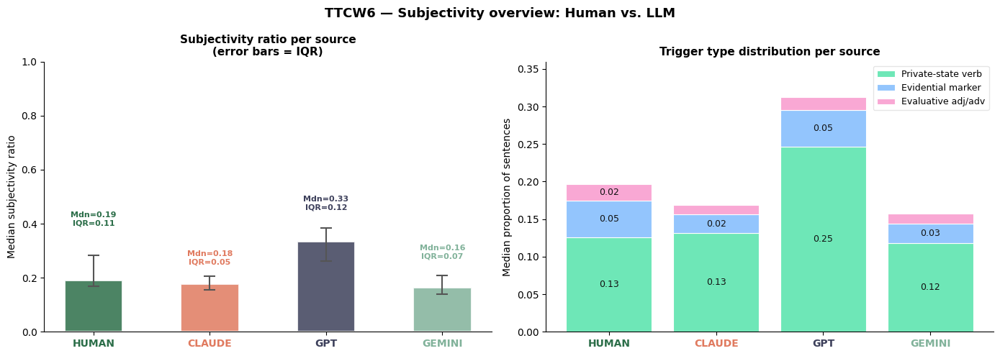

Saved: ttcw6_subjectivity_overview.png


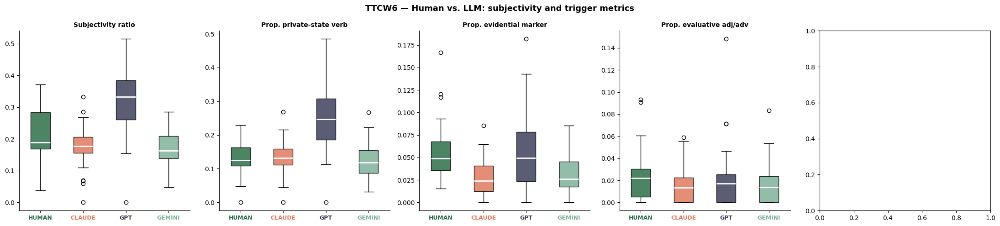

Saved: ttcw6_boxplots.png


In [226]:
# 2. check columns
print(df_pov.columns.tolist())
print(df_pov.groupby("source")[TTCW6_METRICS].median().round(3))

# 2. Aggregrate 
print("\nStep 2: Source-level aggregation...")
df_source = compute_ttcw6_source_metrics(df_pov)
print(df_source.to_string(index=False))

# 3. Run statistics 
print("\nStep 3: Statistical tests...")
test_normality_ttcw6(df_pov)
kruskal_results = test_ttcw6_kruskal(df_pov)
mw_results       = test_ttcw6_mannwhitney(df_pov, kruskal_results)
gpt_comparison   = test_ttcw6_gpt_version_comparison(df_pov, paired=True)
gpt55_vs_human   = test_ttcw6_gpt55_vs_human(df_pov, gpt_comparison)

# 4. Plots
print("\nStep 6: Plots...")
plot_subjectivity_overview(df_pov)
plot_ttcw6_boxplots(df_pov)

<link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@tabler/icons-webfont@latest/tabler-icons.min.css">
<div id="ttcw7" style="font-family:sans-serif; display:flex; align-items:center; margin:0.5rem 0;">
  <div style="background:#E1F5EE; border-radius:25px; padding:6px 20px; display:inline-flex; align-items:center;">
    <h2 style="font-size:20px; font-weight:600; color:#085041; margin:0;">TTCW 7 - Emotional Flexibility</h2>
  </div>
</div>

<p class="prose"><a href="https://arxiv.org/pdf/2309.14556" style="color:#085041;">Chakrabarty et al. (2024)</a> define TTCW7, emotional flexibility, as the <b> balance between interior thoughts and exterior behaviour </b>. The emotional flexibility score will be this balance. </p>

<p class="prose">
  <a href="https://www.researchgate.net/publication/366905094_A_Register-Based_Study_of_Interior_Monologue_in_James_Joyce's_Ulysses" style="color:#085041;">Gast et al. (2023)</a> use a multidimensional register analysis framework (<a href="https://www.cambridge.org/core/books/dimensions-of-register-variation/FF817F2C32378B398C8019090381352E" style="color:#085041;">Biber, 1988</a>) to compute interior monologues. Their key finding is that interior monologue
  has a distinct pattern of surrounding elements that can be detected computationally. This notion will be adapted for the current interior-exterior score.
</p>

<div style="display:grid; grid-template-columns:1fr 1fr; gap:0.75rem; margin:1rem 0;">

  <div class="cat-card" style="margin:0; padding:0.6rem 0.9rem;">
    <p class="section-label" style="margin-bottom:0.4rem;">Interior markers</p>
    <table style="width:100%; border-collapse:collapse; font-size:0.85rem; line-height:1.4;">
      <tr>
        <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
          Private-state verbs
        </td>
        <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
          <code>PRIVATE_STATE_LEMMAS</code> from TTCW6
        </td>
      </tr>
      <tr>
        <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap; background:#E1F5EE;">
          Epistemic modals
        </td>
        <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top; background:#E1F5EE;">
          <i>zou/zouden</i> as markers of inner deliberation
          (<a href="https://www.researchgate.net/publication/366905094_A_Register-Based_Study_of_Interior_Monologue_in_James_Joyce's_Ulysses" style="color:#085041;">Gast et al., 2023</a>). 
        </td>
      </tr>
      <tr>
        <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
          Past perfect
        </td>
        <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
          Memory markers
          (<a href="https://www.researchgate.net/publication/366905094_A_Register-Based_Study_of_Interior_Monologue_in_James_Joyce's_Ulysses" style="color:#085041;">Gast et al., 2023</a>,
          §3.2.2, Table 3)
        </td>
      </tr>
    </table>
  </div>

  <div class="cat-card" style="margin:0; padding:0.6rem 0.9rem;">
    <p class="section-label" style="margin-bottom:0.4rem;">Exterior markers</p>
    <table style="width:100%; border-collapse:collapse; font-size:0.85rem; line-height:1.4;">
      <tr>
        <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
          Dialogue spans
        </td>
        <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
          <code>QUOTE_RE</code>
        </td>
      </tr>
      <tr>
        <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap; background:#E1F5EE;">
          Communicative verbs
        </td>
        <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top; background:#E1F5EE;">
          Over-represented in fictional orality
          (<a href="https://www.researchgate.net/publication/366905094_A_Register-Based_Study_of_Interior_Monologue_in_James_Joyce's_Ulysses" style="color:#085041;">Gast et al., 2023</a>)
        </td>
      </tr>
      <tr>
        <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
          2nd-person pronouns
        </td>
        <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
          Direct address implies co-presence; interior thought rarely
          addresses a <i>you</i> directly
          (<a href="https://www.researchgate.net/publication/366905094_A_Register-Based_Study_of_Interior_Monologue_in_James_Joyce's_Ulysses" style="color:#085041;">Gast et al., 2023</a>;
          <a href="https://www.taylorfrancis.com/books/mono/10.4324/9780203451007/fictions-language-languages-fiction-monika-fludernik" style="color:#085041;">Fludernik, 1993</a>)
        </td>
      </tr>
    </table>
  </div>

</div>

</div>

<div class="nb-info" style="margin:1rem 0;">
  <p class="prose">
    <b>Note.</b> Interior and exterior markers are not mutually exclusive. Priority order (dialogue &gt; private-state verb &gt; other)
    is a design choice that may misclassify mixed sentences
    like <i>'Ze fluisterde dat ze bang was'</i>.
  </p>
</div>

<div class="nb-info" style="margin:1rem 0;">
  <p class="prose">
    <b>Note.</b> <i>Zou/zouden</i> in reported speech may be mis-tagged as deliberative; subordination check reduces but does not
        eliminate this.
  </p>
</div>

<div class="nb-info" style="margin:1rem 0;">
  <p class="prose">
    <b>Note.</b> Alternation rate is sensitive to story length. Shorter stories with few classified sentences produce noisier rates.
  </p>
</div>
</div>

In [132]:
import re
import numpy as np
import pandas as pd
import spacy
import matplotlib.pyplot as plt
 
from itertools import combinations
from scipy.stats import kruskal, mannwhitneyu, shapiro
 
nlp = spacy.load("nl_core_news_lg")

QUOTE_RE = re.compile(
    r'"[^"]{2,}"|„[^"]{2,}"|\u2018[^\u2019]{2,}\u2019|\u201c[^\u201d]{2,}\u201d',
    re.DOTALL,
)
SOURCES = ["human", "claude", "gpt", "gemini"]
 
TTCW7_METRICS = [
    "interior_ratio",
    "exterior_ratio",
    "balance_score",
    "alternation_rate",
]

# Epistemic modals in deliberative use zou/zouden as markers of inner deliberation and counterfactual thought (Gast et al., 2023).
# Excluded when subordinated to a reporting verb (e.g. 'hij zei dat ze zou komen') via _is_deliberative_modal() check below.
DELIBERATIVE_MODALS = {"zou", "zouden"}
 
COMMUNICATIVE_VERBS = {
    "zeggen", "vertellen", "roepen", "fluisteren", "antwoorden",
    "vragen", "mompelen", "schreeuwen", "uitroepen", "mededelen",
    "verklaren", "beweren", "opmerken", "reageren", "spreken",
    "praten", "converseren", "repliceren", "interrumperen",
    "onderbreken", "toevoegen", "herhalen", "bevestigen", "ontkennen",
}
 
SECOND_PERSON_PRONOUNS = {
    "jij", "je", "jou", "jouw", "u", "uzelf", "jezelf",
}

In [133]:
def _is_deliberative_modal(token) -> bool:
# Returns True if zou/zouden is used in deliberative/ counterfactual sense (interior). 
# Returns False if subordinated to a reporting/communicative verb (reported speech context: exterior).
    if token.lemma_.lower() not in DELIBERATIVE_MODALS:
        return False
    # walk up the dependency tree
    t = token
    while t.head != t:
        t = t.head
        if t.lemma_.lower() in COMMUNICATIVE_VERBS:
            return False  # reported speech — not deliberative
    return True

In [134]:
def _has_past_perfect(sent) -> bool:
# Detects hebben/zijn + past participle (voltooid verleden tijd). Used as memory marker following Gast et al. (2023).
    tokens = list(sent)
    auxiliaries = {"hebben", "zijn"}
    has_aux = any(
        t.lemma_.lower() in auxiliaries
        and t.pos_ in {"VERB", "AUX"}
        for t in tokens
    )
    has_participle = any(
        "Part" in t.morph.get("VerbForm")
        for t in tokens
    )
    return has_aux and has_participle

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Emotional flexibility · Interior & exterior markers</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  1. Sentence-level marker detection
</h3>
<p class="prose">
  Classifies a single sentence as <code>interior</code>, <code>exterior</code>, or
  <code>neutral</code> based on the presence of interior and exterior markers.
  Following <a href="https://www.researchgate.net/publication/366905094_A_Register-Based_Study_of_Interior_Monologue_in_James_Joyce's_Ulysses" style="color:#085041;">Gast et al. (2023)</a>,
  passages are assigned to a mode rather than accumulating token counts.
  If both interior and exterior markers are present, the stronger signal
  takes precedence: dialogue span &gt; private-state verb &gt;
  communicative verb &gt; epistemic modal &gt; second-person pronoun.
  If neither is present, the sentence is classified as <code>neutral</code>.
</p>

In [135]:
def classify_sentence(sent, sent_text: str) -> str:
    tokens = list(sent)
 
    # ── exterior signals ──────────────────────────────
    has_dialogue    = bool(QUOTE_RE.search(sent_text))
    has_comm_verb   = any(
        t.lemma_.lower() in COMMUNICATIVE_VERBS for t in tokens
    )
    has_2nd_pronoun = any(
        t.text.lower() in SECOND_PERSON_PRONOUNS for t in tokens
    )
 
    # ── interior signals ──────────────────────────────
    has_ps_verb      = any(
        t.lemma_.lower() in PRIVATE_STATE_LEMMAS for t in tokens
    )
    has_past_perfect = _has_past_perfect(sent)
    has_delib_modal  = any(
        _is_deliberative_modal(t) for t in tokens
    )
 
    n_interior = sum([has_ps_verb, has_past_perfect, has_delib_modal])
    n_exterior = sum([has_dialogue, has_comm_verb, has_2nd_pronoun])
 
    if n_interior == 0 and n_exterior == 0:
        return "neutral"
 
    # dialogue is the strongest exterior signal — always wins
    if has_dialogue:
        return "exterior"
 
    # private-state verb is the strongest interior signal
    if has_ps_verb:
        return "interior"
 
    # majority vote for remaining signals
    if n_interior > n_exterior:
        return "interior"
    elif n_exterior > n_interior:
        return "exterior"
    else:
        # tie: communicative verb beats past perfect and modal
        if has_comm_verb:
            return "exterior"
        return "interior"

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Emotional flexibility · Interior & exterior markers</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  2. Story-level metric computation
</h3>
<p class="prose">
  Each sentence has been classified as <code>interior</code>, <code>exterior</code>, or
  <code>neutral</code>. The following metrics are computed per story:
</p>

<div class="cat-card" style="margin:0.5rem 0; padding:0.6rem 0.9rem;">
  <table style="width:100%; border-collapse:collapse; font-size:0.85rem; line-height:1.4;">
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>n_interior</code>
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
        Raw count of interior sentences
      </td>
    </tr>
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>n_exterior</code>
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
        Raw count of exterior sentences
      </td>
    </tr>
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>n_neutral</code>
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
        Raw count of neutral sentences. This is reported separately to indicate how much of each story falls outside the classification. 
      </td>
    </tr>
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>interior_ratio</code>
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
        Proportion of non-neutral sentences classified as interior. Neutral sentences are excluded deliberately (descriptive sentences
        with no mode markers should not dilute the interior/exterior signal).
      </td>
    </tr>
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>exterior_ratio</code>
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
        Proportion of non-neutral sentences classified as exterior 
      </td>
    </tr>
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>balance_score</code>
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
        <code>1 − |interior_ratio − 0.5| × 2</code>:  1.0 = perfect balance, 0.0 = fully dominated by one mode.
        The priority order means dialogue always wins over private-state
        verbs: a sentence like <i>'Ze dacht: "ik wil weg"'</i> is
        classified as <i>exterior</i>, which is the correct call: it is
        the quoted content that makes it exterior in
        <a href="https://www.researchgate.net/publication/366905094_A_Register-Based_Study_of_Interior_Monologue_in_James_Joyce's_Ulysses" style="color:#085041;">Gast et al.'s (2023)</a>
      </td>
    </tr>
  </table>
</div>

In [136]:
def compute_ttcw7_metrics(text: str) -> dict:
    """
    Classifies each sentence and computes:
        interior_ratio  — proportion of classified sentences
                          that are interior
        exterior_ratio  — proportion of classified sentences
                          that are exterior
        balance_score   — 1 - |interior_ratio - 0.5| * 2
                          (1.0 = perfect balance)
        alternation_rate— proportion of adjacent classified
                          sentence pairs where mode switches.
                          Measures dynamic balance / rhythm.
                          Grounded in Balossi (2014) and
                          Gast et al. (2023).
 
    Neutral sentences are excluded from ratio calculation:
    purely descriptive sentences with no mode markers should
    not dilute the interior/exterior signal.
    """
    doc    = nlp(text)
    sents  = list(doc.sents)
    labels = []
 
    for sent in sents:
        labels.append(classify_sentence(sent, sent.text))
 
    n_interior = labels.count("interior")
    n_exterior = labels.count("exterior")
    n_neutral  = labels.count("neutral")
    n_classified = n_interior + n_exterior
 
    if n_classified == 0:
        return {
            "n_interior":      0,
            "n_exterior":      0,
            "n_neutral":       n_neutral,
            "interior_ratio":  np.nan,
            "exterior_ratio":  np.nan,
            "balance_score":   np.nan,
            "alternation_rate": np.nan,
        }
 
    interior_ratio = round(n_interior / n_classified, 4)
    exterior_ratio = round(n_exterior / n_classified, 4)
    balance_score  = round(1 - abs(interior_ratio - 0.5) * 2, 4)
 
    # alternation rate: proportion of adjacent classified pairs
    # where mode switches (interior → exterior or vice versa)
    classified_labels = [l for l in labels if l != "neutral"]
    if len(classified_labels) < 2:
        alternation_rate = np.nan
    else:
        switches = sum(
            1 for a, b in zip(classified_labels, classified_labels[1:])
            if a != b
        )
        alternation_rate = round(switches / (len(classified_labels) - 1), 4)
 
    return {
        "n_interior":       n_interior,
        "n_exterior":       n_exterior,
        "n_neutral":        n_neutral,
        "interior_ratio":   interior_ratio,
        "exterior_ratio":   exterior_ratio,
        "balance_score":    balance_score,
        "alternation_rate": alternation_rate,
    }

In [137]:
def compute_ttcw7(df: pd.DataFrame) -> pd.DataFrame:
    """
    Computes TTCW7 metrics per story.
    Requires df to have: story_id, source, clean_text.
    """
    rows = []
    for _, row in df.iterrows():
        metrics = compute_ttcw7_metrics(row["clean_text"])
        rows.append({
            "story_id": row["story_id"],
            "source":   row["source"],
            **metrics,
        })
    return (
        pd.DataFrame(rows)
        .sort_values(["story_id", "source"])
        .reset_index(drop=True)
    )

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Emotional flexibility · Aggregate results</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  3. Aggregating results per source 
</h3>

<p class="prose">
  To make a comparison between the four sources inside the dataset, each perspective metric (subjectivity ratio + trigger proportions) will be put together inside one aggregrated result for each source. This is done by taking the <b>median</b><sup><a href="#fn-ttcw4-median" style="color:#085041;">*</a></sup> across all stories  and using that for a typical perspective-distribution-profile per source. This process is carried out by <code>compute_ttcw7_source_metrics()</code> 
</p>
<hr>

<div id="fn7" style="font-size:12px; color:#666;">
  <sup>*</sup> The median is calculated instead of the mean since the data is not normally distributed (see section 4)
  <a href="#fn1-ref">↩</a>
</div>

In [138]:
def compute_ttcw7_source_metrics(df_ttcw7: pd.DataFrame) -> pd.DataFrame:
    return (
        df_ttcw7
        .groupby("source")[TTCW7_METRICS]
        .agg(["median", lambda x: x.quantile(0.75) - x.quantile(0.25)])
        .round(4)
        .reset_index()
    )

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Emotional Flexibility · Statistical Analysis</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  4. Statistical testing
</h3>
<p class="prose">Three statistical tests will be run in sequence:</p>
<div class="grid-2" style="margin:1rem 0 1.5rem 0;">
  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#2C6E49;">1. Shapiro–Wilk</strong>
      <span class="cat-badge" style="background:#E6F4EA;color:#1B5E3B;">Normality</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
      To test whether the results are normally distributed within each source, the Shapiro-Wilk test will be applied to each subset. Shapiro-Wilk tests work when the number of observations is > 3 and < 50. Here, the test runs per group, so it's testing normality on n=36 per source.
    </p>
  </div>
  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#2C6E49;">2. Kruskal–Wallis</strong>
      <span class="cat-badge" style="background:#E6F4EA;color:#1B5E3B;">Group comparison</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
      The Shapiro–Wilk test indicated that normality assumptions were violated for most source–metric combinations. The Kruskal-Wallis test is chosen here since it is a <b>non-parametric test</b> of whether the <b>median</b> differences across sources exceed what would be expected by chance.
    </p>
  </div>
  <div class="cat-card" style="grid-column: 1 / -1;">
    <div class="cat-header">
      <strong style="color:#2C6E49;">3. Mann–Whitney U</strong>
      <span class="cat-badge" style="background:#E6F4EA;color:#1B5E3B;">Pairwise · Bonferroni</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
      Only runs when the Kruskal-Wallis gives significant results. The Mann-Whitney U test is used to compare each LLM model to the human writers. This test is chosen since these are pairwise comparisons (human vs. each LLM individually). Bonferroni correction adjusts for the number of simultaneous comparisons (n metrics × 3 LLM sources) to reduce the risk of false positives. Alongside each p-value, <b>Cliff's delta</b> is reported as an effect size.
    </p>
  </div>
</div>

In [139]:
def test_normality_ttcw7(df_ttcw7: pd.DataFrame):
    print("Shapiro-Wilk normality tests — TTCW7 metrics")
    print(f"{'Metric':<20} {'Source':<10} {'W':>8} {'p':>10}  normal?")
    print("─" * 55)
    for metric in TTCW7_METRICS:
        for source in SOURCES:
            vals = df_ttcw7[df_ttcw7["source"] == source][metric].dropna()
            if len(vals) < 3:
                continue
            stat, p = shapiro(vals)
            print(f"{metric:<20} {source:<10} {stat:>8.4f} {p:>10.4f}  "
                  f"{'yes' if p > 0.05 else 'NO'}")
        print()

In [140]:
def test_ttcw7_kruskal(df_ttcw7: pd.DataFrame) -> pd.DataFrame:
    rows = []
    print("Kruskal-Wallis — TTCW7 metrics across sources")
    print(f"{'Metric':<20} {'H':>8} {'p':>10}  {'high':<10} {'low':<10}  sig?")
    print("─" * 60)
    for metric in TTCW7_METRICS:
        groups  = [df_ttcw7[df_ttcw7["source"] == s][metric].dropna().values
                   for s in SOURCES]
        if any(len(g) < 2 for g in groups):
            print(f"{metric:<20} {'n/a':>8} {'n/a':>10}")
            rows.append({"metric": metric, "H": np.nan, "p": np.nan,
                         "significant": False, "highest": None, "lowest": None})
            continue
        stat, p  = kruskal(*groups)
        sig      = p < 0.05
        medians  = {s: df_ttcw7[df_ttcw7["source"] == s][metric].median()
                    for s in SOURCES}
        highest  = max(medians, key=medians.get)
        lowest   = min(medians, key=medians.get)
        print(f"{metric:<20} {stat:>8.4f} {p:>10.4f}  {highest:<10} {lowest:<10}  "
              f"{'*' if sig else ''}")
        rows.append({"metric": metric, "H": stat, "p": p,
                     "significant": sig, "highest": highest, "lowest": lowest})
    return pd.DataFrame(rows)

In [141]:
def cliffs_delta(a, b):
    a, b = np.asarray(a), np.asarray(b)
    greater = sum(x > y for x in a for y in b)
    less    = sum(x < y for x in a for y in b)
    return (greater - less) / (len(a) * len(b))


def interpret_effect(d):
    d = abs(d)
    if d < 0.147: return "negligible"
    if d < 0.33:  return "small"
    if d < 0.474: return "medium"
    return "large"

def test_ttcw7_mannwhitney(df_ttcw7: pd.DataFrame, kruskal_results: pd.DataFrame) -> pd.DataFrame:
    significant_metrics = kruskal_results[kruskal_results["significant"]]["metric"].tolist()

    if not significant_metrics:
        print("No significant Kruskal-Wallis results.")
        return pd.DataFrame()

    llm_sources   = ["claude", "gpt", "gemini"]
    n_comparisons = len(llm_sources) * len(significant_metrics)
    rows = []

    for metric in significant_metrics:
        print(f"\n{'═'*100}")
        print(f"  {metric.upper()}")
        print(f"{'═'*100}")
        print(f"\n  {'Comparison':<22} {'U':>8} {'p_raw':>10} {'p_corr':>10}  "
              f"{'delta':>8} {'(size)':<12} {'Direction':<25}  Sig?")
        print(f"  {'─'*105}")

        human_vals = df_ttcw7[df_ttcw7["source"] == "human"][metric].dropna().values

        for llm in llm_sources:
            llm_vals = df_ttcw7[df_ttcw7["source"] == llm][metric].dropna().values
            if len(human_vals) < 2 or len(llm_vals) < 2:
                continue
            u, p      = mannwhitneyu(human_vals, llm_vals, alternative="two-sided")
            delta     = cliffs_delta(human_vals, llm_vals)
            label     = interpret_effect(delta)
            p_corr    = min(p * n_comparisons, 1.0)
            direction = f"human {'>' if np.median(human_vals) > np.median(llm_vals) else '<'} {llm}"
            sig       = p_corr < 0.05
            print(f"  {'human vs ' + llm:<22} {u:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
                  f"{delta:>8.3f} ({label:<10}) {direction:<25}  {'*' if sig else ''}")
            rows.append({"metric": metric, "vs": llm, "U": u, "p": p, "p_corr": p_corr,
                         "cliffs_delta": delta, "effect_label": label,
                         "direction": direction, "significant": sig})

    return pd.DataFrame(rows)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Emotional Flexibility · GPT-4o vs. GPT-5.5</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  5. Direct model-version comparison
</h3>
<p class="prose">
  To find if there is a significant difference between GPT-4o and GPT-5.5 on the interior/exterior balance, a Wilcoxon signed-rank test will be run separately. It asks specifically whether <b>upgrading the model</b> changes the balance between interior thought and exterior behaviour.
</p>
<div class="nb-info" style="margin:1rem 0;">
  <p class="prose" style="margin:0;">
    Each GPT-4o and GPT-5.5 story comes from the <b>same prompt</b> (matched by <code>story_id</code>), so a <b>paired Wilcoxon signed-rank test</b> is used instead of the unpaired Mann-Whitney U applied above. Pairing controls for prompt-to-prompt variance and gives more power at the same n=36. Bonferroni correction is applied across the 4 TTCW7 metrics within this test only, separate from the human-vs-LLM correction above. Alongside each p-value, the <b>matched rank-biserial correlation</b> is reported as an effect size, to show the magnitude of any shift, not just its significance.
  </p>
</div>
<p class="prose">
  Only when this test returns a significant result for a given metric, a follow-up comparison is run: GPT-5.5 vs. human on that metric only. This checks whether the model-version shift moved GPT-5.5 closer to or further from human-like emotional flexibility.
</p>

In [142]:
def matched_rank_biserial(a, b):
    diffs = np.array(a) - np.array(b)
    diffs = diffs[diffs != 0]
    ranks = rankdata(np.abs(diffs))
    pos_sum = ranks[diffs > 0].sum()
    neg_sum = ranks[diffs < 0].sum()
    return (pos_sum - neg_sum) / (pos_sum + neg_sum)

def test_ttcw7_gpt_version_comparison(df_ttcw7: pd.DataFrame, paired: bool = True) -> pd.DataFrame:
    gpt4o = df_ttcw7[df_ttcw7["source"] == "gpt"].set_index("story_id")
    gpt55 = df_ttcw7[df_ttcw7["source"] == "gpt_5.5"].set_index("story_id")

    test_name = "paired Wilcoxon signed-rank" if paired else "unpaired Mann-Whitney U"
    n_comparisons = len(TTCW7_METRICS)

    print("\nGPT-4o vs. GPT-5.5 — direct model comparison (TTCW7 metrics)")
    print(f"({test_name}, Bonferroni corrected across {n_comparisons} metrics)")
    print(f"{'Metric':<20} {'stat':>8} {'p_raw':>10} {'p_corr':>10}  "
          f"{'effect':>8} {'(size)':<12} {'direction':<20}  sig?")
    print("─" * 95)

    rows = []
    for metric in TTCW7_METRICS:
        if paired:
            common_ids = gpt4o.index.intersection(gpt55.index)
            a = gpt4o.loc[common_ids, metric].dropna()
            b = gpt55.loc[common_ids, metric].dropna()
            common_ids = a.index.intersection(b.index)
            a, b = a.loc[common_ids], b.loc[common_ids]
            if len(a) < 1:
                continue
            stat, p = wilcoxon(a.values, b.values)
            effect = matched_rank_biserial(a.values, b.values)
        else:
            a = gpt4o[metric].dropna()
            b = gpt55[metric].dropna()
            if len(a) < 1 or len(b) < 1:
                continue
            stat, p = mannwhitneyu(a.values, b.values, alternative="two-sided")
            effect = cliffs_delta(a.values, b.values)

        p_corr       = min(p * n_comparisons, 1.0)
        direction    = f"gpt {'>' if a.median() > b.median() else '<'} gpt_5.5"
        sig          = p_corr < 0.05
        effect_label = interpret_effect(effect)

        print(f"{metric:<20} {stat:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
              f"{effect:>8.3f} ({effect_label:<10}) {direction:<20}  {'*' if sig else ''}")
        rows.append({"metric": metric, "stat": stat, "p": p, "p_corr": p_corr,
                     "significant": sig, "direction": direction,
                     "effect_size": effect, "effect_label": effect_label})

    return pd.DataFrame(rows)

In [143]:
def test_ttcw7_gpt55_vs_human(df_ttcw7: pd.DataFrame, gpt_comparison: pd.DataFrame) -> pd.DataFrame:
    significant_metrics = gpt_comparison[gpt_comparison["significant"]]["metric"].tolist()

    if not significant_metrics:
        print("No significant GPT-4o vs. GPT-5.5 differences — GPT-5.5 vs. human not run.")
        return pd.DataFrame()

    human = df_ttcw7[df_ttcw7["source"] == "human"]
    gpt55 = df_ttcw7[df_ttcw7["source"] == "gpt_5.5"]
    n_comparisons = len(significant_metrics)

    print(f"\nGPT-5.5 vs. Human — TTCW7 metrics "
          f"(only metrics where GPT-4o→GPT-5.5 shifted: {', '.join(significant_metrics)})")
    print(f"{'Metric':<20} {'U':>8} {'p_raw':>10} {'p_corr':>10}  "
          f"{'delta':>8} {'(size)':<12} {'direction':<20}  sig?")
    print("─" * 95)

    rows = []
    for metric in significant_metrics:
        h = human[metric].dropna().values
        g = gpt55[metric].dropna().values
        u, p   = mannwhitneyu(h, g, alternative="two-sided")
        delta  = cliffs_delta(h, g)
        label  = interpret_effect(delta)
        p_corr = min(p * n_comparisons, 1.0)
        sig    = p_corr < 0.05
        direction = f"human {'>' if np.median(h) > np.median(g) else '<'} gpt_5.5"

        print(f"{metric:<20} {u:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
              f"{delta:>8.3f} ({label:<10}) {direction:<20}  {'*' if sig else ''}")
        rows.append({"metric": metric, "U": u, "p": p, "p_corr": p_corr,
                     "cliffs_delta": delta, "effect_label": label,
                     "direction": direction, "significant": sig})

    return pd.DataFrame(rows)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label"> Emotional flexibility · Visualization</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  Visualization
</h3>
<p class="prose">To give a clear overview of the data, 3 plots will be generated:</p>

<div class="cat-card" style="margin:0.5rem 0; padding:0.6rem 0.9rem;">
  <table style="width:100%; border-collapse:collapse; font-size:0.85rem; line-height:1.4;">
    <tr style="background:#f9f9f9;">
      <th style="padding:0.3rem 0.5rem 0.3rem 0.3rem; text-align:left; font-weight:600; color:#085041; white-space:nowrap;">
        Function
      </th>
      <th style="padding:0.3rem 0 0.3rem 0.5rem; text-align:left; font-weight:600; color:#085041;">
        Output
      </th>
    </tr>
    <tr>
      <td style="padding:0.4rem 0.5rem 0.4rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>plot_ttcw7_boxplots()</code>
      </td>
      <td style="padding:0.4rem 0 0.4rem 0.5rem; vertical-align:top;">
        Boxplots per metric grouped by source — direct visual
        comparison of distributions across human and LLM writers
      </td>
    </tr>
    <tr>
      <td style="padding:0.4rem 0.5rem 0.4rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>plot_ttcw7_interior_exterior()</code>
      </td>
      <td style="padding:0.4rem 0 0.4rem 0.5rem; vertical-align:top;">
        Grouped bar chart — median interior vs exterior ratio per
        source with IQR error bars. Dashed line at 0.5 marks perfect
        balance.
      </td>
    </tr>
    <tr>
      <td style="padding:0.4rem 0.5rem 0.4rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>plot_ttcw7_balance()</code>
      </td>
      <td style="padding:0.4rem 0 0.4rem 0.5rem; vertical-align:top;">
        Bar chart — median balance score per source with IQR error bars
      </td>
    </tr>
  </table>
</div>
<br>

In [144]:
def plot_ttcw7_boxplots(df_ttcw7: pd.DataFrame):
    metrics = {
        "interior_ratio":   "Interior ratio",
        "exterior_ratio":   "Exterior ratio",
        "balance_score":    "Balance score",
        "alternation_rate": "Alternation rate",
    }
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    for ax, (col, label) in zip(axes, metrics.items()):
        data   = [df_ttcw7[df_ttcw7["source"] == s][col].dropna().values for s in SOURCES]
        colors = [COLORS[s] for s in SOURCES]
        bp     = ax.boxplot(data, patch_artist=True,
                            medianprops={"color": "white", "linewidth": 2})
        for patch, color in zip(bp["boxes"], colors):
            patch.set_facecolor(color)
            patch.set_alpha(0.85)
        ax.set_xticks(range(1, len(SOURCES) + 1))
        ax.set_xticklabels([s.upper() for s in SOURCES], fontsize=9, fontweight="bold")
        for tick, color in zip(ax.get_xticklabels(), colors):
            tick.set_color(color)
        ax.set_title(label, fontsize=10, fontweight="bold")
        ax.spines[["top", "right"]].set_visible(False)
    plt.tight_layout()
    plt.savefig("ttcw7_boxplots.png", dpi=150, bbox_inches="tight")
    plt.show()

In [145]:
def plot_ttcw7_interior_exterior(df_ttcw7: pd.DataFrame):
    fig, ax = plt.subplots(figsize=(7, 5))
    colors  = [COLORS[s] for s in SOURCES]

    med_int = [df_ttcw7[df_ttcw7["source"] == s]["interior_ratio"].median()
               for s in SOURCES]
    med_ext = [df_ttcw7[df_ttcw7["source"] == s]["exterior_ratio"].median()
               for s in SOURCES]
    iqr_int = [df_ttcw7[df_ttcw7["source"] == s]["interior_ratio"].quantile(0.75) -
               df_ttcw7[df_ttcw7["source"] == s]["interior_ratio"].quantile(0.25)
               for s in SOURCES]
    iqr_ext = [df_ttcw7[df_ttcw7["source"] == s]["exterior_ratio"].quantile(0.75) -
               df_ttcw7[df_ttcw7["source"] == s]["exterior_ratio"].quantile(0.25)
               for s in SOURCES]

    x     = np.arange(len(SOURCES))
    width = 0.35

    bars_int = ax.bar(x - width / 2, med_int, width, label="Interior",
                      color=colors, alpha=0.85, edgecolor="white")
    bars_ext = ax.bar(x + width / 2, med_ext, width, label="Exterior",
                      color=colors, alpha=0.35, edgecolor="white")

    ax.errorbar(x - width / 2, med_int,
                yerr=[np.zeros(len(iqr_int)), iqr_int],
                fmt="none", color="#555", capsize=4, linewidth=1.2)
    ax.errorbar(x + width / 2, med_ext,
                yerr=[np.zeros(len(iqr_ext)), iqr_ext],
                fmt="none", color="#555", capsize=4, linewidth=1.2)

    for bar in list(bars_int) + list(bars_ext):
        ax.text(bar.get_x() + bar.get_width() / 2,
                bar.get_height() + 0.01,
                f"{bar.get_height():.2f}",
                ha="center", va="bottom", fontsize=8)

    ax.axhline(0.5, color="#aaa", linewidth=1, linestyle="--", alpha=0.7)
    ax.set_xticks(x)
    ax.set_xticklabels([s.upper() for s in SOURCES],
                       fontsize=9, fontweight="bold")
    for tick, color in zip(ax.get_xticklabels(), colors):
        tick.set_color(color)
    ax.set_ylim(0, 1)
    ax.set_ylabel("Median ratio", fontsize=10)
    ax.set_title("TTCW7 — Interior vs. exterior ratio\n"
                 "(darker = interior, error bars = IQR)",
                 fontsize=11, fontweight="bold")
    ax.legend(fontsize=9, framealpha=0.5)
    ax.spines[["top", "right"]].set_visible(False)

    plt.tight_layout()
    plt.savefig("ttcw7_interior_exterior.png", dpi=150, bbox_inches="tight")
    plt.show()
    print("Saved: ttcw7_interior_exterior.png")

In [146]:
def plot_ttcw7_balance(df_ttcw7: pd.DataFrame):
    fig, ax = plt.subplots(figsize=(7, 5))
    colors  = [COLORS[s] for s in SOURCES]

    medians   = np.array([df_ttcw7[df_ttcw7["source"] == s]["balance_score"].median()
                          for s in SOURCES])
    q1s       = np.array([df_ttcw7[df_ttcw7["source"] == s]["balance_score"].quantile(0.25)
                          for s in SOURCES])
    q3s       = np.array([df_ttcw7[df_ttcw7["source"] == s]["balance_score"].quantile(0.75)
                          for s in SOURCES])
    lower_err = medians - q1s
    upper_err = q3s - medians

    ax.bar(range(len(SOURCES)), medians, color=colors,
           alpha=0.85, edgecolor="white", width=0.5)
    ax.errorbar(range(len(SOURCES)), medians,
                yerr=[lower_err, upper_err],
                fmt="none", color="#555", capsize=6, linewidth=1.5)

    for i, (median, q1, q3, color) in enumerate(zip(medians, q1s, q3s, colors)):
        ax.text(i, q3 + upper_err[i] + 0.01,
                f"Mdn={median:.2f}\nIQR={q3-q1:.2f}",
                ha="center", va="bottom", fontsize=8,
                fontweight="bold", color=color)

    ax.set_xticks(range(len(SOURCES)))
    ax.set_xticklabels([s.upper() for s in SOURCES],
                       fontsize=9, fontweight="bold")
    for tick, color in zip(ax.get_xticklabels(), colors):
        tick.set_color(color)
    ax.set_ylim(0, 1)
    ax.set_ylabel("Median balance score", fontsize=10)
    ax.set_title("TTCW7 — Balance score per source\n"
                 "(1.0 = perfect balance, error bars = IQR)",
                 fontsize=11, fontweight="bold")
    ax.spines[["top", "right"]].set_visible(False)

    plt.tight_layout()
    plt.savefig("ttcw7_balance.png", dpi=150, bbox_inches="tight")
    plt.show()
    print("Saved: ttcw7_balance.png")

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Emotional flexibility · Run the code</p>

<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  Run everything
</h3>

In [160]:
print("Step 1: Computing TTCW7 metrics...")
df_ttcw7 = compute_ttcw7(df)
print(df_ttcw7.groupby("source")[TTCW7_METRICS].median().round(3))

Step 1: Computing TTCW7 metrics...
         interior_ratio  exterior_ratio  balance_score  alternation_rate
source                                                                  
claude            0.417           0.583          0.706             0.403
gemini            0.704           0.296          0.500             0.359
gpt               0.667           0.333          0.609             0.364
gpt_5.5           0.466           0.534          0.725             0.390
human             0.640           0.360          0.692             0.378



Step 2: Source-level aggregation...
 source interior_ratio            exterior_ratio            balance_score            alternation_rate           
                median <lambda_0>         median <lambda_0>        median <lambda_0>           median <lambda_0>
 claude         0.4166     0.3073         0.5834     0.3074        0.7058     0.2410           0.4029     0.1182
 gemini         0.7037     0.2261         0.2963     0.2261        0.5000     0.4095           0.3591     0.1572
    gpt         0.6667     0.1984         0.3333     0.1984        0.6086     0.3088           0.3636     0.2294
gpt_5.5         0.4660     0.2444         0.5339     0.2444        0.7247     0.3698           0.3902     0.1317
  human         0.6397     0.2398         0.3603     0.2398        0.6915     0.3488           0.3775     0.2426

Step 3: Statistical tests...
Shapiro-Wilk normality tests — TTCW7 metrics
Metric               Source            W          p  normal?
────────────────────────────────────

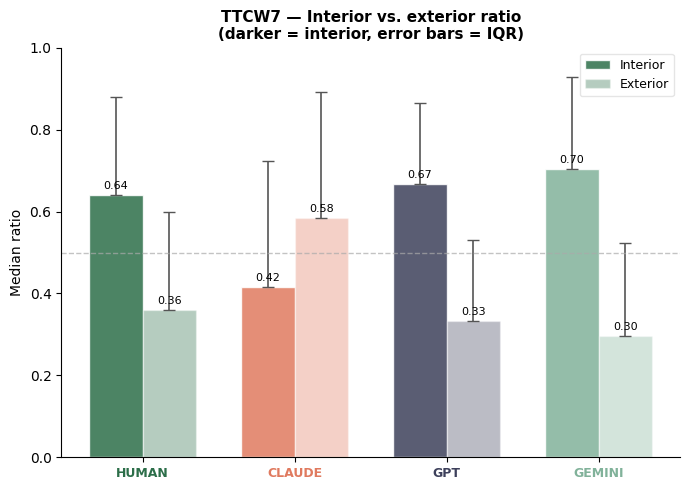

Saved: ttcw7_interior_exterior.png


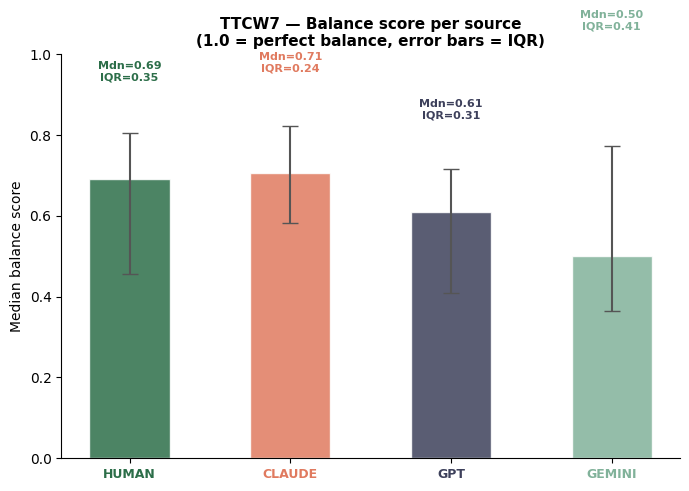

Saved: ttcw7_balance.png


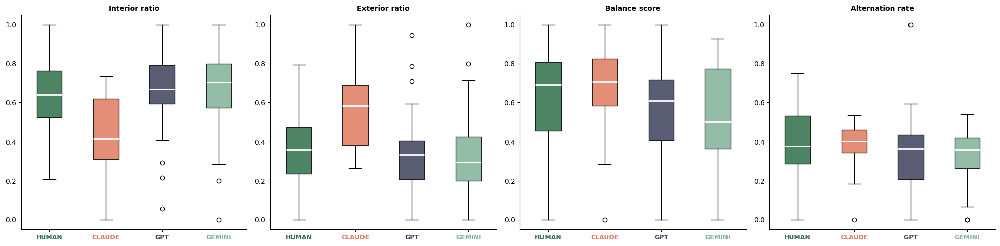

In [161]:
print("\nStep 2: Source-level aggregation...")
df_source = compute_ttcw7_source_metrics(df_ttcw7)
print(df_source.to_string(index=False))

print("\nStep 3: Statistical tests...")
test_normality_ttcw7(df_ttcw7)
kruskal_results = test_ttcw7_kruskal(df_ttcw7)
mw_results       = test_ttcw7_mannwhitney(df_ttcw7, kruskal_results)
gpt_comparison   = test_ttcw7_gpt_version_comparison(df_ttcw7, paired=True)
gpt55_vs_human   = test_ttcw7_gpt55_vs_human(df_ttcw7, gpt_comparison)

print("\nStep 4: Plots...")
plot_ttcw7_interior_exterior(df_ttcw7)
plot_ttcw7_balance(df_ttcw7)
plot_ttcw7_boxplots(df_ttcw7)

<link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@tabler/icons-webfont@latest/tabler-icons.min.css">
<div id="ttcw8" style="font-family:sans-serif; display:flex; align-items:center; margin:0.5rem 0;">
  <div style="background:#E1F5EE; border-radius:25px; padding:6px 20px; display:inline-flex; align-items:center;">
    <h2 style="font-size:20px; font-weight:600; color:#085041; margin:0;">TTCW 8 - Structural Flexibility</h2>
  </div>
</div>

<p class="prose">
  <a href="https://arxiv.org/pdf/2309.14556" style="color:#085041;">Chakrabarty et al. (2024)</a> describe TTCW8 as the ability to make interesting turns inside a story that still make sense within the established context (the story world, characters and themes). Based on this notion, TTCW8 requires measuring two simultaneous properties:<b>suprise</b>and <b>appropriateness</b>. 
</p>

<p class="prose">
  <a href="https://aclanthology.org/2020.acl-main.161.pdf" style="color:#085041;">Wilmot & Keller (2020)</a> They define that suprise as 'a backward-looking measure of how unexpected the current state is given the story so far' (<a href="https://aclanthology.org/2020.acl-main.161.pdf" style="color:#085041;">Wilmot & Keller, 2020; p. 1</a>). They operationalize this the distance between the current sentence embedding and the previous one, as described before in <a href="https://ideas.repec.org/a/ucp/jpolec/doi10.1086-677350.html" style="color:#085041;">Ely et al. (2015)</a>. From this suprise-measure, several interesting things can be calculated:

<div class="cat-card" style="margin:0.5rem 0; padding:0.6rem 0.9rem;">
  <table style="width:100%; border-collapse:collapse; font-size:0.85rem; line-height:1.4;">
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>surprise_variance</code>
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
        How much the surprise level fluctuates across the story. A
        structurally flexible story has peaks and valleys rather than
        uniform surprise throughout.
      </td>
    </tr>
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>surprise_peak_pos</code>
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
        Where in the narrative the highest surprise moment occurs. A
        surprise peak in the final quarter feels more appropriate than
        one in the opening.
      </td>
    </tr>
  </table>
</div>

<p class="prose"><a href="https://www.researchgate.net/publication/2647371_The_Measurement_of_Textual_Coherence_with_Latent_Semantic_Analysis" style="color:#085041;"> Foltz, Kintsch & Landauer (1998)</a> demonstrate that local coherence between adjacent text segments can be measured as the cosine similarity between their semantic vector representations, using <b>Latent Semantic Analysis </b> (LSA). Higher cosine similarity between adjacent segments correlates with human judgements about coherence. This principle is exactly what the construct of appropriateness requires: a high-surprise sentence that remains semantically grounded in the preceding context. </p>

<p class="prose">
  <code>surprise_variance</code> and <code>mean_appropriateness</code> are
  therefore reported as two independent metrics. A story requires both:
  sufficient variance for interesting turns to occur, and sufficient
  appropriateness for those turns to feel earned.
</p>

In [245]:
import numpy as np
import pandas as pd
import spacy
import matplotlib.pyplot as plt
from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity
from scipy.stats import kruskal, mannwhitneyu, shapiro
from tqdm import tqdm

nlp            = spacy.load("nl_core_news_lg")
sentence_model = SentenceTransformer(
    "sentence-transformers/paraphrase-multilingual-mpnet-base-v2"
)

#constants 
SURPRISE_THRESHOLD_PERCENTILE = 75  # top 25% sentences by surprise
CONTEXT_WINDOW = 5  # preceding sentences for context, following Foltz et al. (1998)

TTCW8_METRICS = [
    "surprise_variance",
    "surprise_peak_pos",
    "mean_appropriateness",
]

SOURCES = ["human", "claude", "gpt", "gemini"]

Loading weights: 100%|██████████████████████| 199/199 [00:00<00:00, 4854.49it/s]


<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Structural flexibility · Implementation</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  1. Sentence embedding
</h3>

<p class="prose">
  All stories are encoded into sentence-level embeddings using
  <code>paraphrase-multilingual-mpnet-base-v2</code>
  (<a href="https://arxiv.org/abs/1908.10084" style="color:#085041;">Reimers &amp; Gurevych, 2019</a>),
  a multilingual sentence transformer trained on paraphrase data and
  sensitive to semantic similarity rather than surface lexical overlap.
  Each story is stored as a dict keyed by
  <code>(story_id, source)</code>, containing the embedding matrix,
  sentence objects, and raw sentence texts.
</p>

In [246]:
def encode_stories(df: pd.DataFrame) -> dict:
    story_embeddings = {}

    for _, row in tqdm(df.iterrows(), total=len(df), desc="Encoding"):
        key        = (row["story_id"], row["source"])
        doc        = nlp(row["clean_text"])
        sents      = list(doc.sents)
        sent_texts = [s.text.strip() for s in sents]

        if len(sents) < 4:
            story_embeddings[key] = None
            continue

        embeddings = sentence_model.encode(
            sent_texts,
            show_progress_bar=False,
            batch_size=32,
        )
        story_embeddings[key] = {
            "embeddings": embeddings,
            "sents":      sents,
            "sent_texts": sent_texts,
        }

    return story_embeddings


<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Structural flexibility · Implementation</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  2. Surprise scores
</h3>

<p class="prose">
  Surprise is operationalised as the cosine distance between consecutive
  sentence embeddings, following
  <a href="https://ideas.repec.org/a/ucp/jpolec/doi10.1086-677350.html" style="color:#085041;">Ely et al. (2015)</a>
  and
  <a href="https://aclanthology.org/2020.acl-main.161.pdf" style="color:#085041;">Wilmot &amp; Keller (2020)</a>.
  For each story, this yields a per-sentence surprise signal across the
  narrative arc, from which <code>surprise_variance</code> and
  <code>surprise_peak_pos</code> are derived.
</p>

In [247]:
def compute_surprise_scores(story_embeddings: dict) -> dict:
    story_surprise = {}

    for key, data in story_embeddings.items():
        if data is None:
            story_surprise[key] = None
            continue

        embeddings = data["embeddings"]
        n          = len(embeddings)
        scores     = [0.0]  # first sentence has no predecessor

        for i in range(1, n):
            dist = float(
                1 - cosine_similarity(
                    embeddings[i].reshape(1, -1),
                    embeddings[i - 1].reshape(1, -1),
                )[0][0]
            )
            scores.append(dist)

        story_surprise[key] = np.array(scores)

    return story_surprise

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Structural flexibility · Implementation</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  3. TTCW8 metrics
</h3>

<p class="prose">
  All TTCW8 metrics are computed per story from the surprise signal and
  sentence embeddings. Three metrics are reported independently. 
</p>

<div class="cat-card" style="margin:0.5rem 0; padding:0.6rem 0.9rem;">
  <p class="section-label" style="margin-bottom:0.4rem;">Surprise metrics
  </p>
  <table style="width:100%; border-collapse:collapse; font-size:0.85rem; line-height:1.4;">
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>surprise_variance</code>
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
        Variance of surprise scores across the story
      </td>
    </tr>
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>surprise_peak_pos</code>
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
        Normalised position of highest surprise (0–1)
      </td>
    </tr>
  </table>

  <p class="section-label" style="margin:0.8rem 0 0.4rem 0;">Appropriateness metric
  </p>
  <table style="width:100%; border-collapse:collapse; font-size:0.85rem; line-height:1.4;">
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>mean_appropriateness</code>
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
        Mean cosine similarity between each high-surprise sentence and
        the mean embedding of the five preceding sentences
      </td>
    </tr>
  </table>
</div>

<div class="nb-info" style="margin:1rem 0;">
  <p class="prose">
    <b>Note.</b> <code>surprise_at_resolution</code>,
    <code>surprise_variance_norm</code>, and
    <code>structural_flexibility</code> were considered but dropped.
    The resolution metric overlaps with TTCW4 (narrative ending);
    normalisation is corpus-dependent and adds nothing for
    between-source comparison; the composite averages measures that
    capture distinct constructs and is not theoretically justified.
  </p>
</div>

In [248]:
def compute_ttcw8(
    df:               pd.DataFrame,
    story_embeddings: dict,
    story_surprise:   dict,
) -> pd.DataFrame:

    rows = []

    for _, row in df.iterrows():
        key    = (row["story_id"], row["source"])
        scores = story_surprise.get(key)

        if scores is None:
            rows.append({
                "story_id":             row["story_id"],
                "source":               row["source"],
                "surprise_variance":    np.nan,
                "surprise_peak_pos":    np.nan,
                "mean_appropriateness": np.nan,
            })
            continue

        embeddings = story_embeddings[key]["embeddings"]
        n          = len(scores)

        # surprise variance (Wilmot & Keller, 2020)
        surprise_variance = round(float(np.var(scores, ddof=1)), 4)

        # surprise peak position (Wilmot & Keller, 2020)
        peak_idx          = int(np.argmax(scores))
        surprise_peak_pos = round(peak_idx / (n - 1), 4)

        # appropriateness at surprise peaks (Foltz et al., 1998)
        threshold    = np.percentile(scores, SURPRISE_THRESHOLD_PERCENTILE)
        peak_indices = [
            i for i, s in enumerate(scores)
            if s >= threshold and i >= CONTEXT_WINDOW
        ]

        appropriateness_scores = []
        for i in peak_indices:
            start = max(0, i - CONTEXT_WINDOW)
            context_embedding = np.mean(embeddings[start:i], axis=0)
            sim = float(cosine_similarity(
                    embeddings[i].reshape(1, -1),
                    context_embedding.reshape(1, -1),
            )[0][0])
            appropriateness_scores.append(sim)

        mean_appropriateness = round(
            float(np.mean(appropriateness_scores)), 4
        ) if appropriateness_scores else np.nan

        rows.append({
            "story_id":             row["story_id"],
            "source":               row["source"],
            "surprise_variance":    surprise_variance,
            "surprise_peak_pos":    surprise_peak_pos,
            "mean_appropriateness": mean_appropriateness,
        })

    df_out = (
        pd.DataFrame(rows)
        .sort_values(["story_id", "source"])
        .reset_index(drop=True)
    )

    return df_out

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Structural flexibility · Aggregate results</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  4. Aggregating results per source 
</h3>

<p class="prose">
  To make a comparison between the four sources inside the dataset, each perspective metric (subjectivity ratio + trigger proportions) will be put together inside one aggregrated result for each source. This is done by taking the <b>median</b><sup><a href="#fn-ttcw4-median" style="color:#085041;">*</a></sup>across all stories  and using that for a typical structural flexibility-distribution-profile per source. This process is carried out by <code>compute_ttcw8_source_metrics()</code> 
</p>
<hr>

<div id="fn7" style="font-size:12px; color:#666;">
  <sup>*</sup> The median is calculated instead of the mean since the data is not normally distributed (see section 5)
  <a href="#fn1-ref">↩</a>
</div>

In [249]:
def compute_ttcw8_source_metrics(df_ttcw8: pd.DataFrame) -> pd.DataFrame:
    metrics = [
        "surprise_variance",
        "surprise_peak_pos",
        "mean_appropriateness",
    ]
    return (
        df_ttcw8
        .groupby("source")[metrics]
        .agg(["median", lambda x: x.quantile(0.75) - x.quantile(0.25)])
        .round(4)
        .reset_index()
    )

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Structural Flexibility · Statistical Analysis</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  5. Statistical testing
</h3>
<p class="prose">Three statistical tests will be run in sequence:</p>
<div class="grid-2" style="margin:1rem 0 1.5rem 0;">
  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#2C6E49;">1. Shapiro–Wilk</strong>
      <span class="cat-badge" style="background:#E6F4EA;color:#1B5E3B;">Normality</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
      To test whether the results are normally distributed within each source, the Shapiro-Wilk test will be applied to each subset. Shapiro-Wilk tests work when the number of observations is > 3 and < 50. Here, the test runs per group, so it's testing normality on n=36 per source.
    </p>
  </div>
  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#2C6E49;">2. Kruskal–Wallis</strong>
      <span class="cat-badge" style="background:#E6F4EA;color:#1B5E3B;">Group comparison</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
      The Shapiro–Wilk test indicated that normality assumptions were violated for most source–metric combinations. The Kruskal-Wallis test is chosen here since it is a <b>non-parametric test</b> of whether the <b>median</b> differences across sources exceed what would be expected by chance.
    </p>
  </div>
  <div class="cat-card" style="grid-column: 1 / -1;">
    <div class="cat-header">
      <strong style="color:#2C6E49;">3. Mann–Whitney U</strong>
      <span class="cat-badge" style="background:#E6F4EA;color:#1B5E3B;">Pairwise · Bonferroni</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
      Only runs when the Kruskal-Wallis gives significant results. The Mann-Whitney U test is used to compare each LLM model to the human writers. This test is chosen since these are pairwise comparisons (human vs. each LLM individually). Bonferroni correction adjusts for the number of simultaneous comparisons (n metrics × 3 LLM sources) to reduce the risk of false positives. Alongside each p-value, <b>Cliff's delta</b> is reported as an effect size.
    </p>
  </div>
</div>

In [250]:
def test_normality_ttcw8(df_ttcw8: pd.DataFrame):
    metrics = [
        "surprise_variance",
        "surprise_peak_pos",
        "mean_appropriateness",
    ]
    print("Shapiro-Wilk normality tests per source.\n")
    for metric in metrics:
        print(f"\n{metric}")
        print(f"{'Source':<10} {'W':>8} {'p':>10}  normal?")
        print("─" * 35)
        for source in SOURCES:
            values = df_ttcw8[df_ttcw8["source"] == source][metric].dropna()
            if len(values) < 3:
                print(f"{source:<10} {'n/a':>8} {'n/a':>10}  n/a")
                continue
            stat, p = shapiro(values)
            print(f"{source:<10} {stat:>8.4f} {p:>10.4f}"
                  f"  {'yes' if p > 0.05 else 'NO'}")

In [251]:
def test_ttcw8_kruskal(df_ttcw8: pd.DataFrame) -> pd.DataFrame:
    rows = []
    metrics = [
        "surprise_variance",
        "surprise_peak_pos",
        "mean_appropriateness",
    ]
    print("Kruskal-Wallis — TTCW8 metrics across sources")
    print(f"{'Metric':<25} {'H':>8} {'p':>10}  {'high':<10} {'low':<10}  sig?")
    print("─" * 65)

    for metric in metrics:
        groups = [
            df_ttcw8[df_ttcw8["source"] == s][metric].dropna().values
            for s in SOURCES
        ]
        if any(len(g) < 2 for g in groups):
            rows.append({"metric": metric, "H": np.nan, "p": np.nan,
                         "significant": False,
                         "highest": None, "lowest": None})
            continue

        stat, p  = kruskal(*groups)
        sig      = p < 0.05
        medians  = {
            s: df_ttcw8[df_ttcw8["source"] == s][metric].median()
            for s in SOURCES
        }
        highest  = max(medians, key=medians.get)
        lowest   = min(medians, key=medians.get)

        print(f"{metric:<25} {stat:>8.4f} {p:>10.4f}  "
              f"{highest:<10} {lowest:<10}  {'*' if sig else ''}")

        rows.append({"metric": metric, "H": stat, "p": p,
                     "significant": sig,
                     "highest": highest, "lowest": lowest})

    return pd.DataFrame(rows)

In [252]:
def cliffs_delta(a, b):
    a, b = np.asarray(a), np.asarray(b)
    greater = sum(x > y for x in a for y in b)
    less    = sum(x < y for x in a for y in b)
    return (greater - less) / (len(a) * len(b))

def interpret_effect(d):
    d = abs(d)
    if d < 0.147: return "negligible"
    if d < 0.33:  return "small"
    if d < 0.474: return "medium"
    return "large"

def test_whitney_ttcw8(df_ttcw8: pd.DataFrame, kruskal_results: pd.DataFrame) -> pd.DataFrame:
    significant_metrics = kruskal_results[kruskal_results["significant"]]["metric"].tolist()

    if not significant_metrics:
        print("No significant Kruskal-Wallis results.")
        return pd.DataFrame()

    llm_sources = ["claude", "gpt", "gemini"]
    n_human     = len(llm_sources) * len(significant_metrics)
    rows = []

    for metric in significant_metrics:
        print(f"\n{'='*100}")
        print(f"  {metric.upper()}")
        print(f"{'='*100}")
        print(f"\n  Human vs. LLM  (Bonferroni n={n_human})")
        print(f"  {'Comparison':<22} {'U':>8} {'p_raw':>10} {'p_corr':>10}  "
              f"{'delta':>8} {'(size)':<12} {'Direction':<25}  Sig?")
        print(f"  {'-'*105}")

        human_vals = df_ttcw8[df_ttcw8["source"] == "human"][metric].dropna().values

        for llm in llm_sources:
            llm_vals = df_ttcw8[df_ttcw8["source"] == llm][metric].dropna().values
            if len(human_vals) < 2 or len(llm_vals) < 2:
                continue
            u, p      = mannwhitneyu(human_vals, llm_vals, alternative="two-sided")
            delta     = cliffs_delta(human_vals, llm_vals)
            label     = interpret_effect(delta)
            p_corr    = min(p * n_human, 1.0)
            direction = f"human {'>' if np.median(human_vals) > np.median(llm_vals) else '<'} {llm}"
            sig       = p_corr < 0.05
            print(f"  {'human vs ' + llm:<22} {u:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
                  f"{delta:>8.3f} ({label:<10}) {direction:<25}  {'*' if sig else '-'}")
            rows.append({"metric": metric, "vs": llm, "U": u, "p": p, "p_corr": p_corr,
                         "cliffs_delta": delta, "effect_label": label,
                         "direction": direction, "significant": sig})

    return pd.DataFrame(rows)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Structural Flexibility · GPT-4o vs. GPT-5.5</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  6. Direct model-version comparison
</h3>
<p class="prose">
  To find if there is a significant difference between GPT-4o and GPT-5.5 on structural flexibility, a Wilcoxon signed-rank test will be run separately. It asks specifically whether <b>upgrading the model</b> changes how it balances surprise and appropriateness across a story.
</p>
<div class="nb-info" style="margin:1rem 0;">
  <p class="prose" style="margin:0;">
    Each GPT-4o and GPT-5.5 story comes from the <b>same prompt</b> (matched by <code>story_id</code>), so a <b>paired Wilcoxon signed-rank test</b> is used instead of the unpaired Mann-Whitney U applied above. Pairing controls for prompt-to-prompt variance and gives more power at the same n=36. Bonferroni correction is applied across the 3 TTCW8 metrics within this test only, separate from the human-vs-LLM correction above. Alongside each p-value, the <b>matched rank-biserial correlation</b> is reported as an effect size, to show the magnitude of any shift, not just its significance.
  </p>
</div>
<p class="prose">
  Only when this test returns a significant result for a given metric, a follow-up comparison is run: GPT-5.5 vs. human on that metric only. This checks whether the model-version shift moved GPT-5.5 closer to or further from human-like structural flexibility.
</p>

In [253]:
def matched_rank_biserial(a, b):
    diffs = np.array(a) - np.array(b)
    diffs = diffs[diffs != 0]
    ranks = rankdata(np.abs(diffs))
    pos_sum = ranks[diffs > 0].sum()
    neg_sum = ranks[diffs < 0].sum()
    return (pos_sum - neg_sum) / (pos_sum + neg_sum)

def test_ttcw8_gpt_version_comparison(df_ttcw8: pd.DataFrame, paired: bool = True) -> pd.DataFrame:
    gpt4o = df_ttcw8[df_ttcw8["source"] == "gpt"].set_index("story_id")
    gpt55 = df_ttcw8[df_ttcw8["source"] == "gpt_5.5"].set_index("story_id")

    test_name = "paired Wilcoxon signed-rank" if paired else "unpaired Mann-Whitney U"
    n_comparisons = len(TTCW8_METRICS)

    print("\nGPT-4o vs. GPT-5.5 — direct model comparison (TTCW8 metrics)")
    print(f"({test_name}, Bonferroni corrected across {n_comparisons} metrics)")
    print(f"{'Metric':<25} {'stat':>8} {'p_raw':>10} {'p_corr':>10}  "
          f"{'effect':>8} {'(size)':<12} {'direction':<20}  sig?")
    print("─" * 100)

    rows = []
    for metric in TTCW8_METRICS:
        if paired:
            common_ids = gpt4o.index.intersection(gpt55.index)
            a = gpt4o.loc[common_ids, metric].dropna()
            b = gpt55.loc[common_ids, metric].dropna()
            common_ids = a.index.intersection(b.index)
            a, b = a.loc[common_ids], b.loc[common_ids]
            if len(a) < 1:
                continue
            stat, p = wilcoxon(a.values, b.values)
            effect = matched_rank_biserial(a.values, b.values)
        else:
            a = gpt4o[metric].dropna()
            b = gpt55[metric].dropna()
            if len(a) < 1 or len(b) < 1:
                continue
            stat, p = mannwhitneyu(a.values, b.values, alternative="two-sided")
            effect = cliffs_delta(a.values, b.values)

        p_corr       = min(p * n_comparisons, 1.0)
        direction    = f"gpt {'>' if a.median() > b.median() else '<'} gpt_5.5"
        sig          = p_corr < 0.05
        effect_label = interpret_effect(effect)

        print(f"{metric:<25} {stat:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
              f"{effect:>8.3f} ({effect_label:<10}) {direction:<20}  {'*' if sig else ''}")
        rows.append({"metric": metric, "stat": stat, "p": p, "p_corr": p_corr,
                     "significant": sig, "direction": direction,
                     "effect_size": effect, "effect_label": effect_label})

    return pd.DataFrame(rows)

In [254]:
def test_ttcw8_gpt55_vs_human(df_ttcw8: pd.DataFrame, gpt_comparison: pd.DataFrame) -> pd.DataFrame:
    significant_metrics = gpt_comparison[gpt_comparison["significant"]]["metric"].tolist()

    if not significant_metrics:
        print("No significant GPT-4o vs. GPT-5.5 differences — GPT-5.5 vs. human not run.")
        return pd.DataFrame()

    human = df_ttcw8[df_ttcw8["source"] == "human"]
    gpt55 = df_ttcw8[df_ttcw8["source"] == "gpt_5.5"]
    n_comparisons = len(significant_metrics)

    print(f"\nGPT-5.5 vs. Human — TTCW8 metrics "
          f"(only metrics where GPT-4o→GPT-5.5 shifted: {', '.join(significant_metrics)})")
    print(f"{'Metric':<25} {'U':>8} {'p_raw':>10} {'p_corr':>10}  "
          f"{'delta':>8} {'(size)':<12} {'direction':<20}  sig?")
    print("─" * 100)

    rows = []
    for metric in significant_metrics:
        h = human[metric].dropna().values
        g = gpt55[metric].dropna().values
        u, p   = mannwhitneyu(h, g, alternative="two-sided")
        delta  = cliffs_delta(h, g)
        label  = interpret_effect(delta)
        p_corr = min(p * n_comparisons, 1.0)
        sig    = p_corr < 0.05
        direction = f"human {'>' if np.median(h) > np.median(g) else '<'} gpt_5.5"

        print(f"{metric:<25} {u:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
              f"{delta:>8.3f} ({label:<10}) {direction:<20}  {'*' if sig else ''}")
        rows.append({"metric": metric, "U": u, "p": p, "p_corr": p_corr,
                     "cliffs_delta": delta, "effect_label": label,
                     "direction": direction, "significant": sig})

    return pd.DataFrame(rows)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Structural flexibility · Visualization</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  Visualization
</h3>
<p class="prose">To give a clear overview of the data, 2 plots will be generated:</p>

<div class="cat-card" style="margin:0.5rem 0; padding:0.6rem 0.9rem;">
  <table style="width:100%; border-collapse:collapse; font-size:0.85rem; line-height:1.4;">
    <tr style="background:#f9f9f9;">
      <th style="padding:0.3rem 0.5rem 0.3rem 0.3rem; text-align:left; font-weight:600; color:#085041; white-space:nowrap;">
        Function
      </th>
      <th style="padding:0.3rem 0 0.3rem 0.5rem; text-align:left; font-weight:600; color:#085041;">
        Output
      </th>
    </tr>
    <tr>
      <td style="padding:0.4rem 0.5rem 0.4rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>plot_ttcw8_boxplots()</code>
      </td>
      <td style="padding:0.4rem 0 0.4rem 0.5rem; vertical-align:top;">
        Boxplots per metric grouped by source — direct visual
        comparison of distributions across human and LLM writers
      </td>
    </tr>
    <tr>
      <td style="padding:0.4rem 0.5rem 0.4rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>plot_ttcw8_story_peaks()</code>
      </td>
      <td style="padding:0.4rem 0 0.4rem 0.5rem; vertical-align:top;">
        For each story set (1–36), plots the surprise arc for all four
        sources overlaid on the same axes. The surprise peak per source
        is marked with a vertical dashed line and annotated with its
        normalised position and appropriateness score.
      </td>
    </tr>
  </table>
</div>
<br>

In [255]:
def plot_ttcw8_boxplots(df_ttcw8: pd.DataFrame):
    metric_labels = {
        "surprise_variance":    "Surprise variance\n(variance of cosine distances)",
        "surprise_peak_pos":    "Surprise peak position\n(normalised position 0–1)",
        "mean_appropriateness": "Mean appropriateness\n(cosine similarity at peaks)",
    }

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    for ax, (col, label) in zip(axes, metric_labels.items()):
        data   = [df_ttcw8[df_ttcw8["source"] == s][col].dropna().values
                  for s in SOURCES]
        colors = [COLORS[s] for s in SOURCES]

        bp = ax.boxplot(data, patch_artist=True,
                        medianprops={"color": "white", "linewidth": 2})
        for patch, color in zip(bp["boxes"], colors):
            patch.set_facecolor(color)
            patch.set_alpha(0.85)

        ax.set_xticks(range(1, len(SOURCES) + 1))
        ax.set_xticklabels([s.upper() for s in SOURCES],
                           fontsize=9, fontweight="bold")
        for tick, color in zip(ax.get_xticklabels(), colors):
            tick.set_color(color)

        ax.set_title(label, fontsize=10, fontweight="bold")
        ax.spines[["top", "right"]].set_visible(False)

    plt.suptitle("TTCW8 — Structural flexibility: Human vs. LLM",
                 fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.savefig("ttcw8_boxplots.png", dpi=150, bbox_inches="tight")
    plt.show()
    print("Saved: ttcw8_boxplots.png")

In [256]:
def plot_ttcw8_story_peaks(df_ttcw8: pd.DataFrame, story_embeddings: dict, story_surprise: dict):
    story_ids = sorted(df_ttcw8["story_id"].unique())

    for sid in story_ids:
        fig, ax = plt.subplots(figsize=(14, 5))

        for source in SOURCES:   # uses the module-level SOURCES, not a re-hardcoded local list
            key    = (sid, source)
            scores = story_surprise.get(key)
            data   = story_embeddings.get(key)

            if scores is None or data is None:
                continue

            n          = len(scores)
            embeddings = data["embeddings"]
            x          = np.linspace(0, 1, n)

            ax.plot(x, scores, color=COLORS[source], linewidth=1.8, alpha=0.75, label=source.upper())

            peak_idx      = int(np.argmax(scores))
            peak_score    = scores[peak_idx]
            peak_pos_norm = peak_idx / (n - 1)

            ax.axvline(peak_pos_norm, color=COLORS[source], linewidth=1.5, linestyle="--", alpha=0.7)
            ax.scatter(peak_pos_norm, peak_score, color=COLORS[source], s=60, zorder=5)

            if peak_idx >= CONTEXT_WINDOW:
                start = peak_idx - CONTEXT_WINDOW
                context_embedding = np.mean(embeddings[start:peak_idx], axis=0)
                appropriateness = float(cosine_similarity(
                    embeddings[peak_idx].reshape(1, -1),
                    context_embedding.reshape(1, -1),
                )[0][0])
                app_label = f"{appropriateness:.2f}"
            else:
                app_label = "n/a"  # peak occurs before CONTEXT_WINDOW; excluded from mean_appropriateness too

            source_idx = SOURCES.index(source)
            y_max      = float(np.max(scores)) if np.max(scores) > 0 else 0.1
            y_offset   = y_max * (0.12 + source_idx * 0.08)

            ax.annotate(
                f"{source.upper()}\npos={peak_pos_norm:.2f} app={app_label}",
                xy=(peak_pos_norm, peak_score),
                xytext=(peak_pos_norm + 0.02, peak_score + y_offset),
                fontsize=7.5,
                color=COLORS[source],
                fontweight="bold",
                arrowprops=dict(arrowstyle="-", color=COLORS[source], alpha=0.5, lw=0.8),
            )

        ax.axvline(0.25, color="#ccc", linewidth=0.8, linestyle=":")
        ax.axvline(0.75, color="#ccc", linewidth=0.8, linestyle=":")
        ax.text(0.125, 0, "start", fontsize=7, color="#aaa", ha="center", alpha=0.7)
        ax.text(0.50,  0, "main",  fontsize=7, color="#aaa", ha="center", alpha=0.7)
        ax.text(0.875, 0, "end",   fontsize=7, color="#aaa", ha="center", alpha=0.7)

        ax.set_xlabel("Narrative position (normalised)", fontsize=10)
        ax.set_ylabel("Surprise (cosine distance)", fontsize=10)
        ax.set_xlim(0, 1)
        ax.set_title(f"TTCW8 — Story {sid}: surprise arcs, peaks & appropriateness",
                     fontsize=12, fontweight="bold")
        ax.legend(fontsize=9, loc="upper left", framealpha=0.5)
        ax.spines[["top", "right"]].set_visible(False)

        plt.tight_layout()
        plt.savefig(f"ttcw8_story{sid}_peaks.png", dpi=150, bbox_inches="tight")
        plt.show()

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Structural flexibility · Run the code</p>

<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  Run everything
</h3>

In [257]:
# 1. encode all stories
story_embeddings = encode_stories(df)

Encoding: 100%|███████████████████████████████| 179/179 [05:20<00:00,  1.79s/it]



Step 2: Computing surprise scores...

Step 3: Computing TTCW8 metrics...
         surprise_variance  surprise_peak_pos  mean_appropriateness
source                                                             
claude              0.0274             0.3544                0.3545
gemini              0.0250             0.5125                0.3586
gpt                 0.0255             0.4375                0.4243
gpt_5.5             0.0239             0.5520                0.3650
human               0.0270             0.4610                0.3922

Step 4: Source-level aggregation...
 source surprise_variance            surprise_peak_pos            mean_appropriateness           
                   median <lambda_0>            median <lambda_0>               median <lambda_0>
 claude            0.0274     0.0076            0.3544     0.4751               0.3545     0.0539
 gemini            0.0250     0.0074            0.5125     0.5158               0.3586     0.0490
    gpt            0.

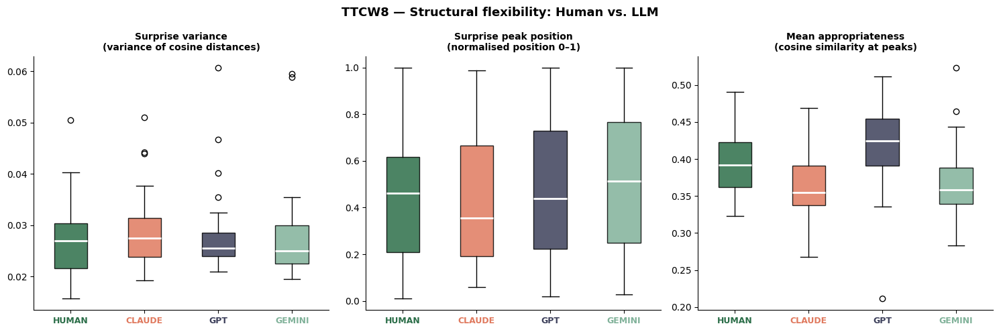

Saved: ttcw8_boxplots.png


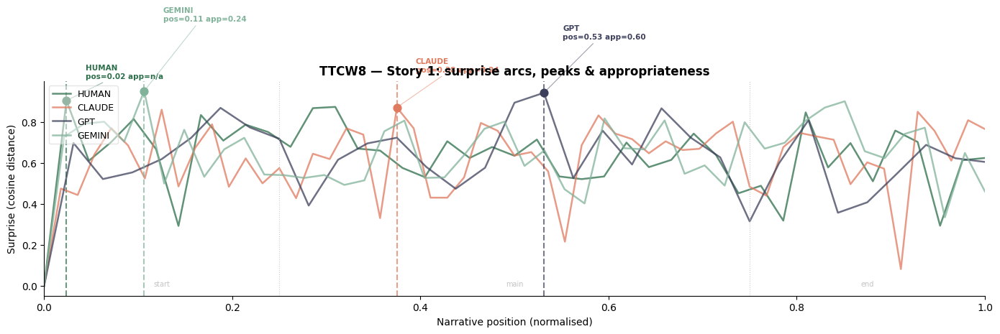

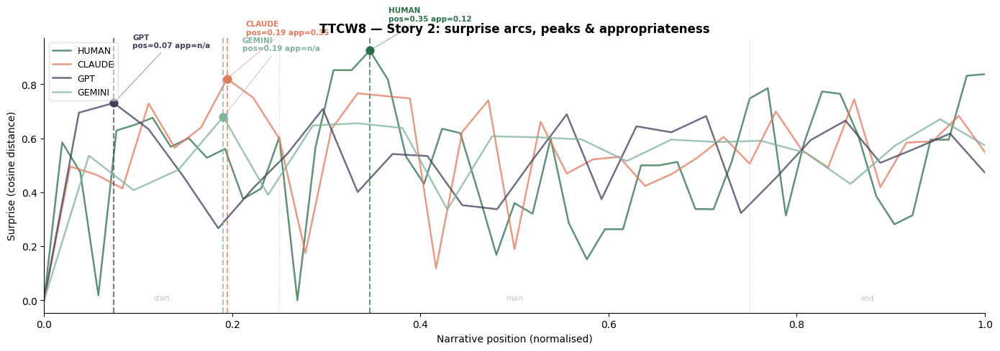

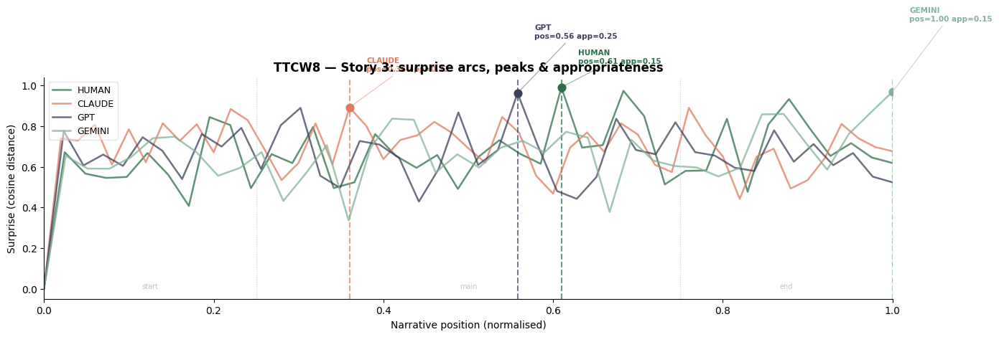

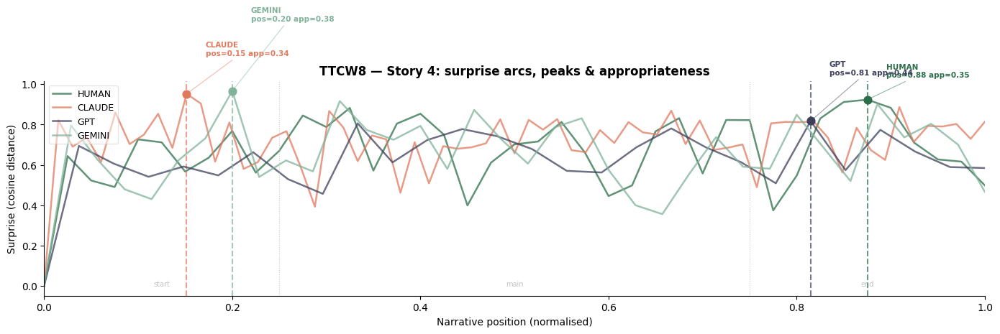

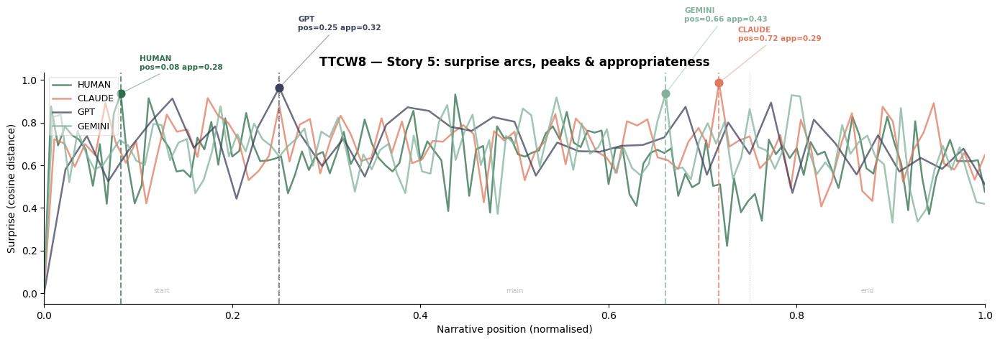

...

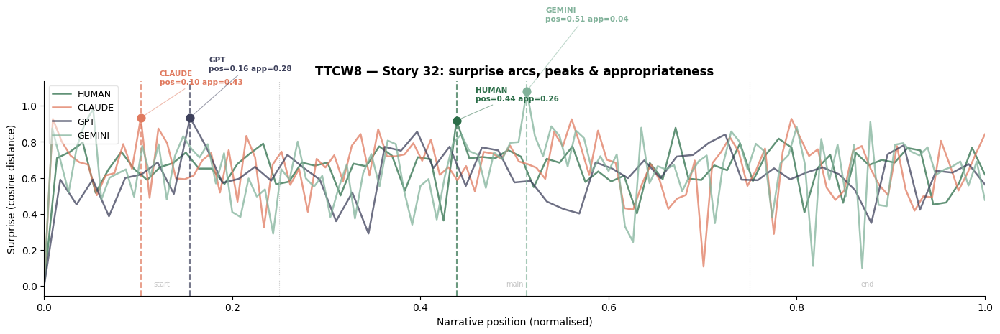

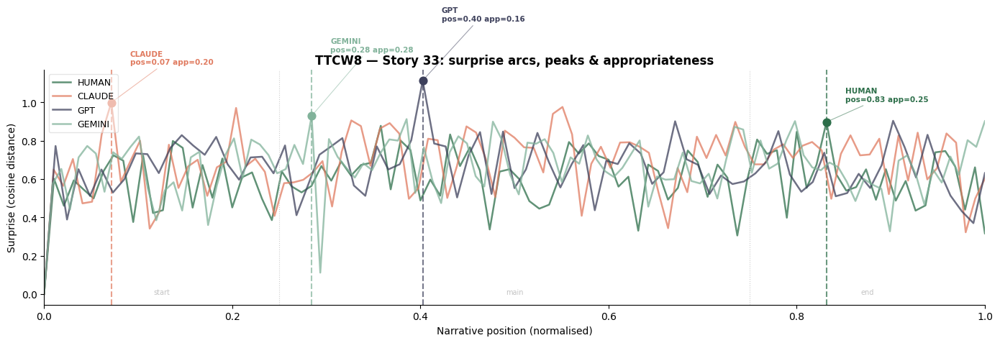

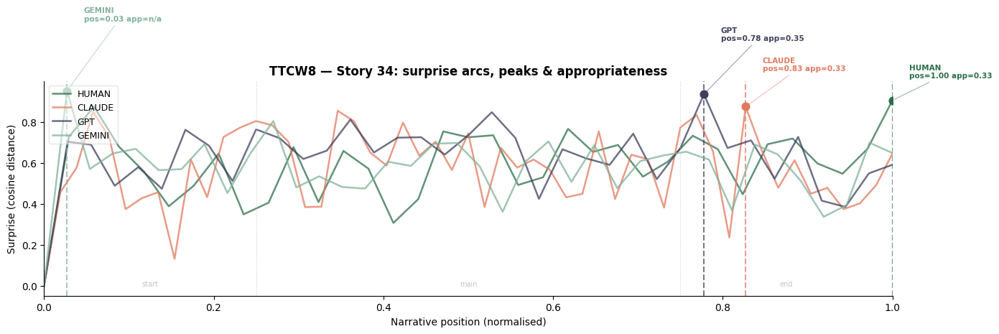

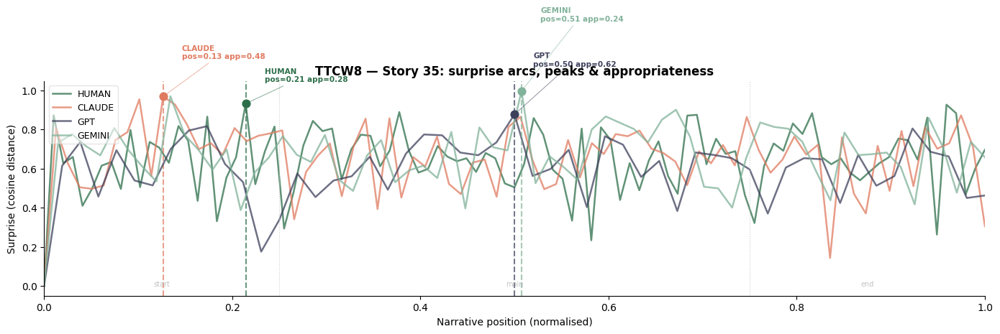

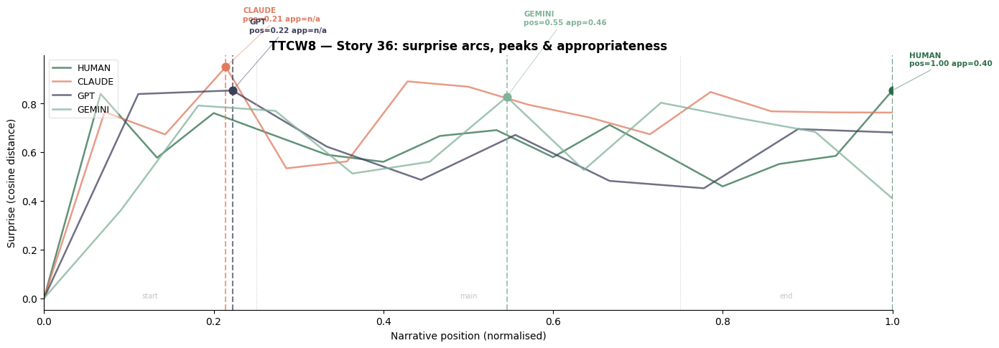

In [259]:
print("\nStep 2: Computing surprise scores...")
story_surprise = compute_surprise_scores(story_embeddings)

print("\nStep 3: Computing TTCW8 metrics...")
df_ttcw8 = compute_ttcw8(df, story_embeddings, story_surprise)
print(df_ttcw8.groupby("source")[TTCW8_METRICS].median().round(4))

print("\nStep 4: Source-level aggregation...")
df_ttcw8_source = compute_ttcw8_source_metrics(df_ttcw8)
print(df_ttcw8_source.to_string(index=False))

print("\nStep 5: Statistical tests...")
test_normality_ttcw8(df_ttcw8)
kruskal_results = test_ttcw8_kruskal(df_ttcw8)
mw_results       = test_whitney_ttcw8(df_ttcw8, kruskal_results)
gpt_comparison   = test_ttcw8_gpt_version_comparison(df_ttcw8, paired=True)
gpt55_vs_human   = test_ttcw8_gpt55_vs_human(df_ttcw8, gpt_comparison)

print("\nStep 6: Plots...")
plot_ttcw8_boxplots(df_ttcw8)
plot_ttcw8_story_peaks(df_ttcw8, story_embeddings, story_surprise)

<link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@tabler/icons-webfont@latest/tabler-icons.min.css">
<div id="ttcwORIGINALITY" style="font-family:sans-serif;">
  <hr style="border:none;">
  <div style="display:flex; align-items:center; gap:10px; margin-bottom:6px;">
    <div style="background:#FAECE7; border-radius:8px; padding:8px 10px; display:flex; align-items:center; justify-content:center;">
      <i class="ti ti-writing" style="font-size:2px; color:#4338ca;"></i>
    </div>
    <div>
      <div style="display:flex; align-items:center; gap:8px;">
        <h1 style="font-size:35px; font-weight:600; color: black; margin:0; padding-left: 15px; ">Originality</h1>
        <span style="font-size:15px; font-weight:600; background:#FAECE7;color:#712B13; padding:5px 10px; border-radius:20px;">TTCW 9–11</span>
      </div>
      <p style="font-size:15px; color:#aaa; margin:2px 0 0 0; padding-left: 15px;">Is the story unique?</p>
    </div>
  </div>

<link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@tabler/icons-webfont@latest/tabler-icons.min.css">
<div id="ttcw9" style="font-family:sans-serif; display:flex; align-items:center; margin:0.5rem 0;">
  <div style="background:#FAECE7; border-radius:25px; padding:6px 20px; display:inline-flex; align-items:center;">
    <h2 style="font-size:20px; font-weight:600; color:#712B13; margin:0;">TTCW 9 - Theme & Content</h2>
  </div>
</div>

<p class="prose"> TTCW9 is about thematic originality: does the story bring a new idea, message, or perspective about the human condition that a reader would not have encountered before?</p>

<p class="prose">The idea that a story is saying something that an 'avarage reader' has not encountered before is challenging to implement in a computational way. An alternative is approaching if the story 'says something that is not commonly said'. 
  <a href="https://www.researchgate.net/publication/379116448_Computational_thematics_comparing_algorithms_for_clustering_the_genres_of_literary_fiction" style="color:#712B13;">Sobchuk &amp; Šeļa (2024)</a> apply a method that relates to this notion: they represent each story as a thematic vector (topic distribution or document embedding), then measure how far that vector is from the <b>corpus centroid</b>. A story that is thematically distant from the corpus centroid is saying something less typical; it is more original in <a href="https://arxiv.org/pdf/2309.14556" style="color:#712B13;">Chakrabarty et al.'s (2024)</a> sense.
</p>

<p class="prose">  <a href="https://www.researchgate.net/publication/379116448_Computational_thematics_comparing_algorithms_for_clustering_the_genres_of_literary_fiction" style="color:#712B13;">Sobchuk &amp; Šeļa (2024)</a> approach <b>thematic deviation</b> as the cosine distance from each story's mean embedding to the corpus centroid. 
 
<div class="nb-info">
  <p class="prose"><b>Note.</b> atypicality ≠ originality. An unusual setting or style produces high deviation without necessarily being thematically original. A deeply original exploration of a common theme may score low. </p></div>

<p class="prose"> To get closer to a valid approach of thematic deviation that does not have the limitation of being flagged unrightfullly inside the corpus as 'original' just because the prompt of the story is, the thematic deviation is also computed per story set. Since it is a comparison between only 4 sources, this will not be as reliable as a comparion throughout the whole corpus.</p>

<p class="prose"> Stories that explore difficult, uncomfortable, or taboo themes can be viewed as more 'original' in orgin, since they will systematically lay out of the 'normal' range. It will be interesting to compare the 'degree of tabboo/moral issues' across sources.  <a href="https://arxiv.org/abs/1602.06979" style="color:#712B13;">Fast et al. (2016) </a> developed a tool that can generate and validate new lexical categories on demand from a small set of seed terms (like "bleed" and "punch" to generate the category violence). This tool, <b>Empath</b>, draws connotations between words and phrases across 37 categories and has encountered more than 1.8 billion words of modern fiction. </p>

<p class="prose">Empath is English-only. Since TTCW9 is about surface-level 'theme' and 'content', and Empath only takes broad categories instead of fine-grained linguistic patterns, the stories will be translated to English using the <code>Helsinki-NLP/opus-mt-nl-en MarianMT model</code> (<a href="https://aclanthology.org/2020.eamt-1.61.pdf" style="color:#712B13;">Tiedemann & Thottingal, 2020</a>), a pure neural machine translation model with no content moderation layer. It will translate sexual content, swearing, violence, and taboo language directly without filtering or softening. Empath (<a href="https://arxiv.org/abs/1602.06979" style="color:#712B13;">Fast et al., 2016</a>) is then applied to the translated texts to compute thematic category scores. The two measures capture different constructs (embedding-space atypicality vs. lexical theme density) and are reported independently. </p>

<div class="nb-info">
  <p class="prose">
    <b>Note.</b> Translation noise: literary Dutch does not translate perfectly. Register variation, irony, and stylistic complexity introduce measurement error.
  </p>
</div>
<div class="nb-info">
  <p class="prose">
    <b>Note.</b> Empath was trained on American English fiction: category definitions may not map cleanly onto Dutch literary content after translation.
  </p>
</div>

In [260]:
from empath import Empath
lexicon = Empath()

In [261]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
 
from itertools import combinations
from sklearn.metrics.pairwise import cosine_distances
from scipy.stats import kruskal, mannwhitneyu, shapiro
from transformers import MarianMTModel, MarianTokenizer
from empath import Empath
from tqdm import tqdm
from collections import defaultdict
 
import spacy
nlp = spacy.load("nl_core_news_lg")

SOURCES = ["human", "claude", "gpt", "gemini"]
 
TTCW9_METRICS = [
    "corpus_deviation",
    "prompt_deviation",
    "sensitive_mean",
]

SENSITIVE_CATEGORIES = [
    "aggression", "alcohol", "disgust", "divine", "fear", "feminine",
    "hate", "independence", "kill", "lust", "masculine",
    "medical_emergency", "military", "money", "negative_emotion",
    "neglect", "nervousness", "pain", "politics", "poor", "power",
    "pride", "prison", "rage", "religion", "sadness", "sexual",
    "stealing", "suffering", "swearing_terms", "terrorism", "torment",
    "ugliness", "violence", "war", "weakness", "weapon",
]

# load models
translation_model_name = "Helsinki-NLP/opus-mt-nl-en"
translation_tokenizer  = MarianTokenizer.from_pretrained(translation_model_name)
translation_model      = MarianMTModel.from_pretrained(translation_model_name)
print(f"Translation model loaded: {translation_model_name}")
 
lexicon = Empath()

/opt/anaconda3/envs/metaphor_env/lib/python3.11/site-packages/transformers/models/marian/tokenization_marian.py:176: UserWarning: Recommended: pip install sacremoses.
  warnings.warn("Recommended: pip install sacremoses.")
Loading weights: 100%|█████████████████████| 258/258 [00:00<00:00, 49893.05it/s]


Translation model loaded: Helsinki-NLP/opus-mt-nl-en


<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Theme & Content · Implementation</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  1. Translation
</h3>

<p class="prose">
  Dutch stories are translated to English using the
  <code>Helsinki-NLP/opus-mt-nl-en</code> MarianMT model
  (<a href="https://aclanthology.org/2020.eamt-1.61.pdf" style="color:#712B13;">Tiedemann &amp; Thottingal, 2020</a>),
  a transformer-based neural machine translation model trained on the
  OPUS parallel corpus.
</p>

In [262]:
def translate_dutch_to_english(
    text:          str,
    max_input_len: int = 450,
) -> str:

    if not text or not text.strip():
        return ""

    doc   = nlp(text)
    sents = [s.text.strip() for s in doc.sents if s.text.strip()]

    if not sents:
        return ""

    # group sentences into chunks within input token budget
    chunks      = []
    current     = []
    current_len = 0

    for sent in sents:
        sent_len = len(translation_tokenizer.encode(sent))

        # if a single sentence exceeds the limit, translate it alone
        if sent_len > max_input_len:
            if current:
                chunks.append(" ".join(current))
                current     = []
                current_len = 0
            chunks.append(sent)
            continue

        if current_len + sent_len > max_input_len and current:
            chunks.append(" ".join(current))
            current     = [sent]
            current_len = sent_len
        else:
            current.append(sent)
            current_len += sent_len

    if current:
        chunks.append(" ".join(current))

    # translate each chunk — no output length cap
    translated_chunks = []
    for chunk in chunks:
        try:
            inputs = translation_tokenizer(
                chunk,
                return_tensors="pt",
                truncation=True,
                max_length=max_input_len,
                padding=True,
            )
            outputs = translation_model.generate(
                **inputs,
                num_beams=4,
            )
            translated = translation_tokenizer.decode(
                outputs[0], skip_special_tokens=True
            )
            translated_chunks.append(translated)
        except Exception as e:
            print(f"  Translation error on chunk: {e}")
            translated_chunks.append(chunk)

    return " ".join(translated_chunks)

In [263]:
def translate_all_stories(df: pd.DataFrame) -> dict:
    story_translations = {}
    for _, row in tqdm(df.iterrows(), total=len(df), desc="Translating"):
        key = (row["story_id"], row["source"])
        story_translations[key] = translate_dutch_to_english(row["clean_text"])
    return story_translations

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Theme & Content · Implementation</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  2. Sensitive theme scores
</h3>

<p class="prose">
  Sensitive theme scores are computed using
  <a href="https://arxiv.org/abs/1602.06979" style="color:#712B13;">Empath</a>
  (<a href="https://arxiv.org/abs/1602.06979" style="color:#712B13;">Fast et al., 2016</a>),
  a lexical category detection tool trained on 1.8 billion words of
  modern fiction. For each story, Empath returns the proportion of text
  tokens matching each category. The <code>sensitive_mean</code> score
  is the mean across all 37 sensitive categories.
</p>

In [264]:
def empath_sensitive_score(text: str) -> dict:
    if not text or not text.strip():
        return {cat: np.nan for cat in SENSITIVE_CATEGORIES + ["sensitive_mean"]}
    try:
        scores = lexicon.analyze(
            text, categories=SENSITIVE_CATEGORIES, normalize=True
        )
        if scores is None:
            return {cat: np.nan for cat in SENSITIVE_CATEGORIES + ["sensitive_mean"]}
        scores = {k: (v if v is not None else 0.0) for k, v in scores.items()}
        scores["sensitive_mean"] = round(float(np.mean(list(scores.values()))), 6)
        return scores
    except Exception as e:
        print(f"Empath error: {e}")
        return {cat: np.nan for cat in SENSITIVE_CATEGORIES + ["sensitive_mean"]}

In [265]:
def score_all_stories(story_translations: dict) -> dict:
    story_empath = {}
    for key, text in tqdm(story_translations.items(), desc="Empath scoring"):
        story_empath[key] = empath_sensitive_score(text)
    return story_empath

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Theme & Content · Implementation</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  3. Thematic deviation
</h3>

<p class="prose">
  Thematic deviation is computed following
  <a href="https://doi.org/10.1093/llc/fqad071" style="color:#712B13;">Sobchuk &amp; Šeļa (2024)</a>,
  reusing the sentence embeddings from TTCW8
  (<code>paraphrase-multilingual-mpnet-base-v2</code>). The mean
  embedding across all sentences represents the story's thematic
  vector. Two deviation scores are then computed:
</p>

<div class="cat-card" style="margin:0.5rem 0; padding:0.6rem 0.9rem;">
  <table style="width:100%; border-collapse:collapse; font-size:0.85rem; line-height:1.4;">
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>corpus_deviation</code>
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
        Cosine distance from the story's mean embedding to the
        corpus centroid (144 story embeddings). This measures topical atypicality relative to the full dataset.
      </td>
    </tr>
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap; background:#FAECE7;">
        <code>prompt_deviation</code>
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top; background:#FAECE7;">
        Cosine distance from the story's mean embedding to the
        prompt-specific centroid: the mean of the four stories
        sharing the same prompt. This measures thematic distinctiveness relative to the other responses to the same prompt.
      </td>
    </tr>
  </table>
</div>


<p class="prose"> For each prompt, the four stories of the same set (prompt) will be ranked by prompt_deviation (rank 1 = most deviant, rank 4 = least deviant). This enables rank-based testing across all 36 prompts per source.</p>

In [266]:
def compute_thematic_deviation(df: pd.DataFrame, story_embeddings: dict) -> dict:
# includes GPT 5.5
    story_mean_embeddings = {}
    for _, row in df.iterrows():
        key  = (row["story_id"], row["source"])
        data = story_embeddings.get(key)
        if data is not None:
            story_mean_embeddings[key] = data["embeddings"].mean(axis=0)

    keys       = list(story_mean_embeddings.keys())
    embeddings = np.array([story_mean_embeddings[k] for k in keys])

    corpus_centroid  = embeddings.mean(axis=0, keepdims=True)
    corpus_distances = cosine_distances(embeddings, corpus_centroid).flatten()
    corpus_dev       = {k: round(float(d), 4) for k, d in zip(keys, corpus_distances)}

    print(f"Corpus centroid computed from {len(keys)} stories.")
    print(f"Embedding dimensionality: {corpus_centroid.shape[1]}")

    key_to_prompt = {
        (row["story_id"], row["source"]): row["prompt_id"]
        for _, row in df.iterrows()
    }

    prompt_groups = defaultdict(list)
    for k in keys:
        pid = key_to_prompt.get(k)
        if pid is not None:
            prompt_groups[pid].append(k)

    prompt_dev = {}
    for pid, group_keys in prompt_groups.items():
        group_embeddings = np.array([story_mean_embeddings[k] for k in group_keys])
        prompt_centroid  = group_embeddings.mean(axis=0, keepdims=True)
        distances        = cosine_distances(group_embeddings, prompt_centroid).flatten()
        for k, d in zip(group_keys, distances):
            prompt_dev[k] = round(float(d), 4)

    n_prompts = len(prompt_groups)
    avg_size  = round(sum(len(v) for v in prompt_groups.values()) / n_prompts, 1)
    print(f"Prompt centroids computed for {n_prompts} prompts (avg {avg_size} stories per prompt).")

    result = {}
    for k in keys:
        result[k] = {
            "corpus_deviation": corpus_dev.get(k, np.nan),
            "prompt_deviation": prompt_dev.get(k, np.nan),
        }
    return result

In [267]:
def compute_ttcw9(
    df:                 pd.DataFrame,
    thematic_deviation: dict,
    story_empath:       dict,
) -> pd.DataFrame:
    rows = []
    for _, row in df.iterrows():
        key    = (row["story_id"], row["source"])
        dev_dict         = thematic_deviation.get(key, {})
        corpus_deviation = dev_dict.get("corpus_deviation", np.nan)
        prompt_deviation = dev_dict.get("prompt_deviation",  np.nan)
        empath = story_empath.get(key, {})
        entry  = {
            "story_id":           row["story_id"],
            "source":             row["source"],
            "corpus_deviation": corpus_deviation,
            "prompt_deviation":  prompt_deviation,
        }
        for cat in SENSITIVE_CATEGORIES:
            entry[f"empath_{cat}"] = empath.get(cat, np.nan)
        entry["sensitive_mean"] = empath.get("sensitive_mean", np.nan)
        rows.append(entry)
 
    df_out = (
        pd.DataFrame(rows)
        .sort_values(["story_id", "source"])
        .reset_index(drop=True)
    )

    # prompt_id is the story_id grouping
    df_out["prompt_id"] = df_out["story_id"]

    return df_out

In [268]:
def compute_prompt_deviation_ranks(df_ttcw9: pd.DataFrame) -> pd.DataFrame:
    """
    Ranks prompt_deviation within each prompt, among the 4 main-family sources
    only (human, claude, gpt, gemini). GPT-5.5 rows are preserved in the
    returned dataframe (needed for the separate GPT-4o vs GPT-5.5 comparison)
    but receive a NaN rank — including a 5th source would change what
    "rank 1–4" means and contaminate the established 4-source ranking.
    """
    df_out = df_ttcw9.copy()
    main_family_mask = df_out["source"].isin(SOURCES)

    ranks = (
        df_out[main_family_mask]
        .groupby("prompt_id")["prompt_deviation"]
        .rank(ascending=False, method="average")
    )
    df_out["prompt_dev_rank"] = np.nan
    df_out.loc[main_family_mask, "prompt_dev_rank"] = ranks
    return df_out

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Theme & Content · Aggregate results</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  4. Aggregating results per source
</h3>
<p class="prose">
  To make a comparison between the four sources inside the dataset, the
  narrative ending metric is aggregated into a single result per source
  by taking the <b>median</b><sup><a href="#fn-ttcw4-median" style="color:#712B13;">*</a></sup>
  across all stories, yielding a typical ending-profile per source.
  This is carried out by <code>compute_ttcw4_source_metrics()</code>.
</p>
<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<div id="fn-ttcw4-median" style="font-size:12px; color:#666;">
  <sup>*</sup> The median is used instead of the mean since the data
  is not normally distributed (see section 5). <a href="#fn-ttcw4-median-ref">↩</a>
</div>

In [269]:
def compute_ttcw9_source_metrics(df_ttcw9: pd.DataFrame) -> pd.DataFrame:
    return (
        df_ttcw9
        .groupby("source")[TTCW9_METRICS]
        .agg(["median", lambda x: x.quantile(0.75) - x.quantile(0.25)])
        .round(4)
        .reset_index()
    )

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Theme & Content· Statistical analysis</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  5. Subjectivity profiles and statistical testing
</h3>

<p class="prose">Three statistical tests will be run in sequence:</p>

<div class="grid-2" style="margin:1rem 0 1.5rem 0;">

  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#712B13;">1. Shapiro–Wilk</strong>
      <span class="cat-badge" style="background:#FAECE7;color:#712B13;">Normality</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
      To test whether the results are normally distributed within each source, the binary Shapiro-wilk test will be applied to each subset. Shapiro-Wilk tests work when the observations > 3 and < 50. Here, the test runs per group, so it's testing normality on n=36 per source. 
    </p>
  </div>

  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#712B13;">2. Kruskal–Wallis</strong>
      <span class="cat-badge" style="background:#FAECE7;color:#712B13;">Group comparison</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
     The Shapiro–Wilk test indicated that normality assumptions were violated for most source–metric combinations. The Kruskal-Wallis test is chosen here since it is a <b>non-parametric test</b> of whether the <b>median</b> differences across sources exceed what would be expected by chance. 
    </p>
  </div>

  <div class="cat-card" style="grid-column: 1 / -1;">
    <div class="cat-header">
      <strong style="color:#712B13;">3. Mann–Whitney U</strong>
      <span class="cat-badge" style="background:#FAECE7;color:#712B13;">Pairwise · Bonferroni</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
Only runs when the Kruskal-Wallis gives significant results. The Mann-Whitney U test is used to compare each LLM model to the human writers. This test is chosen since these are pairwise comparisons (human vs. each LLM individually).  Bonferroni correction adjusts for the number of simultaneous comparisons (n metrics × 3 LLM sources) to reduce the risk of false positives. Alongside each p-value, <b>Cliff's delta</b> is reported as an effect size.
    </p>
  </div>

</div>

<br>

In [270]:
def test_normality_ttcw9(df_ttcw9: pd.DataFrame):
    print("Shapiro-Wilk normality tests — TTCW9 metrics")
    print(f"{'Metric':<25} {'Source':<10} {'W':>8} {'p':>10}  normal?")
    print("-" * 58)
    for metric in TTCW9_METRICS:
        for source in SOURCES:
            vals = df_ttcw9[df_ttcw9["source"] == source][metric].dropna()
            if len(vals) < 3:
                continue
            stat, p = shapiro(vals)
            print(f"{metric:<25} {source:<10} {stat:>8.4f} {p:>10.4f}  "
                  f"{'yes' if p > 0.05 else 'NO'}")
        print()

In [271]:
def test_ttcw9_kruskal(df_ttcw9: pd.DataFrame) -> pd.DataFrame:
    rows = []
    print("Kruskal-Wallis — TTCW9 metrics across sources")
    print(f"{'Metric':<25} {'H':>8} {'p':>10}  {'high':<10} {'low':<10}  sig?")
    print("-" * 65)
    for metric in TTCW9_METRICS:
        groups  = [df_ttcw9[df_ttcw9["source"] == s][metric].dropna().values
                   for s in SOURCES]
        if any(len(g) < 2 for g in groups):
            print(f"{metric:<25} {'n/a':>8} {'n/a':>10}")
            rows.append({"metric": metric, "H": np.nan, "p": np.nan,
                         "significant": False, "highest": None, "lowest": None})
            continue
        stat, p  = kruskal(*groups)
        sig      = p < 0.05
        medians  = {s: df_ttcw9[df_ttcw9["source"] == s][metric].median()
                    for s in SOURCES}
        highest  = max(medians, key=medians.get)
        lowest   = min(medians, key=medians.get)
        print(f"{metric:<25} {stat:>8.4f} {p:>10.4f}  {highest:<10} {lowest:<10}  "
              f"{'*' if sig else ''}")
        rows.append({"metric": metric, "H": stat, "p": p,
                     "significant": sig, "highest": highest, "lowest": lowest})
    return pd.DataFrame(rows)

In [272]:
def cliffs_delta(a, b):
    a, b = np.asarray(a), np.asarray(b)
    greater = sum(x > y for x in a for y in b)
    less    = sum(x < y for x in a for y in b)
    return (greater - less) / (len(a) * len(b))

def interpret_effect(d):
    d = abs(d)
    if d < 0.147: return "negligible"
    if d < 0.33:  return "small"
    if d < 0.474: return "medium"
    return "large"

def test_ttcw9_mannwhitney(df_ttcw9: pd.DataFrame, kruskal_results: pd.DataFrame) -> pd.DataFrame:
    significant_metrics = kruskal_results[kruskal_results["significant"]]["metric"].tolist()

    if not significant_metrics:
        print("No significant Kruskal-Wallis results.")
        return pd.DataFrame()

    llm_sources   = ["claude", "gpt", "gemini"]
    n_comparisons = len(llm_sources) * len(significant_metrics)
    rows = []

    for metric in significant_metrics:
        print(f"\n{'='*100}")
        print(f"  {metric.upper()}")
        print(f"{'='*100}")
        print(f"\n  {'Comparison':<22} {'U':>8} {'p_raw':>10} {'p_corr':>10}  "
              f"{'delta':>8} {'(size)':<12} {'Direction':<25}  Sig?")
        print(f"  {'-'*105}")

        human_vals = df_ttcw9[df_ttcw9["source"] == "human"][metric].dropna().values

        for llm in llm_sources:
            llm_vals = df_ttcw9[df_ttcw9["source"] == llm][metric].dropna().values
            if len(human_vals) < 2 or len(llm_vals) < 2:
                continue
            u, p      = mannwhitneyu(human_vals, llm_vals, alternative="two-sided")
            delta     = cliffs_delta(human_vals, llm_vals)
            label     = interpret_effect(delta)
            p_corr    = min(p * n_comparisons, 1.0)
            direction = f"human {'>' if np.median(human_vals) > np.median(llm_vals) else '<'} {llm}"
            sig       = p_corr < 0.05
            print(f"  {'human vs ' + llm:<22} {u:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
                  f"{delta:>8.3f} ({label:<10}) {direction:<25}  {'*' if sig else '-'}")
            rows.append({"metric": metric, "vs": llm, "U": u, "p": p, "p_corr": p_corr,
                         "cliffs_delta": delta, "effect_label": label,
                         "direction": direction, "significant": sig})

    return pd.DataFrame(rows)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Theme & Content · GPT-4o vs. GPT-5.5</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  6. Direct model-version comparison
</h3>
<p class="prose">
  To find if there is a significant difference between GPT-4o and GPT-5.5 on thematic originality and sensitive content, a Wilcoxon signed-rank test will be run separately. It asks specifically whether <b>upgrading the model</b> changes how thematically distinctive its stories are, or how much sensitive/taboo content they contain.
</p>
<div class="nb-info" style="margin:1rem 0;">
  <p class="prose" style="margin:0;">
    Each GPT-4o and GPT-5.5 story comes from the <b>same prompt</b> (matched by <code>story_id</code>), so a <b>paired Wilcoxon signed-rank test</b> is used instead of the unpaired Mann-Whitney U applied above. Pairing controls for prompt-to-prompt variance and gives more power at the same n=36. Bonferroni correction is applied across the 3 TTCW9 metrics within this test only, separate from the human-vs-LLM correction above. Alongside each p-value, the <b>matched rank-biserial correlation</b> is reported as an effect size, to show the magnitude of any shift, not just its significance.
  </p>
</div>
<p class="prose">
  Only when this test returns a significant result for a given metric, a follow-up comparison is run: GPT-5.5 vs. human on that metric only. This checks whether the model-version shift moved GPT-5.5 closer to or further from human-like thematic originality and content sensitivity.
</p>
<div class="nb-info" style="margin:1rem 0;">
  <p class="prose" style="margin:0;">
    <b>Note.</b> GPT-5.5 is included when building the corpus and per-prompt centroids (a richer corpus gives a better-estimated centroid), so it has its own <code>corpus_deviation</code> and <code>prompt_deviation</code> values to compare against GPT-4o. It remains excluded from the human-vs-LLM statistical test family above, for the same correction-dilution reasons established throughout this analysis. The per-prompt rank test (Section 7) is similarly restricted to the four core sources.
  </p>
</div>

In [273]:
def matched_rank_biserial(a, b):
    """Effect size for paired Wilcoxon. Range -1 to 1."""
    diffs = np.array(a) - np.array(b)
    diffs = diffs[diffs != 0]
    ranks = rankdata(np.abs(diffs))
    pos_sum = ranks[diffs > 0].sum()
    neg_sum = ranks[diffs < 0].sum()
    return (pos_sum - neg_sum) / (pos_sum + neg_sum)

def test_ttcw9_gpt_version_comparison(df_ttcw9: pd.DataFrame, paired: bool = True) -> pd.DataFrame:
    gpt4o = df_ttcw9[df_ttcw9["source"] == "gpt"].set_index("story_id")
    gpt55 = df_ttcw9[df_ttcw9["source"] == "gpt_5.5"].set_index("story_id")

    test_name = "paired Wilcoxon signed-rank" if paired else "unpaired Mann-Whitney U"
    n_comparisons = len(TTCW9_METRICS)

    print("\nGPT-4o vs. GPT-5.5 — direct model comparison (TTCW9 metrics)")
    print(f"({test_name}, Bonferroni corrected across {n_comparisons} metrics)")
    print(f"{'Metric':<20} {'stat':>8} {'p_raw':>10} {'p_corr':>10}  "
          f"{'effect':>8} {'(size)':<12} {'direction':<20}  sig?")
    print("─" * 95)

    rows = []
    for metric in TTCW9_METRICS:
        if paired:
            common_ids = gpt4o.index.intersection(gpt55.index)
            a = gpt4o.loc[common_ids, metric].dropna()
            b = gpt55.loc[common_ids, metric].dropna()
            common_ids = a.index.intersection(b.index)
            a, b = a.loc[common_ids], b.loc[common_ids]
            if len(a) < 1:
                continue
            stat, p = wilcoxon(a.values, b.values)
            effect = matched_rank_biserial(a.values, b.values)
        else:
            a = gpt4o[metric].dropna()
            b = gpt55[metric].dropna()
            if len(a) < 1 or len(b) < 1:
                continue
            stat, p = mannwhitneyu(a.values, b.values, alternative="two-sided")
            effect = cliffs_delta(a.values, b.values)

        p_corr       = min(p * n_comparisons, 1.0)
        direction    = f"gpt {'>' if a.median() > b.median() else '<'} gpt_5.5"
        sig          = p_corr < 0.05
        effect_label = interpret_effect(effect)

        print(f"{metric:<20} {stat:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
              f"{effect:>8.3f} ({effect_label:<10}) {direction:<20}  {'*' if sig else ''}")
        rows.append({"metric": metric, "stat": stat, "p": p, "p_corr": p_corr,
                     "significant": sig, "direction": direction,
                     "effect_size": effect, "effect_label": effect_label})

    return pd.DataFrame(rows)

In [274]:
def test_ttcw9_gpt55_vs_human(df_ttcw9: pd.DataFrame, gpt_comparison: pd.DataFrame) -> pd.DataFrame:
    significant_metrics = gpt_comparison[gpt_comparison["significant"]]["metric"].tolist()

    if not significant_metrics:
        print("No significant GPT-4o vs. GPT-5.5 differences — GPT-5.5 vs. human not run.")
        return pd.DataFrame()

    human = df_ttcw9[df_ttcw9["source"] == "human"]
    gpt55 = df_ttcw9[df_ttcw9["source"] == "gpt_5.5"]
    n_comparisons = len(significant_metrics)

    print(f"\nGPT-5.5 vs. Human — TTCW9 metrics "
          f"(only metrics where GPT-4o→GPT-5.5 shifted: {', '.join(significant_metrics)})")
    print(f"{'Metric':<20} {'U':>8} {'p_raw':>10} {'p_corr':>10}  "
          f"{'delta':>8} {'(size)':<12} {'direction':<20}  sig?")
    print("─" * 95)

    rows = []
    for metric in significant_metrics:
        h = human[metric].dropna().values
        g = gpt55[metric].dropna().values
        u, p   = mannwhitneyu(h, g, alternative="two-sided")
        delta  = cliffs_delta(h, g)
        label  = interpret_effect(delta)
        p_corr = min(p * n_comparisons, 1.0)
        sig    = p_corr < 0.05
        direction = f"human {'>' if np.median(h) > np.median(g) else '<'} gpt_5.5"

        print(f"{metric:<20} {u:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
              f"{delta:>8.3f} ({label:<10}) {direction:<20}  {'*' if sig else ''}")
        rows.append({"metric": metric, "U": u, "p": p, "p_corr": p_corr,
                     "cliffs_delta": delta, "effect_label": label,
                     "direction": direction, "significant": sig})

    return pd.DataFrame(rows)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Theme & Content · Statistical analysis per prompt</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  6. Per-prompt rank test
</h3>
<p class="prose">
  In addition to the corpus-level tests, a rank-based test is run on
  <code>prompt_deviation</code> to assess whether sources
  systematically differ in how thematically distinctive their story is
  <i>within the same prompt</i>. For each of the 36 prompts, the four
  stories are ranked by <code>prompt_deviation</code> (rank 1 = most
  thematically distinct, rank 4 = least). Each source therefore
  contributes 36 rank observations, sufficient for Kruskal–Wallis and
  Mann–Whitney U.
</p>

<div style="display:flex; gap:0.75rem; margin:0.75rem 0; align-items:stretch;">

  <div style="flex:1; background:#2C6E49; border-radius:8px;
              padding:0.7rem 0.9rem; text-align:center;">
    <p style="margin:0 0 0.2rem 0; font-size:1.4rem; font-weight:800;
              color:white; line-height:1;">1</p>
    <p style="margin:0 0 0.3rem 0; font-size:0.8rem; font-weight:700;
              color:white;">Rank 1</p>
    <p style="margin:0; font-size:0.75rem; color:rgba(255,255,255,0.85);">
      Most thematically distinct story within the prompt set
    </p>
  </div>

  <div style="flex:1; background:#81B29A; border-radius:8px;
              padding:0.7rem 0.9rem; text-align:center;">
    <p style="margin:0 0 0.2rem 0; font-size:1.4rem; font-weight:800;
              color:white; line-height:1;">2</p>
    <p style="margin:0 0 0.3rem 0; font-size:0.8rem; font-weight:700;
              color:white;">Rank 2</p>
    <p style="margin:0; font-size:0.75rem; color:rgba(255,255,255,0.85);">
      &nbsp;
    </p>
  </div>

  <div style="flex:1; background:#E0A87A; border-radius:8px;
              padding:0.7rem 0.9rem; text-align:center;">
    <p style="margin:0 0 0.2rem 0; font-size:1.4rem; font-weight:800;
              color:white; line-height:1;">3</p>
    <p style="margin:0 0 0.3rem 0; font-size:0.8rem; font-weight:700;
              color:white;">Rank 3</p>
    <p style="margin:0; font-size:0.75rem; color:rgba(255,255,255,0.85);">
      &nbsp;
    </p>
  </div>

  <div style="flex:1; background:#E07A5F; border-radius:8px;
              padding:0.7rem 0.9rem; text-align:center;">
    <p style="margin:0 0 0.2rem 0; font-size:1.4rem; font-weight:800;
              color:white; line-height:1;">4</p>
    <p style="margin:0 0 0.3rem 0; font-size:0.8rem; font-weight:700;
              color:white;">Rank 4</p>
    <p style="margin:0; font-size:0.75rem; color:rgba(255,255,255,0.85);">
      Least thematically distinct story within the prompt set
    </p>
  </div>

</div>

<p class="prose">
  A source with a consistently low median rank deviates more from the
  shared thematic territory established by the prompt — indicating
  greater thematic originality relative to the other three responses to
  the same starting material.
</p>
<br>

In [275]:
def test_prompt_deviation_ranks(df_ttcw9: pd.DataFrame):
    df_ranked     = compute_prompt_deviation_ranks(df_ttcw9)
    llm_sources   = ["claude", "gpt", "gemini"]
    llm_pairs     = [("claude", "gpt"),
                     ("claude", "gemini"),
                     ("gpt",    "gemini")]
    n_human       = len(llm_sources)

    print("Per-prompt deviation rank test")
    print("Rank 1 = most thematically distinct within prompt")
    print("Rank 4 = least thematically distinct within prompt")
    print("NOTE: lower median rank = more distinctive")
    print("=" * 60)

    print(f"\n  {'Source':<10} {'Median rank':>12} {'IQR':>8}  Interpretation")
    print(f"  {'-'*50}")
    for source in SOURCES:
        vals = df_ranked[df_ranked["source"] == source]["prompt_dev_rank"].dropna()
        med  = vals.median()
        iqr  = vals.quantile(0.75) - vals.quantile(0.25)
        interp = "← more distinctive" if med < 2.5 else "← less distinctive"
        print(f"  {source:<10} {med:>12.2f} {iqr:>8.2f}  {interp}")

    groups = [
        df_ranked[df_ranked["source"] == s]["prompt_dev_rank"].dropna().values
        for s in SOURCES
    ]
    stat, p = kruskal(*groups)
    sig     = p < 0.05
    print(f"\n  Kruskal-Wallis: H={stat:.3f}, p={p:.4f} "
          f"{'*' if sig else ''}")

    if not sig:
        print("  → No significant difference in prompt deviation ranks.")
        return

    print(f"\n  Human vs LLM (Bonferroni n={n_human}):")
    print(f"  NOTE: human < llm means human has lower rank number")
    print(f"        = human is MORE thematically distinct")
    print(f"  {'Comparison':<22} {'U':>8} {'p_raw':>10} "
          f"{'p_corr':>10}  {'Direction':<35}  Sig?")
    print(f"  {'-'*90}")

    human_vals    = df_ranked[
        df_ranked["source"] == "human"]["prompt_dev_rank"].dropna().values
    any_human_sig = False

    for llm in llm_sources:
        llm_vals  = df_ranked[
            df_ranked["source"] == llm]["prompt_dev_rank"].dropna().values
        u, p_mw   = mannwhitneyu(human_vals, llm_vals, alternative="two-sided")
        p_corr    = min(p_mw * n_human, 1.0)

        h_med     = np.median(human_vals)
        l_med     = np.median(llm_vals)

        if h_med < l_med:
            direction = f"human more distinctive than {llm}"
        else:
            direction = f"human less distinctive than {llm}"

        sig_pair  = p_corr < 0.05
        if sig_pair:
            any_human_sig = True
        print(f"  {'human vs ' + llm:<22} {u:>8.1f} "
              f"{p_mw:>10.4f} {p_corr:>10.4f}  "
              f"{direction:<35}  {'*' if sig_pair else '-'}")

    if any_human_sig:
        return

    print(f"\n  No significant human-LLM difference.")
    print(f"  Pairwise LLM (Bonferroni n={len(llm_pairs)}):")
    print(f"  {'-'*90}")

    for s1, s2 in llm_pairs:
        v1      = df_ranked[
            df_ranked["source"] == s1]["prompt_dev_rank"].dropna().values
        v2      = df_ranked[
            df_ranked["source"] == s2]["prompt_dev_rank"].dropna().values
        u, p_mw = mannwhitneyu(v1, v2, alternative="two-sided")
        p_corr  = min(p_mw * len(llm_pairs), 1.0)

        if np.median(v1) < np.median(v2):
            direction = f"{s1} more distinctive than {s2}"
        else:
            direction = f"{s1} less distinctive than {s2}"

        print(f"  {s1 + ' vs ' + s2:<22} {u:>8.1f} "
              f"{p_mw:>10.4f} {p_corr:>10.4f}  "
              f"{direction:<35}  "
              f"{'*' if p_corr < 0.05 else '-'}")

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Theme & content · Visualization</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  Visualization
</h3>
<p class="prose">To give a clear overview of the data, 2 plots will be generated:</p>

<div class="cat-card" style="margin:0.5rem 0; padding:0.6rem 0.9rem;">
  <table style="width:100%; border-collapse:collapse; font-size:0.85rem; line-height:1.4;">
    <tr style="background:#f9f9f9;">
      <th style="padding:0.3rem 0.5rem 0.3rem 0.3rem; text-align:left; font-weight:600; color:#712B13; white-space:nowrap;">
        Function
      </th>
      <th style="padding:0.3rem 0 0.3rem 0.5rem; text-align:left; font-weight:600; color:#712B13;">
        Output
      </th>
    </tr>
    <tr>
      <td style="padding:0.4rem 0.5rem 0.4rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>plot_ttcw9_empath_heatmap()</code>
      </td>
      <td style="padding:0.4rem 0 0.4rem 0.5rem; vertical-align:top;">
        Heatmap of median Empath sensitive category scores per source —
        rows = sensitive categories, columns = sources. Shows which
        thematic areas differ most between sources.
      </td>
    </tr>
    <tr>
      <td style="padding:0.4rem 0.5rem 0.4rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>plot_ttcw9_deviation_boxplot()</code>
      </td>
      <td style="padding:0.4rem 0 0.4rem 0.5rem; vertical-align:top;">
        Two-panel boxplot showing <code>corpus_deviation</code> and
        <code>prompt_deviation</code> per source side by side
      </td>
    </tr>
    <tr>
      <td style="padding:0.4rem 0.5rem 0.4rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>plot_prompt_rank_distribution()</code>
      </td>
      <td style="padding:0.4rem 0 0.4rem 0.5rem; vertical-align:top;">
        Horizontal stacked bar chart showing the percentage of prompts
        each source ranked 1st, 2nd, 3rd, and 4th on
        <code>prompt_deviation</code> — rank 1 = most thematically
        distinct within the prompt
      </td>
    </tr>
  </table>
</div>
<br>

In [276]:
def plot_ttcw9_empath_heatmap(df_ttcw9: pd.DataFrame):
    cat_cols = [f"empath_{cat}" for cat in SENSITIVE_CATEGORIES]
    matrix   = np.zeros((len(SENSITIVE_CATEGORIES), len(SOURCES)))
 
    for j, source in enumerate(SOURCES):
        subset = df_ttcw9[df_ttcw9["source"] == source]
        for i, col in enumerate(cat_cols):
            matrix[i, j] = subset[col].median()
 
    fig, ax = plt.subplots(figsize=(8, 12))
    im      = ax.imshow(matrix, aspect="auto", cmap="YlOrRd",
                        interpolation="nearest")
 
    ax.set_xticks(range(len(SOURCES)))
    ax.set_xticklabels([s.upper() for s in SOURCES],
                       fontsize=10, fontweight="bold")
    ax.set_yticks(range(len(SENSITIVE_CATEGORIES)))
    ax.set_yticklabels(SENSITIVE_CATEGORIES, fontsize=9)
 
    for i in range(len(SENSITIVE_CATEGORIES)):
        for j in range(len(SOURCES)):
            ax.text(j, i, f"{matrix[i, j]:.4f}",
                    ha="center", va="center", fontsize=7, color="black")
 
    plt.colorbar(im, ax=ax, label="Median Empath score (normalised)",
                 fraction=0.03, pad=0.04)
    ax.set_title("TTCW9 — Sensitive theme categories per source\n"
                 "(Empath scores on English translations)",
                 fontsize=12, fontweight="bold", pad=12)
    ax.spines[["top", "right", "bottom", "left"]].set_visible(False)
    ax.tick_params(length=0)
    plt.tight_layout()
    plt.savefig("ttcw9_empath_heatmap.png", dpi=150, bbox_inches="tight")
    plt.show()
    print("Saved: ttcw9_empath_heatmap.png")

In [277]:
def plot_prompt_rank_distribution(df_ttcw9: pd.DataFrame):
    df_ranked  = compute_prompt_deviation_ranks(df_ttcw9)
    rank_colors = ["#2C6E49", "#81B29A", "#E0A87A", "#E07A5F"]
    rank_labels = ["1st (most distinct)", "2nd", "3rd",
                   "4th (least distinct)"]

    # build proportion matrix: sources × ranks
    data = {}
    for source in SOURCES:
        vals = df_ranked[df_ranked["source"] == source]["prompt_dev_rank"].dropna()
        data[source] = [round((vals == r).sum() / len(vals) * 100, 1)
                        for r in [1, 2, 3, 4]]

    fig, ax = plt.subplots(figsize=(10, 4))
    y       = np.arange(len(SOURCES))

    lefts = np.zeros(len(SOURCES))
    bars_by_rank = []

    for i, (color, label) in enumerate(zip(rank_colors, rank_labels)):
        widths = [data[s][i] for s in SOURCES]
        bars   = ax.barh(y, widths, left=lefts, color=color,
                         alpha=0.88, label=label, height=0.55)
        bars_by_rank.append((bars, widths))

        # percentage labels inside bars
        for j, (bar, w) in enumerate(zip(bars, widths)):
            if w >= 8:
                ax.text(
                    lefts[j] + w / 2,
                    bar.get_y() + bar.get_height() / 2,
                    f"{w:.0f}%",
                    ha="center", va="center",
                    fontsize=9, fontweight="bold", color="white",
                )
        lefts += np.array(widths)

    # source labels on y-axis, coloured
    ax.set_yticks(y)
    ax.set_yticklabels([s.upper() for s in SOURCES],
                       fontsize=11, fontweight="bold")
    for tick, source in zip(ax.get_yticklabels(), SOURCES):
        tick.set_color(COLORS[source])

    ax.set_xlabel("Percentage of prompts (%)", fontsize=10)
    ax.set_xlim(0, 100)
    ax.set_title(
        "TTCW9 — Per-prompt thematic deviation rank distribution\n"
        "(rank 1 = most thematically distinct within prompt)",
        fontsize=11, fontweight="bold",
    )
    ax.legend(
        loc="lower right", fontsize=9,
        framealpha=0.6, title="Rank",
    )
    ax.spines[["top", "right", "left"]].set_visible(False)
    ax.tick_params(axis="y", length=0)
    ax.xaxis.set_major_formatter(
        plt.FuncFormatter(lambda x, _: f"{x:.0f}%")
    )

    plt.tight_layout()
    plt.savefig("ttcw9_rank_distribution.png", dpi=150,
                bbox_inches="tight")
    plt.show()
    print("Saved: ttcw9_rank_distribution.png")

In [278]:
def plot_ttcw9_deviation_boxplot(df_ttcw9: pd.DataFrame):
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    colors    = [COLORS[s] for s in SOURCES]

    panels = {
        "corpus_deviation": "Corpus deviation\n(distance from 144-story centroid)",
        "prompt_deviation":  "Prompt deviation\n(distance from prompt-specific centroid)",
    }

    for ax, (col, label) in zip(axes, panels.items()):
        data = [df_ttcw9[df_ttcw9["source"] == s][col].dropna().values
                for s in SOURCES]

        bp = ax.boxplot(data, patch_artist=True,
                        medianprops={"color": "white", "linewidth": 2})
        for patch, color in zip(bp["boxes"], colors):
            patch.set_facecolor(color)
            patch.set_alpha(0.85)

        ax.set_xticks(range(1, len(SOURCES) + 1))
        ax.set_xticklabels([s.upper() for s in SOURCES],
                           fontsize=9, fontweight="bold")
        for tick, color in zip(ax.get_xticklabels(), colors):
            tick.set_color(color)

        ax.set_ylabel("Cosine distance to centroid", fontsize=10)
        ax.set_title(label, fontsize=10, fontweight="bold")
        ax.spines[["top", "right"]].set_visible(False)

    plt.suptitle("TTCW9 — Thematic deviation: Human vs. LLM",
                 fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.savefig("ttcw9_deviation_boxplot.png", dpi=150, bbox_inches="tight")
    plt.show()
    print("Saved: ttcw9_deviation_boxplot.png")

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Theme & Content · Run the code</p>

<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  Run everything
</h3>

In [168]:
story_translations = {}

for _, row in tqdm(df.iterrows(), total=len(df), desc="Translating"):
    key = (row["story_id"], row["source"])
    story_translations[key] = translate_dutch_to_english(row["clean_text"])

import pickle
with open("story_translations.pkl", "wb") as f:
    pickle.dump(story_translations, f)

print(f"Translated and saved {len(story_translations)} stories.")

Translating: 100%|████████████████████████████| 144/144 [47:57<00:00, 19.98s/it]

Translated and saved 144 stories.


In [ ]:
import pickle

with open("story_translations.pkl", "rb") as f:
    story_translations = pickle.load(f)

gpt55_rows = df[df["source"] == "gpt_5.5"]
for _, row in tqdm(gpt55_rows.iterrows(), total=len(gpt55_rows), desc="Translating GPT-5.5"):
    key = (row["story_id"], row["source"])
    if key not in story_translations:
        story_translations[key] = translate_dutch_to_english(row["clean_text"])

Translations now cover 180 stories.

Step 0b: Empath scoring...


Empath scoring: 100%|███████████████████████| 180/180 [00:00<00:00, 1551.11it/s]


Step 0c: Computing thematic deviation...
Corpus centroid computed from 179 stories.
Embedding dimensionality: 768
Prompt centroids computed for 36 prompts (avg 5.0 stories per prompt).

Step 1: Computing TTCW9 metrics...
         corpus_deviation  prompt_deviation  sensitive_mean
source                                                     
claude             0.0996            0.0545          0.0006
gemini             0.1093            0.0653          0.0009
gpt                0.1632            0.0876          0.0008
gpt_5.5            0.0741            0.0424          0.0006
human              0.1337            0.0959          0.0009

Step 2: Source-level aggregation...


 source corpus_deviation            prompt_deviation            sensitive_mean           
                  median <lambda_0>           median <lambda_0>         median <lambda_0>
 claude           0.0996     0.0639           0.0545     0.0376         0.0006     0.0004
 gemini           0.1093     0.0616           0.0653     0.0401         0.0009     0.0006
    gpt           0.1632     0.0856           0.0876     0.0333         0.0008     0.0009
gpt_5.5           0.0741     0.0484           0.0424     0.0213         0.0006     0.0006
  human           0.1337     0.0439           0.0959     0.0431         0.0009     0.0007

Step 3: Statistical tests...
Shapiro-Wilk normality tests — TTCW9 metrics
Metric                    Source            W          p  normal?
----------------------------------------------------------
corpus_deviation          human        0.8637     0.0004  NO
corpus_deviation          claude       0.9211     0.0135  NO
corpus_deviation          gpt          0.9473   

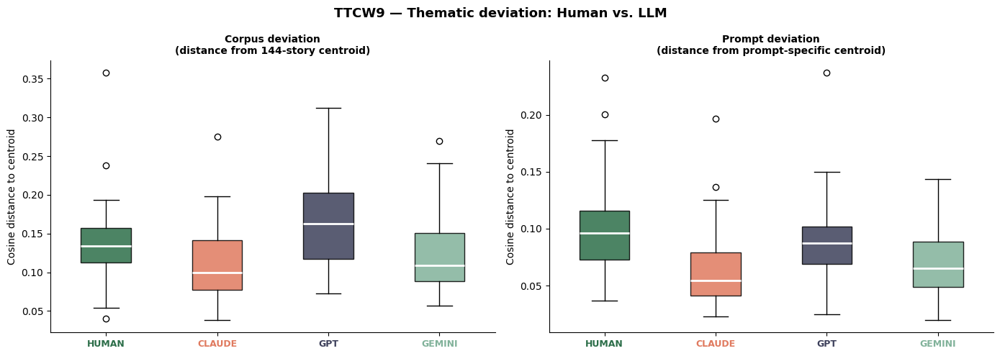

Saved: ttcw9_deviation_boxplot.png


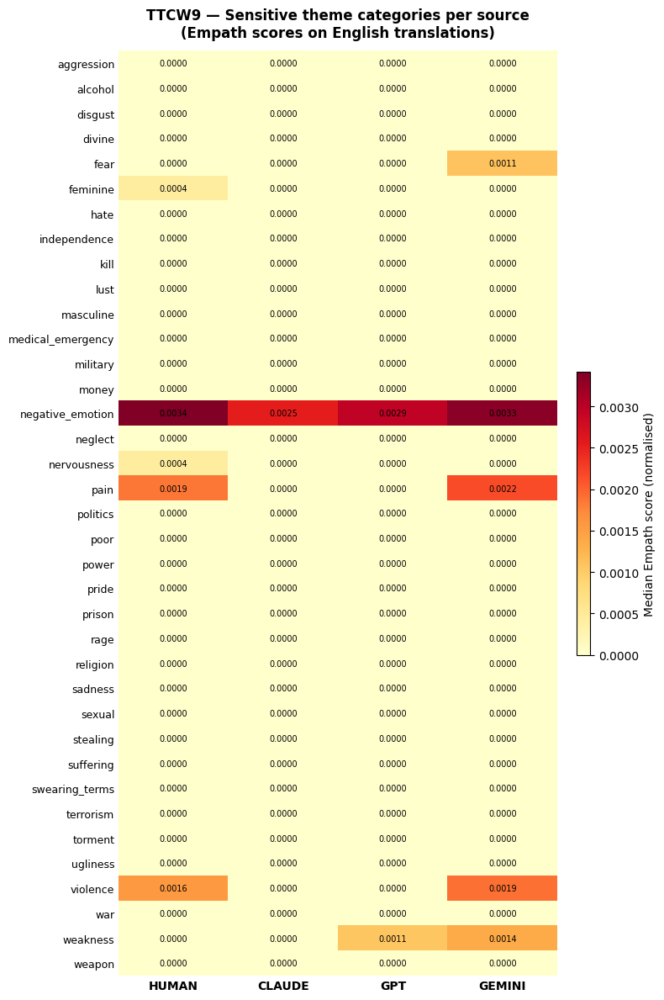

Saved: ttcw9_empath_heatmap.png


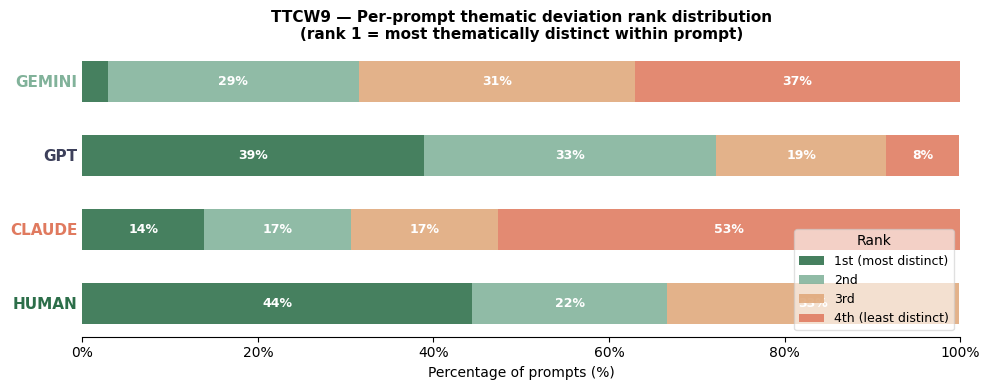

Saved: ttcw9_rank_distribution.png


In [281]:
with open("story_translations.pkl", "wb") as f:
    pickle.dump(story_translations, f)

print(f"Translations now cover {len(story_translations)} stories.")

print("\nStep 0b: Empath scoring...")
story_empath = score_all_stories(story_translations)

print("\nStep 0c: Computing thematic deviation...")
df_ttcw9 = df.copy()                                  # if df_ttcw9 doesn't already exist by this point
df_ttcw9["prompt_id"] = df_ttcw9["story_id"]           # add prompt_id BEFORE calling the function
thematic_deviation = compute_thematic_deviation(df_ttcw9, story_embeddings)  # pass df_ttcw9, not df

df_ttcw9["prompt_id"] = df_ttcw9["story_id"]

print("\nStep 1: Computing TTCW9 metrics...")
df_ttcw9 = compute_ttcw9(df, thematic_deviation, story_empath)
print(df_ttcw9.groupby("source")[TTCW9_METRICS].median().round(4))

print("\nStep 2: Source-level aggregation...")
df_ttcw9_source = compute_ttcw9_source_metrics(df_ttcw9)
print(df_ttcw9_source.to_string(index=False))

df_ttcw9 = compute_prompt_deviation_ranks(df_ttcw9)

print("\nStep 3: Statistical tests...")
test_normality_ttcw9(df_ttcw9)
kruskal_results = test_ttcw9_kruskal(df_ttcw9)
mw_results       = test_ttcw9_mannwhitney(df_ttcw9, kruskal_results)
gpt_comparison   = test_ttcw9_gpt_version_comparison(df_ttcw9, paired=True)
gpt55_vs_human   = test_ttcw9_gpt55_vs_human(df_ttcw9, gpt_comparison)

print("\nStep 3b: Per-prompt deviation rank test...")
df_ttcw9["prompt_id"] = df_ttcw9["story_id"]
print(df_ttcw9.columns.tolist())  # verify prompt_id is there
test_prompt_deviation_ranks(df_ttcw9)

# Step 4: plots
print("\nStep 4: Plots...")
plot_ttcw9_deviation_boxplot(df_ttcw9)
plot_ttcw9_empath_heatmap(df_ttcw9)
plot_prompt_rank_distribution(df_ttcw9)

In [641]:
df_ttcw9 = compute_prompt_deviation_ranks(df_ttcw9)

# now check both
print(df_ttcw9.groupby("source")["prompt_deviation"].describe().round(4))
print()
print(df_ttcw9.groupby("source")["prompt_dev_rank"].value_counts().sort_index())

        count    mean     std     min     25%     50%     75%     max
source                                                               
claude   36.0  0.1024  0.0424  0.0386  0.0689  0.1014  0.1110  0.2560
gemini   35.0  0.1113  0.0470  0.0500  0.0789  0.1025  0.1342  0.2828
gpt      36.0  0.1432  0.0516  0.0428  0.1030  0.1353  0.1784  0.2519
human    36.0  0.1284  0.0418  0.0602  0.1062  0.1248  0.1456  0.2653

source  prompt_dev_rank
claude  1.0                 4
        2.0                 4
        3.0                12
        4.0                16
gemini  1.0                 3
        2.0                11
        3.0                 9
        4.0                12
gpt     1.0                13
        2.0                15
        3.0                 5
        4.0                 3
human   1.0                16
        2.0                 6
        3.0                10
        4.0                 4
Name: count, dtype: int64


<link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@tabler/icons-webfont@latest/tabler-icons.min.css">
<div id="ttcw10" style="font-family:sans-serif; display:flex; align-items:center; margin:0.5rem 0;">
  <div style="background:#FAECE7; border-radius:25px; padding:6px 20px; display:inline-flex; align-items:center;">
    <h2 style="font-size:20px; font-weight:600; color:#712B13; margin:0;">TTCW 10 - Originality in thought</h2>
  </div>
</div>

<p class="prose"> A story can convey an original idea or fall into predictable patterns through clichés. <a href="https://arxiv.org/pdf/2309.14556" style="color:#712B13;">Chakrabarty et al. (2024)</a> define a cliché as </p>

<div class="cat-card" style="margin:0.5rem 0; padding:0.6rem 0.9rem;">
  <p class="section-label" style="margin-bottom:0.4rem;">Definition</p>
  <p class="prose" style="font-size:0.88rem; margin:0; font-style:italic;">
"An idea, expression, character, or plot that has been overused to the point of losing its original meaning or impact"
  </p>
  <p class="prose" style="font-size:0.8rem; margin:0.4rem 0 0 0; color:#666;">
    — <a href="https://www.bol.com/nl/nl/p/cliches-ebook/9200000034625307/" style="color:#712B13;">Fountain, 2012</a>, cited in <a href="https://arxiv.org/pdf/2309.14556" style="color:#712B13;">Chakrabarty et al. (2024), p. 7</a>
  </p>
</div>
    
<p class="prose"> <a href="https://aclanthology.org/2022.findings-acl.229.pdf" style="color:#712B13;">Ippolito et al. (2022)</a> show that <b>LLM-generated text is often rife with clichés while failing to demonstrate rhetorical complexity (TTCW14)</b>, making TTCW10 a potential discriminator between human and LLM-generated fiction. </p>

<p class="prose"> <a href="https://aclanthology.org/W18-4504.pdf" style="color:#712B13;">Van Cranenburgh (2018)</a> measures cliché density across a dataset of Dutch fiction and finds a negative correlation between cliché density and literary quality ratings, explicitly framing cliché use as a marker of uncreativeness. Their operationalisation is adapted here. Their idea is that clichéd language has a characteristic n-gram (specifically 2-4 grams) frequency profile. If a n-gram with a certain pattern are disproportionately common in a reference corpus, these n-grams are flagged as 'cliche'. <a href="https://clinjournal.org/clinj/article/view/72" style="color:#712B13;">Van Cranenburgh (2018)</a> uses a curated lexicon of Dutch cliché expressions sourced from <i>Dat hoor je mij niet zeggen!</i> (<a href="https://www.dathoorjemijnietzeggen.nl" style="color:#712B13;">Van Wingerden & Hendriks, 2015)</a> to detect cliché density in a corpus of Dutch novels. The lexicon used in this study is compiled of example from this book and other Dutch-language sources cataloguing literary clichés: the <a href="https://clicheschatkamer.wordpress.com/2013/03/30/taalcliche-1-cliches-in-proza/" style="color:#712B13;"> Clichéschatkamer (2013)</a>, <a href="https://verhaalentaal.blog/2022/05/29/de-meest-voorkomende-cliches/" style="color:#712B13;">Verhaal en Taal (2022)</a>, <a href="https://www.dbnl.org/tekst/_taa014198901_01/_taa014198901_01_0168.php" style="color:#712B13;">Bakker (1989)</a>. Initial patterns were loosened where necessary to capture morphological variation (for instance, fixed pronouns (hij/zij/ze) were included as alternatives and auxiliary verbs and adjectives were made optional), since the cliches are captured in the semantic core. 

In [67]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
 
from collections import Counter
from itertools import combinations
from scipy.stats import kruskal, mannwhitneyu, shapiro
from tqdm import tqdm
 
import spacy
nlp = spacy.load("nl_core_news_lg")
 
COLORS  = {"human": "#2C6E49", "claude": "#E07A5F", "gpt": "#3D405B", "gemini": "#81B29A"}
SOURCES = ["human", "claude", "gpt", "gemini"]
 
NORMALISATION_UNIT  = 10_000  # per Van Cranenburgh (2018) 

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Originality in thought · Lexicon</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  1. Cliché lexicon
</h3>

<p class="prose">
  The cliché lexicon is populated from
  <a href="#" style="color:#712B13;">Van Wingerden &amp; Hendriks (2015)</a>, <a href="https://clicheschatkamer.wordpress.com/2013/03/30/taalcliche-1-cliches-in-proza/" style="color:#712B13;"> Clichéschatkamer (2013)</a>, <a href="https://verhaalentaal.blog/2022/05/29/de-meest-voorkomende-cliches/" style="color:#712B13;">Verhaal en Taal (2022)</a>, <a href="https://www.dbnl.org/tekst/_taa014198901_01/_taa014198901_01_0168.php" style="color:#712B13;">Bakker (1989)</a>. Each entry is a Dutch surface
  form string. Simple regex notation is supported following
  <a href="https://clinjournal.org/clinj/article/view/72" style="color:#712B13;">Van Cranenburgh (2018)</a>:
</p>

<div class="cat-card" style="margin:0.5rem 0; padding:0.6rem 0.9rem;">
  <table style="width:100%; border-collapse:collapse; font-size:0.85rem; line-height:1.4;">
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
        Optional phrases
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
        <code>(Kijk, )?dat bedoel ik nou</code>
      </td>
    </tr>
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
        Open slots
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
        <code>Geen ([-\w+]* ){1,3}meer voor jou</code>
      </td>
    </tr>
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
        Alternatives
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
        <code>Daar zit een (boek|artikel) in</code>
      </td>
    </tr>
  </table>
</div>

In [68]:
LITERARY_CLICHE_LEXICON = [
    # --- IMAGE CLICHÉS ---
    "grond onder (?:zijn|haar|mijn) voeten wegzakken",
    "alsof (?:zij|ze|hij|ik) nooit was weggeweest",
    "zonder (?:hem|haar) kon (?:zij|ze|hij|ik) niet leven",
    "hapte naar adem",
    "werktuigelijk",
    "alles leek zo ver weg",
    "zo dichtbij en toch zo ver weg",
    "toon duldde geen tegenspraak",
    "als een glinsterend lint",
    "als een deken over",
    "in petto had",
    "als een (?:blonde )?waterval over haar rug",
    "in doffe wanhoop",
    "hartverscheurend",
    "in hete tranen",
    "(?:verste|diepste) vezels",
    "diepste krochten",

    # --- FIXED EXPRESSIONS ---
    "in zak en as zitten",
    "fris windje",
    "welverdiende rust",
    "blinde vlek",
    "trouwe viervoeter",
    "neerwaartse spiraal",
    "ouwe rot in het vak",
    "stalen ros",
    "in rep en roer",
    "plaats des onheils",
    "lief en leed",
    "dreigend gevaar",
    "enkel en alleen",
    "eenzaam en verlaten",
    "stalen zenuwen",
    "reddende engel",
    "sleutel tot succes",
    "doorn in het oog",
    "de eerste de beste",
    "door dik en dun",
    "dag en nacht",
    "buigen of barsten",
    "niet zonder slag of stoot",
    "steentje bijdragen",
    "de handdoek in de ring gooien",
    "een gevoelige snaar",
    "de schouders eronder",
    "niet onder stoelen of banken",
    "achter de feiten aan",
    "in het huwelijksbootje",
    "kort lontje",
    "warme broodjes",
    "donkere wolken pakken zich samen",
    "tot op het bot",
    "aan alles komt een eind",
    "op glad ijs",
    "om in te lijsten",
    "door de zure appel heen bijten",

    # --- NARRATIVE CLICHÉS ---
    "(?:een )?fractie van een seconde",
    "sloot (?:zijn|haar|mijn) ogen",
    "draaide zich (?:langzaam )?om",
    "hart (?:sloeg over|klopte in (?:zijn|haar) keel|stond stil|bonsde)",
    "trillende (?:handen|stem|lippen|vingers)",
    "stilte was oorverdovend",
    "tijd stond stil",
    "kon (?:zijn|haar|mijn) ogen niet geloven",
    "grond onder (?:hem|haar|mij) vandaan",
    "knoop in (?:zijn|haar|mijn) maag",
    "wereld (?:leek te draaien|tolde)",
    "knieën knikten",
    "diep vanbinnen",
    "golf van (?:emotie|paniek|angst|opluchting|verdriet)",
    "tranen (?:brandden|prikten|biggelden|stroomden)",
    "adem (?:stokte|hapte|staakte)",
    "in slow motion",
    "alsof het een droom was",
    "alsof (?:hij|zij|ze|ik) droomde",
    "licht aan het einde van de tunnel",
    "vechten als een leeuw",
    "de tand des tijds",
    "ik blijf je trouw",

    # --- HYPERBOLE CLICHÉS ---
    "dan ooit",
    "nog nooit in (?:zijn|haar|mijn) leven",
    "nog nooit zo (?:rot|blij|verdrietig|gelukkig|bang|eenzaam)",
    "nog nooit ergens zo op",
    "zoeken naar een speld in een hooiberg",
    "duurde een eeuwigheid",

    # --- SENSORY/PHYSICAL CLICHÉS ---
    "(?:zijn|haar) ogen spraken boekdelen",
    "een ijskoude rilling",
    "het zweet brak (?:hem|haar|me) uit",
    "(?:zijn|haar|mijn) maag draaide om",
    "een brok in (?:zijn|haar|mijn) keel",
    "de haren rezen (?:hem|haar|me) te berge",
    "(?:zijn|haar|mijn) ogen schoten vol",
    "bleek weggetrokken",
    "een zucht van verlichting",
    "(?:zijn|haar) lippen trilden",
    "(?:zijn|haar) handen beefden",
    "(?:zijn|haar) stem brak",
    "(?:zijn|haar) ogen prikten",
    "(?:zijn|haar) keel dichtsnoerde",
    "(?:zijn|haar) hart bonsde",
    "(?:zijn|haar) hoofd tolde",

    # --- NATURE/SETTING CLICHÉS ---
    "de maan scheen (?:helder|vol|bleek)",
    "de wind fluisterde",
    "het regende pijpenstelen",
    "zo stil als het graf",
    "zwart als de nacht",
    "de zon ging onder",
    "de duisternis sloot zich om (?:hem|haar) heen",
    "een mantel van stilte",
    "de sterren fonkelden",
    "de storm raasde",
    "de golven sloegen",
    "een grijze lucht hing",

    # --- CHARACTER CLICHÉS ---
    "haar ogen waren zo blauw als",
    "zijn stem was zo diep als",
    "ze had een hart van goud",
    "hij had ijzer in zijn ziel",
    "ze was sterk als een rots",
    "hij was een man van weinig woorden",
    "ze verborg haar gevoelens achter",
    "hij droeg de last van",
    "ze had altijd geweten dat",
    "hij wist dat dit het moment was",

    # --- ROMANTIC CLICHÉS ---
    "hun ogen ontmoetten elkaar",
    "ze kon haar ogen niet van hem afhouden",
    "hij liet haar nooit meer los",
    "ze vulden elkaar aan",
    "hun lippen raakten elkaar",
    "hij trok haar naar zich toe",
    "ze voelde zijn warmte",
    "hun harten klopten als één",
    "ze wist dat ze verliefd was",
    "hij was anders dan alle anderen",

    # --- RESOLUTION/ENDING CLICHÉS ---
    "alles zou goed komen",
    "er was hoop",
    "een nieuw begin",
    "niets zou ooit hetzelfde zijn",
    "ze was eindelijk vrij",
    "hij had zijn les geleerd",
    "de waarheid kwam aan het licht",
    "gerechtigheid zegevierde",
    "ze leefden nog lang en gelukkig",
    "het leven ging verder",

    # --- DIALOGUE CLICHÉS ---
    "wat is nou het ergste dat er kan gebeuren",
    "erger dan dit wordt het niet",
    "er zijn ergere dingen",
    "dat kan de beste overkomen",
    "volgend jaar lach je erom",
    "we leven nog",
    "het is de leeftijd",
    "een mens moet toch ergens aan dood",
    "ziek is ziek",
    "als je maar lang genoeg wacht, komt het vanzelf weer in de mode",
    "dat zul je altijd zien",
    "je bent te goed voor deze wereld",
    "in wat voor wereld leef je dan",
    "het wordt nog eens wat met jou",
    "je bent zo oud als je je voelt",
    "voor je het weet, ben je oud",
    "morgen is er weer een dag",
    "het kan niet alle dagen feest zijn",
    "we hadden wel beroofd kunnen worden",
    "god straft onmiddellijk",

    # --- EXPANDED PATTERNS based on corpus analysis ---
    
    # Eyes (63+60 hits available)
    "(?:zijn|haar) ogen (?:schoten vol|vulden zich|brandden|prikten|traanden)",
    "(?:zijn|haar) ogen (?:vernauwd|wijd open|dichtgeknepen)",
    "(?:zijn|haar) ogen (?:zochten|vonden|ontmoetten)",
    "(?:zijn|haar) ogen (?:staarden|dwaalde|gleed)",
    "(?:zijn|haar) ogen (?:vlogen|schoten|gleden)",

    # Heart (9+11 hits available)
    "(?:zijn|haar) hart (?:kromp|sprong|schrok|sloeg|bonsde|klopte)",
    "(?:zijn|haar) hart (?:ging|deed|voelde)",

    # Tears (31 hits available)
    "tranen (?:over|langs|op|in)",
    "tranen (?:rolden|liepen|stroomden|biggelden|brandden|prikten)",
    "(?:de|zijn|haar) tranen",

    # Rilling (24 hits available)
    "(?:een|de) rilling(?:en)? (?:liep|trok|ging|voer|kroop)",
    "rilling(?:en)? over (?:zijn|haar)",

    # Fluisteren (57 hits available)
    "(?:hij|zij|ze) fluisterde",
    "fluisterde (?:hij|zij|ze)",

    # Staren (43 hits available)  
    "(?:hij|zij|ze) staarde",
    "staarde (?:naar|in|voor)",

    # Plotseling/ineens (51+17 hits available)
    "plotseling (?:besefte|wist|voelde|zag|hoorde)",
    "ineens (?:besefte|wist|voelde|zag|hoorde)",

    # Verstijfd/bevroren (9+8 hits available)
    "(?:stond|bleef) verstijfd",
    "(?:stond|bleef) bevroren",
    "verstijfd van (?:angst|schrik|afschuw|ontzetting)",
]

STRUCTURAL_PATTERNS = {
    # --- FROM CLICHÉSCHATKAMER ---
    "opent_met_wakker_worden": {
        "location": "first_sentence",
        "keywords": ["wakker", "ochtend", "ogen open", "alarm", "bed", "slaap", "ontwaakt", "ontwaakte"],
    },
    "gered_aan_het_einde": {
        "location": "last_sentences",
        "keywords": ["gered", "redde", "op tijd", "net op tijd", "plotseling", "in het nick of time"],
    },
    "goed_tegen_kwaad": {
        "location": "full_text",
        "keywords": ["het kwade", "het goede", "goed en kwaad", "duisternis", "het kwaad", "de boze"],
    },
    "held_op_queeste": {
        "location": "full_text",
        "keywords": ["queeste", "missie", "opdracht", "uitverkoren", "de enige die"],
    },
    "liefde_op_het_eerste_gezicht": {
        "location": "full_text",
        "keywords": ["liefde op het eerste gezicht", "meteen verliefd", "ogen ontmoetten", "nog nooit zo'n mooie"],
    },
    "twist_aan_het_einde": {
        "location": "last_sentences",
        "keywords": ["maar in werkelijkheid", "bleek het", "had het de hele tijd", "was het eigenlijk"],
    },

    # --- FROM VERHAALENTAAL ---
    "dakloze_naar_miljonair": {
        "location": "full_text",
        "keywords": ["dakloos", "miljonair", "arm naar rijk", "niets naar alles"],
    },
    "nerd_krijgt_mooi_meisje": {
        "location": "full_text",
        "keywords": ["nerd", "populaire", "buitenbeentje", "eindelijk zag ze hem"],
    },
    "held_ontwijkt_kogels": {
        "location": "full_text",
        "keywords": ["kogels", "ontweek", "rende weg", "nooit geraakt"],
    },
    "romantisch_overdreven_gebaar": {
        "location": "full_text",
        "keywords": ["rozenblaadjes", "honderd rozen", "liefdesbrieven", "zoenen in de regen"],
    },
    "powerfantasy": {
        "location": "full_text",
        "keywords": ["uitverkoren", "de enige die", "bijzondere kracht", "niemand anders kon"],
    },

    # --- FROM LYRISCH LAB ---
    "verdriet_in_de_regen": {
        "location": "full_text",
        "keywords": ["regen", "tranen", "verdriet", "huilde", "regende"],
    },
    "eenzaamheid_in_woestijn": {
        "location": "full_text",
        "keywords": ["woestijn", "verlaten", "eenzaam", "alleen"],
    },
    "optimisme_in_lente": {
        "location": "full_text",
        "keywords": ["lente", "zon", "hoop", "nieuw begin", "ontluiken"],
    },
    "pessimisme_kale_bomen": {
        "location": "full_text",
        "keywords": ["kale bomen", "winter", "duisternis", "donker", "grijs"],
    },
    "spoken_in_kasteel": {
        "location": "full_text",
        "keywords": ["kasteel", "spook", "spoken", "geest", "oud huis"],
    },
    "nacht_als_setting": {
        "location": "full_text",
        "keywords": ["nacht", "duisternis", "donker", "middernacht"],
    },

    
}

TTCW10_METRICS = [
    "cliche_density",
    "cliche_combined",
    "n_structural",
] + list(STRUCTURAL_PATTERNS.keys())

def check_structural_cliches(text):
    doc = nlp(text)
    sentences = list(doc.sents)
    first_sent = sentences[0].text.lower() if sentences else ""
    last_sents = " ".join([s.text.lower() for s in sentences[-3:]]) if sentences else ""
    text_lower = text.lower()

    results = {}
    for name, config in STRUCTURAL_PATTERNS.items():
        if config["location"] == "first_sentence":
            search_in = first_sent
        elif config["location"] == "last_sentences":
            search_in = last_sents
        else:
            search_in = text_lower
        results[name] = any(kw in search_in for kw in config["keywords"])
    return results


def load_cliche_lexicon(raw_patterns: list[str]) -> list[tuple]:
    compiled = []
    for entry in raw_patterns:
        try:
            compiled.append((entry, re.compile(entry, re.IGNORECASE)))
        except re.error as e:
            print(f"  Skipping invalid pattern '{entry}': {e}")
    print(f"Lexicon loaded: {len(compiled)} patterns.")
    return compiled

CLICHE_PATTERNS = load_cliche_lexicon(LITERARY_CLICHE_LEXICON)

Lexicon loaded: 183 patterns.


<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Originality in thought · Implementation</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  2. Match clichés per story
</h3>

<p class="prose">
  Each story is matched against the compiled lexicon patterns. This returns <code>n_matches</code>  (total number of cliché expression matches), <code>matched_expressions</code> (list of matched surface forms) and <code>sentence_count</code> (sentence count, used to normalise density per 10,000 sentences)
</p>

In [69]:
def match_cliches(text: str, patterns: list) -> dict:
    if not text or not text.strip():
        return {"n_matches": 0, "matched": [], "n_sentences": 0}

    doc        = nlp(text)
    text_lower = text.lower()
    n_sents    = len(list(doc.sents))
    matched    = []

    for entry, pat in patterns:
        hits = pat.findall(text_lower)
        if hits:
            matched.extend([entry] * len(hits))

    return {
        "n_matches":   len(matched),
        "matched":     matched,
        "n_sentences": n_sents,
    }

In [70]:
def cliche_density(match_result: dict, text: str) -> float:
    words = len(text.split())
    if words == 0:
        return np.nan
    return round(
        match_result["n_matches"] / words * NORMALISATION_UNIT, 4
    )

In [71]:
def compute_ttcw10(df: pd.DataFrame) -> pd.DataFrame:
    if not CLICHE_PATTERNS:
        print("Warning: lexicon is empty. "
              "Populate CLICHE_LEXICON_RAW and reload.")
    rows = []
    for _, row in tqdm(df.iterrows(), total=len(df), desc="TTCW10"):
        try:
            # Lexicon-based matches
            result  = match_cliches(row["clean_text"], CLICHE_PATTERNS)
            density = cliche_density(result, row["clean_text"])
            matched = result["matched"]
            
            # Structural clichés
            structural = check_structural_cliches(row["clean_text"])
            n_structural = sum(structural.values())
            
            # Combined score: lexicon density + structural count normalised by words
            n_words = len(row["clean_text"].split())
            combined = density + (n_structural / n_words * NORMALISATION_UNIT if n_words > 0 else 0)

        except Exception as e:
            print(f"  Error on story {row['story_id']} "
                  f"[{row['source']}]: {e}")
            density    = np.nan
            matched    = []
            structural = {k: False for k in STRUCTURAL_PATTERNS.keys()}
            n_structural = np.nan
            combined   = np.nan

        rows.append({
            "story_id":          row["story_id"],
            "source":            row["source"],
            "cliche_density":    density,
            "cliche_combined":   combined,
            "n_structural":      n_structural,
            "matched":           matched,
            **structural,        # one column per structural cliché
        })
    return (
        pd.DataFrame(rows)
        .sort_values(["story_id", "source"])
        .reset_index(drop=True)
    )


<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Originality in thought · Aggregate results</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  3. Aggregating results per source
</h3>
<p class="prose">
  To make a comparison between the four sources inside the dataset, the
  narrative ending metric is aggregated into a single result per source
  by taking the <b>median</b><sup><a href="#fn-ttcw4-median" style="color:#712B13;">*</a></sup>
  across all stories, yielding a typical ending-profile per source.
  This is carried out by <code>compute_ttcw10_source_metrics()</code>.
</p>
<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<div id="fn-ttcw4-median" style="font-size:12px; color:#666;">
  <sup>*</sup> The median is used instead of the mean since the data
  is not normally distributed (see section 4). <a href="#fn-ttcw4-median-ref">↩</a>
</div>

In [72]:
def compute_ttcw10_source_metrics(df_ttcw10: pd.DataFrame) -> pd.DataFrame:
    continuous = (
        df_ttcw10
        .groupby("source")[["cliche_density", "cliche_combined", "n_structural"]]
        .agg(["median",
              lambda x: x.quantile(0.75) - x.quantile(0.25)])
        .round(4)
    )
    structural = (
        df_ttcw10
        .groupby("source")[list(STRUCTURAL_PATTERNS.keys())]
        .mean()
        .round(3)
    )
    return pd.concat([continuous, structural], axis=1).reset_index()

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Originality in thought· Statistical analysis</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  4. Statistical testing
</h3>

<p class="prose">Three statistical tests will be run in sequence:</p>

<div class="grid-2" style="margin:1rem 0 1.5rem 0;">

  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#712B13;">1. Shapiro–Wilk</strong>
      <span class="cat-badge" style="background:#FAECE7;color:#712B13;">Normality</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
      To test whether the results are normally distributed within each source, the binary Shapiro-wilk test will be applied to each subset. Shapiro-Wilk tests work when the observations > 3 and < 50. Here, the test runs per group, so it's testing normality on n=36 per source. 
    </p>
  </div>

  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#712B13;">2. Kruskal–Wallis</strong>
      <span class="cat-badge" style="background:#FAECE7;color:#712B13;">Group comparison</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
     The Shapiro–Wilk test indicated that normality assumptions were violated for most source–metric combinations. The Kruskal-Wallis test is chosen here since it is a <b>non-parametric test</b> of whether the <b>median</b> differences across sources exceed what would be expected by chance. 
    </p>
  </div>

  <div class="cat-card" style="grid-column: 1 / -1;">
    <div class="cat-header">
      <strong style="color:#712B13;">3. Mann–Whitney U</strong>
      <span class="cat-badge" style="background:#FAECE7;color:#712B13;">Pairwise · Bonferroni</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
Only runs when the Kruskal-Wallis gives significant results. The Mann-Whitney U test is used to compare each LLM model to the human writers. This test is chosen since these are pairwise comparisons (human vs. each LLM individually). Bonferroni correction adjusts for the number of simultaneous comparisons (n metrics × 3 LLM sources) to reduce the risk of false positives. <b>Cliff's delta</b> is reported as an effect size.
    </p>
  </div>

</div>

<br>

In [73]:
def test_normality_ttcw10(df_ttcw10: pd.DataFrame):
    print("Shapiro-Wilk — cliche_density")
    print(f"{'Source':<10} {'W':>8} {'p':>10}  normal?")
    print("─" * 35)
    for source in SOURCES:
        vals = df_ttcw10[
            df_ttcw10["source"] == source
        ]["cliche_density"].dropna()
        if len(vals) < 3:
            continue
        stat, p = shapiro(vals)
        print(f"{source:<10} {stat:>8.4f} {p:>10.4f}  "
              f"{'yes' if p > 0.05 else 'NO'}")

In [74]:
def test_ttcw10_kruskal(df_ttcw10: pd.DataFrame) -> pd.DataFrame:
    results = []

    for metric in CONTINUOUS_METRICS:
        groups = [
            df_ttcw10[df_ttcw10["source"] == s][metric]
            .dropna().values
            for s in SOURCES
        ]
        if any(len(g) < 2 for g in groups):
            print(f"Insufficient data for Kruskal-Wallis — {metric}.")
            continue

        stat, p = kruskal(*groups)
        sig     = p < 0.05

        medians = {
            s: df_ttcw10[df_ttcw10["source"] == s][metric].median()
            for s in SOURCES
        }
        highest = max(medians, key=medians.get)
        lowest  = min(medians, key=medians.get)

        print(f"Kruskal-Wallis — {metric}")
        print(f"  H={stat:.4f}, p={p:.4f} {'*' if sig else ''}")
        print(f"  Highest median: {highest}, Lowest: {lowest}")

        results.append({
            "metric":      metric,
            "H":           stat,
            "p":           p,
            "significant": sig,
            "highest":     highest,
            "lowest":      lowest,
        })

    return pd.DataFrame(results)

In [75]:
def cliffs_delta(a, b):
    """Effect size for unpaired Mann-Whitney U. Range -1 to 1."""
    a, b = np.asarray(a), np.asarray(b)
    greater = sum(x > y for x in a for y in b)
    less    = sum(x < y for x in a for y in b)
    return (greater - less) / (len(a) * len(b))

def interpret_effect(d):
    d = abs(d)
    if d < 0.147: return "negligible"
    if d < 0.33:  return "small"
    if d < 0.474: return "medium"
    return "large"

def test_ttcw10_mannwhitney(df_ttcw10: pd.DataFrame, kruskal_results: pd.DataFrame) -> pd.DataFrame:
    results = []
    LLM_SOURCES = [s for s in SOURCES if s != "human"]

    sig_metrics = kruskal_results[kruskal_results["significant"]]["metric"].tolist()

    for metric in sig_metrics:
        human_vals = df_ttcw10[df_ttcw10["source"] == "human"][metric].dropna().values

        n_comparisons = len(LLM_SOURCES)  # n=3, computed fresh per metric

        print(f"\nMann-Whitney U — {metric} (human vs. LLM, Bonferroni n={n_comparisons})")
        print(f"  {'Comparison':<25} {'U':>8} {'p_raw':>10} {'p_corr':>10}     {'delta (size)':<20} {'Direction':<28} Sig?")
        print(f"  {'-'*100}")

        for llm in LLM_SOURCES:
            llm_vals = df_ttcw10[df_ttcw10["source"] == llm][metric].dropna().values

            U, p_raw = mannwhitneyu(human_vals, llm_vals, alternative="two-sided")
            p_corr = min(p_raw * n_comparisons, 1.0)

            n1, n2 = len(human_vals), len(llm_vals)
            delta = (2 * U) / (n1 * n2) - 1
            abs_delta = abs(delta)
            size = (
                "negligible" if abs_delta < 0.11 else
                "small"      if abs_delta < 0.28 else
                "medium"     if abs_delta < 0.43 else
                "large"
            )
            direction = f"human {'>' if delta > 0 else '<'} {llm}"
            sig = "*" if p_corr < 0.05 else "-"

            print(f"  human vs {llm:<16} {U:>8.1f} {p_raw:>10.4f} {p_corr:>10.4f}     "
                  f"{delta:>6.3f} ({size:<10}) {direction:<28} {sig}")

            results.append({
                "metric":     metric,
                "comparison": f"human_vs_{llm}",
                "U":          U,
                "p_raw":      p_raw,
                "p_corr":     p_corr,
                "delta":      delta,
                "size":       size,
                "direction":  direction,
                "significant": p_corr < 0.05,
            })

    return pd.DataFrame(results)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Originality in Thought · GPT-4o vs. GPT-5.5</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  5. Direct model-version comparison
</h3>
<p class="prose">
  To find if there is a significant difference between GPT-4o and GPT-5.5 on cliché use, a Wilcoxon signed-rank test will be run separately. It asks specifically whether <b>upgrading the model</b> changes how clichéd or original its stories are.
</p>
<div class="nb-info" style="margin:1rem 0;">
  <p class="prose" style="margin:0;">
    Each GPT-4o and GPT-5.5 story comes from the <b>same prompt</b> (matched by <code>story_id</code>), so a <b>paired Wilcoxon signed-rank test</b> is used instead of the unpaired Mann-Whitney U applied above. Pairing controls for prompt-to-prompt variance and gives more power at the same n=36. Bonferroni correction is applied across the 3 continuous TTCW10 metrics within this test only, separate from the human-vs-LLM correction above. Alongside each p-value, the <b>matched rank-biserial correlation</b> is reported as an effect size, to show the magnitude of any shift, not just its significance.
  </p>
</div>
<p class="prose">
  Only when this test returns a significant result for a given metric, a follow-up comparison is run: GPT-5.5 vs. human on that metric only. This checks whether the model-version shift moved GPT-5.5 closer to or further from human-like cliché use.
</p>

In [76]:
def matched_rank_biserial(a, b):
    """Effect size for paired Wilcoxon. Range -1 to 1."""
    diffs = np.array(a) - np.array(b)
    diffs = diffs[diffs != 0]
    ranks = rankdata(np.abs(diffs))
    pos_sum = ranks[diffs > 0].sum()
    neg_sum = ranks[diffs < 0].sum()
    return (pos_sum - neg_sum) / (pos_sum + neg_sum)

def test_ttcw10_gpt_version_comparison(df_ttcw10: pd.DataFrame, paired: bool = True) -> pd.DataFrame:
    """
    Direct comparison of GPT-4o ('gpt') vs GPT-5.5 ('gpt_5.5') across the three
    continuous TTCW10 metrics. Kept separate from the human-vs-LLM family above
    (see TTCW1 for the full reasoning on correction-scope).
    """
    gpt4o = df_ttcw10[df_ttcw10["source"] == "gpt"].set_index("story_id")
    gpt55 = df_ttcw10[df_ttcw10["source"] == "gpt_5.5"].set_index("story_id")

    test_name = "paired Wilcoxon signed-rank" if paired else "unpaired Mann-Whitney U"
    n_comparisons = len(CONTINUOUS_METRICS)

    print("\nGPT-4o vs. GPT-5.5 — direct model comparison (TTCW10 metrics)")
    print(f"({test_name}, Bonferroni corrected across {n_comparisons} metrics)")
    print(f"{'Metric':<20} {'stat':>8} {'p_raw':>10} {'p_corr':>10}  "
          f"{'effect':>8} {'(size)':<12} {'direction':<20}  sig?")
    print("─" * 95)

    rows = []
    for metric in CONTINUOUS_METRICS:
        if paired:
            common_ids = gpt4o.index.intersection(gpt55.index)
            a = gpt4o.loc[common_ids, metric].dropna()
            b = gpt55.loc[common_ids, metric].dropna()
            common_ids = a.index.intersection(b.index)
            a, b = a.loc[common_ids], b.loc[common_ids]
            if len(a) < 1:
                continue
            stat, p = wilcoxon(a.values, b.values)
            effect = matched_rank_biserial(a.values, b.values)
        else:
            a = gpt4o[metric].dropna()
            b = gpt55[metric].dropna()
            if len(a) < 1 or len(b) < 1:
                continue
            stat, p = mannwhitneyu(a.values, b.values, alternative="two-sided")
            effect = cliffs_delta(a.values, b.values)

        p_corr       = min(p * n_comparisons, 1.0)
        direction    = f"gpt {'>' if a.median() > b.median() else '<'} gpt_5.5"
        sig          = p_corr < 0.05
        effect_label = interpret_effect(effect)

        print(f"{metric:<20} {stat:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
              f"{effect:>8.3f} ({effect_label:<10}) {direction:<20}  {'*' if sig else ''}")
        rows.append({"metric": metric, "stat": stat, "p": p, "p_corr": p_corr,
                     "significant": sig, "direction": direction,
                     "effect_size": effect, "effect_label": effect_label})

    return pd.DataFrame(rows)

In [77]:
def test_ttcw10_gpt55_vs_human(df_ttcw10: pd.DataFrame, gpt_comparison: pd.DataFrame) -> pd.DataFrame:
    """
    Standalone, separately-corrected test: does GPT-5.5 differ from human on
    TTCW10 metrics? Only runs on metrics flagged significant in the GPT-4o vs.
    GPT-5.5 comparison above.
    """
    significant_metrics = gpt_comparison[gpt_comparison["significant"]]["metric"].tolist()

    if not significant_metrics:
        print("No significant GPT-4o vs. GPT-5.5 differences — GPT-5.5 vs. human not run.")
        return pd.DataFrame()

    human = df_ttcw10[df_ttcw10["source"] == "human"]
    gpt55 = df_ttcw10[df_ttcw10["source"] == "gpt_5.5"]
    n_comparisons = len(significant_metrics)

    print(f"\nGPT-5.5 vs. Human — TTCW10 metrics "
          f"(only metrics where GPT-4o→GPT-5.5 shifted: {', '.join(significant_metrics)})")
    print(f"{'Metric':<20} {'U':>8} {'p_raw':>10} {'p_corr':>10}  "
          f"{'delta':>8} {'(size)':<12} {'direction':<20}  sig?")
    print("─" * 95)

    rows = []
    for metric in significant_metrics:
        h = human[metric].dropna().values
        g = gpt55[metric].dropna().values
        u, p   = mannwhitneyu(h, g, alternative="two-sided")
        delta  = cliffs_delta(h, g)
        label  = interpret_effect(delta)
        p_corr = min(p * n_comparisons, 1.0)
        sig    = p_corr < 0.05
        direction = f"human {'>' if np.median(h) > np.median(g) else '<'} gpt_5.5"

        print(f"{metric:<20} {u:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
              f"{delta:>8.3f} ({label:<10}) {direction:<20}  {'*' if sig else ''}")
        rows.append({"metric": metric, "U": u, "p": p, "p_corr": p_corr,
                     "cliffs_delta": delta, "effect_label": label,
                     "direction": direction, "significant": sig})

    return pd.DataFrame(rows)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Originality in thought · Visualization</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  Visualization
</h3>
<p class="prose">To give a clear overview of the data, a plot will be generated:</p>

<ul class="cat-items" style="border:1px solid #e5e5e5;border-radius:10px;padding:0 1.25rem;margin:0;">
    <li style="padding:14px 0;">
    <code>plot_ttcw10_boxplot()</code>
    <span> Boxplot for cliché density grouped by source.</span>
  </li>
</ul>
<br>

In [78]:
def plot_ttcw10_boxplot(df_ttcw10: pd.DataFrame):
    fig, ax = plt.subplots(figsize=(8, 5))
    colors  = [COLORS[s] for s in SOURCES]
    data    = [
        df_ttcw10[df_ttcw10["source"] == s]["cliche_density"]
        .dropna().values
        for s in SOURCES
    ]

    bp = ax.boxplot(data, patch_artist=True,
                    medianprops={"color": "white", "linewidth": 2})
    for patch, color in zip(bp["boxes"], colors):
        patch.set_facecolor(color)
        patch.set_alpha(0.85)

    ax.set_xticks(range(1, len(SOURCES) + 1))
    ax.set_xticklabels([s.upper() for s in SOURCES],
                       fontsize=9, fontweight="bold")
    for tick, color in zip(ax.get_xticklabels(), colors):
        tick.set_color(color)

    ax.set_ylabel("Cliché density (per 10,000 sentences)",
                  fontsize=10)
    ax.set_title(
        "TTCW10 — Cliché density: Human vs. LLM\n"
        "(Van Cranenburgh, 2018; Van Wingerden & Hendriks, 2015)",
        fontsize=11, fontweight="bold",
    )
    ax.spines[["top", "right"]].set_visible(False)

    plt.tight_layout()
    plt.savefig("ttcw10_boxplot.png", dpi=150,
                bbox_inches="tight")
    plt.show()
    print("Saved: ttcw10_boxplot.png")

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Originality in thought · Run the code</p>

<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  Run everything
</h3>

In [79]:
print("Step 1: Computing TTCW10 metrics...")
df_ttcw10 = compute_ttcw10(df)
print(df_ttcw10.groupby("source")["cliche_density"]
.median().round(4))

Step 1: Computing TTCW10 metrics...


TTCW10: 100%|█████████████████████████████████| 179/179 [01:08<00:00,  2.61it/s]

source
claude      9.5808
gemini     13.6054
gpt        14.2998
gpt_5.5     0.0000
human       0.0000
Name: cliche_density, dtype: float64


/opt/anaconda3/envs/metaphor_env/lib/python3.11/site-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  res = hypotest_fun_out(*samples, **kwds)
/opt/anaconda3/envs/metaphor_env/lib/python3.11/site-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  res = hypotest_fun_out(*samples, **kwds)



Step 2: Source-level aggregation...
 source  (cliche_density, median)  (cliche_density, <lambda_0>)  (cliche_combined, median)  (cliche_combined, <lambda_0>)  (n_structural, median)  (n_structural, <lambda_0>)  opent_met_wakker_worden  gered_aan_het_einde  goed_tegen_kwaad  held_op_queeste  liefde_op_het_eerste_gezicht  twist_aan_het_einde  dakloze_naar_miljonair  nerd_krijgt_mooi_meisje  held_ontwijkt_kogels  romantisch_overdreven_gebaar  powerfantasy  verdriet_in_de_regen  eenzaamheid_in_woestijn  optimisme_in_lente  pessimisme_kale_bomen  spoken_in_kasteel  nacht_als_setting
 claude                    9.5808                       25.7943                    68.8180                        44.8774                     4.0                        2.00                    0.000                0.000             0.028            0.056                         0.000                  0.0                     0.0                    0.056                 0.028                         0.056        

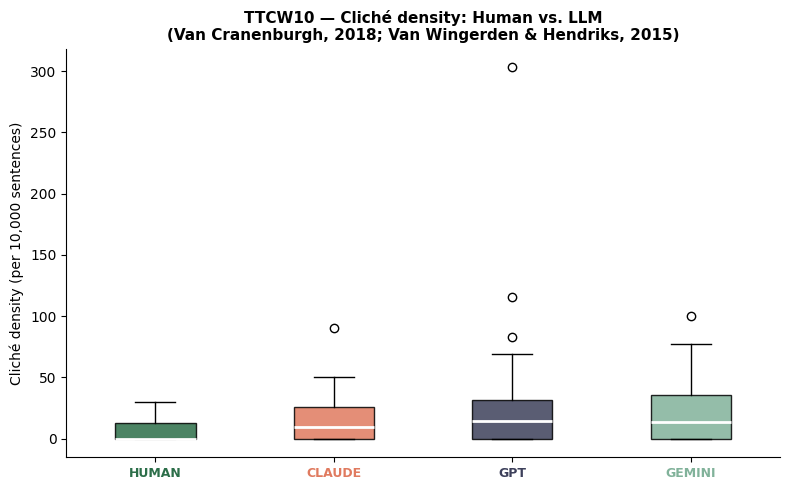

Saved: ttcw10_boxplot.png


In [80]:
CONTINUOUS_METRICS = ["cliche_density", "cliche_combined", "n_structural"]
print("\nStep 2: Source-level aggregation...")
df_ttcw10_source = compute_ttcw10_source_metrics(df_ttcw10)
print(df_ttcw10_source.to_string(index=False))

print("\nStep 4: Statistical tests...")
test_normality_ttcw10(df_ttcw10)
kruskal_results = test_ttcw10_kruskal(df_ttcw10)
mw_results       = test_ttcw10_mannwhitney(df_ttcw10, kruskal_results)
gpt_comparison   = test_ttcw10_gpt_version_comparison(df_ttcw10, paired=True)
gpt55_vs_human   = test_ttcw10_gpt55_vs_human(df_ttcw10, gpt_comparison)

print("\nStep 5: Plot...")
plot_ttcw10_boxplot(df_ttcw10)

<link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@tabler/icons-webfont@latest/tabler-icons.min.css">
<div id="ttcw11" style="font-family:sans-serif; display:flex; align-items:center; margin:0.5rem 0;">
  <div style="background:#FAECE7; border-radius:25px; padding:6px 20px; display:inline-flex; align-items:center;">
    <h2 style="font-size:20px; font-weight:600; color:#712B13; margin:0;">TTCW 11 - Originality in form and structure</h2>
  </div>
</div>

<p class="prose"> <a href="https://arxiv.org/pdf/2309.14556" style="color:#712B13;">Chakrabarty et al. (2024)</a> ground TTCW11 in <a href="https://web.education.wisc.edu/halverson/wp-content/uploads/sites/33/2012/12/jameson.pdf" style="color:#712B13;">Jameson's (1991)</a> analysis of postmodern literature, that specifically blurs different genres and achieves 'innovation' in form. <a href="https://arxiv.org/pdf/2305.19860" style="color:#712B13;">Wu et al. (2023)</a> find that LLMs story-outputs overall have less adverb and punctuation, incorporating more deterministic, conjunctive, and auxiliary structures in their syntax. <a href="https://arxiv.org/pdf/2301.07597" style="color:#712B13;">Guo et al. (2023)</a> & <a href="https://arxiv.org/pdf/2304.14543" style="color:#712B13;">Seals and Shalin (2023)</a> also state that LLMs use more deterministic, conjunctive, and auxiliary structures. This is operationalizable as <b>sentence-length variance</b> (low variance = homogeneous structure) or as the proportion of sentences following a <b>similar syntactic template</b>. These features are operationalizable using computational methods.  </p>

<div style="display:grid; grid-template-columns:1fr 1fr 1fr; gap:0.75rem; margin:0.75rem 0;">

  <div class="cat-card" style="margin:0; padding:0.7rem 0.9rem;">
    <p style="margin:0 0 0.25rem 0;">
      <code>punctuation_density</code>
    </p>
    <p style="margin:0; font-size:0.8rem; color:#555; line-height:1.5;">
      Count of punctuation tokens per sentence — a proxy for stylistic
      richness through dialogue markers, dashes, ellipses, and colons.
    </p>
  </div>

  <div class="cat-card" style="margin:0; padding:0.7rem 0.9rem; background:#FAECE7;">
    <p style="margin:0 0 0.25rem 0;">
      <code>adverb_density</code>
    </p>
    <p style="margin:0; font-size:0.8rem; color:#555; line-height:1.5;">
      Proportion of tokens tagged as ADV by spaCy —
      <a href="https://aclanthology.org/2023.acl-long.standard" style="color:#085041;">Wu et al. (2023)</a>
      find LLMs use significantly fewer adverbs than human writers.
    </p>
  </div>

  <div class="cat-card" style="margin:0; padding:0.7rem 0.9rem;">
    <p style="margin:0 0 0.25rem 0;">
      <code>sentence_length_variance</code>
    </p>
    <p style="margin:0; font-size:0.8rem; color:#555; line-height:1.5;">
      Variance of sentence lengths in tokens across the story, combined
      with the variance of syntactic templates used. Low variance =
      homogeneous structure; high variance = formal flexibility.
    </p>
  </div>

</div>

<div class="nb-info" style="margin:1rem 0;">
  <p class="prose">
    <b>Note.</b> <code>sentence_length_variance</code> is
    unreliable for very short stories with fewer than 10 sentences,
    due to small sample variance instability.
  </p>
</div>

In [309]:
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
 
from collections import Counter
from itertools import combinations
from scipy.stats import kruskal, mannwhitneyu, shapiro
from tqdm import tqdm
 
import spacy
nlp = spacy.load("nl_core_news_lg")
 
SOURCES = ["human", "claude", "gpt", "gemini"]
 
TTCW11_METRICS = [
    "punctuation_density",
    "adverb_density",
    "sentence_length_variance",
    "pos_sequence_entropy",
]

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Originality in form and structure · Overall functions</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  Core functions 
</h3>
<div style="display:grid; grid-template-columns:1fr 1fr; gap:0.75rem; margin:0.75rem 0;">

<div class="cat-card" style="margin:0.5rem 0; padding:0.6rem 0.9rem;">
  <table style="width:100%; border-collapse:collapse; font-size:0.85rem; line-height:1.4;">
    <tr style="background:#f9f9f9;">
      <th style="padding:0.3rem 0.5rem 0.3rem 0.3rem; text-align:left; font-weight:600; color:#712B13; white-space:nowrap;">
        Function
      </th>
      <th style="padding:0.3rem 0 0.3rem 0.5rem; text-align:left; font-weight:600; color:#712B13;">
        Description
      </th>
    </tr>
    <tr>
      <td style="padding:0.4rem 0.5rem 0.4rem 0.3rem; vertical-align:middle; white-space:nowrap;">
        <code>compute_punctuation_density()</code>
      </td>
      <td style="padding:0.4rem 0 0.4rem 0.5rem; vertical-align:middle;">
        Punctuation tokens per sentence — proxy for stylistic richness
      </td>
    </tr>
    <tr>
      <td style="padding:0.4rem 0.5rem 0.4rem 0.3rem; vertical-align:middle; white-space:nowrap;">
        <code>compute_adverb_density()</code>
      </td>
      <td style="padding:0.4rem 0 0.4rem 0.5rem; vertical-align:middle;">
        Proportion of tokens tagged ADV
      </td>
    </tr>
    <tr>
      <td style="padding:0.4rem 0.5rem 0.4rem 0.3rem; vertical-align:middle; white-space:nowrap;">
        <code>compute_sentence_length_variance()</code>
      </td>
      <td style="padding:0.4rem 0 0.4rem 0.5rem; vertical-align:middle;">
        Variance of sentence lengths in tokens (ddof=1)
      </td>
    </tr>
    <tr>
      <td style="padding:0.4rem 0.5rem 0.4rem 0.3rem; vertical-align:middle; white-space:nowrap;">
        <code>compute_pos_sequence_entropy()</code>
      </td>
      <td style="padding:0.4rem 0 0.4rem 0.5rem; vertical-align:middle;">
        Shannon entropy over POS trigram distributions
      </td>
    </tr>
    <tr>
      <td style="padding:0.4rem 0.5rem 0.4rem 0.3rem; vertical-align:middle; white-space:nowrap;">
        <code>compute_ttcw11()</code>
      </td>
      <td style="padding:0.4rem 0 0.4rem 0.5rem; vertical-align:middle;">
        Applies all four metrics to every story in the dataset
      </td>
    </tr>
  </table>
</div>

In [310]:
def compute_punctuation_density(doc) -> float:
    sents   = list(doc.sents)
    n_sents = len(sents)
    if n_sents == 0:
        return np.nan
    n_punct = sum(1 for token in doc if token.is_punct)
    return round(n_punct / n_sents, 4)

def compute_adverb_density(doc) -> float:
    tokens = [t for t in doc if not t.is_space]
    n      = len(tokens)
    if n == 0:
        return np.nan
    n_adv = sum(1 for t in tokens if t.pos_ == "ADV")
    return round(n_adv / n, 4)

def compute_sentence_length_variance(doc) -> float:
    sents        = list(doc.sents)
    sent_lengths = [
        len([t for t in s if not t.is_space and not t.is_punct])
        for s in sents
    ]
    if len(sent_lengths) < 2:
        return np.nan
    return round(float(np.var(sent_lengths, ddof=1)), 4)


def compute_pos_sequence_entropy(doc) -> float:
    trigrams = []
    for sent in doc.sents:
        pos_seq = [
            token.pos_
            for token in sent
            if not token.is_space and not token.is_punct
        ]
        for i in range(len(pos_seq) - 2):
            trigrams.append(tuple(pos_seq[i:i + 3]))
 
    if len(trigrams) < 3:
        return np.nan
 
    counts  = Counter(trigrams)
    total   = sum(counts.values())
    probs   = [c / total for c in counts.values()]
    entropy = -sum(p * math.log2(p) for p in probs if p > 0)
    return round(entropy, 4)

In [311]:
def compute_ttcw11_metrics(text: str) -> dict:
    if not text or not text.strip():
        return {m: np.nan for m in TTCW11_METRICS}
    doc = nlp(text)
    return {
        "punctuation_density":      compute_punctuation_density(doc),
        "adverb_density":           compute_adverb_density(doc),
        "sentence_length_variance": compute_sentence_length_variance(doc),
        "pos_sequence_entropy":     compute_pos_sequence_entropy(doc),
    }

In [312]:
def compute_ttcw11(df: pd.DataFrame) -> pd.DataFrame:
    rows = []
    for _, row in tqdm(df.iterrows(), total=len(df), desc="TTCW11"):
        metrics = compute_ttcw11_metrics(row["clean_text"])
        rows.append({
            "story_id": row["story_id"],
            "source":   row["source"],
            **metrics,
        })
    return (
        pd.DataFrame(rows)
        .sort_values(["story_id", "source"])
        .reset_index(drop=True)
    )

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Originality in form and structure · Aggregate results</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  3. Aggregating results per source
</h3>
<p class="prose">
  To make a comparison between the four sources inside the dataset, the
  narrative ending metric is aggregated into a single result per source
  by taking the <b>median</b><sup><a href="#fn-ttcw4-median" style="color:#712B13;">*</a></sup>
  across all stories, yielding a typical ending-profile per source.
  This is carried out by <code>compute_ttcw11_source_metrics()</code>.
</p>
<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<div id="fn-ttcw4-median" style="font-size:12px; color:#666;">
  <sup>*</sup> The median is used instead of the mean since the data
  is not normally distributed (see section 4). <a href="#fn-ttcw4-median-ref">↩</a>
</div>

In [313]:
def compute_ttcw11_source_metrics(df_ttcw11: pd.DataFrame) -> pd.DataFrame:
    return (
        df_ttcw11
        .groupby("source")[TTCW11_METRICS]
        .agg(["median", lambda x: x.quantile(0.75) - x.quantile(0.25)])
        .round(4)
        .reset_index()
    )

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Originality in form and structure· Statistical analysis</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  4. Statistical testing
</h3>

<p class="prose">Three statistical tests will be run in sequence:</p>

<div class="grid-2" style="margin:1rem 0 1.5rem 0;">

  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#712B13;">1. Shapiro–Wilk</strong>
      <span class="cat-badge" style="background:#FAECE7;color:#712B13;">Normality</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
      To test whether the results are normally distributed within each source, the binary Shapiro-wilk test will be applied to each subset. Shapiro-Wilk tests work when the observations > 3 and < 50. Here, the test runs per group, so it's testing normality on n=36 per source. 
    </p>
  </div>

  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#712B13;">2. Kruskal–Wallis</strong>
      <span class="cat-badge" style="background:#FAECE7;color:#712B13;">Group comparison</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
     The Shapiro–Wilk test indicated that normality assumptions were violated for most source–metric combinations. The Kruskal-Wallis test is chosen here since it is a <b>non-parametric test</b> of whether the <b>median</b> differences across sources exceed what would be expected by chance. 
    </p>
  </div>

  <div class="cat-card" style="grid-column: 1 / -1;">
    <div class="cat-header">
      <strong style="color:#712B13;">3. Mann–Whitney U</strong>
      <span class="cat-badge" style="background:#FAECE7;color:#712B13;">Pairwise · Bonferroni</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
Only runs when the Kruskal-Wallis gives significant results. The Mann-Whitney U test is used to compare each LLM model to the human writers. This test is chosen since these are pairwise comparisons (human vs. each LLM individually). Bonferroni correction adjusts for the number of simultaneous comparisons (n metrics × 3 LLM sources) to reduce the risk of false positives. Alongside each p-value, Cliff's delta is reported as an effect size.
    </p>
  </div>

</div>

<br>

In [314]:
def test_normality_ttcw11(df_ttcw11: pd.DataFrame):
    print("Shapiro-Wilk normality tests — TTCW11 metrics")
    print(f"{'Metric':<28} {'Source':<10} {'W':>8} {'p':>10}  normal?")
    print("─" * 62)
    for metric in TTCW11_METRICS:
        for source in SOURCES:
            vals = df_ttcw11[df_ttcw11["source"] == source][metric].dropna()
            if len(vals) < 3:
                continue
            stat, p = shapiro(vals)
            print(f"{metric:<28} {source:<10} {stat:>8.4f} {p:>10.4f}  "
                  f"{'yes' if p > 0.05 else 'NO'}")
        print()

In [315]:
def test_ttcw11_kruskal(df_ttcw11: pd.DataFrame) -> pd.DataFrame:
    rows = []
    print("Kruskal-Wallis — TTCW11 metrics across sources")
    print(f"{'Metric':<28} {'H':>8} {'p':>10}  {'high':<10} {'low':<10}  sig?")
    print("─" * 68)
    for metric in TTCW11_METRICS:
        groups  = [df_ttcw11[df_ttcw11["source"] == s][metric].dropna().values
                   for s in SOURCES]
        if any(len(g) < 2 for g in groups):
            print(f"{metric:<28} {'n/a':>8} {'n/a':>10}")
            rows.append({"metric": metric, "H": np.nan, "p": np.nan,
                         "significant": False, "highest": None, "lowest": None})
            continue
        stat, p  = kruskal(*groups)
        sig      = p < 0.05
        medians  = {s: df_ttcw11[df_ttcw11["source"] == s][metric].median()
                    for s in SOURCES}
        highest  = max(medians, key=medians.get)
        lowest   = min(medians, key=medians.get)
        print(f"{metric:<28} {stat:>8.4f} {p:>10.4f}  {highest:<10} {lowest:<10}  "
              f"{'*' if sig else ''}")
        rows.append({"metric": metric, "H": stat, "p": p,
                     "significant": sig, "highest": highest, "lowest": lowest})
    return pd.DataFrame(rows)

In [316]:
def cliffs_delta(a, b):
    """Effect size for unpaired Mann-Whitney U. Range -1 to 1."""
    a, b = np.asarray(a), np.asarray(b)
    greater = sum(x > y for x in a for y in b)
    less    = sum(x < y for x in a for y in b)
    return (greater - less) / (len(a) * len(b))

def interpret_effect(d):
    d = abs(d)
    if d < 0.147: return "negligible"
    if d < 0.33:  return "small"
    if d < 0.474: return "medium"
    return "large"
    
def test_ttcw11_mannwhitney(df_ttcw11: pd.DataFrame, kruskal_results: pd.DataFrame) -> pd.DataFrame:
    significant_metrics = kruskal_results[kruskal_results["significant"]]["metric"].tolist()

    if not significant_metrics:
        print("No significant Kruskal-Wallis results.")
        return pd.DataFrame()

    llm_sources = ["claude", "gpt", "gemini"]
    n_human     = len(llm_sources) * len(significant_metrics)
    rows = []

    for metric in significant_metrics:
        print(f"\n{'='*100}")
        print(f"  {metric.upper()}")
        print(f"{'='*100}")
        print(f"\n  Human vs. LLM  (Bonferroni n={n_human})")
        print(f"  {'Comparison':<22} {'U':>8} {'p_raw':>10} {'p_corr':>10}  "
              f"{'delta':>8} {'(size)':<12} {'Direction':<25}  Sig?")
        print(f"  {'-'*105}")

        human_vals = df_ttcw11[df_ttcw11["source"] == "human"][metric].dropna().values

        for llm in llm_sources:
            llm_vals = df_ttcw11[df_ttcw11["source"] == llm][metric].dropna().values
            if len(human_vals) < 2 or len(llm_vals) < 2:
                continue
            u, p      = mannwhitneyu(human_vals, llm_vals, alternative="two-sided")
            delta     = cliffs_delta(human_vals, llm_vals)
            label     = interpret_effect(delta)
            p_corr    = min(p * n_human, 1.0)
            direction = f"human {'>' if np.median(human_vals) > np.median(llm_vals) else '<'} {llm}"
            sig       = p_corr < 0.05
            print(f"  {'human vs ' + llm:<22} {u:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
                  f"{delta:>8.3f} ({label:<10}) {direction:<25}  {'*' if sig else '-'}")
            rows.append({"metric": metric, "vs": llm, "U": u, "p": p, "p_corr": p_corr,
                         "cliffs_delta": delta, "effect_label": label,
                         "direction": direction, "significant": sig})

    return pd.DataFrame(rows)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Originality in Form and Structure · GPT-4o vs. GPT-5.5</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  4. Direct model-version comparison
</h3>
<p class="prose">
  To find if there is a significant difference between GPT-4o and GPT-5.5 on formal/structural originality, a Wilcoxon signed-rank test will be run separately. It asks specifically whether <b>upgrading the model</b> changes how syntactically homogeneous or varied its stories are.
</p>
<div class="nb-info" style="margin:1rem 0;">
  <p class="prose" style="margin:0;">
    Each GPT-4o and GPT-5.5 story comes from the <b>same prompt</b> (matched by <code>story_id</code>), so a <b>paired Wilcoxon signed-rank test</b> is used instead of the unpaired Mann-Whitney U applied above. Pairing controls for prompt-to-prompt variance and gives more power at the same n=36. Bonferroni correction is applied across the 4 TTCW11 metrics within this test only, separate from the human-vs-LLM correction above. Alongside each p-value, the <b>matched rank-biserial correlation</b> is reported as an effect size, to show the magnitude of any shift, not just its significance.
  </p>
</div>
<p class="prose">
  Only when this test returns a significant result for a given metric, a follow-up comparison is run: GPT-5.5 vs. human on that metric only. This checks whether the model-version shift moved GPT-5.5 closer to or further from human-like formal/structural originality.
</p>

In [317]:
def matched_rank_biserial(a, b):
    """Effect size for paired Wilcoxon. Range -1 to 1."""
    diffs = np.array(a) - np.array(b)
    diffs = diffs[diffs != 0]
    ranks = rankdata(np.abs(diffs))
    pos_sum = ranks[diffs > 0].sum()
    neg_sum = ranks[diffs < 0].sum()
    return (pos_sum - neg_sum) / (pos_sum + neg_sum)

def test_ttcw11_gpt_version_comparison(df_ttcw11: pd.DataFrame, paired: bool = True) -> pd.DataFrame:
    """
    Direct comparison of GPT-4o ('gpt') vs GPT-5.5 ('gpt_5.5') across all TTCW11
    metrics. Kept separate from the human-vs-LLM family above (see TTCW1 for the
    full reasoning on correction-scope).
    """
    gpt4o = df_ttcw11[df_ttcw11["source"] == "gpt"].set_index("story_id")
    gpt55 = df_ttcw11[df_ttcw11["source"] == "gpt_5.5"].set_index("story_id")

    test_name = "paired Wilcoxon signed-rank" if paired else "unpaired Mann-Whitney U"
    n_comparisons = len(TTCW11_METRICS)

    print("\nGPT-4o vs. GPT-5.5 — direct model comparison (TTCW11 metrics)")
    print(f"({test_name}, Bonferroni corrected across {n_comparisons} metrics)")
    print(f"{'Metric':<28} {'stat':>8} {'p_raw':>10} {'p_corr':>10}  "
          f"{'effect':>8} {'(size)':<12} {'direction':<20}  sig?")
    print("─" * 100)

    rows = []
    for metric in TTCW11_METRICS:
        if paired:
            common_ids = gpt4o.index.intersection(gpt55.index)
            a = gpt4o.loc[common_ids, metric].dropna()
            b = gpt55.loc[common_ids, metric].dropna()
            common_ids = a.index.intersection(b.index)
            a, b = a.loc[common_ids], b.loc[common_ids]
            if len(a) < 1:
                continue
            stat, p = wilcoxon(a.values, b.values)
            effect = matched_rank_biserial(a.values, b.values)
        else:
            a = gpt4o[metric].dropna()
            b = gpt55[metric].dropna()
            if len(a) < 1 or len(b) < 1:
                continue
            stat, p = mannwhitneyu(a.values, b.values, alternative="two-sided")
            effect = cliffs_delta(a.values, b.values)

        p_corr       = min(p * n_comparisons, 1.0)
        direction    = f"gpt {'>' if a.median() > b.median() else '<'} gpt_5.5"
        sig          = p_corr < 0.05
        effect_label = interpret_effect(effect)

        print(f"{metric:<28} {stat:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
              f"{effect:>8.3f} ({effect_label:<10}) {direction:<20}  {'*' if sig else ''}")
        rows.append({"metric": metric, "stat": stat, "p": p, "p_corr": p_corr,
                     "significant": sig, "direction": direction,
                     "effect_size": effect, "effect_label": effect_label})

    return pd.DataFrame(rows)

In [318]:
def test_ttcw11_gpt55_vs_human(df_ttcw11: pd.DataFrame, gpt_comparison: pd.DataFrame) -> pd.DataFrame:
    """
    Standalone, separately-corrected test: does GPT-5.5 differ from human on
    TTCW11 metrics? Only runs on metrics flagged significant in the GPT-4o vs.
    GPT-5.5 comparison above.
    """
    significant_metrics = gpt_comparison[gpt_comparison["significant"]]["metric"].tolist()

    if not significant_metrics:
        print("No significant GPT-4o vs. GPT-5.5 differences — GPT-5.5 vs. human not run.")
        return pd.DataFrame()

    human = df_ttcw11[df_ttcw11["source"] == "human"]
    gpt55 = df_ttcw11[df_ttcw11["source"] == "gpt_5.5"]
    n_comparisons = len(significant_metrics)

    print(f"\nGPT-5.5 vs. Human — TTCW11 metrics "
          f"(only metrics where GPT-4o→GPT-5.5 shifted: {', '.join(significant_metrics)})")
    print(f"{'Metric':<28} {'U':>8} {'p_raw':>10} {'p_corr':>10}  "
          f"{'delta':>8} {'(size)':<12} {'direction':<20}  sig?")
    print("─" * 100)

    rows = []
    for metric in significant_metrics:
        h = human[metric].dropna().values
        g = gpt55[metric].dropna().values
        u, p   = mannwhitneyu(h, g, alternative="two-sided")
        delta  = cliffs_delta(h, g)
        label  = interpret_effect(delta)
        p_corr = min(p * n_comparisons, 1.0)
        sig    = p_corr < 0.05
        direction = f"human {'>' if np.median(h) > np.median(g) else '<'} gpt_5.5"

        print(f"{metric:<28} {u:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
              f"{delta:>8.3f} ({label:<10}) {direction:<20}  {'*' if sig else ''}")
        rows.append({"metric": metric, "U": u, "p": p, "p_corr": p_corr,
                     "cliffs_delta": delta, "effect_label": label,
                     "direction": direction, "significant": sig})

    return pd.DataFrame(rows)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Originality in form and structure · Visualization</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  Visualization
</h3>
<p class="prose">To give a clear overview of the data, a plot will be generated:</p>

<ul class="cat-items" style="border:1px solid #e5e5e5;border-radius:10px;padding:0 1.25rem;margin:0;">
    <li style="padding:14px 0;">
    <code>plot_ttcw11_boxplot()</code>
    <span> Boxplot grouped by source.</span>
  </li>
</ul>
<br>

In [319]:
def plot_ttcw11_boxplot(df_ttcw11: pd.DataFrame):
    metric_labels = {
        "punctuation_density":      "Punctuation density\n(punct tokens / sentence)",
        "adverb_density":           "Adverb density\n(prop. ADV tokens)",
        "sentence_length_variance": "Sentence length variance\n(token count variance)",
        "pos_sequence_entropy":     "POS sequence entropy\n(trigram Shannon entropy)",
    }
 
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
 
    for ax, (col, label) in zip(axes, metric_labels.items()):
        data   = [df_ttcw11[df_ttcw11["source"] == s][col].dropna().values
                  for s in SOURCES]
        colors = [COLORS[s] for s in SOURCES]
 
        bp = ax.boxplot(data, patch_artist=True,
                        medianprops={"color": "white", "linewidth": 2})
        for patch, color in zip(bp["boxes"], colors):
            patch.set_facecolor(color)
            patch.set_alpha(0.85)
 
        ax.set_xticks(range(1, len(SOURCES) + 1))
        ax.set_xticklabels([s.upper() for s in SOURCES],
                           fontsize=9, fontweight="bold")
        for tick, color in zip(ax.get_xticklabels(), colors):
            tick.set_color(color)
 
        ax.set_title(label, fontsize=10, fontweight="bold")
        ax.spines[["top", "right"]].set_visible(False)
 
    plt.suptitle("TTCW11 — Structural flexibility: Human vs. LLM",
                 fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.savefig("ttcw11_overview.png", dpi=150, bbox_inches="tight")
    plt.show()
    print("Saved: ttcw11_overview.png")

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Originality in form and structure · Run the code</p>

<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  Run everything
</h3>

In [ ]:
print("Step 1: Computing TTCW11 metrics...")
df_ttcw11 = compute_ttcw11(df)
print(df_ttcw11.groupby("source")[TTCW11_METRICS].median().round(4))

Step 1: Computing TTCW11 metrics...


TTCW11: 100%|█████████████████████████████████| 179/179 [00:33<00:00,  5.29it/s]


         punctuation_density  adverb_density  sentence_length_variance  \
source                                                                   
claude                1.9423          0.0588                   27.1016   
gemini                1.8000          0.0435                   38.5063   
gpt                   2.0910          0.0497                   38.5866   
gpt_5.5               1.8944          0.0761                   43.0293   
human                 1.6016          0.0733                   38.9995   

         pos_sequence_entropy  
source                         
claude                 7.4283  
gemini                 7.3595  
gpt                    7.3008  
gpt_5.5                7.8415  
human                  7.5840  

Step 2: Source-level aggregation...
 source punctuation_density            adverb_density            sentence_length_variance            pos_sequence_entropy           
                     median <lambda_0>         median <lambda_0>                   medi

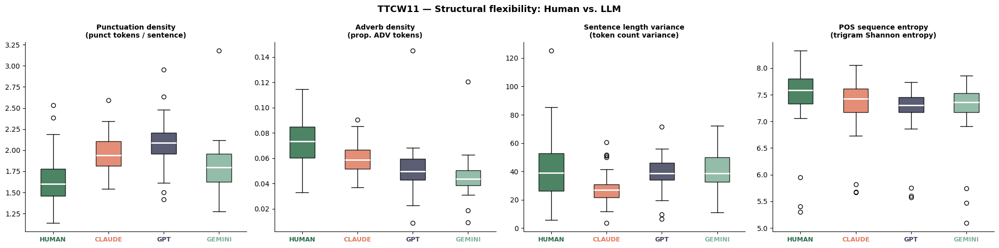

Saved: ttcw11_overview.png


In [320]:
print("\nStep 2: Source-level aggregation...")
df_source = compute_ttcw11_source_metrics(df_ttcw11)
print(df_source.to_string(index=False))
 
print("\nStep 3: Statistical tests...")
test_normality_ttcw11(df_ttcw11)
kruskal_results = test_ttcw11_kruskal(df_ttcw11)
mw_results       = test_ttcw11_mannwhitney(df_ttcw11, kruskal_results)
gpt_comparison   = test_ttcw11_gpt_version_comparison(df_ttcw11, paired=True)
gpt55_vs_human   = test_ttcw11_gpt55_vs_human(df_ttcw11, gpt_comparison)
 
print("\nStep 6: Plots...")
plot_ttcw11_boxplot(df_ttcw11)

<link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@tabler/icons-webfont@latest/tabler-icons.min.css">
<div id="ttcwELABORATION" style="font-family:sans-serif;">
  <hr style="border:none;">
  <div style="display:flex; align-items:center; gap:10px; margin-bottom:6px;">
    <div style="background:#FAEEDA; border-radius:8px; padding:8px 10px; display:flex; align-items:center; justify-content:center;">
      <i class="ti ti-writing" style="font-size:2px; color:#633806;"></i>
    </div>
    <div>
      <div style="display:flex; align-items:center; gap:8px;">
        <h1 style="font-size:35px; font-weight:600; color: black; margin:0; padding-left: 15px; ">Elaboration</h1>
        <span style="font-size:15px; font-weight:600; background:#FAEEDA;color:#633806; padding:5px 10px; border-radius:20px;">TTCW 12–14</span>
      </div>
      <p style="font-size:15px; color:#aaa; margin:2px 0 0 0; padding-left: 15px;">How are the details in the story described?</p>
    </div>
  </div>

<link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@tabler/icons-webfont@latest/tabler-icons.min.css">
<div id="ttcw12" style="font-family:sans-serif; display:flex; align-items:center; margin:0.5rem 0;">
  <div style="background:#FAEEDA; border-radius:25px; padding:6px 20px; display:inline-flex; align-items:center;">
    <h2 style="font-size:20px; font-weight:600; color:#633806; margin:0;">TTCW 12 - World building and setting </h2>
  </div>
</div>

<p class="prose">
  <a href="https://arxiv.org/pdf/2309.14556" style="color:#633806;">Chakrabarty et al. (2024)</a>
  define TTCW12 by arguing that effective writers use <b>sensory details</b> to
  paint a picture of the environment a story takes place in.
  <a href="https://link.springer.com/article/10.3758/s13428-023-02239-6" style="color:#633806;">Speed &amp; Brysbaert (2022)</a>
  present participants with words and ask them to what extent they
  experienced each word through hearing, sight, smell, taste, touch, or
  internal body sensations. The participants used a scale from 0 (no relation to the sensory experience) to 5 (very high relation to the sensory experience). From this study they developed sensory
  modality norms for over 24,000 Dutch words across six perceptual
  modalities: audition, gustation, haptics, olfaction, vision, and
  interoception.
</p>

<p class="prose">
  <a href="https://link.springer.com/book/10.1007/978-3-662-66035-5" style="color:#633806;">Schumacher (2023)</a>
  describes how spatial features in narrative texts can be extracted using
  Named Entity Recognition.
  <a href="https://www-archiv.fdm.uni-hamburg.de/lhn/node/55.html" style="color:#633806;">Ryan (2014)</a>
  implements spatial frames as a further element that evokes a story world.
  Both note that prepositions can be used to describe locative aspects (for example, <i>hij liep door het bos</i>).
</p>

<p class="prose">
  These two methods will be used in the current study by implementing three proxies:
</p>

<div style="display:grid; grid-template-columns:1fr 1fr 1fr; gap:0.75rem; margin:0.75rem 0;">

  <div class="cat-card" style="margin:0; padding:0.7rem 0.9rem;">
    <p style="margin:0 0 0.25rem 0;">
      <code>sensory_density</code>
    </p>
    <p style="margin:0 0 0.4rem 0; font-size:0.8rem; color:#555; line-height:1.5;">
      Mean total perceptual strength of content words (NOUN, VERB, ADJ,
      ADV), summed across all six modalities and normalised by the
      theoretical maximum of 30 (6 modalities × 5-point scale).
    </p>
    <p style="margin:0; font-size:0.78rem; color:#888;">
      <a href="https://link.springer.com/article/10.3758/s13428-023-02239-6"
         style="color:#633806;">Speed &amp; Brysbaert (2022)</a>
    </p>
  </div>

  <div class="cat-card" style="margin:0; padding:0.7rem 0.9rem; background:#FAEEDA;">
    <p style="margin:0 0 0.25rem 0;">
      <code>sensory_breadth</code>
    </p>
    <p style="margin:0 0 0.4rem 0; font-size:0.8rem; color:#555; line-height:1.5;">
      Number of distinct modalities whose mean strength exceeds a
      threshold of 1.0 (out of 6). This should be interpreted as the lower boundary of detectable
      sensory association on the rating scale.
    </p>
    <p style="margin:0; font-size:0.78rem; color:#888;">
      <a href="https://link.springer.com/article/10.3758/s13428-023-02239-6"
         style="color:#633806;">Speed &amp; Brysbaert (2022)</a>
    </p>
  </div>

  <div class="cat-card" style="margin:0; padding:0.7rem 0.9rem;">
    <p style="margin:0 0 0.25rem 0;">
      <code>spatial_grounding</code>
    </p>
    <p style="margin:0 0 0.4rem 0; font-size:0.8rem; color:#555; line-height:1.5;">
      Proportion of sentences containing a named location entity
      (LOC, GPE, FAC) or a spatial prepositional phrase. This shows a
      surface-level signal of physical anchoring.
    </p>
    <p style="margin:0; font-size:0.78rem; color:#888;">
      <a href="https://link.springer.com/book/10.1007/978-3-662-66035-5"
         style="color:#633806;">Schumacher (2023)</a>;
      <a href="https://www-archiv.fdm.uni-hamburg.de/lhn/node/55.html"
         style="color:#633806;">Ryan (2014)</a>
    </p>
  </div>

</div>

<div class="nb-info" style="margin:1rem 0; background:#fef3c7; border-left:3px solid #d97706;">
  <p class="prose" style="color:#92400e;">
    Dutch Sensory Modality Norms are available at
    <a href="https://osf.io/ubvy2" style="color:#633806;">osf.io/ubvy2</a>.
    Download the main data file and save as
    <code>speed_dutch_sensory_norms.csv</code>.
  </p>
</div>

In [81]:
import re
import warnings
import numpy as np
import pandas as pd
import spacy
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict
from scipy.stats import kruskal, shapiro, mannwhitneyu, wilcoxon, rankdata
from tqdm import tqdm   # FIX: was used but never imported in the original script

warnings.filterwarnings("ignore", category=UserWarning)
nlp = spacy.load("nl_core_news_lg")

In [82]:
SOURCES = ["human", "claude", "gpt", "gemini"]
 
MODALITIES        = ["audition", "gustation", "haptics", "olfaction", "vision", "interoception"]
MODALITY_THRESHOLD = 1.0
SENSORY_DENSITY_MAX = 30.0   # 6 modalities × 5-point scale
 
TTCW12_METRICS = [
    "sensory_density",
    "sensory_breadth",
    "spatial_grounding",
]
 
# Named entity types signalling spatial grounding (Schumacher et al., 2024)
SPATIAL_ENT_TYPES = {"LOC", "GPE", "FAC"}
 
# Clearly locative prepositions only — ambiguous ones (van, over, naar)
# excluded as they frequently appear in non-locative contexts
# (e.g. 'het boek van Jan', 'een gesprek over het weer', 'hij keek naar haar')
SPATIAL_PREPS = {
    "in", "op", "aan", "bij", "naast", "achter", "voor",
    "onder", "boven", "tussen", "door", "langs", "binnen",
    "buiten", "rondom", "tegen", "uit",
}

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">World building and setting · Lexicon</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  1. Sensory lexicon
</h3>

<p class="prose">
  The sensoty lexicon is populated from <a href="https://link.springer.com/article/10.3758/s13428-023-02239-6" style="color:#633806;">Speed & Brysbaert (2022)</a>.
</p>

<div class="nb-info" style="margin:1rem 0; background:#fef3c7; border-left:3px solid #d97706;">
  <p class="prose" style="color:#92400e;">
   The rest of the TTCW12 pipeline only works when the lexicon is downloaded and saved as <code>speed_dutch_sensory_norms.csv</code>.
  </p>
</div>

In [83]:
def load_speed_sensory_norms(path: str = "speed_dutch_sensory_norms.csv") -> dict:
    COLUMN_MAP = {
        "horen":     "audition",
        "zien":      "vision",
        "ruiken":    "olfaction",
        "proeven":   "gustation",
        "voelen":    "haptics",
        "sensaties": "interoception",
    }
 
    lexicon = {}
    try:
        df = pd.read_csv(path, sep=None, engine="python", encoding="utf-8-sig")
        df.columns = [c.strip().lower() for c in df.columns]
        word_col   = next(c for c in df.columns if "woord" in c)
 
        for _, row in df.iterrows():
            word = str(row[word_col]).lower().strip()
            if not word or word == "nan":
                continue
            ratings = {}
            for nl_col, en_mod in COLUMN_MAP.items():
                try:
                    val = str(row[nl_col]).replace(",", ".")
                    ratings[en_mod] = float(val)
                except (ValueError, TypeError, KeyError):
                    ratings[en_mod] = 0.0
            lexicon[word] = ratings
 
        print(f"Speed & Brysbaert (2022) norms loaded: {len(lexicon):,} words")
 
    except FileNotFoundError:
        print(
            "WARNING: 'speed_dutch_sensory_norms.csv' not found.\n"
            "Download from https://osf.io/ubvy2 and save in working directory."
        )
    except Exception as e:
        print(f"ERROR loading Speed norms: {e}")
 
    return lexicon
 
 
SPEED_NORMS = load_speed_sensory_norms()
 

Speed & Brysbaert (2022) norms loaded: 24,036 words


<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">World building and setting · Implementation</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  2. Content-word lemma extraction
</h3>

<p class="prose">
  For each story, lowercase surface lemmas of content words are extracted:
  tokens tagged as NOUN, VERB, ADJ, or ADV that are neither punctuation
  nor stopwords. These lemmas are then matched against the
  <a href="https://link.springer.com/article/10.3758/s13428-023-02239-6" style="color:#633806;">Speed &amp; Brysbaert (2022)</a>
  sensory norms to compute perceptual strength scores.
</p>

<div class="nb-info" style="margin:1rem 0;">
  <p class="prose">
    <b>Note.</b> SpaCy's Dutch stopword list overlaps with some sensory
    words (for example <i>warm</i> and <i>koud</i> are marked as
    stopwords but carry clear perceptual content). Stopword filtering is
    retained here to reduce function-word noise, but this means a small
    number of sensory words may be undercounted. 
  </p>
</div>

In [84]:
def _content_tokens(text: str) -> list[str]:
    doc = nlp(text)
    return [
        t.lower_ for t in doc
        if t.pos_ in {"NOUN", "VERB", "ADJ", "ADV"}
        and not t.is_punct
        and t.is_alpha
    ]

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">World building and setting · Compute metrics</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  3. Computed TTCW12 metrics
</h3>

<p class="prose">
  Three independent metrics are computed per story from the sensory norms
  and spatial anchoring signals:
</p>

<div class="cat-card" style="margin:0.5rem 0; padding:0.6rem 0.9rem;">
  <p class="section-label" style="margin-bottom:0.4rem;">Sensory metrics
    (<a href="https://link.springer.com/article/10.3758/s13428-023-02239-6" style="color:#633806;">Speed &amp; Brysbaert, 2022</a>)
  </p>
  <table style="width:100%; border-collapse:collapse; font-size:0.85rem; line-height:1.4;">
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>sensory_density</code>
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
        Mean total sensory strength per content word, normalised by
        the theoretical maximum of 30 (6 modalities × 5-point scale).
        Score of 1.0 = maximum sensory saturation;
        score near 0 = abstract vocabulary with minimal sensory grounding.
      </td>
    </tr>
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>sensory_breadth</code>
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
        Proportion of the six modalities whose mean strength across
        content words exceeds the detection threshold of 1.0.
        Score of 1.0 = all six modalities actively evoked;
        score of 0.0 = no modality reaches detectable threshold.
      </td>
    </tr>
  </table>

  <p class="section-label" style="margin:0.8rem 0 0.4rem 0;">Spatial metric(<a href="https://link.springer.com/book/10.1007/978-3-662-66035-5" style="color:#633806;">Schumacher et al., 2024</a> &amp; <a href="https://www-archiv.fdm.uni-hamburg.de/lhn/node/55.html" style="color:#633806;">Ryan, 2014</a>) </p>
  <table style="width:100%; border-collapse:collapse; font-size:0.85rem; line-height:1.4;">
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>spatial_grounding</code>
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
        Proportion of sentences containing at least one spatial anchor,
        defined as either:
        <ul style="margin:0.4rem 0 0 0; padding-left:1.1rem; line-height:1.6;">
          <li>A named location entity (LOC, GPE, FAC)</li>
          <li>A spatial prepositional phrase (spatial preposition
              whose syntactic head is a nominal)</li>
        </ul>
      </td>
    </tr>
  </table>
</div>

In [85]:
def sensory_density(text: str) -> float:
    if not SPEED_NORMS:
        return np.nan
 
    tokens    = _content_tokens(text)
    strengths = [
        sum(SPEED_NORMS[t].get(m, 0.0) for m in MODALITIES)
        for t in tokens
        if t in SPEED_NORMS
    ]
 
    if not strengths:
        return np.nan
 
    return round(min(float(np.mean(strengths)) / SENSORY_DENSITY_MAX, 1.0), 4)

In [86]:
def sensory_breadth(text: str) -> float:
    if not SPEED_NORMS:
        return np.nan
 
    tokens           = _content_tokens(text)
    modality_scores: dict[str, list[float]] = defaultdict(list)
 
    for token in tokens:
        if token in SPEED_NORMS:
            for mod in MODALITIES:
                modality_scores[mod].append(SPEED_NORMS[token].get(mod, 0.0))
 
    if not modality_scores:
        return np.nan
 
    n_active = sum(
        1 for mod in MODALITIES
        if modality_scores[mod]
        and float(np.mean(modality_scores[mod])) >= MODALITY_THRESHOLD
    )
 
    return round(n_active / len(MODALITIES), 4)

In [87]:
def spatial_grounding_density(text: str) -> float:
    doc   = nlp(text)
    sents = list(doc.sents)
 
    if not sents:
        return np.nan
 
    n_grounded = 0
    for sent in sents:
        grounded = False
 
        # (a) named location entity
        if any(ent.label_ in SPATIAL_ENT_TYPES for ent in sent.ents):
            grounded = True
 
        # (b) clearly locative prepositional phrase
        if not grounded:
            for token in sent:
                if (
                    token.lower_ in SPATIAL_PREPS
                    and token.head.pos_ in {"NOUN", "PROPN"}
                ):
                    grounded = True
                    break
 
        if grounded:
            n_grounded += 1
 
    return round(n_grounded / len(sents), 4)

In [88]:
def compute_ttcw12_metrics(text: str) -> dict:
    if not text or not text.strip():
        return {m: np.nan for m in TTCW12_METRICS}
    return {
        "sensory_density":   sensory_density(text),
        "sensory_breadth":   sensory_breadth(text),
        "spatial_grounding": spatial_grounding_density(text),
    }

In [89]:
def compute_ttcw12(df: pd.DataFrame) -> pd.DataFrame:
    rows = []
    for _, row in tqdm(df.iterrows(), total=len(df), desc="TTCW12"):
        try:
            metrics = compute_ttcw12_metrics(row["clean_text"])
        except Exception as e:
            print(f"  Skipping story {row['story_id']} [{row['source']}]: {e}")
            metrics = {m: np.nan for m in TTCW12_METRICS}
        rows.append({
            "story_id": row["story_id"],
            "source":   row["source"],
            **metrics,
        })
 
    return (
        pd.DataFrame(rows)
        .sort_values(["story_id", "source"])
        .reset_index(drop=True)
    )

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">World building and setting · Aggregate results</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  4. Aggregating results per source
</h3>
<p class="prose">
  To make a comparison between the four sources inside the dataset, the
  narrative ending metric is aggregated into a single result per source
  by taking the <b>median</b><sup><a href="#fn-ttcw4-median" style="color:#F5C842;">*</a></sup>
  across all stories. 
  This is carried out by <code>compute_ttcw12_source_metrics()</code>.
</p>
<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<div id="fn-ttcw4-median" style="font-size:12px; color:#666;">
  <sup>*</sup> The median is used instead of the mean since the data
  is not normally distributed (see section 5). <a href="#fn-ttcw4-median-ref">↩</a>
</div>

In [90]:
def compute_ttcw12_source_metrics(df_wb: pd.DataFrame) -> pd.DataFrame:
    return (
        df_wb
        .groupby("source")[TTCW12_METRICS]
        .agg(["median", lambda x: x.quantile(0.75) - x.quantile(0.25)])
        .round(4)
        .reset_index()
    )

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">World building and setting · Statistical analysis</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  5. Subjectivity profiles and statistical testing
</h3>

<p class="prose">Three statistical tests will be run in sequence:</p>

<div class="grid-2" style="margin:1rem 0 1.5rem 0;">

  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#633806;">1. Shapiro–Wilk</strong>
      <span class="cat-badge" style="background:#FAEEDA;color:#633806;">Normality</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
      To test whether the results are normally distributed within each source, the binary Shapiro-wilk test will be applied to each subset. Shapiro-Wilk tests work when the observations > 3 and < 50. Here, the test runs per group, so it's testing normality on n=36 per source. 
    </p>
  </div>

  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#633806;">2. Kruskal–Wallis</strong>
      <span class="cat-badge" style="background:#FAEEDA;color:#633806;">Group comparison</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
     The Shapiro–Wilk test indicated that normality assumptions were violated for most source–metric combinations. The Kruskal-Wallis test is chosen here since it is a <b>non-parametric test</b> of whether the <b>median</b> differences across sources exceed what would be expected by chance. 
    </p>
  </div>

  <div class="cat-card" style="grid-column: 1 / -1;">
    <div class="cat-header">
      <strong style="color:#633806;">3. Mann–Whitney U</strong>
      <span class="cat-badge" style="background:#FAEEDA;color:#633806;">Pairwise · Bonferroni</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
Only runs when the Kruskal-Wallis gives significant results. The Mann-Whitney U test is used to compare each LLM model to the human writers. This test is chosen since these are pairwise comparisons (human vs. each LLM individually). Bonferroni correction adjusts for the number of simultaneous comparisons (n metrics × 3 LLM sources) to reduce the risk of false positives. Alongside each p-value, Cliff's delta is reported as an effect size.
    </p>
  </div>

</div>

<br>

In [91]:
def test_normality_ttcw12(df_wb: pd.DataFrame):
    print("Shapiro-Wilk normality tests — TTCW12 metrics")
    print(f"{'Metric':<22} {'Source':<10} {'W':>8} {'p':>10}  normal?")
    print("─" * 55)
    for metric in TTCW12_METRICS:
        for source in SOURCES:
            vals = df_wb[df_wb["source"] == source][metric].dropna()
            if len(vals) < 3:
                continue
            stat, p = shapiro(vals)
            print(f"{metric:<22} {source:<10} {stat:>8.4f} {p:>10.4f}  "
                  f"{'yes' if p > 0.05 else 'NO'}")
        print()

In [92]:
def test_ttcw12_kruskal(df_wb: pd.DataFrame) -> pd.DataFrame:
    rows = []
    print("Kruskal-Wallis — TTCW12 metrics across sources")
    print(f"{'Metric':<22} {'H':>8} {'p':>10}  {'high':<10} {'low':<10}  sig?")
    print("─" * 62)
    for metric in TTCW12_METRICS:
        groups  = [df_wb[df_wb["source"] == s][metric].dropna().values
                   for s in SOURCES]
        if any(len(g) < 2 for g in groups):
            print(f"{metric:<22} {'n/a':>8} {'n/a':>10}")
            rows.append({"metric": metric, "H": np.nan, "p": np.nan,
                         "significant": False, "highest": None, "lowest": None})
            continue
        stat, p  = kruskal(*groups)
        sig      = p < 0.05
        medians  = {s: df_wb[df_wb["source"] == s][metric].median()
                    for s in SOURCES}
        highest  = max(medians, key=medians.get)
        lowest   = min(medians, key=medians.get)
        print(f"{metric:<22} {stat:>8.4f} {p:>10.4f}  {highest:<10} {lowest:<10}  "
              f"{'*' if sig else ''}")
        rows.append({"metric": metric, "H": stat, "p": p,
                     "significant": sig, "highest": highest, "lowest": lowest})
    return pd.DataFrame(rows)

In [93]:
def test_ttcw12_mannwhitney(df_wb: pd.DataFrame, kruskal_results: pd.DataFrame) -> pd.DataFrame:
    significant_metrics = kruskal_results[kruskal_results["significant"]]["metric"].tolist()

    if not significant_metrics:
        print("No significant Kruskal-Wallis results.")
        return pd.DataFrame()

    llm_sources = ["claude", "gpt", "gemini"]
    all_pairs   = list(combinations(SOURCES, 2))
    llm_pairs   = [p for p in all_pairs if "human" not in p]
    n_human     = len(llm_sources) * len(significant_metrics)
    n_pairwise  = len(all_pairs) * len(significant_metrics)
    rows = []

    for metric in significant_metrics:
        print(f"\n{'='*100}")
        print(f"  {metric.upper()}")
        print(f"{'='*100}")

        print(f"\n  Human vs. LLM")
        print(f"  {'Comparison':<22} {'U':>8} {'p_raw':>10} {'p_corr':>10}  "
              f"{'delta':>8} {'(size)':<12} {'Direction':<25}  Sig?")
        print(f"  {'-'*105}")

        human_vals    = df_wb[df_wb["source"] == "human"][metric].dropna().values
        any_human_sig = False

        for llm in llm_sources:
            llm_vals = df_wb[df_wb["source"] == llm][metric].dropna().values
            if len(human_vals) < 2 or len(llm_vals) < 2:
                continue
            u, p      = mannwhitneyu(human_vals, llm_vals, alternative="two-sided")
            delta     = cliffs_delta(human_vals, llm_vals)
            label     = interpret_effect(delta)
            p_corr    = min(p * n_human, 1.0)
            direction = f"human {'>' if np.median(human_vals) > np.median(llm_vals) else '<'} {llm}"
            sig       = p_corr < 0.05
            if sig:
                any_human_sig = True
            print(f"  {'human vs ' + llm:<22} {u:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
                  f"{delta:>8.3f} ({label:<10}) {direction:<25}  {'*' if sig else '-'}")
            rows.append({"metric": metric, "vs": llm, "U": u, "p": p, "p_corr": p_corr,
                         "cliffs_delta": delta, "effect_label": label,
                         "direction": direction, "significant": sig})

        if any_human_sig:
            print(f"\n  ✓ Significant human-LLM difference found.")
            continue

        print(f"\n  → No significant human-LLM differences.")
        print(f"  Pairwise LLM comparisons")
        print(f"  {'Comparison':<22} {'U':>8} {'p_raw':>10} {'p_corr':>10}  "
              f"{'delta':>8} {'(size)':<12} {'Direction':<25}  Sig?")
        print(f"  {'-'*105}")

        found_any = False
        for s1, s2 in llm_pairs:
            v1 = df_wb[df_wb["source"] == s1][metric].dropna().values
            v2 = df_wb[df_wb["source"] == s2][metric].dropna().values
            if len(v1) < 2 or len(v2) < 2:
                continue
            u, p      = mannwhitneyu(v1, v2, alternative="two-sided")
            delta     = cliffs_delta(v1, v2)
            label     = interpret_effect(delta)
            p_corr    = min(p * n_pairwise, 1.0)
            direction = f"{s1} {'>' if np.median(v1) > np.median(v2) else '<'} {s2}"
            sig       = p_corr < 0.05
            if sig:
                found_any = True
            print(f"  {s1 + ' vs ' + s2:<22} {u:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
                  f"{delta:>8.3f} ({label:<10}) {direction:<25}  {'*' if sig else '-'}")
            rows.append({"metric": metric, "vs": f"{s1}_vs_{s2}", "U": u, "p": p, "p_corr": p_corr,
                         "cliffs_delta": delta, "effect_label": label,
                         "direction": direction, "significant": sig})

        if found_any:
            print(f"\n  ✓ Significant difference lies between LLM sources.")
        else:
            print(f"\n  ✗ No significant pairwise differences after Bonferroni correction.")
        print()

    return pd.DataFrame(rows)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">World Building and Setting · GPT-4o vs. GPT-5.5</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  6. Direct model-version comparison
</h3>
<p class="prose">
  To find if there is a significant difference between GPT-4o and GPT-5.5 on world building and setting, a Wilcoxon signed-rank test will be run separately. It asks specifically whether <b>upgrading the model</b> changes how sensorially rich or spatially grounded its stories are.
</p>
<div class="nb-info" style="margin:1rem 0;">
  <p class="prose" style="margin:0;">
    Each GPT-4o and GPT-5.5 story comes from the <b>same prompt</b> (matched by <code>story_id</code>), so a <b>paired Wilcoxon signed-rank test</b> is used instead of the unpaired Mann-Whitney U applied above. Pairing controls for prompt-to-prompt variance and gives more power at the same n=36. Bonferroni correction is applied across the 3 TTCW12 metrics within this test only, separate from the human-vs-LLM correction above. Alongside each p-value, the <b>matched rank-biserial correlation</b> is reported as an effect size, to show the magnitude of any shift, not just its significance.
  </p>
</div>
<p class="prose">
  Only when this test returns a significant result for a given metric, a follow-up comparison is run: GPT-5.5 vs. human on that metric only. This checks whether the model-version shift moved GPT-5.5 closer to or further from human-like sensory density, breadth, or spatial grounding.
</p>

In [94]:
def test_ttcw12_gpt_version_comparison(df_wb: pd.DataFrame, paired: bool = True) -> pd.DataFrame:
    """
    Direct comparison of GPT-4o ('gpt') vs GPT-5.5 ('gpt_5.5') across all TTCW12
    metrics. Kept separate from the human-vs-LLM family above (see TTCW1 for the
    full reasoning on correction-scope).
    """
    gpt4o = df_wb[df_wb["source"] == "gpt"].set_index("story_id")
    gpt55 = df_wb[df_wb["source"] == "gpt_5.5"].set_index("story_id")

    test_name = "paired Wilcoxon signed-rank" if paired else "unpaired Mann-Whitney U"
    n_comparisons = len(TTCW12_METRICS)

    print("\nGPT-4o vs. GPT-5.5 — direct model comparison (TTCW12 metrics)")
    print(f"({test_name}, Bonferroni corrected across {n_comparisons} metrics)")
    print(f"{'Metric':<22} {'stat':>8} {'p_raw':>10} {'p_corr':>10}  "
          f"{'effect':>8} {'(size)':<12} {'direction':<20}  sig?")
    print("─" * 95)

    rows = []
    for metric in TTCW12_METRICS:
        if paired:
            common_ids = gpt4o.index.intersection(gpt55.index)
            a = gpt4o.loc[common_ids, metric].dropna()
            b = gpt55.loc[common_ids, metric].dropna()
            common_ids = a.index.intersection(b.index)
            a, b = a.loc[common_ids], b.loc[common_ids]
            if len(a) < 1:
                continue
            stat, p = wilcoxon(a.values, b.values)
            effect = matched_rank_biserial(a.values, b.values)
        else:
            a = gpt4o[metric].dropna()
            b = gpt55[metric].dropna()
            if len(a) < 1 or len(b) < 1:
                continue
            stat, p = mannwhitneyu(a.values, b.values, alternative="two-sided")
            effect = cliffs_delta(a.values, b.values)

        p_corr       = min(p * n_comparisons, 1.0)
        direction    = f"gpt {'>' if a.median() > b.median() else '<'} gpt_5.5"
        sig          = p_corr < 0.05
        effect_label = interpret_effect(effect)

        print(f"{metric:<22} {stat:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
              f"{effect:>8.3f} ({effect_label:<10}) {direction:<20}  {'*' if sig else ''}")
        rows.append({"metric": metric, "stat": stat, "p": p, "p_corr": p_corr,
                     "significant": sig, "direction": direction,
                     "effect_size": effect, "effect_label": effect_label})

    return pd.DataFrame(rows)



In [95]:
def test_ttcw12_gpt55_vs_human(df_wb: pd.DataFrame, gpt_comparison: pd.DataFrame) -> pd.DataFrame:
    """
    Standalone, separately-corrected test: does GPT-5.5 differ from human on
    TTCW12 metrics? Only runs on metrics flagged significant in the GPT-4o vs.
    GPT-5.5 comparison above.
    """
    significant_metrics = gpt_comparison[gpt_comparison["significant"]]["metric"].tolist()

    if not significant_metrics:
        print("No significant GPT-4o vs. GPT-5.5 differences — GPT-5.5 vs. human not run.")
        return pd.DataFrame()

    human = df_wb[df_wb["source"] == "human"]
    gpt55 = df_wb[df_wb["source"] == "gpt_5.5"]
    n_comparisons = len(significant_metrics)

    print(f"\nGPT-5.5 vs. Human — TTCW12 metrics "
          f"(only metrics where GPT-4o→GPT-5.5 shifted: {', '.join(significant_metrics)})")
    print(f"{'Metric':<22} {'U':>8} {'p_raw':>10} {'p_corr':>10}  "
          f"{'delta':>8} {'(size)':<12} {'direction':<20}  sig?")
    print("─" * 95)

    rows = []
    for metric in significant_metrics:
        h = human[metric].dropna().values
        g = gpt55[metric].dropna().values
        u, p   = mannwhitneyu(h, g, alternative="two-sided")
        delta  = cliffs_delta(h, g)
        label  = interpret_effect(delta)
        p_corr = min(p * n_comparisons, 1.0)
        sig    = p_corr < 0.05
        direction = f"human {'>' if np.median(h) > np.median(g) else '<'} gpt_5.5"

        print(f"{metric:<22} {u:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
              f"{delta:>8.3f} ({label:<10}) {direction:<20}  {'*' if sig else ''}")
        rows.append({"metric": metric, "U": u, "p": p, "p_corr": p_corr,
                     "cliffs_delta": delta, "effect_label": label,
                     "direction": direction, "significant": sig})

    return pd.DataFrame(rows)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">World building and setting · Visualization</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  Visualization
</h3>
<p class="prose">To give a clear overview of the data, three plots will be generated:</p>

<div class="cat-card" style="margin:0.5rem 0; padding:0.6rem 0.9rem;">
  <table style="width:100%; border-collapse:collapse; font-size:0.85rem; line-height:1.4;">
    <tr style="background:#f9f9f9;">
      <th style="padding:0.3rem 0.5rem 0.3rem 0.3rem; text-align:left; font-weight:600; color:#633806; white-space:nowrap;">
        Function
      </th>
      <th style="padding:0.3rem 0 0.3rem 0.5rem; text-align:left; font-weight:600; color:#633806;">
        Output
      </th>
    </tr>
    <tr>
      <td style="padding:0.4rem 0.5rem 0.4rem 0.3rem; vertical-align:middle; white-space:nowrap;">
        <code>plot_ttcw12_boxplots()</code>
      </td>
      <td style="padding:0.4rem 0 0.4rem 0.5rem; vertical-align:middle;">
        Boxplots for all three TTCW12 metrics per source
      </td>
    </tr>
    <tr>
      <td style="padding:0.4rem 0.5rem 0.4rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>plot_modality_radar()</code>
      </td>
      <td style="padding:0.4rem 0 0.4rem 0.5rem; vertical-align:top;">
        Radar chart showing median sensory modality strength per source —
        reveals qualitative differences in which senses are evoked
      </td>
    </tr>
    <tr>
      <td style="padding:0.4rem 0.5rem 0.4rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>plot_world_building_by_story()</code>
      </td>
      <td style="padding:0.4rem 0 0.4rem 0.5rem; vertical-align:top;">
        Line plot of each TTCW12 metric per story set, one line per
        source. Dashed lines show source medians. Shared patterns =
        prompt effect; divergence = source effect.
      </td>
    </tr>
  </table>
</div>

In [96]:
def plot_ttcw12_boxplots(df_wb: pd.DataFrame):
    metric_labels = {
        "sensory_density":   "Sensory density\n(norm. total perceptual strength)",
        "sensory_breadth":   "Sensory breadth\n(prop. modalities above threshold)",
        "spatial_grounding": "Spatial grounding\n(prop. spatially anchored sentences)",
    }
 
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
 
    for ax, (col, label) in zip(axes, metric_labels.items()):
        data   = [df_wb[df_wb["source"] == s][col].dropna().values for s in SOURCES]
        colors = [COLORS[s] for s in SOURCES]
 
        bp = ax.boxplot(data, patch_artist=True,
                        medianprops={"color": "white", "linewidth": 2})
        for patch, color in zip(bp["boxes"], colors):
            patch.set_facecolor(color)
            patch.set_alpha(0.85)
 
        ax.set_xticks(range(1, len(SOURCES) + 1))
        ax.set_xticklabels([s.upper() for s in SOURCES],
                           fontsize=9, fontweight="bold")
        for tick, color in zip(ax.get_xticklabels(), colors):
            tick.set_color(color)
 
        ax.set_ylim(0, 1)
        ax.set_title(label, fontsize=10, fontweight="bold")
        ax.spines[["top", "right"]].set_visible(False)
 
    plt.suptitle("TTCW12 — World building: Human vs. LLM",
                 fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.savefig("ttcw12_boxplots.png", dpi=150, bbox_inches="tight")
    plt.show()
    print("Saved: ttcw12_boxplots.png")

In [97]:
def plot_modality_radar(df: pd.DataFrame):
    if not SPEED_NORMS:
        print("Speed norms not loaded — radar chart unavailable.")
        return
 
    source_modality_medians: dict[str, list[float]] = {}
 
    for source in SOURCES:
        subset     = df[df["source"] == source]
        mod_medians = []
        for mod in MODALITIES:
            scores = []
            for _, row in subset.iterrows():
                for token in _content_tokens(row["clean_text"]):
                    if token in SPEED_NORMS:
                        scores.append(SPEED_NORMS[token].get(mod, 0.0))
            mod_medians.append(float(np.median(scores)) if scores else 0.0)
        source_modality_medians[source] = mod_medians
 
    n_mods = len(MODALITIES)
    angles  = np.linspace(0, 2 * np.pi, n_mods, endpoint=False).tolist()
    angles += angles[:1]
    labels  = [m.capitalize() for m in MODALITIES]
 
    fig, ax = plt.subplots(figsize=(7, 7), subplot_kw=dict(polar=True))
 
    for source, medians in source_modality_medians.items():
        values = medians + medians[:1]
        ax.plot(angles, values, color=COLORS[source],
                linewidth=2, label=source.upper())
        ax.fill(angles, values, color=COLORS[source], alpha=0.1)
 
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels, fontsize=10)
    ax.set_title("TTCW12 — Median sensory modality strength per source",
                 fontsize=12, fontweight="bold", pad=20)
    ax.legend(loc="upper right", bbox_to_anchor=(1.3, 1.1), fontsize=9)
 
    plt.tight_layout()
    plt.savefig("ttcw12_modality_radar.png", dpi=150, bbox_inches="tight")
    plt.show()
    print("Saved: ttcw12_modality_radar.png")

In [98]:
def plot_world_building_by_story(df_wb: pd.DataFrame):
    story_ids  = sorted(df_wb["story_id"].unique())
    dim_labels = {
        "sensory_density":   "Sensory density",
        "sensory_breadth":   "Sensory breadth",
        "spatial_grounding": "Spatial grounding",
    }
 
    fig, axes = plt.subplots(3, 1, figsize=(15, 11), sharex=True)
 
    for ax, (metric, label) in zip(axes, dim_labels.items()):
        for source in SOURCES:
            subset = df_wb[df_wb["source"] == source].set_index("story_id")
            scores = [
                float(subset.loc[sid, metric])
                if sid in subset.index and not np.isnan(subset.loc[sid, metric])
                else np.nan
                for sid in story_ids
            ]
            ax.plot(story_ids, scores, color=COLORS[source],
                    linewidth=1.8, marker="o", markersize=4,
                    alpha=0.85, label=source.upper())
 
        for source in SOURCES:
            med = df_wb[df_wb["source"] == source][metric].median()
            ax.axhline(med, color=COLORS[source],
                       linewidth=0.8, linestyle="--", alpha=0.5)
 
        ax.set_ylabel(label, fontsize=9)
        ax.set_ylim(0, 1)
        ax.legend(fontsize=8, loc="upper right")
        ax.spines[["top", "right"]].set_visible(False)
 
    axes[-1].set_xlabel("Story set (prompt ID)", fontsize=10)
    axes[-1].set_xticks(story_ids)
    axes[-1].set_xticklabels(story_ids, fontsize=7)
 
    fig.suptitle(
        "TTCW12 — World-building metrics per story set\n"
        "(dashed = source median; shared patterns = prompt effect; "
        "divergence = source effect)",
        fontsize=12, fontweight="bold",
    )
    plt.tight_layout()
    plt.savefig("ttcw12_world_building_by_story.png", dpi=150, bbox_inches="tight")
    plt.show()
    print("Saved: ttcw12_world_building_by_story.png")

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">World building and setting · Run the code</p>

<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  Run everything
</h3>

<div class="nb-info" style="margin:1rem 0; background:#fef3c7; border-left:3px solid #d97706;">
  <p class="prose" style="color:#92400e;"> Before running, make sure the sensory norms are downloaded from <a href="https://osf.io/ubvy2" style="color:#633806;">https://osf.io/ubvy2</a> and saved as <code>'speed_dutch_sensory_norms.csv'</code>
  </p>
</div>

In [ ]:
print("Step 1: Computing TTCW12 metrics...")
df_wb = compute_ttcw12(df)
print(df_wb.groupby("source")[TTCW12_METRICS].median().round(4))

Step 1: Computing TTCW12 metrics...


TTCW12: 100%|█████████████████████████████████| 179/179 [01:40<00:00,  1.77it/s]


         sensory_density  sensory_breadth  spatial_grounding
source                                                      
claude            0.2038           0.5000             0.2755
gemini            0.2085           0.5000             0.3724
gpt               0.2058           0.4166             0.3680
gpt_5.5           0.2012           0.5000             0.2849
human             0.2036           0.3333             0.2904

Step 2: Source-level aggregation...
 source sensory_density            sensory_breadth            spatial_grounding           
                 median <lambda_0>          median <lambda_0>            median <lambda_0>
 claude          0.2038     0.0135          0.5000     0.1667            0.2755     0.0749
 gemini          0.2085     0.0146          0.5000     0.1667            0.3724     0.1049
    gpt          0.2058     0.0163          0.4166     0.1667            0.3680     0.1284
gpt_5.5          0.2012     0.0144          0.5000     0.1667            0.2849  

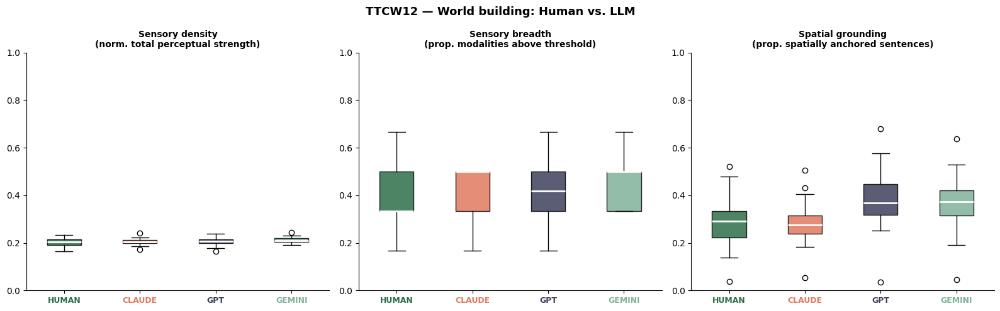

Saved: ttcw12_boxplots.png


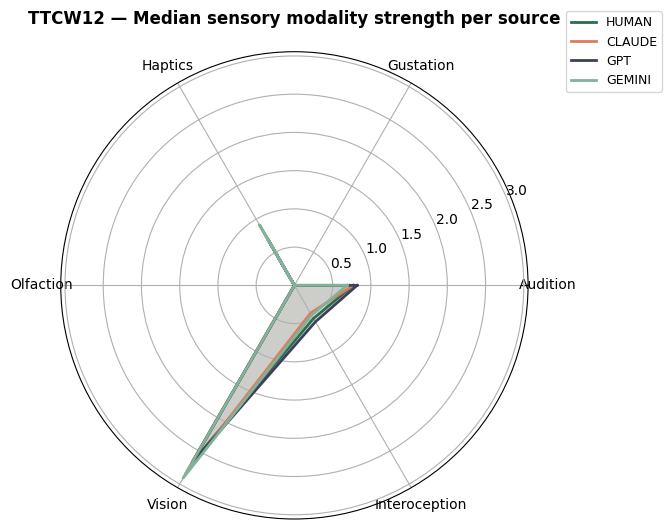

Saved: ttcw12_modality_radar.png


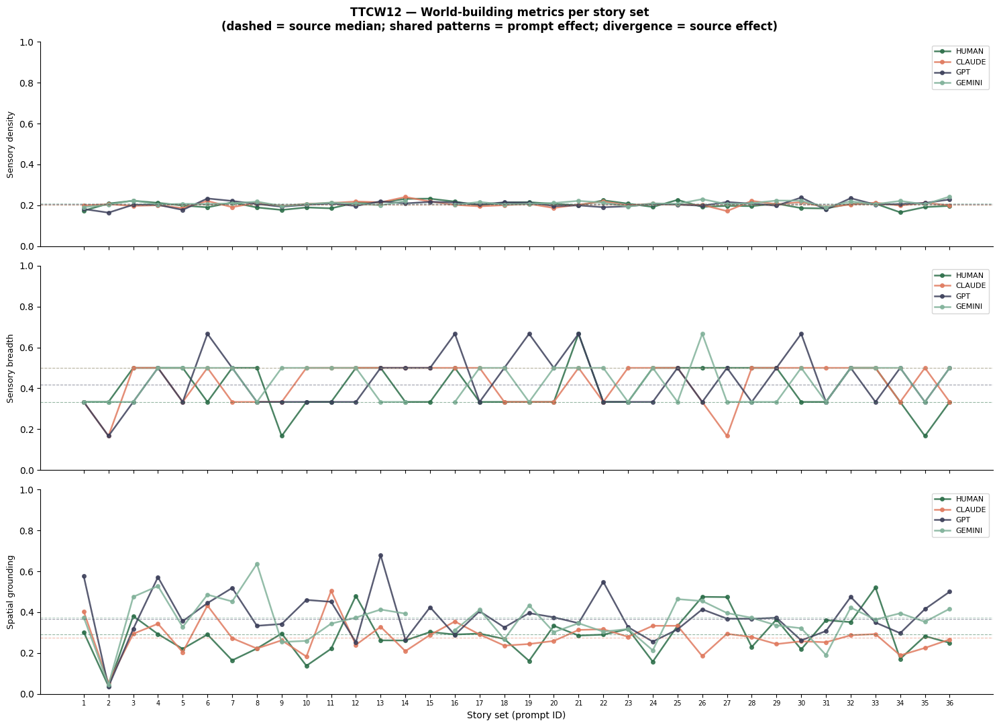

Saved: ttcw12_world_building_by_story.png


In [99]:
print("Step 1: Computing TTCW12 metrics...")
df_wb = compute_ttcw12(df)
print(df_wb.groupby("source")[TTCW12_METRICS].median().round(4))
 
print("\nStep 2: Source-level aggregation...")
df_source = compute_ttcw12_source_metrics(df_wb)
print(df_source.to_string(index=False))
 
print("\nStep 3: Statistical tests...")
test_normality_ttcw12(df_wb)
kruskal_results = test_ttcw12_kruskal(df_wb)
mw_results       = test_ttcw12_mannwhitney(df_wb, kruskal_results)
gpt_comparison   = test_ttcw12_gpt_version_comparison(df_wb, paired=True)
gpt55_vs_human   = test_ttcw12_gpt55_vs_human(df_wb, gpt_comparison)

print("\nStep 4: Plots...")
plot_ttcw12_boxplots(df_wb)
plot_modality_radar(df)
plot_world_building_by_story(df_wb)

<link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@tabler/icons-webfont@latest/tabler-icons.min.css">
<div id="ttcw13" style="font-family:sans-serif; display:flex; align-items:center; margin:0.5rem 0;">
  <div style="background:#FAEEDA; border-radius:25px; padding:6px 20px; display:inline-flex; align-items:center;">
    <h2 style="font-size:20px; font-weight:600; color:#633806; margin:0;">TTCW 13 - Character Development </h2>
  </div>
</div>

<p class="prose">  TTCW13 revolves around character development: whether each character
  feels developed at an appropriate level of complexity.
  <a href="https://aclanthology.org/2025.coling-main.566.pdf" style="color:#633806;">Amalvy et al. (2025)</a>
  quantify how much narrative "space" each character occupies through
  narrator description, dialogue, and discussion by other characters.
  This can be useful to approach how relevant a character is in a story.
  <a href="https://link.springer.com/article/10.3758/s13428-012-0243-8" style="color:#633806;">Moors (2013)</a>
  discusses valence scores across sentences. A character who is present
  in sentences that are associated with joy, fear, grief, and resolution
  has high variability and has a better chance of being an 'emotionally
  developed' character instead of a flat character that just fills the
  plot. Their study implemented the  <a href="https://www.researchgate.net/publication/257495445_Appraisal_Theories_of_Emotion_State_of_the_Art_and_Future_Development" style="color:#633806;">Moors  et al.(2013)</a> Dutch Affective
  Norms dataset: 4,299 Dutch words rated on three dimensions:
</p>

<div style="display:flex; gap:0.75rem; margin:0.75rem 0; flex-wrap:wrap;">

  <div class="cat-card" style="margin:0; padding:0.6rem 0.9rem; flex:1; min-width:120px;">
    <p style="margin:0 0 0.2rem 0; font-weight:700; font-size:1rem; color:#633806;">V</p>
    <p style="margin:0 0 0.15rem 0; font-size:0.85rem; font-weight:600;">Valence</p>
    <p style="margin:0; font-size:0.82rem; color:#555;">
      1 = very negative<br>7 = very positive
    </p>
  </div>

  <div class="cat-card" style="margin:0; padding:0.6rem 0.9rem; flex:1; min-width:120px; background:#FAEEDA;">
    <p style="margin:0 0 0.2rem 0; font-weight:700; font-size:1rem; color:#633806;">A</p>
    <p style="margin:0 0 0.15rem 0; font-size:0.85rem; font-weight:600;">Arousal</p>
    <p style="margin:0; font-size:0.82rem; color:#555;">
      1 = calm<br>7 = aroused
    </p>
  </div>

  <div class="cat-card" style="margin:0; padding:0.6rem 0.9rem; flex:1; min-width:120px;">
    <p style="margin:0 0 0.2rem 0; font-weight:700; font-size:1rem; color:#633806;">P</p>
    <p style="margin:0 0 0.15rem 0; font-size:0.85rem; font-weight:600;">Potency / Dominance</p>
    <p style="margin:0; font-size:0.82rem; color:#555;">
      1 = weak<br>7 = strong
    </p>
  </div>

</div>

<p class="prose">
  <a href="https://www.researchgate.net/publication/328475221_A_Social_Network_Analysis_of_Articles_on_Social_Network_Analysis" style="color:#633806;">Lee & Wilkinson (2018)</a> operationalises character importance through <b>Social Network Analysis (SNA)</b> of character co-occurrence patterns. A co-occurrence network can be constructed where named characters (nodes) and other characters are connected (with edges). The connection is made with characters who appear within a three-sentence window of each other. The amount of connections a character has with another character (edge weights) reflect co-occurrence frequency. Further, the proportion of other characters a given character is directly connected to (degree centrality) can be computed for each named character. This captures a
character's influence and embeddedness in the social fabric of the tory. A protagonist typically shows high degree centrality
  (<a href="https://www.researchgate.net/publication/328475221_A_Social_Network_Analysis_of_Articles_on_Social_Network_Analysis" style="color:#633806;">Lee & Wilkonson, 2018</a>); isolated or underdeveloped characters occupy peripheral positions in the network. An example of a Social Network graph is given in Figure 6. 
</p>

<figure style="margin:1.5rem 0;">
  <img
    src="social_network_analysis.png"
    alt="An example of a social network analysis for character co-occurrence in TTCW13"
    style="width:100%; max-width:900px; border:1px solid #e5e5e5; border-radius:10px;"
  />
  <figcaption style="
      margin-top:.75rem;
      font-size:13px;
      color:#666;
      line-height:1.6;
      text-align:left;
  ">
    <p style="margin:0;"><strong>Figure 6</strong>
    <em> Example of character co-occurrence network. </em></p>
    <p style="margin:.5rem 0 0; font-size:11px;">
      <em>Note.</em> Nodes represent named characters (PERSON entities);
      edges connect characters who appear within a three-sentence window
      of each other. Edge weight reflects co-occurrence frequency.
      Degree centrality, the proportion of other characters a given
      character is directly connected to, is used as a story-level
      measure of character embeddedness. Adapted from <a href="https://www.researchgate.net/publication/328475221_A_Social_Network_Analysis_of_Articles_on_Social_Network_Analysis" style="color:#633806;">Lee & Wilkinson (2018), p. 18. </a>.
    </p>
  </figcaption>
</figure>


<p class="prose">
  Three measures will be used to approximate character development:
</p>

<div class="cat-card" style="margin:0.5rem 0; padding:0.6rem 0.9rem;">
  <table style="width:100%; border-collapse:collapse; font-size:0.85rem; line-height:1.4;">
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>narrative_space</code>
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
        Proportion of story sentences in which each character appears
        (<a href="https://aclanthology.org/2025.coling-main.566.pdf" style="color:#633806;">Amalvy et al., 2025</a>).
        Median across characters used as story-level score.
      </td>
    </tr>
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap; background:#FAEEDA;">
        <code>emotional_variability</code>
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
        Standard deviation of sentence-level valence scores
        (<a href="https://www.researchgate.net/publication/257495445_Appraisal_Theories_of_Emotion_State_of_the_Art_and_Future_Development" style="color:#633806;">Moors  et al.(2013)</a>)
        in sentences where a character is mentioned (±VALENCE_WINDOW context window), normalised by theoretical maximum SD of 3.0.
        Median across characters used as story-level score.
      </td>
    </tr>
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>network_centrality</code>
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
        Degree centrality of each character in the co-occurrence network
        (<a href="https://www.researchgate.net/publication/328475221_A_Social_Network_Analysis_of_Articles_on_Social_Network_Analysis" style="color:#633806;">Lee & Wilkonson, 2018</a>): proportion of other characters a given character is directly connected to within a 3-sentence window. Median across characters used as story-level score.
      </td>
    </tr>
  </table>
</div>

<div class="nb-info" style="margin:1rem 0;">
  <p class="prose">
    <b>Note.</b> Characters referred to by pronoun after first
    introduction (<i>hij</i>, <i>ze</i>, <i>haar</i>) are not counted in <code>narrative_space</code>,
    systematically underestimating protagonist presence. Narrative space
    should be interpreted as a lower bound on actual character presence.
  </p>
</div>
<div class="nb-info" style="margin:1rem 0;">
  <p class="prose" style="margin-top:0.5rem;">
    <b>Note.</b> <code>emotional_variability</code> measures the
    contextual emotional variety of sentences around a character, not
    the character's own expressed emotional range. A character mentioned
    in emotionally varied contexts scores high regardless of whether
    they personally experience those emotions. 
  </p>
</div>

In [100]:
import re
import warnings
import numpy as np
import pandas as pd
import spacy
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from collections import defaultdict
from itertools import combinations
from scipy.stats import kruskal, shapiro, mannwhitneyu
from tqdm import tqdm 
 
warnings.filterwarnings("ignore", category=UserWarning)
nlp = spacy.load("nl_core_news_lg")


In [107]:
SOURCES = ["human", "claude", "gpt", "gemini"]


PRONOUNS_NL = {
    "hij", "hem", "zijn", "ze", "zij", "haar", "het",
    "hun", "hen", "zichzelf",
}

MIN_MENTIONS = 1 #focus on all characters: Chakrabarty et al. (2024) specifically refer to flat vs developped characters 

# Theoretical maximum SD for the Moors et al. (2013) 1–7 valence scale: half observations at 1.0, half at 7.0 → mean = 4.0, SD = 3.0
VALENCE_SCALE_MAX_SD = 3.0

VALENCE_WINDOW = 2
# NOTE: documented behavior says characters with fewer than 2 valence-scored
# sentences in their context window should get a score of 0.0 (since minimal
# emotional context is itself a signal of a flat character) — but the actual
# code below assigns NaN instead. See flagged mismatch above; not silently
# changed here since it's a methodological decision, not a typo.

TTCW13_METRICS = [
    "narrative_space",
    "emotional_variability",
    "network_centrality",
]

LLM_SOURCES = ["claude", "gpt", "gemini"]

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Character development · Implementation</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  1. Valence norms
</h3>

<p class="prose">
  Dutch affective norms are loaded from
  <a href="https://www.researchgate.net/publication/257495445_Appraisal_Theories_of_Emotion_State_of_the_Art_and_Future_Development" style="color:#633806;">Moors  et al. (2013)</a>
  covering 4,299 Dutch words rated on valence (V), arousal (A), and
  potency (P), each on a 1–7 scale. Only the combined mean valence
  column (<code>M V</code>) is used for
  <code>emotional_variability</code>.
</p>

<div style="display:flex; gap:0.75rem; margin:0.75rem 0; flex-wrap:wrap;">

  <div class="cat-card" style="margin:0; padding:0.6rem 0.9rem; flex:1; min-width:120px;">
    <p style="margin:0 0 0.2rem 0; font-weight:700; font-size:1rem; color:#633806;">V</p>
    <p style="margin:0 0 0.15rem 0; font-size:0.85rem; font-weight:600;">Valence</p>
    <p style="margin:0; font-size:0.82rem; color:#555;">
      1 = very negative<br>7 = very positive
    </p>
  </div>

  <div class="cat-card" style="margin:0; padding:0.6rem 0.9rem; flex:1; min-width:120px; background:#FAEEDA;">
    <p style="margin:0 0 0.2rem 0; font-weight:700; font-size:1rem; color:#633806;">A</p>
    <p style="margin:0 0 0.15rem 0; font-size:0.85rem; font-weight:600;">Arousal</p>
    <p style="margin:0; font-size:0.82rem; color:#555;">
      1 = calm<br>7 = aroused
    </p>
  </div>

  <div class="cat-card" style="margin:0; padding:0.6rem 0.9rem; flex:1; min-width:120px;">
    <p style="margin:0 0 0.2rem 0; font-weight:700; font-size:1rem; color:#633806;">P</p>
    <p style="margin:0 0 0.15rem 0; font-size:0.85rem; font-weight:600;">Potency / Dominance</p>
    <p style="margin:0; font-size:0.82rem; color:#555;">
      1 = weak<br>7 = strong
    </p>
  </div>

</div>

In [108]:
def load_valence_norms(
    path: str = "moors_dutch_affective_norms.csv",
) -> dict:
    norms = {}
    try:
        df = pd.read_csv(path, sep=";", header=1, encoding="latin-1")
        df.columns = [c.strip() for c in df.columns]
        for _, row in df.iterrows():
            word = str(row["Words"]).lower().strip()
            if not word or word == "nan":
                continue
            try:
                val = float(str(row["M V"]).replace(",", "."))
                norms[word] = val
            except (ValueError, TypeError):
                pass
        print(f"Moors et al. (2013) valence norms loaded: {len(norms):,} words")
    except FileNotFoundError:
        print(
            "WARNING: 'moors_dutch_affective_norms.csv' not found.\n"
            "Emotional variability scores will be NaN."
        )
    except Exception as e:
        print(f"ERROR loading Moors norms: {e}")
    return norms
 
 
VALENCE_NORMS = load_valence_norms()

Moors et al. (2013) valence norms loaded: 4,299 words


<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Character development · Implementation</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  2. Character extraction
</h3>

<p class="prose">
  Named characters are extracted as <code>PERSON</code> entities using the spaCy Dutch
  model (<code>nl_core_news_lg</code>). This follows
  <a href="https://link.springer.com/book/10.1007/978-3-662-66035-5" style="color:#633806;">Schumacher (2023)</a>
  for automated character identification in narrative texts. For each
  character, the sentence indices in which they are mentioned are recorded
  and used as the basis for all three downstream metrics.
</p>

<div class="nb-info" style="margin:1rem 0">
  <p class="prose">
    <b>Note</b> Unusual literary names, nicknames, and
    first-name-only references may be missed by the NER model.
    Characters referred to by pronoun after first introduction are not
    counted, systematically underestimating protagonist presence.
  </p>
</div>

In [109]:
def extract_characters(text: str) -> dict[str, list[int]]:
    doc   = nlp(text)
    sents = list(doc.sents)
    sent_start_to_idx = {sent.start_char: i for i, sent in enumerate(sents)}
 
    char_mentions: dict[str, list[int]] = defaultdict(list)
 
    for ent in doc.ents:
        if ent.label_ == "PERSON":
            name = ent.text.strip().title()
            if not name:
                continue
            for sent in sents:
                if sent.start_char <= ent.start_char < sent.end_char:
                    sent_idx = sent_start_to_idx.get(sent.start_char, -1)
                    if sent_idx >= 0:
                        char_mentions[name].append(sent_idx)
                    break
 
    return {
        name: idxs
        for name, idxs in char_mentions.items()
        if len(idxs) >= MIN_MENTIONS
    }
 

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Character development · Implementation</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  3. Narrative space
</h3>

<p class="prose">
  Proportion of story sentences in which each character appears, normalised by total sentence count. Following
  <a href="https://aclanthology.org/2025.coling-main.566.pdf" style="color:#633806;">Amalvy et al. (2025)</a>,  narrative space captures how much of the story's real estate a character occupies. This reflects the author's investment in developing that character.
</p>

<p class="prose">
For the story-level TTCW13 score, the narrative space of the <b>protagonist</b> (the character with the highest proportion) is used as the main signal: a well-developed story should have at least one character with substantial narrative presence.
</p>

In [110]:
def narrative_space(
    char_mentions: dict[str, list[int]],
    n_sentences:   int,
) -> dict[str, float]:
    if n_sentences == 0:
        return {}
    return {
        name: round(len(set(idxs)) / n_sentences, 4)
        for name, idxs in char_mentions.items()
    }

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Character development · Implementation</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  4. Emotional variability
</h3>

<p class="prose">
  Standard deviation of sentence-level valence scores in sentences where
  a character is mentioned, using a ±<code>VALENCE_WINDOW</code> sentence
  context window.  The resulting SD is normalised by the theoretical maximum of 3.0 (The maximum possible standard deviation on a 1–7 scale occurs when half the observations are at the absolute minimum (1) and half are at the absolute maximum (7). In that extreme case the SD works out to exactly 3.0) yielding a score between 0 and 1.
</p>

<div class="nb-info" style="margin:1rem 0;">
  <p class="prose">
    <b>Note.</b> This metric captures the contextual emotional variety
    of sentences <i>around</i> a character, not the character's own
    expressed emotional range. A character mentioned in emotionally
    varied contexts scores high regardless of whether they personally
    experience those emotions.
  </p>
</div>

In [111]:
def emotional_variability(
    text:          str,
    char_mentions: dict[str, list[int]],
) -> dict[str, float]:
    if not VALENCE_NORMS:
        return {name: np.nan for name in char_mentions}
 
    doc   = nlp(text)
    sents = list(doc.sents)
 
    # pre-compute mean valence per sentence
    sent_valences: list[float] = []
    for sent in sents:
        vals = [
            VALENCE_NORMS[t.lower_]
            for t in sent
            if t.lower_ in VALENCE_NORMS
            and t.pos_ in {"NOUN", "VERB", "ADJ", "ADV"}
            and not t.is_punct
        ]
        sent_valences.append(float(np.mean(vals)) if vals else np.nan)
 
    variability: dict[str, float] = {}
    n_sents = len(sents)
 
    for name, mention_idxs in char_mentions.items():
        context_indices = set()
        for idx in mention_idxs:
            for offset in range(-VALENCE_WINDOW, VALENCE_WINDOW + 1):
                ci = idx + offset
                if 0 <= ci < n_sents:
                    context_indices.add(ci)
 
        v_scores = [
            sent_valences[i]
            for i in sorted(context_indices)
            if not np.isnan(sent_valences[i])
        ]
 
        if len(v_scores) < 2:
            variability[name] = np.nan
        else:
            raw_sd = float(np.std(v_scores, ddof=1))
            variability[name] = round(min(raw_sd / VALENCE_SCALE_MAX_SD, 1.0), 4)
 
    return variability

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Character development · Implementation</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  5. Co-occurrence network
</h3>

<p class="prose">
  An undirected weighted co-occurrence network of characters is
  constructed following
  <a href="https://www.researchgate.net/publication/328475221_A_Social_Network_Analysis_of_Articles_on_Social_Network_Analysis" style="color:#633806;">Lee & Wilkonson, 2018</a>, who uses
  sentence-proximity as the primary signal for narrative interaction
  between characters. An edge is added between two characters whenever
  they appear within <code>WINDOW</code> sentences of each other; edge
  weight reflects co-occurrence frequency.
</p>

<div style="display:flex; gap:0.6rem; flex-wrap:wrap;">

<div style="flex:1; min-width:110px; background:#fff;
            border:1px solid #e5e5e5; border-radius:8px;
            padding:0.5rem 0.7rem;">
    <p style="margin:0 0 0.2rem 0; font-weight:700;
            font-size:0.85rem; color:#633806;">● Nodes</p>
    <p style="margin:0; font-size:0.8rem; color:#555;">
    Named characters (PERSON entities)
    </p>
</div>

<div style="flex:1; min-width:110px; background:#FAEEDA;
             border:1px solid #e5c99a; border-radius:8px;
             padding:0.5rem 0.7rem;">
    <p style="margin:0 0 0.2rem 0; font-weight:700;
            font-size:0.85rem; color:#633806;">— Edges</p>
    <p style="margin:0; font-size:0.8rem; color:#555;">
     Co-occurrence within <code>WINDOW</code> sentences
    </p>
</div>

<div style="flex:1; min-width:110px; background:#fff;
            border:1px solid #e5e5e5; border-radius:8px;
             padding:0.5rem 0.7rem;">
    <p style="margin:0 0 0.2rem 0; font-weight:700;
            font-size:0.85rem; color:#633806;">≡ Weight</p>
    <p style="margin:0; font-size:0.8rem; color:#555;">
        Thicker line = more frequent co-occurrence
      </p>
    </div>

</div>

In [112]:
def build_character_network(
    char_mentions: dict[str, list[int]],
    window:        int = 3,
) -> nx.Graph:
    G = nx.Graph()
    G.add_nodes_from(char_mentions.keys())
 
    sent_to_chars: dict[int, list[str]] = defaultdict(list)
    for name, idxs in char_mentions.items():
        for idx in idxs:
            sent_to_chars[idx].append(name)
 
    all_sent_idxs = sorted(sent_to_chars.keys())
 
    for i, sent_idx in enumerate(all_sent_idxs):
        window_chars: list[str] = []
        for j in range(i, min(i + window, len(all_sent_idxs))):
            window_chars.extend(sent_to_chars[all_sent_idxs[j]])
 
        for c1 in sent_to_chars[sent_idx]:
            for c2 in window_chars:
                if c1 != c2:
                    if G.has_edge(c1, c2):
                        G[c1][c2]["weight"] += 1
                    else:
                        G.add_edge(c1, c2, weight=1)
 
    return G

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Character development · Implementation</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  6. Network centrality
</h3>

<p class="prose">
  Degree centrality of each character in the co-occurrence network,
  following
  <a href="https://www.researchgate.net/publication/328475221_A_Social_Network_Analysis_of_Articles_on_Social_Network_Analysis" style="color:#633806;">Lee & Wilkonson, 2018</a>. Degree centrality
  is defined as the number of unique characters a character co-occurs
  with, divided by (total characters − 1): the proportion of all other
  characters a given character is directly connected to.
</p>

<div style="display:flex; gap:0.75rem; margin:0.75rem 0; flex-wrap:wrap;">

  <div style="flex:1; min-width:140px; background:white;
              border:1px solid #e5e5e5; border-radius:8px;
              padding:0.6rem 0.75rem;">
    <p style="margin:0 0 0.2rem 0; font-weight:700;
              font-size:0.85rem; color:#633806;">Centrality = 1.0</p>
    <p style="margin:0; font-size:0.8rem; color:#555;">
      Character co-occurs with every other character in the story —
      typical of a protagonist
    </p>
  </div>

  <div style="flex:1; min-width:140px; background:#FAEEDA;
              border:1px solid #e5c99a; border-radius:8px;
              padding:0.6rem 0.75rem;">
    <p style="margin:0 0 0.2rem 0; font-weight:700;
              font-size:0.85rem; color:#633806;">Centrality ≈ 0</p>
    <p style="margin:0; font-size:0.8rem; color:#555;">
      Character is isolated — few or no co-occurrences with others
    </p>
  </div>

  <div style="flex:1; min-width:140px; background:white;
              border:1px solid #e5e5e5; border-radius:8px;
              padding:0.6rem 0.75rem;">
    <p style="margin:0 0 0.2rem 0; font-weight:700;
              font-size:0.85rem; color:#633806;">Single character</p>
    <p style="margin:0; font-size:0.8rem; color:#555;">
      Centrality = 0 by definition — no other characters to connect to
    </p>
  </div>

</div>

In [113]:
def network_centrality(G: nx.Graph) -> dict[str, float]:
    if G.number_of_nodes() < 2:
        return {n: 0.0 for n in G.nodes()}
    return {
        name: round(cent, 4)
        for name, cent in nx.degree_centrality(G).items()
    }

In [114]:
def story_character_development(
    space:       dict[str, float],
    variability: dict[str, float],
    centrality:  dict[str, float],
) -> tuple[float, float, float, int]:
    chars = set(space) | set(variability) | set(centrality)
    if not chars:
        return np.nan, np.nan, np.nan, 0
 
    def _median_nonan(vals):
        clean = [v for v in vals if not np.isnan(v)]
        return round(float(np.median(clean)), 4) if clean else np.nan
 
    return (
        _median_nonan([space.get(c, np.nan)       for c in chars]),
        _median_nonan([variability.get(c, np.nan) for c in chars]),
        _median_nonan([centrality.get(c, np.nan)  for c in chars]),
        len(chars),
    )

In [115]:
def compute_ttcw13(df: pd.DataFrame) -> pd.DataFrame:
    rows            = []
    no_chars_stories = []
 
    for _, row in tqdm(df.iterrows(), total=len(df), desc="TTCW13"):
        text = row["clean_text"]
        try:
            doc           = nlp(text)
            n_sents       = len(list(doc.sents))
            char_mentions = extract_characters(text)
 
            if not char_mentions:
                no_chars_stories.append(
                    f"Story {row['story_id']} [{row['source']}]"
                )
                rows.append({
                    "story_id":              row["story_id"],
                    "source":                row["source"],
                    "narrative_space":       np.nan,
                    "emotional_variability": np.nan,
                    "network_centrality":    np.nan,
                    "n_characters":          0,
                    "no_characters":         True,
                })
                continue
 
            sp   = narrative_space(char_mentions, n_sents)
            var  = emotional_variability(text, char_mentions)
            G    = build_character_network(char_mentions)
            cent = network_centrality(G)
 
            ns, ev, nc, n_chars = story_character_development(sp, var, cent)
 
        except Exception as e:
            print(f"  Skipping story {row['story_id']} [{row['source']}]: {e}")
            ns = ev = nc = np.nan
            n_chars = 0
 
        rows.append({
            "story_id":              row["story_id"],
            "source":                row["source"],
            "narrative_space":       ns,
            "emotional_variability": ev,
            "network_centrality":    nc,
            "n_characters":          n_chars,
            "no_characters":         False,
        })
 
    if no_chars_stories:
        print(f"\n{len(no_chars_stories)} stories with no detected characters "
              f"(MIN_MENTIONS={MIN_MENTIONS}):")
        for s in no_chars_stories[:10]:
            print(f"  {s}")
        if len(no_chars_stories) > 10:
            print(f"  ... and {len(no_chars_stories) - 10} more")
 
    return (
        pd.DataFrame(rows)
        .sort_values(["story_id", "source"])
        .reset_index(drop=True)
    )

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Character development · Aggregate results</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
 7. Aggregating results per source
</h3>
<p class="prose">
  To make a comparison between the four sources inside the dataset, the
  narrative ending metric is aggregated into a single result per source
  by taking the <b>median</b><sup><a href="#fn-ttcw4-median" style="color:#F5C842;">*</a></sup>
  across all stories.
  This is carried out by <code>compute_ttcw13_source_metrics()</code>.
</p>
<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<div id="fn-ttcw4-median" style="font-size:12px; color:#666;">
  <sup>*</sup> The median is used instead of the mean since the data
  is not normally distributed (see section 8). <a href="#fn-ttcw4-median-ref">↩</a>
</div>

In [116]:
def compute_ttcw13_source_metrics(df_cd: pd.DataFrame) -> pd.DataFrame:
    return (
        df_cd
        .groupby("source")[TTCW13_METRICS]
        .agg(["median", lambda x: x.quantile(0.75) - x.quantile(0.25)])
        .round(4)
        .reset_index()
    )

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Character development · Statistical analysis</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  8. Subjectivity profiles and statistical testing
</h3>

<p class="prose">Three statistical tests will be run in sequence:</p>

<div class="grid-2" style="margin:1rem 0 1.5rem 0;">

  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#633806;">1. Shapiro–Wilk</strong>
      <span class="cat-badge" style="background:#FAEEDA;color:#633806;">Normality</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
      To test whether the results are normally distributed within each source, the binary Shapiro-wilk test will be applied to each subset. Shapiro-Wilk tests work when the observations > 3 and < 50. Here, the test runs per group, so it's testing normality on n=36 per source. 
    </p>
  </div>

  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#633806;">2. Kruskal–Wallis</strong>
      <span class="cat-badge" style="background:#FAEEDA;color:#633806;">Group comparison</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
     The Shapiro–Wilk test indicated that normality assumptions were violated for most source–metric combinations. The Kruskal-Wallis test is chosen here since it is a <b>non-parametric test</b> of whether the <b>median</b> differences across sources exceed what would be expected by chance. 
    </p>
  </div>

  <div class="cat-card" style="grid-column: 1 / -1;">
    <div class="cat-header">
      <strong style="color:#633806;">3. Mann–Whitney U</strong>
      <span class="cat-badge" style="background:#FAEEDA;color:#633806;">Pairwise · Bonferroni</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
Only runs when the Kruskal-Wallis gives significant results. The Mann-Whitney U test is used to compare each LLM model to the human writers. This test is chosen since these are pairwise comparisons (human vs. each LLM individually). Bonferroni correction adjusts for the number of simultaneous comparisons (n metrics × 3 LLM sources) to reduce the risk of false positives. Alongside each p-value, Cliff's delta is reported as an effect size.
    </p>
  </div>

</div>

<br>

In [117]:
def test_normality_ttcw13(df_cd: pd.DataFrame):
    print("Shapiro-Wilk normality tests — TTCW13 metrics")
    print(f"{'Metric':<26} {'Source':<10} {'W':>8} {'p':>10}  normal?")
    print("─" * 60)
    for metric in TTCW13_METRICS:
        for source in SOURCES:
            vals = df_cd[df_cd["source"] == source][metric].dropna()
            if len(vals) < 3:
                continue
            stat, p = shapiro(vals)
            print(f"{metric:<26} {source:<10} {stat:>8.4f} {p:>10.4f}  "
                  f"{'yes' if p > 0.05 else 'NO'}")
        print()

In [118]:
def test_ttcw13_kruskal(df_cd: pd.DataFrame) -> pd.DataFrame:
    rows = []
    print("Kruskal-Wallis — TTCW13 metrics across sources")
    print(f"{'Metric':<26} {'H':>8} {'p':>10}  {'high':<10} {'low':<10}  sig?")
    print("─" * 66)
    for metric in TTCW13_METRICS:
        groups  = [df_cd[df_cd["source"] == s][metric].dropna().values
                   for s in SOURCES]
        if any(len(g) < 2 for g in groups):
            print(f"{metric:<26} {'n/a':>8} {'n/a':>10}")
            rows.append({"metric": metric, "H": np.nan, "p": np.nan,
                         "significant": False, "highest": None, "lowest": None})
            continue
        stat, p  = kruskal(*groups)
        sig      = p < 0.05
        medians  = {s: df_cd[df_cd["source"] == s][metric].median()
                    for s in SOURCES}
        highest  = max(medians, key=medians.get)
        lowest   = min(medians, key=medians.get)
        print(f"{metric:<26} {stat:>8.4f} {p:>10.4f}  {highest:<10} {lowest:<10}  "
              f"{'*' if sig else ''}")
        rows.append({"metric": metric, "H": stat, "p": p,
                     "significant": sig, "highest": highest, "lowest": lowest})
    return pd.DataFrame(rows)

In [119]:
def test_ttcw13_mannwhitney(df_cd: pd.DataFrame, kruskal_results: pd.DataFrame) -> pd.DataFrame:
    significant_metrics = kruskal_results[kruskal_results["significant"]]["metric"].tolist()

    if not significant_metrics:
        print("No significant Kruskal-Wallis results.")
        return pd.DataFrame()

    n_human = len(LLM_SOURCES) * len(significant_metrics)
    rows = []

    for metric in significant_metrics:
        print(f"\n{'='*100}")
        print(f"  {metric.upper()}")
        print(f"{'='*100}")
        print(f"\n  Human vs. LLM  (Bonferroni n={n_human})")
        print(f"  {'Comparison':<22} {'U':>8} {'p_raw':>10} {'p_corr':>10}  "
              f"{'delta':>8} {'(size)':<12} {'Direction':<25}  Sig?")
        print(f"  {'-'*105}")

        human_vals = df_cd[df_cd["source"] == "human"][metric].dropna().values

        for llm in LLM_SOURCES:
            llm_vals = df_cd[df_cd["source"] == llm][metric].dropna().values
            if len(human_vals) < 2 or len(llm_vals) < 2:
                continue
            u, p      = mannwhitneyu(human_vals, llm_vals, alternative="two-sided")
            delta     = cliffs_delta(human_vals, llm_vals)
            label     = interpret_effect(delta)
            p_corr    = min(p * n_human, 1.0)
            direction = f"human {'>' if np.median(human_vals) > np.median(llm_vals) else '<'} {llm}"
            sig       = p_corr < 0.05
            print(f"  {'human vs ' + llm:<22} {u:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
                  f"{delta:>8.3f} ({label:<10}) {direction:<25}  {'*' if sig else '-'}")
            rows.append({"metric": metric, "vs": llm, "U": u, "p": p, "p_corr": p_corr,
                         "cliffs_delta": delta, "effect_label": label,
                         "direction": direction, "significant": sig})

    return pd.DataFrame(rows)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Character Development · GPT-4o vs. GPT-5.5</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  9. Direct model-version comparison
</h3>
<p class="prose">
  To find if there is a significant difference between GPT-4o and GPT-5.5 on character development, a Wilcoxon signed-rank test will be run separately. It asks specifically whether <b>upgrading the model</b> changes how much narrative space, emotional variability, or network embeddedness its characters receive.
</p>
<div class="nb-info" style="margin:1rem 0;">
  <p class="prose" style="margin:0;">
    Each GPT-4o and GPT-5.5 story comes from the <b>same prompt</b> (matched by <code>story_id</code>), so a <b>paired Wilcoxon signed-rank test</b> is used instead of the unpaired Mann-Whitney U applied above. Pairing controls for prompt-to-prompt variance and gives more power at the same n=36. Bonferroni correction is applied across the 3 TTCW13 metrics within this test only, separate from the human-vs-LLM correction above. Alongside each p-value, the <b>matched rank-biserial correlation</b> is reported as an effect size, to show the magnitude of any shift, not just its significance.
  </p>
</div>
<p class="prose">
  Only when this test returns a significant result for a given metric, a follow-up comparison is run: GPT-5.5 vs. human on that metric only. This checks whether the model-version shift moved GPT-5.5 closer to or further from human-like character development.
</p>

In [120]:
def test_ttcw13_gpt_version_comparison(df_cd: pd.DataFrame, paired: bool = True) -> pd.DataFrame:
    """
    Direct comparison of GPT-4o ('gpt') vs GPT-5.5 ('gpt_5.5') across all TTCW13
    metrics. Kept separate from the human-vs-LLM family above (see TTCW1 for the
    full reasoning on correction-scope).
    """
    gpt4o = df_cd[df_cd["source"] == "gpt"].set_index("story_id")
    gpt55 = df_cd[df_cd["source"] == "gpt_5.5"].set_index("story_id")

    test_name = "paired Wilcoxon signed-rank" if paired else "unpaired Mann-Whitney U"
    n_comparisons = len(TTCW13_METRICS)

    print("\nGPT-4o vs. GPT-5.5 — direct model comparison (TTCW13 metrics)")
    print(f"({test_name}, Bonferroni corrected across {n_comparisons} metrics)")
    print(f"{'Metric':<26} {'stat':>8} {'p_raw':>10} {'p_corr':>10}  "
          f"{'effect':>8} {'(size)':<12} {'direction':<20}  sig?")
    print("─" * 100)

    rows = []
    for metric in TTCW13_METRICS:
        if paired:
            common_ids = gpt4o.index.intersection(gpt55.index)
            a = gpt4o.loc[common_ids, metric].dropna()
            b = gpt55.loc[common_ids, metric].dropna()
            common_ids = a.index.intersection(b.index)
            a, b = a.loc[common_ids], b.loc[common_ids]
            if len(a) < 1:
                continue
            stat, p = wilcoxon(a.values, b.values)
            effect = matched_rank_biserial(a.values, b.values)
        else:
            a = gpt4o[metric].dropna()
            b = gpt55[metric].dropna()
            if len(a) < 1 or len(b) < 1:
                continue
            stat, p = mannwhitneyu(a.values, b.values, alternative="two-sided")
            effect = cliffs_delta(a.values, b.values)

        p_corr       = min(p * n_comparisons, 1.0)
        direction    = f"gpt {'>' if a.median() > b.median() else '<'} gpt_5.5"
        sig          = p_corr < 0.05
        effect_label = interpret_effect(effect)

        print(f"{metric:<26} {stat:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
              f"{effect:>8.3f} ({effect_label:<10}) {direction:<20}  {'*' if sig else ''}")
        rows.append({"metric": metric, "stat": stat, "p": p, "p_corr": p_corr,
                     "significant": sig, "direction": direction,
                     "effect_size": effect, "effect_label": effect_label})

    return pd.DataFrame(rows)

In [121]:
def test_ttcw13_gpt55_vs_human(df_cd: pd.DataFrame, gpt_comparison: pd.DataFrame) -> pd.DataFrame:
    """
    Standalone, separately-corrected test: does GPT-5.5 differ from human on
    TTCW13 metrics? Only runs on metrics flagged significant in the GPT-4o vs.
    GPT-5.5 comparison above.
    """
    significant_metrics = gpt_comparison[gpt_comparison["significant"]]["metric"].tolist()

    if not significant_metrics:
        print("No significant GPT-4o vs. GPT-5.5 differences — GPT-5.5 vs. human not run.")
        return pd.DataFrame()

    human = df_cd[df_cd["source"] == "human"]
    gpt55 = df_cd[df_cd["source"] == "gpt_5.5"]
    n_comparisons = len(significant_metrics)

    print(f"\nGPT-5.5 vs. Human — TTCW13 metrics "
          f"(only metrics where GPT-4o→GPT-5.5 shifted: {', '.join(significant_metrics)})")
    print(f"{'Metric':<26} {'U':>8} {'p_raw':>10} {'p_corr':>10}  "
          f"{'delta':>8} {'(size)':<12} {'direction':<20}  sig?")
    print("─" * 100)

    rows = []
    for metric in significant_metrics:
        h = human[metric].dropna().values
        g = gpt55[metric].dropna().values
        u, p   = mannwhitneyu(h, g, alternative="two-sided")
        delta  = cliffs_delta(h, g)
        label  = interpret_effect(delta)
        p_corr = min(p * n_comparisons, 1.0)
        sig    = p_corr < 0.05
        direction = f"human {'>' if np.median(h) > np.median(g) else '<'} gpt_5.5"

        print(f"{metric:<26} {u:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
              f"{delta:>8.3f} ({label:<10}) {direction:<20}  {'*' if sig else ''}")
        rows.append({"metric": metric, "U": u, "p": p, "p_corr": p_corr,
                     "cliffs_delta": delta, "effect_label": label,
                     "direction": direction, "significant": sig})
    return pd.DataFrame(rows)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">World building and setting · Visualization</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  Visualization
</h3>
<p class="prose">To give a clear overview of the data, three plots will be generated:</p>

<div class="cat-card" style="margin:0.5rem 0; padding:0.6rem 0.9rem;">
  <table style="width:100%; border-collapse:collapse; font-size:0.85rem; line-height:1.4;">
    <tr style="background:#f9f9f9;">
      <th style="padding:0.3rem 0.5rem 0.3rem 0.3rem; text-align:left; font-weight:600; color:#633806; white-space:nowrap;">
        Function
      </th>
      <th style="padding:0.3rem 0 0.3rem 0.5rem; text-align:left; font-weight:600; color:#633806;">
        Output
      </th>
    </tr>
    <tr>
      <td style="padding:0.4rem 0.5rem 0.4rem 0.3rem; vertical-align:middle; white-space:nowrap;">
        <code>plot_ttcw13_boxplots()</code>
      </td>
      <td style="padding:0.4rem 0 0.4rem 0.5rem; vertical-align:middle;">
        Boxplots for all three TTCW13 metrics per source
      </td>
    </tr>
    <tr>
      <td style="padding:0.4rem 0.5rem 0.4rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>plot_character_networks()</code>
      </td>
      <td style="padding:0.4rem 0 0.4rem 0.5rem; vertical-align:top;">
        Character co-occurrence network per source for one story set.
        Node size = narrative space;
        edge width = co-occurrence frequency;
        node label includes degree centrality.
      </td>
    </tr>
    <tr>
      <td style="padding:0.4rem 0.5rem 0.4rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>plot_character_development_by_story()</code>
      </td>
      <td style="padding:0.4rem 0 0.4rem 0.5rem; vertical-align:top;">
        Line plot of each TTCW13 metric per story set, one line per
        source. Dashed lines show source medians. Shared patterns =
        prompt effect; divergence = source effect.
      </td>
    </tr>
  </table>
</div>

In [122]:
def plot_ttcw13_boxplots(df_cd: pd.DataFrame):
    metric_labels = {
        "narrative_space":       "Narrative space\n(prop. sentences with mention)",
        "emotional_variability": "Emotional variability\n(contextual valence SD, norm.)",
        "network_centrality":    "Network centrality\n(degree centrality)",
    }
 
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
 
    for ax, (col, label) in zip(axes, metric_labels.items()):
        data   = [df_cd[df_cd["source"] == s][col].dropna().values for s in SOURCES]
        colors = [COLORS[s] for s in SOURCES]
 
        bp = ax.boxplot(data, patch_artist=True,
                        medianprops={"color": "white", "linewidth": 2})
        for patch, color in zip(bp["boxes"], colors):
            patch.set_facecolor(color)
            patch.set_alpha(0.85)
 
        ax.set_xticks(range(1, len(SOURCES) + 1))
        ax.set_xticklabels([s.upper() for s in SOURCES],
                           fontsize=9, fontweight="bold")
        for tick, color in zip(ax.get_xticklabels(), colors):
            tick.set_color(color)
 
        ax.set_ylim(0, 1)
        ax.set_title(label, fontsize=10, fontweight="bold")
        ax.spines[["top", "right"]].set_visible(False)
 
    plt.suptitle("TTCW13 — Character development: Human vs. LLM",
                 fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.savefig("ttcw13_boxplots.png", dpi=150, bbox_inches="tight")
    plt.show()
    print("Saved: ttcw13_boxplots.png")

In [123]:
def plot_character_networks(
    df_cd:    pd.DataFrame,
    df:       pd.DataFrame,
    story_id: int,
):
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))

    for ax, source in zip(axes, SOURCES):
        # get text from original df
        text_row = df[
            (df["story_id"] == story_id) &
            (df["source"]   == source)
        ]

        if text_row.empty:
            ax.set_title(f"{source.upper()}\n(not found)",
                         fontsize=10)
            ax.axis("off")
            continue

        text          = text_row.iloc[0]["clean_text"]
        doc           = nlp(text)
        n_sents       = len(list(doc.sents))
        char_mentions = extract_characters(text)

        # rest of the function unchanged ...
 
        if not char_mentions:
            ax.set_title(
                f"{source.upper()} — no characters detected\n"
                f"(MIN_MENTIONS={MIN_MENTIONS})",
                fontsize=10, color=COLORS[source],
            )
            ax.axis("off")
            continue
 
        G    = build_character_network(char_mentions)
        sp   = narrative_space(char_mentions, n_sents)
        cent = network_centrality(G)
 
        pos        = nx.spring_layout(G, seed=42, k=1.5)
        node_sizes = [300 + sp.get(node, 0.0) * 2200 for node in G.nodes()]
        edge_weights = [G[u][v].get("weight", 1) for u, v in G.edges()]
        max_w        = max(edge_weights) if edge_weights else 1
        edge_widths  = [0.5 + (w / max_w) * 4.5 for w in edge_weights]
        color = COLORS[source]  # ← add this line before the draw calls

        nx.draw_networkx_edges(G, pos, ax=ax, width=edge_widths,
                               edge_color="grey", alpha=0.5)
        nx.draw_networkx_nodes(G, pos, ax=ax,
                               node_color=color,
                               node_size=2000,
                               alpha=0.85)
        nx.draw_networkx_labels(G, pos, ax=ax,
                                font_size=9,
                                font_color="white",
                                font_weight="bold")
        for node, (x_pos, y_pos) in pos.items():
            ax.annotate(
                f"c={cent.get(node, 0.0):.2f}",
                xy=(x_pos, y_pos), xytext=(0, -18),
                textcoords="offset points",
                ha="center", fontsize=6, color="grey",
            )
 
        n_chars   = len(G.nodes)
        node_size = max(1000, 4000 // max(n_chars, 1))

        nx.draw_networkx_nodes(G, pos, ax=ax,
                               node_color=color,
                               node_size=node_size,
                               alpha=0.85)
 
    fig.suptitle(
        f"TTCW13 — Character networks | Story set {story_id}\n"
        f"Node size = narrative space  ·  Edge = co-occurrence  "
        f"·  c = degree centrality\n"
        f"Note: pronoun references not resolved — protagonist presence underestimated",
        fontsize=10, fontweight="bold",
    )
    plt.tight_layout()
    plt.savefig(f"ttcw13_network_story{story_id}.png",
                dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved: ttcw13_network_story{story_id}.png")

In [124]:
def plot_character_development_by_story(df_cd: pd.DataFrame):
    story_ids = sorted(df_cd["story_id"].unique())
    dim_labels = {
        "narrative_space":       "Narrative space",
        "emotional_variability": "Emotional variability",
        "network_centrality":    "Network centrality",
    }
 
    fig, axes = plt.subplots(3, 1, figsize=(15, 11), sharex=True)
 
    for ax, (metric, label) in zip(axes, dim_labels.items()):
        for source in SOURCES:
            subset = df_cd[df_cd["source"] == source].set_index("story_id")
            scores = [
                float(subset.loc[sid, metric])
                if sid in subset.index and not np.isnan(subset.loc[sid, metric])
                else np.nan
                for sid in story_ids
            ]
            ax.plot(story_ids, scores, color=COLORS[source],
                    linewidth=1.8, marker="o", markersize=4,
                    alpha=0.85, label=source.upper())
 
        for source in SOURCES:
            med = df_cd[df_cd["source"] == source][metric].median()
            ax.axhline(med, color=COLORS[source],
                       linewidth=0.8, linestyle="--", alpha=0.5)
 
        ax.set_ylabel(label, fontsize=9)
        ax.set_ylim(0, 1)
        ax.legend(fontsize=8, loc="upper right")
        ax.spines[["top", "right"]].set_visible(False)
 
    axes[-1].set_xlabel("Story set (prompt ID)", fontsize=10)
    axes[-1].set_xticks(story_ids)
    axes[-1].set_xticklabels(story_ids, fontsize=7)
 
    fig.suptitle(
        "TTCW13 — Character development per story set\n"
        "(dashed = source median; shared patterns = prompt effect; "
        "divergence = source effect)",
        fontsize=12, fontweight="bold",
    )
    plt.tight_layout()
    plt.savefig("ttcw13_by_story.png", dpi=150, bbox_inches="tight")
    plt.show()
    print("Saved: ttcw13_by_story.png")

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Character development · Run the code</p>

<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  Run everything
</h3>

In [125]:
print("Step 1: Computing TTCW13 metrics...")
df_cd = compute_ttcw13(df)
print(df_cd.groupby("source")[TTCW13_METRICS].median().round(4))

Step 1: Computing TTCW13 metrics...


TTCW13: 100%|█████████████████████████████████| 179/179 [01:35<00:00,  1.88it/s]


26 stories with no detected characters (MIN_MENTIONS=1):
  Story 16 [claude]
  Story 34 [claude]
  Story 36 [claude]
  Story 8 [claude]
  Story 1 [gemini]
  Story 2 [gemini]
  Story 20 [gemini]
  Story 25 [gemini]
  Story 34 [gemini]
  Story 8 [gemini]
  ... and 16 more
         narrative_space  emotional_variability  network_centrality
source                                                             
claude            0.0128                 0.2111                0.60
gemini            0.0179                 0.2091                0.80
gpt               0.0882                 0.1950                1.00
gpt_5.5           0.0140                 0.2202                0.50
human             0.0148                 0.2254                0.75



Note: 26 stories had no characters detected (MIN_MENTIONS=1) and contribute NaN to all metrics.

Step 2: Source-level aggregation...
 source narrative_space            emotional_variability            network_centrality           
                 median <lambda_0>                median <lambda_0>             median <lambda_0>
 claude          0.0128     0.0133                0.2111     0.0651               0.60     0.4842
 gemini          0.0179     0.0421                0.2091     0.0417               0.80     0.6250
    gpt          0.0882     0.1053                0.1950     0.0720               1.00     0.5000
gpt_5.5          0.0140     0.0536                0.2202     0.0678               0.50     0.6667
  human          0.0148     0.0131                0.2254     0.0753               0.75     0.5000

Step 3: Statistical tests...
Shapiro-Wilk normality tests — TTCW13 metrics
Metric                     Source            W          p  normal?
─────────────────────────────────────

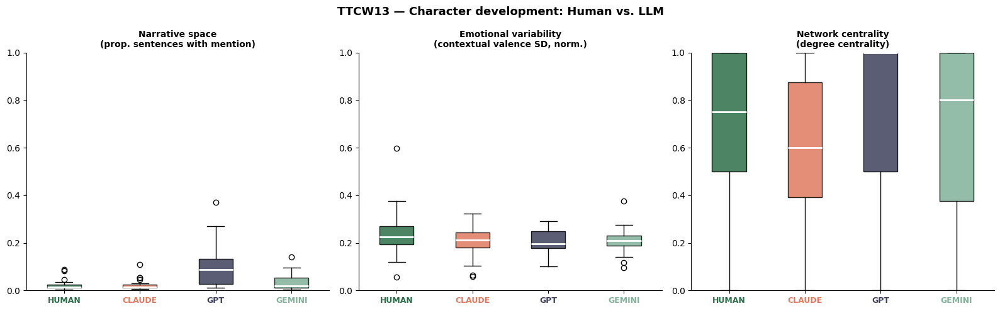

Saved: ttcw13_boxplots.png


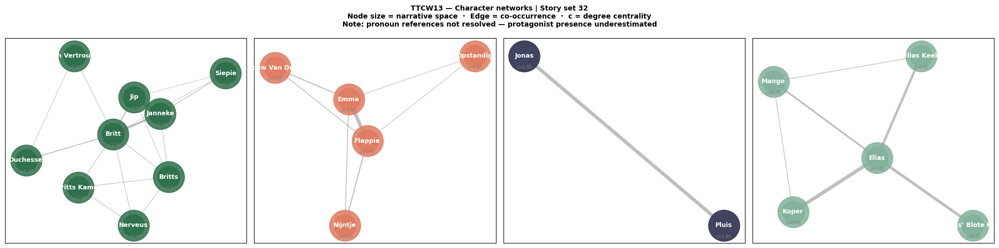

Saved: ttcw13_network_story32.png


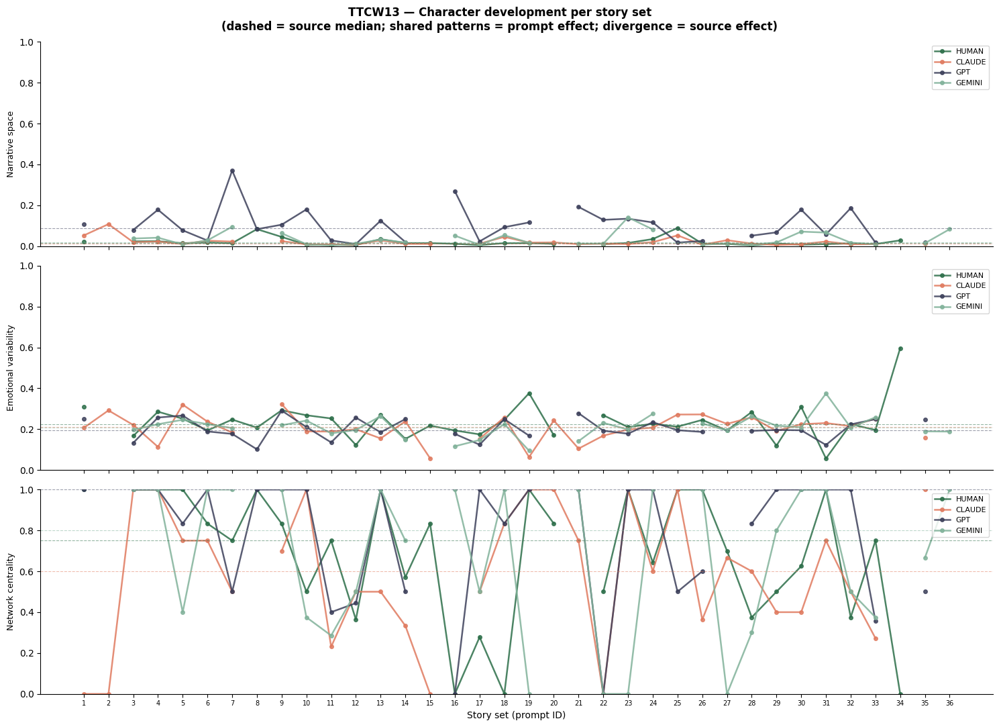

Saved: ttcw13_by_story.png


In [129]:
# report no-character stories
n_no_chars = df_cd["no_characters"].sum()
if n_no_chars > 0:
    print(f"\nNote: {n_no_chars} stories had no characters detected "
            f"(MIN_MENTIONS={MIN_MENTIONS}) and contribute NaN to all metrics.")
 
print("\nStep 2: Source-level aggregation...")
df_source = compute_ttcw13_source_metrics(df_cd)
print(df_source.to_string(index=False))
 
print("\nStep 3: Statistical tests...")
test_normality_ttcw13(df_cd)
kruskal_results = test_ttcw13_kruskal(df_cd)
test_ttcw13_mannwhitney(df_cd, kruskal_results)
gpt_comparison = test_ttcw13_gpt_version_comparison(df_cd, paired=True)
gpt55_vs_human = test_ttcw13_gpt55_vs_human(df_cd, gpt_comparison)
 
print("\nStep 4: Plots...")
plot_ttcw13_boxplots(df_cd)
plot_character_networks(df_cd, df, 32)
plot_character_development_by_story(df_cd)

<link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@tabler/icons-webfont@latest/tabler-icons.min.css">
<div id="ttcw14" style="font-family:sans-serif; display:flex; align-items:center; margin:0.5rem 0;">
  <div style="background:#FAEEDA; border-radius:25px; padding:6px 20px; display:inline-flex; align-items:center;">
    <h2 style="font-size:20px; font-weight:600; color:#633806; margin:0;">TTCW 14 - Rhetorical complexity </h2>
  </div>
</div>

<p class="prose">
Rhetorical complexity is challenging to measure computationally. TTCW14 revolves around the difference between surface and subtext. True subtext
  (as defined in
  <a href="https://arxiv.org/pdf/2309.14556" style="color:#633806;">Chakrabarty et al., 2024</a>)
  requires world and cultural knowledge and theory of mind that current
  NLP tools cannot reliably detect.
  <a href="https://aclanthology.org/2025.findings-emnlp.1256/" style="color:#633806;">MAKIEval (Zhao et al., 2025)</a>
  operationalises a 'cultural score' by counting the number of unique
  cultural entities generated, where higher diversity indicates that the
  model is capable of expressing a wide range of cultural knowledge.
</p>

<p class="prose">
  <a href="https://link.springer.com/article/10.1007/s11042-018-5972-y" style="color:#633806;">Hargood et al. (2018)</a>
  suggest that subtext can be computationally approached by so-called
  'free motifs': surface elements carrying meaning beyond their literal
  function. Free motifs are elements not strictly necessary to the plot
  but that carry thematic and subtextual meaning (e.g. a character pausing
  to look at a portrait of Napoleon, which signals ambition without the
  narrator stating it). Currently, no Dutch subtext or motif lexicon
  exists. Two proxies are therefore measured for TTCW14.
</p>

<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  1. Intertextual density
</h3>

<p class="prose">
  Following
  <a href="https://aclanthology.org/2025.findings-emnlp.1256/" style="color:#633806;">MAKIEval (Zhao et al., 2025)</a>
  and
  <a href="https://aclanthology.org/N19-1220.pdf" style="color:#633806;">Bamman et al. (2019)</a>,
  named entities of cultural types are treated as surface-level carriers
  of world knowledge. Two metrics are derived:
</p>

<div class="cat-card" style="margin:0.5rem 0; padding:0.6rem 0.9rem;">
  <table style="width:100%; border-collapse:collapse; font-size:0.85rem; line-height:1.4;">
    <tr>
      <th style="padding:0.3rem 0.5rem 0.3rem 0.3rem; text-align:left; font-weight:600; white-space:nowrap; color:#633806;">
        Metric
      </th>
      <th style="padding:0.3rem 0.5rem; text-align:left; font-weight:600; color:#633806;">
        Description
      </th>
      <th style="padding:0.3rem 0 0.3rem 0.5rem; text-align:left; font-weight:600; color:#633806;">
        Example
      </th>
    </tr>
    <tr>
      <td style="padding:0.3rem 0.5rem 0.3rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>entity_density</code>
      </td>
      <td style="padding:0.3rem 0.5rem; vertical-align:top;">
        Cultural entity mentions per 100 tokens 
      </td>
      <td style="padding:0.3rem 0 0.3rem 0.5rem; vertical-align:top; color:#555;">
        <i>"Hij dacht aan Rembrandt"</i> → 1 PERSON entity
      </td>
    </tr>
    <tr>
      <td style="padding:0.3rem 0.5rem 0.3rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>unique_entity_count</code>
      </td>
      <td style="padding:0.3rem 0.5rem; vertical-align:top;">
        Number of unique named cultural references detected: each entity surface form counted once regardless of how often it appears in the story.      </td>
      <td style="padding:0.3rem 0 0.3rem 0.5rem; vertical-align:top; color:#555;">
        Rembrandt + Amsterdam + De Nachtwacht = 3 unique entities
      </td>
    </tr>
  </table>
</div>

<div class="nb-info" style="margin:1rem 0;">
  <p class="prose">
    <b>Note.</b> NER models trained on news-based datasets
    was trained on news, not literary texts. Some entities could be differently represented in news-based stories. 
  </p>
</div>

<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  2. Thematic breadth
</h3>

<p class="prose">
  Each theme has motifs; each motif is a set of Dutch surface words
  detectable with spaCy lemmatisation
  (<a href="https://link.springer.com/article/10.1007/s11042-018-5972-y" style="color:#633806;">Hargood et al. (2018)</a>).
  <a href="https://maaikemeijer.nl/wp-content/uploads/2016/09/1996-in_tekst_gevat.pdf" style="color:#633806;">Meijer et al. (1996)</a>
  defines several recurring themes in Dutch and Flemish literature.
  The themes used here were selected to reflect themes prominent in
  contemporary Dutch short fiction, supported by two or three canonical
  examples per theme. The motif lexicon was constructed following the
  five-step authoring method of
  <a href="https://link.springer.com/article/10.1007/s11042-018-5972-y" style="color:#633806;">Hargood et al. (2018)</a>:
</p>

<div style="margin:1rem 0;">

  <div style="display:flex; align-items:flex-start; gap:1rem; margin-bottom:0.5rem;">
    <div class="cat-card" style="margin:0; padding:0.6rem 0.9rem; flex:1;">
      <p style="margin:0 0 0.2rem 0; font-weight:600; font-size:0.88rem;">1. List</p>
      <p style="margin:0 0 0.3rem 0; font-size:0.85rem;">
        Expand the seed theme into associated words and related concepts.
      </p>
      <p style="margin:0; font-size:0.82rem; color:#555;">
        <i>schuld, schaamte, spijt, berouw, zwijgen, verbergen, leugen,
        geheim, boete, straf, vergeven …</i>
      </p>
    </div>
  </div>

  <div style="text-align:left; padding-left:0.9rem; color:#633806;
              font-size:1.2rem; line-height:1; margin-bottom:0.5rem;">↓</div>
    <div class="cat-card" style="margin:0; padding:0.6rem 0.9rem; flex:1; background:#FAEEDA;">
      <p style="margin:0 0 0.2rem 0; font-weight:600; font-size:0.88rem;">2. Classify</p>
      <p style="margin:0 0 0.3rem 0; font-size:0.85rem;">
        Distinguish sub-themes (broad, expandable) from motifs (atomic, surface-detectable).
      </p>
      <p style="margin:0; font-size:0.82rem; color:#555;">
        Sub-themes: <i>straf, vergeving, geheim</i><br>
        Motifs: <i>spijt, schaamte, masker, bekentenis …</i>
      </p>
    </div>
  </div>

  <div style="text-align:left; padding-left:0.9rem; color:#633806;
              font-size:1.2rem; line-height:1; margin-bottom:0.5rem;">↓</div>

  <div style="display:flex; align-items:flex-start; gap:1rem; margin-bottom:0.5rem;">
    <div class="cat-card" style="margin:0; padding:0.6rem 0.9rem; flex:1;">
      <p style="margin:0 0 0.2rem 0; font-weight:600; font-size:0.88rem;">3. Group</p>
      <p style="margin:0 0 0.3rem 0; font-size:0.85rem;">
        Group elements sharing a purpose into clusters.
      </p>
      <p style="margin:0; font-size:0.82rem; color:#555; line-height:1.6;">
        A: internal moral experience — <i>spijt, schaamte, geweten</i><br>
        B: concealment — <i>zwijgen, masker, verbergen</i><br>
        C: the wrong itself — <i>fout, vergissing, verwijt</i><br>
        D: resolution — <i>bekentenis, vonnis, vergeven</i><br>
        E: physical traces — <i>litteken</i>
      </p>
    </div>
  </div>

  <div style="text-align:left; padding-left:0.9rem; color:#633806;
              font-size:1.2rem; line-height:1; margin-bottom:0.5rem;">↓</div>

  <div style="display:flex; align-items:flex-start; gap:1rem; margin-bottom:0.5rem;">
    <div class="cat-card" style="margin:0; padding:0.6rem 0.9rem; flex:1; background:#FAEEDA;">
      <p style="margin:0 0 0.2rem 0; font-weight:600; font-size:0.88rem;">4. Expand</p>
      <p style="margin:0 0 0.3rem 0; font-size:0.85rem;">
        Expand sub-themes; discard those that overlap with other themes or fire too broadly.
      </p>
      <p style="margin:0; font-size:0.82rem; color:#555; line-height:1.6;">
        <i>straf</i> → keep <i>vonnis, oordeel</i>; drop legal register<br>
        <i>vergeving</i> → keep <i>vergeven, verzoening</i>; drop <i>genade</i><br>
        <i>geheim</i> → keep <i>geheim, verzwijgen</i>; drop <i>stilte, schaduw</i>
      </p>
    </div>
  </div>

  <div style="text-align:left; padding-left:0.9rem; color:#633806;
              font-size:1.2rem; line-height:1; margin-bottom:0.5rem;">↓</div>

  <div style="display:flex; align-items:flex-start; gap:1rem;">
    <div class="cat-card" style="margin:0; padding:0.6rem 0.9rem; flex:1;">
      <p style="margin:0 0 0.2rem 0; font-weight:600; font-size:0.88rem;">5. Remove</p>
      <p style="margin:0 0 0.3rem 0; font-size:0.85rem;">
        Remove motifs not entirely relevant to the root theme.
      </p>
      <p style="margin:0; font-size:0.82rem; color:#555; line-height:1.6;">
        Dropped: <i>leugen</i> (too broad), <i>dader</i> (narrative role),
        <i>wond/bloeden</i> (physical, not moral),
        <i>biechten</i> (domain-specific)
      </p>
    </div>
  </div>

</div>

<p class="prose">
  As an additional measure, a continuous per-theme count column (<code>theme_{name}_count</code>)
  is stored for each of the 8 themes, capturing the raw number of motif
  matches per story. This avoids the ceiling effect of binary activation (
  two stories both activating <i>vergankelijkheid</i> may score 2 vs 14
  matches, a difference invisible to the binary measure).
</p>

<div class="nb-info" style="margin:1rem 0;">
  <p class="prose">
    <b>Note.</b> Since no tested lexicon for subtext in Dutch
    exists, the motif dictionary is researcher-constructed and subject
    to subjectivity. The <a href="https://link.springer.com/article/10.1007/s11042-018-5972-y" style="color:#000;">Hargood et al. (2018)</a> authoring method is
    applied throughout to ground and constrain lexicon decisions, but
    this remains a weak proxy. Thematic
    density counts theme-motif activations, not unique motif tokens.
  </p>
</div>

In [31]:
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
 
from collections import defaultdict
from itertools import combinations
from scipy.stats import kruskal, mannwhitneyu, shapiro
from tqdm import tqdm
 
import spacy
nlp = spacy.load("nl_core_news_lg")
 
COLORS  = {"human": "#2C6E49", "claude": "#E07A5F", "gpt": "#3D405B", "gemini": "#81B29A"}
SOURCES = ["human", "claude", "gpt", "gemini"]
 
TTCW14_METRICS = [
    "entity_density",
    "unique_entity_count",
    "thematic_breadth",
    "thematic_density",
]
 
# Cultural entity types following Bamman et al. (2019)
# Note: WORK_OF_ART and EVENT rarely fire reliably on
# literary text with a news-trained NER model.
CULTURAL_ENT_TYPES = {
    "PERSON",       # characters; social/historical world
    "LOC",          # geographic places
    "GPE",          # geopolitical entities
    "ORG",          # institutions, companies, groups
    "WORK_OF_ART",  # books, films, songs
    "EVENT",        # named historical/cultural events
    "PRODUCT",      # named material-culture anchors
    "LANGUAGE",     # named languages
    "NORP",         # nationalities, religious/political groups
}

In [32]:
"""
Themes:
    vergankelijkheid  — mortality, decay, transience
                        (Hermans, Nooteboom, Kouwenaar)
    verlies           — loss, grief, absence
                        (Büch, Bakker, Lanoye)
    schuld            — guilt, moral weight
                        (Mulisch, Vestdijk, Reve)
    identiteit        — identity, alienation, belonging
                        (Multatuli, Claus, Abdolah)
    vrijheid          — freedom vs. constraint
                        (broadly recurring)
    verlangen         — desire, longing, yearning
                        (Nooteboom)
    conflict          — power struggle, violence
                        (Hermans, Claus)
    hoop              — hope, redemption
                        (broadly recurring)
 
Cross-theme overlaps (documented per Hargood et al. rule:
no two themes share motifs with the same justification):
 
    herinnering   — vergankelijkheid (universal fading),
                    verlies (personal memory of the absent),
                    identiteit (memory as identity material),
                    verlangen (memory as fuel of longing).
                    Kept in all four; justifications distinct.
 
    leegte        — vergankelijkheid (void after decay),
                    verlies (emptiness of a specific absence).
                    Kept in both; justifications distinct.
 
    afscheid      — vergankelijkheid (parting at death),
                    verlies (the moment of separation).
                    Kept in both; justifications distinct.
 
    verdwijnen    — vergankelijkheid (things passing out of
                    existence), verlies (a person disappearing).
                    Kept in both; justifications distinct.
 
    graf          — vergankelijkheid (marker of mortality),
                    verlies (site of grief ritual).
                    Kept in both; justifications distinct.
 
    spoor         — vergankelijkheid (trace of what has passed),
                    verlies (trace of absent person).
                    Kept in both; justifications distinct.
 
    masker        — schuld (hiding wrongdoing),
                    identiteit (performing a false self).
                    Kept in both; justifications distinct.
 
    schaamte      — schuld (shame about a moral failing),
                    identiteit (shame about who one is).
                    Kept in both; justifications distinct.
 
    litteken      — schuld (physical trace of moral wound),
                    identiteit (mark of trauma that shapes self).
                    Kept in both; justifications distinct.
 
    verzoening    — schuld (forgiveness as moral resolution),
                    hoop (reconciliation as hoped-for outcome).
                    Kept in both; justifications distinct.
 
    thuis         — identiteit (place where one belongs or not),
                    vrijheid (home as constraint or escape),
                    hoop (homecoming as fulfilment of hope).
                    Kept in all three; justifications distinct.
                    Highest-overlap concrete noun in dictionary.
 
    ballingschap  — identiteit (exile as identity fracture),
                    vrijheid (exile as forced confinement).
                    Kept in both; justifications distinct.
 
    terugkeren    — identiteit (return to origins),
                    verlangen (return to what one longs for),
                    hoop (homecoming as redemption).
                    Kept in all three; justifications distinct.
 
    verlossing    — vrijheid (liberation from constraint),
                    hoop (redemption as spiritual renewal).
                    Kept in both; justifications distinct.
 
    verzet/opstand/rebelleren
                  — vrijheid (breaking free from constraint),
                    conflict (resistance in a power struggle).
                    Kept in both; justifications distinct.
 
    licht         — vergankelijkheid (dying light),
                    hoop (dawn as renewal signal).
                    Opposite valences of same motif.
                    Pipeline detects presence not valence.
                    Kept in both; flag in limitations.
 
    ruïne         — vergankelijkheid (decay over time),
                    conflict (consequence of violence).
                    Kept in both; justifications distinct.

"""
 
THEMATIC_DICTIONARY = {

    "vergankelijkheid": {
        "motifs": {
            "sterven", "overlijden", "dood", "doden",
            "einde", "stervend",
            "vergankelijkheid", "verval", "aftakeling", "verwelken", "vergaan",
            "verweerd", "uitgeblusd", "ruine", "as", "skelet",
            "kaars", "vlam", "klok", "zandloper",
            "herfst", "winter", "blad", "vallen",
            "nevel", "mist", "schemering", "vluchtig",
            "leegte", "verdwijnen",
            "herinnering", "vergeten",
            "rouw", "oud", "ouderdom", "ziek",
            "eeuwig", "onsterfelijk", "nutteloosheid",
            "graf", "afscheid",
            "vanitas",
        },
    },

    "verlies": {
        "motifs": {
            "verlies", "gemis", "verdriet", "pijn", "gebroken",
            "huilen", "wenen", "tranen", "missen",
            "eenzaam", "alleen", "rouw", "overlijden", "troost",   # FIX: missing comma here merged
                                                                     # "troost" and "achterlaten" into one
                                                                     # silently-unmatchable string
            "achterlaten", "verlaten", "vertrekken",
            "verdwijnen", "afscheid",
            "begrafenis", "graf",
            "leegte", "afwezigheid", "spoor",
            "achtergebleven", "leeg",
            "herinnering", "vergeten",
            "troost", "omarmen", "loslaten",
            "heling", "genezen",
        },
    },

    "schuld": {
        "motifs": {
            "schuld", "spijt", "schaamte", "berouw", "schuldig", "geweten",
            "last", "schuldgevoel",
            "zwijgen", "verbergen", "verzwijgen", "masker",
            "ontwijken", "vermijden", "wegkijken", "verloochenen",
            "geheim",
            "fout", "vergissing", "verwijt", "beschuldiging", "zonde",
            "bekentenis", "erkennen", "goedmaken", "boete",
            "vergeven", "verzoening", "vonnis", "oordeel", "biechten", "verantwoordelijkheid",
            "litteken",
        },
    },

    "identiteit": {
        "motifs": {
            "identiteit", "zelf", "naam", "gezicht",
            "lichaam", "authentiek", "echt", "onherkenbaar", "vrouwelijk", "mannelijk", "non-binair",
            "spiegel", "masker", "rol",
            "thuis", "thuisloos", "plek", "vreemdeling",
            "vreemd", "buitenstaander", "uitgestoten",
            "ballingschap", "vluchteling", "onzichtbaar", "immigrant", "buitenlander",
            "afkomst", "roots", "origine", "voorouders",
            "vader", "moeder", "erfenis", "moedertaal",
            "vertalen", "accent", "gender", "geaardheid", "hetero", "homo", "lesbisch",
            "herinnering", "trauma",
            "stem", "erkenning", "trots", "zingeving",
        },
    },

    "vrijheid": {
        "motifs": {
            "gevangenis", "kooi", "keten", "boeien",
            "muur", "slot", "opgesloten", "gevangen", "slaaf", "dictatuur", "onderdrukken", "onderdrukker",
            "horizon", "ruimte", "lucht", "vleugel",
            "vrij", "poort", "deur", "pad", "vrijheid",
            "ontsnappen", "vluchten", "vlucht", "uitbreken",
            "vertrek", "bevrijden", "bevrijding", "bevrijd",
            "uitbraak", "verlossing", "vrijkomen", "zelfbeschikking",
            "sleutel", "drempel", "grens", "barrière",
            "adem", "ademen", "gebonden",
            "dwang", "onderdrukking", "verzet", "opstand",
            "rebellie", "weigeren", "slavernij",
            "onafhankelijk", "autonomie", "demonstratie", "rechten", "meningsuiting",
            "ballingschap", "verbannen", "taboe",
        },
    },

    "verlangen": {
        "motifs": {
            "verlangen", "hunkeren", "begeerte",
            "begeren", "wens", "wensen", "dorst",
            "onvervuld", "zoeken", "najagen",
            "verte", "afstand", "onbereikbaar",
            "naderen", "uitreiken", "aanraken", "nabijheid",
            "wachten", "blik", "ogen", "zuchten",
            "geliefde", "bestemming", "utopie", "terugkeren",
            "huid", "lippen", "lust", "tederheid", "intiem",
            "kussen", "verliefd", "minnaar", "minnares", "seks",   # FIX: missing comma here merged
                                                                     # "seks" and "hartstocht" into one
                                                                     # silently-unmatchable string
            "hartstocht", "passie",
            "heimwee", "nostalgie", "jeugd",
            "dromen", "droom", "fantasie",
            "melancholie", "weemoed", "bitter",
            "mijmeren", "peinzen",
        },
    },

    "conflict": {
        "motifs": {
            "vechten", "slag", "veldslag", "aanval", "aanvallen",
            "gevecht", "bloed", "wond", "geweld",
            "verslaan", "vernietigen", "mishandeling", "mishandelen", "verkrachten",
            "wapen", "mes", "pistool", "kogel", "bom",
            "macht", "domineren", "onderwerpen", "onderdrukken",
            "controleren", "manipuleren", "hiërarchie",
            "overheersing", "conflict", "discriminatie", "verraad",
            "strijd", "tegenstander", "vijand",
            "rivaliteit", "wedijver", "afgunst",
            "uitdagen", "provoceren", "wraak",
            "dreigen", "bedreigen", "intimideren", "terreur",
            "woede", "haat", "agressie",
            "wreken", "vergelden", "vergelding", "wraakzucht",
            "verzet", "opstand", "rebelleren", "capituleren",
            "verdedigen", "jaloezie",
            "oorlog", "soldaat", "bezetting", "bezetter",
            "kolonisatie", "uitbuiting",
            "tirannie", "tiran", "dictator", "regime",
            "overwinning", "nederlaag", "frontlinie",
            "ruïne", "vernietiging",
        },
    },

    "hoop": {
        "motifs": {
            "hoop", "hopen", "verwachting", "belofte",
            "vertrouwen", "geloven", "geloof",
            "mogelijkheid", "kans", "moed", "doorzetten",
            "licht", "zon", "ochtend", "dageraad",
            "morgenrood", "vonk",
            "lente", "bloem", "bloeien", "groeien",
            "zaad", "kiem", "oogst",
            "ontluiken", "ontkiemen",
            "nieuw", "begin", "beginnen", "geboorte",
            "hergeboorte", "herboren", "ontwaken",
            "redding", "verlossing", "genade", "zaligheid",
            "zegen", "herstel", "genezing",
            "verzoening", "herenigen", "vrede",
            "glimlach", "lachen", "vreugde", "geluk",
            "zingen", "lied",
            "thuis", "terugkeren", "samen",
            "verbonden", "omarmen", "gemeenschap",
            "toekomst", "leven",
            "bidden", "gebed",
        },
    },

}

ALL_THEMES = list(THEMATIC_DICTIONARY.keys())
MAX_THEMES = len(ALL_THEMES)   # = 8

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Rhetorical complexity · Implementation</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  1. Intertextual and world-knowledge density
</h3>

<p class="prose">
  Named entities of cultural types are extracted from each story.
  Following
  <a href="https://aclanthology.org/N19-1220.pdf" style="color:#633806;">Bamman et al. (2019)</a>,
  entities of the types below are treated as surface-level carriers of
  world knowledge — the computational approximation of
  <a href="https://link.springer.com/article/10.1007/s11042-018-5972-y" style="color:#633806;">Hargood et al. (2018)</a>
  free motifs that anchor the narrative to a cultural frame beyond the
  immediate story.
</p>

<div class="cat-card" style="margin:0.5rem 0; padding:0.6rem 0.9rem;">
  <table style="width:100%; border-collapse:collapse; font-size:0.85rem; line-height:1.4;">
    <tr>
      <th style="padding:0.3rem 0.5rem 0.3rem 0.3rem; text-align:left; font-weight:600; color:#633806; white-space:nowrap;">
        Entity type
      </th>
      <th style="padding:0.3rem 0 0.3rem 0.5rem; text-align:left; font-weight:600; color:#633806;">
        Description
      </th>
    </tr>
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>PERSON</code>
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
        Named people — characters, historical figures, public persons
      </td>
    </tr>
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>LOC</code> / <code>GPE</code>
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
        Geographic locations and geopolitical entities
      </td>
    </tr>
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>ORG</code>
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
        Institutions, companies, and organisations
      </td>
    </tr>
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>WORK_OF_ART</code>
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
        Named artworks, books, films, and songs
      </td>
    </tr>
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>EVENT</code>
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
        Named historical or cultural events
      </td>
    </tr>
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>PRODUCT</code>
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
        Named material-culture anchors
      </td>
    </tr>
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>LANGUAGE</code>
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
        Named languages
      </td>
    </tr>
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
        <code>NORP</code>
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
        Nationalities, religious groups, and political groups
      </td>
    </tr>
  </table>
</div>

<div class="nb-info" style="margin:1rem 0;">
  <p class="prose">
    <b>Note.</b> NER models trained on news-based datasets decrease
    significantly in quality on literary texts. spaCy's Dutch model
    was trained on news, the entity density should be
    interpreted with caution.
  </p>
</div>

In [33]:
def extract_cultural_entities(doc) -> dict:

    entities = []
    by_type  = defaultdict(list)
 
    for ent in doc.ents:
        if ent.label_ in CULTURAL_ENT_TYPES:
            clean = ent.text.strip()
            if clean:
                entities.append((clean, ent.label_))
                by_type[ent.label_].append(clean)
 
    return {
        "entities":       entities,
        "by_type":        dict(by_type),
        "types_present":  set(by_type.keys()),
        "unique_entities": len(set(e.lower() for e, _ in entities)),
        "n_tokens":       len(doc),
    }

In [34]:
def proxy1_entity_density(extracted: dict) -> float:
    n = extracted["n_tokens"]
    if n == 0:
        return np.nan
    return round(len(extracted["entities"]) / n * 100, 4)

In [35]:
def proxy1_unique_entity_count(extracted: dict) -> int:

# Deduplicated surface forms of cultural entities. Measures breadth of cultural world invoked.
    return extracted["unique_entities"]

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Rhetorical complexity · Implementation</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  2. Thematic detection
</h3>

<p class="prose">
  For each story, the content-word lemmas are matched against the
  <code>THEMATIC_DICTIONARY</code>. A theme is considered
  <b>activated</b> if at least one of its motifs is present in the
  set of content-word lemmas. This is the detection step of
  <a href="https://aclanthology.org/N19-1220.pdf" style="color:#633806;">Bamman et al. (2019)</a>
  pipeline: surface features (lemmas) <i>denote</i> motifs, which in
  turn <i>connote</i> themes.
</p>

<div class="cat-card" style="margin:0.5rem 0; padding:0.6rem 0.9rem;">
  <table style="width:100%; border-collapse:collapse; font-size:0.85rem; line-height:1.4;">
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
        Activation threshold
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
        ≥ 1 motif match per theme (to ensure caution). Raising
        the threshold (e.g. ≥ 2 or ≥ 3) would reduce false positives
        at the cost of sensitivity.
      </td>
    </tr>
    <tr>
      <td style="padding:0.2rem 0.5rem 0.2rem 0.3rem; vertical-align:top; white-space:nowrap;">
        Detection logic
      </td>
      <td style="padding:0.2rem 0 0.2rem 0.5rem; vertical-align:top;">
        Surface lemma → motif → theme. A lemma matching motifs in
        <i>N</i> themes contributes <i>N</i> activations.
      </td>
    </tr>
  </table>
</div>

In [36]:
def _lemmatise(doc) -> set:
    return {
        t.lemma_.lower() for t in doc
        if t.pos_ in {"NOUN", "VERB", "ADJ", "ADV"}
        and not t.is_punct
        and t.is_alpha
    }
 

In [37]:
def detect_themes(doc) -> dict:
    lemmas  = _lemmatise(doc)
    results = {}
 
    for theme, entry in THEMATIC_DICTIONARY.items():
        matched = lemmas & entry["motifs"]
        results[theme] = {
            "activated":      len(matched) > 0,
            "matched_motifs": matched,
            "n_matches":      len(matched),
        }
 
    return results

In [38]:
# detect proportion of 8 themes 
def proxy2_thematic_breadth(theme_detection: dict) -> float:
    n_active = sum(1 for v in theme_detection.values() if v["activated"])
    return round(n_active / MAX_THEMES, 4)
 

In [39]:
def proxy2_thematic_density(theme_detection: dict, doc) -> float:
# Total theme-motif activations per 100 content-word tokens. Note: a lemma matching motifs in N themes contributes N 
# to the count — this measures theme-motif activations, not unique motif tokens. 
    n_content = sum(
        1 for t in doc
        if t.pos_ in {"NOUN", "VERB", "ADJ", "ADV"}
        and not t.is_punct
        and t.is_alpha
    )
    if n_content == 0:
        return np.nan
 
    total_matches = sum(v["n_matches"] for v in theme_detection.values())
    return round(total_matches / n_content * 100, 4)

In [40]:
def compute_ttcw14(df: pd.DataFrame) -> pd.DataFrame:
    rows = []
 
    for _, row in tqdm(df.iterrows(), total=len(df), desc="TTCW14"):
        text = row["clean_text"]
        try:
            doc = nlp(text)
 
            # proxy 1
            ext      = extract_cultural_entities(doc)
            e_dens   = proxy1_entity_density(ext)
            e_unique = proxy1_unique_entity_count(ext)
 
            # proxy 2
            themes       = detect_themes(doc)
            t_brd        = proxy2_thematic_breadth(themes)
            t_dens       = proxy2_thematic_density(themes, doc)
            active_themes = [
                t for t, v in themes.items() if v["activated"]
            ]
 
            # per-theme motif match counts (continuous)
            theme_counts = {
                f"theme_{theme}": themes[theme]["n_matches"]
                for theme in ALL_THEMES
            }
 
        except Exception as e:
            print(f"  Skipping story {row['story_id']} "
                  f"[{row['source']}]: {e}")
            e_dens = e_unique = t_brd = t_dens = np.nan
            active_themes = []
            theme_counts  = {f"theme_{t}": np.nan for t in ALL_THEMES}
 
        rows.append({
            "story_id":            row["story_id"],
            "source":              row["source"],
            "entity_density":      e_dens,
            "unique_entity_count": e_unique,
            "thematic_breadth":    t_brd,
            "thematic_density":    t_dens,
            "themes_activated":    ", ".join(active_themes) or "none",
            **theme_counts,
        })
 
    return (
        pd.DataFrame(rows)
        .sort_values(["story_id", "source"])
        .reset_index(drop=True)
    )

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Rhetorical complexity · Aggregate results</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
 3. Aggregating results per source
</h3>
<p class="prose">
  To make a comparison between the four sources inside the dataset, the
  narrative ending metric is aggregated into a single result per source
  by taking the <b>median</b><sup><a href="#fn-ttcw4-median" style="color:#F5C842;">*</a></sup>
  across all stories. This is carried out by <code>compute_ttcw14_source_metrics()</code>.
</p>
<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<div id="fn-ttcw4-median" style="font-size:12px; color:#666;">
  <sup>*</sup> The median is used instead of the mean since the data
  is not normally distributed (see section 4). <a href="#fn-ttcw4-median-ref">↩</a>
</div>

In [41]:
def compute_ttcw14_source_metrics(df_rc: pd.DataFrame) -> pd.DataFrame:
    return (
        df_rc
        .groupby("source")[TTCW14_METRICS]
        .agg(["median", lambda x: x.quantile(0.75) - x.quantile(0.25)])
        .round(4)
        .reset_index()
    )

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Rhetorical complexity · Statistical analysis</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  4. Statistical testing
</h3>

<p class="prose">Three statistical tests will be run in sequence:</p>

<div class="grid-2" style="margin:1rem 0 1.5rem 0;">

  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#633806;">1. Shapiro–Wilk</strong>
      <span class="cat-badge" style="background:#FAEEDA;color:#633806;">Normality</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
      To test whether the results are normally distributed within each source, the Shapiro-wilk test will be applied to each subset. Shapiro-Wilk tests work when the observations > 3 and < 50. Here, the test runs per group, so it's testing normality on n=36 per source. 
    </p>
  </div>

  <div class="cat-card">
    <div class="cat-header">
      <strong style="color:#633806;">2. Kruskal–Wallis</strong>
      <span class="cat-badge" style="background:#FAEEDA;color:#633806;">Group comparison</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
     The Shapiro–Wilk test indicated that normality assumptions were violated for most source–metric combinations. The Kruskal-Wallis test is chosen here since it is a <b>non-parametric test</b> of whether the <b>median</b> differences across sources exceed what would be expected by chance. 
    </p>
  </div>

  <div class="cat-card" style="grid-column: 1 / -1;">
    <div class="cat-header">
      <strong style="color:#633806;">3. Mann–Whitney U</strong>
      <span class="cat-badge" style="background:#FAEEDA;color:#633806;">Pairwise · Bonferroni</span>
    </div>
    <p class="prose" style="font-size:13px;margin:0;">
Only runs when the Kruskal-Wallis gives significant results. The Mann-Whitney U test is used to compare each LLM model to the human writers. This test is chosen since these are pairwise comparisons (human vs. each LLM individually). Bonferroni correction adjusts for the number of simultaneous comparisons (n metrics × 3 LLM sources) to reduce the risk of false positives. Alongside each p-value, Cliff's delta is reported as an effect size.
    </p>
  </div>

</div>

<br>

In [42]:
def test_normality_ttcw14(df_rc: pd.DataFrame):
    print("Shapiro-Wilk normality tests — TTCW14 main metrics")
    print(f"{'Metric':<24} {'Source':<10} {'W':>8} {'p':>10}  normal?")
    print("-" * 58)
    for metric in TTCW14_METRICS:
        for source in SOURCES:
            vals = df_rc[df_rc["source"] == source][metric].dropna()
            if len(vals) < 3:
                continue
            stat, p = shapiro(vals)
            print(f"{metric:<24} {source:<10} {stat:>8.4f} {p:>10.4f}  "
                  f"{'yes' if p > 0.05 else 'NO'}")
        print()

In [43]:
def test_ttcw14_kruskal(df_rc: pd.DataFrame) -> pd.DataFrame:
    rows = []
    print("Kruskal-Wallis — TTCW14 main metrics across sources")
    print(f"{'Metric':<24} {'H':>8} {'p':>10}  {'high':<10} {'low':<10}  sig?")
    print("-" * 64)
    for metric in TTCW14_METRICS:
        groups  = [
            df_rc[df_rc["source"] == s][metric].dropna().values
            for s in SOURCES
        ]
        if any(len(g) < 2 for g in groups):
            rows.append({"metric": metric, "H": np.nan, "p": np.nan,
                         "significant": False,
                         "highest": None, "lowest": None})
            continue
        stat, p  = kruskal(*groups)
        sig      = p < 0.05
        medians  = {
            s: df_rc[df_rc["source"] == s][metric].median()
            for s in SOURCES
        }
        highest  = max(medians, key=medians.get)
        lowest   = min(medians, key=medians.get)
        print(f"{metric:<24} {stat:>8.4f} {p:>10.4f}  "
              f"{highest:<10} {lowest:<10}  {'*' if sig else ''}")
        rows.append({"metric": metric, "H": stat, "p": p,
                     "significant": sig,
                     "highest": highest, "lowest": lowest})
    return pd.DataFrame(rows)

In [44]:
def cliffs_delta(a, b):
    """Effect size for unpaired Mann-Whitney U. Range -1 to 1."""
    a, b = np.asarray(a), np.asarray(b)
    greater = sum(x > y for x in a for y in b)
    less    = sum(x < y for x in a for y in b)
    return (greater - less) / (len(a) * len(b))

def interpret_effect(d):
    d = abs(d)
    if d < 0.147: return "negligible"
    if d < 0.33:  return "small"
    if d < 0.474: return "medium"
    return "large"

def test_ttcw14_mannwhitney(df_rc: pd.DataFrame, kruskal_results: pd.DataFrame) -> pd.DataFrame:
    significant_metrics = kruskal_results[kruskal_results["significant"]]["metric"].tolist()

    if not significant_metrics:
        print("No significant Kruskal-Wallis results for main metrics.")
        return pd.DataFrame()

    llm_sources   = ["claude", "gpt", "gemini"]
    # FIX: original code set n_human = len(llm_sources) only — not multiplied by
    # len(significant_metrics) like every other TTCW in this series. Corrected
    # to match the established convention.
    n_comparisons = len(llm_sources) * len(significant_metrics)
    rows = []

    for metric in significant_metrics:
        print(f"\n{'='*100}\n  {metric.upper()}\n{'='*100}")
        print(f"\n  Human vs. LLM  (Bonferroni n={n_comparisons})")
        print(f"  {'Comparison':<22} {'U':>8} {'p_raw':>10} {'p_corr':>10}  "
              f"{'delta':>8} {'(size)':<12} {'Direction':<25}  Sig?")
        print(f"  {'-'*105}")

        human_vals = df_rc[df_rc["source"] == "human"][metric].dropna().values

        for llm in llm_sources:
            llm_vals = df_rc[df_rc["source"] == llm][metric].dropna().values
            if len(human_vals) < 2 or len(llm_vals) < 2:
                continue
            u, p      = mannwhitneyu(human_vals, llm_vals, alternative="two-sided")
            delta     = cliffs_delta(human_vals, llm_vals)
            label     = interpret_effect(delta)
            p_corr    = min(p * n_comparisons, 1.0)
            direction = f"human {'>' if np.median(human_vals) > np.median(llm_vals) else '<'} {llm}"
            sig       = p_corr < 0.05
            print(f"  {'human vs ' + llm:<22} {u:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
                  f"{delta:>8.3f} ({label:<10}) {direction:<25}  {'*' if sig else '-'}")
            rows.append({"metric": metric, "vs": llm, "U": u, "p": p, "p_corr": p_corr,
                         "cliffs_delta": delta, "effect_label": label,
                         "direction": direction, "significant": sig})

    return pd.DataFrame(rows)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Rhetorical Complexity · GPT-4o vs. GPT-5.5</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  5. Direct model-version comparison
</h3>
<p class="prose">
  To find if there is a significant difference between GPT-4o and GPT-5.5 on rhetorical complexity, a Wilcoxon signed-rank test will be run separately on the 4 main metrics. It asks specifically whether <b>upgrading the model</b> changes how culturally or thematically dense its stories are.
</p>
<div class="nb-info" style="margin:1rem 0; background:#FBE7E4; border-left:3px solid #A4243B;">
  <p class="prose" style="margin:0;">
    Each GPT-4o and GPT-5.5 story comes from the <b>same prompt</b> (matched by <code>story_id</code>), so a <b>paired Wilcoxon signed-rank test</b> is used instead of the unpaired Mann-Whitney U applied above. Bonferroni correction is applied across the 4 main TTCW14 metrics within this test only, separate from the human-vs-LLM correction above. Alongside each p-value, the <b>matched rank-biserial correlation</b> is reported as an effect size.
  </p>
</div>
<p class="prose">
  Only when this test returns a significant result for a given metric, a follow-up comparison is run: GPT-5.5 vs. human on that metric only. Per-theme motif counts are not separately extended with a GPT-4o vs. GPT-5.5 comparison — only the 4 headline metrics receive this treatment, consistent with how detailed sub-category breakdowns were handled elsewhere in this analysis.
</p>

In [45]:
def matched_rank_biserial(a, b):
    """Effect size for paired Wilcoxon. Range -1 to 1."""
    diffs = np.array(a) - np.array(b)
    diffs = diffs[diffs != 0]
    ranks = rankdata(np.abs(diffs))
    pos_sum = ranks[diffs > 0].sum()
    neg_sum = ranks[diffs < 0].sum()
    return (pos_sum - neg_sum) / (pos_sum + neg_sum)

def test_ttcw14_gpt_version_comparison(df_rc: pd.DataFrame, paired: bool = True) -> pd.DataFrame:
    """
    Direct comparison of GPT-4o ('gpt') vs GPT-5.5 ('gpt_5.5') across the 4 main
    TTCW14 metrics. Kept separate from the human-vs-LLM family above (see TTCW1
    for the full reasoning on correction-scope). Per-theme motif counts are not
    extended with this comparison, consistent with how TTCW9's per-category
    Empath scores were treated — only the headline metrics get this treatment.
    """
    gpt4o = df_rc[df_rc["source"] == "gpt"].set_index("story_id")
    gpt55 = df_rc[df_rc["source"] == "gpt_5.5"].set_index("story_id")

    test_name = "paired Wilcoxon signed-rank" if paired else "unpaired Mann-Whitney U"
    n_comparisons = len(TTCW14_METRICS)

    print("\nGPT-4o vs. GPT-5.5 — direct model comparison (TTCW14 main metrics)")
    print(f"({test_name}, Bonferroni corrected across {n_comparisons} metrics)")
    print(f"{'Metric':<24} {'stat':>8} {'p_raw':>10} {'p_corr':>10}  "
          f"{'effect':>8} {'(size)':<12} {'direction':<20}  sig?")
    print("─" * 95)

    rows = []
    for metric in TTCW14_METRICS:
        if paired:
            common_ids = gpt4o.index.intersection(gpt55.index)
            a = gpt4o.loc[common_ids, metric].dropna()
            b = gpt55.loc[common_ids, metric].dropna()
            common_ids = a.index.intersection(b.index)
            a, b = a.loc[common_ids], b.loc[common_ids]
            if len(a) < 1:
                continue
            stat, p = wilcoxon(a.values, b.values)
            effect = matched_rank_biserial(a.values, b.values)
        else:
            a = gpt4o[metric].dropna()
            b = gpt55[metric].dropna()
            if len(a) < 1 or len(b) < 1:
                continue
            stat, p = mannwhitneyu(a.values, b.values, alternative="two-sided")
            effect = cliffs_delta(a.values, b.values)

        p_corr       = min(p * n_comparisons, 1.0)
        direction    = f"gpt {'>' if a.median() > b.median() else '<'} gpt_5.5"
        sig          = p_corr < 0.05
        effect_label = interpret_effect(effect)

        print(f"{metric:<24} {stat:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
              f"{effect:>8.3f} ({effect_label:<10}) {direction:<20}  {'*' if sig else ''}")
        rows.append({"metric": metric, "stat": stat, "p": p, "p_corr": p_corr,
                     "significant": sig, "direction": direction,
                     "effect_size": effect, "effect_label": effect_label})

    return pd.DataFrame(rows)

In [53]:
from scipy.stats import kruskal, shapiro, mannwhitneyu, wilcoxon, rankdata

def test_ttcw14_gpt55_vs_human(df_rc: pd.DataFrame, gpt_comparison: pd.DataFrame) -> pd.DataFrame:
    """
    Standalone, separately-corrected test: does GPT-5.5 differ from human on
    TTCW14 main metrics? Only runs on metrics flagged significant in the
    GPT-4o vs. GPT-5.5 comparison above.
    """
    significant_metrics = gpt_comparison[gpt_comparison["significant"]]["metric"].tolist()

    if not significant_metrics:
        print("No significant GPT-4o vs. GPT-5.5 differences — GPT-5.5 vs. human not run.")
        return pd.DataFrame()

    human = df_rc[df_rc["source"] == "human"]
    gpt55 = df_rc[df_rc["source"] == "gpt_5.5"]
    n_comparisons = len(significant_metrics)

    print(f"\nGPT-5.5 vs. Human — TTCW14 main metrics "
          f"(only metrics where GPT-4o→GPT-5.5 shifted: {', '.join(significant_metrics)})")
    print(f"{'Metric':<24} {'U':>8} {'p_raw':>10} {'p_corr':>10}  "
          f"{'delta':>8} {'(size)':<12} {'direction':<20}  sig?")
    print("─" * 95)

    rows = []
    for metric in significant_metrics:
        h = human[metric].dropna().values
        g = gpt55[metric].dropna().values
        u, p   = mannwhitneyu(h, g, alternative="two-sided")
        delta  = cliffs_delta(h, g)
        label  = interpret_effect(delta)
        p_corr = min(p * n_comparisons, 1.0)
        sig    = p_corr < 0.05
        direction = f"human {'>' if np.median(h) > np.median(g) else '<'} gpt_5.5"

        print(f"{metric:<24} {u:>8.1f} {p:>10.4f} {p_corr:>10.4f}  "
              f"{delta:>8.3f} ({label:<10}) {direction:<20}  {'*' if sig else ''}")
        rows.append({"metric": metric, "U": u, "p": p, "p_corr": p_corr,
                     "cliffs_delta": delta, "effect_label": label,
                     "direction": direction, "significant": sig})

    return pd.DataFrame(rows)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Rhetorical complexity · Statistical analysis</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  5. Per-theme count tests
</h3>

<p class="prose">
The statistical tests are run on the continuous per-theme motif match counts (<code>theme_{name}_count</code>) for each of the 8 themes
individually. This avoids the ceiling effect of binary activation. 
</p>

In [47]:
def test_per_theme_counts(df_rc: pd.DataFrame) -> pd.DataFrame:
    llm_sources = ["claude", "gpt", "gemini"]
    llm_pairs   = [
        (s1, s2)
        for s1, s2 in combinations(SOURCES, 2)
        if "human" not in (s1, s2)
    ]
    n_human    = len(llm_sources)
    n_pairwise = len(list(combinations(SOURCES, 2)))
 
    print("Per-theme motif count significance tests")
    print("Kruskal-Wallis → Mann-Whitney U (Bonferroni)")
    print("Continuous motif counts avoid binary ceiling effect.")
    print("=" * 70)
 
    results = []
 
    for theme in ALL_THEMES:
        col = f"theme_{theme}"
 
        if col not in df_rc.columns:
            print(f"\n{theme.upper()}: column '{col}' not found. "
                  f"Re-run compute_ttcw14.")
            continue
 
        print(f"\n{'='*70}")
        print(f"  {theme.upper()}")
        print(f"  {'Source':<10} {'Median':>8} {'IQR':>8} {'Max':>6}")
        print(f"  {'-'*36}")
        for source in SOURCES:
            vals = df_rc[df_rc["source"] == source][col].dropna()
            med  = vals.median()
            iqr  = vals.quantile(0.75) - vals.quantile(0.25)
            mx   = vals.max()
            print(f"  {source:<10} {med:>8.2f} {iqr:>8.2f} {mx:>6.0f}")
 
        groups = [
            df_rc[df_rc["source"] == s][col].dropna().values
            for s in SOURCES
        ]
        if any(len(g) < 2 for g in groups):
            results.append({
                "theme": theme, "H": np.nan, "p": np.nan,
                "significant": False, "highest": None, "lowest": None,
            })
            continue
 
        stat, p = kruskal(*groups)
        sig     = p < 0.05
        medians = {
            s: df_rc[df_rc["source"] == s][col].median()
            for s in SOURCES
        }
        highest = max(medians, key=medians.get)
        lowest  = min(medians, key=medians.get)
 
        print(f"\n  Kruskal-Wallis: H={stat:.3f}, p={p:.4f} "
              f"{'*' if sig else ''}")
        print(f"  Highest median: {highest}, Lowest: {lowest}")
 
        results.append({
            "theme":       theme,
            "H":           stat,
            "p":           p,
            "significant": sig,
            "highest":     highest,
            "lowest":      lowest,
        })
 
        if not sig:
            print(f"  → No significant difference across sources.")
            continue
 
        # Mann-Whitney: human vs each LLM
        print(f"\n  Human vs LLM (Bonferroni n={n_human}):")
        print(f"  {'Comparison':<22} {'U':>8} {'p_raw':>10} "
              f"{'p_corr':>10}  {'Direction':<25}  Sig?")
        print(f"  {'-'*78}")
 
        human_vals    = df_rc[
            df_rc["source"] == "human"][col].dropna().values
        any_human_sig = False
 
        for llm in llm_sources:
            llm_vals  = df_rc[
                df_rc["source"] == llm][col].dropna().values
            if len(human_vals) < 2 or len(llm_vals) < 2:
                continue
            u, p_mw   = mannwhitneyu(
                human_vals, llm_vals, alternative="two-sided")
            p_corr    = min(p_mw * n_human, 1.0)
            direction = (
                f"human "
                f"{'>' if np.median(human_vals) > np.median(llm_vals) else '<'}"
                f" {llm}"
            )
            sig_pair = p_corr < 0.05
            if sig_pair:
                any_human_sig = True
            print(f"  {'human vs ' + llm:<22} {u:>8.1f} "
                  f"{p_mw:>10.4f} {p_corr:>10.4f}  "
                  f"{direction:<25}  {'*' if sig_pair else '-'}")
 
        if any_human_sig:
            continue
 
        print(f"\n  No significant human-LLM difference.")
        print(f"  Pairwise LLM (Bonferroni n={n_pairwise}):")
        print(f"  {'Comparison':<22} {'U':>8} {'p_raw':>10} "
              f"{'p_corr':>10}  {'Direction':<25}  Sig?")
        print(f"  {'-'*78}")
 
        for s1, s2 in llm_pairs:
            v1    = df_rc[df_rc["source"] == s1][col].dropna().values
            v2    = df_rc[df_rc["source"] == s2][col].dropna().values
            if len(v1) < 2 or len(v2) < 2:
                continue
            u, p_mw   = mannwhitneyu(v1, v2, alternative="two-sided")
            p_corr    = min(p_mw * n_pairwise, 1.0)
            direction = (
                f"{s1} "
                f"{'>' if np.median(v1) > np.median(v2) else '<'}"
                f" {s2}"
            )
            sig_pair = p_corr < 0.05
            print(f"  {s1 + ' vs ' + s2:<22} {u:>8.1f} "
                  f"{p_mw:>10.4f} {p_corr:>10.4f}  "
                  f"{direction:<25}  {'*' if sig_pair else '-'}")
 
    return pd.DataFrame(results)

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">
<p class="section-label">Rhetorical complexity · Visualization</p>
<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  Visualization
</h3>
<p class="prose">To give a clear overview of the data, three plots will be generated:</p>

<div class="cat-card" style="margin:0.5rem 0; padding:0.6rem 0.9rem;">
  <table style="width:100%; border-collapse:collapse; font-size:0.85rem; line-height:1.4;">
    <tr style="background:#f9f9f9;">
      <th style="padding:0.3rem 0.5rem 0.3rem 0.3rem; text-align:left; font-weight:600; color:#085041; white-space:nowrap;">
        Function
      </th>
      <th style="padding:0.3rem 0 0.3rem 0.5rem; text-align:left; font-weight:600; color:#085041;">
        Output
      </th>
    </tr>
    <tr>
      <td style="padding:0.4rem 0.5rem 0.4rem 0.3rem; vertical-align:middle; white-space:nowrap;">
        <code>plot_ttcw14_boxplots()</code>
      </td>
      <td style="padding:0.4rem 0 0.4rem 0.5rem; vertical-align:middle;">
        Boxplots for all four main TTCW14 metrics per source
      </td>
    </tr>
    <tr>
      <td style="padding:0.4rem 0.5rem 0.4rem 0.3rem; vertical-align:middle; white-space:nowrap;">
        <code>plot_theme_heatmap()</code>
      </td>
      <td style="padding:0.4rem 0 0.4rem 0.5rem; vertical-align:middle;">
        Heatmap — rows = sources, columns = themes; cell = proportion
        of stories activating the theme
      </td>
    </tr>
    <tr>
      <td style="padding:0.4rem 0.5rem 0.4rem 0.3rem; vertical-align:middle; white-space:nowrap;">
        <code>plot_per_theme_boxplots()</code>
      </td>
      <td style="padding:0.4rem 0 0.4rem 0.5rem; vertical-align:middle;">
        Boxplots of per-theme motif match counts per source — one
        subplot per theme (8 total); complements the heatmap by
        showing count distributions rather than binary activation
        proportions
      </td>
    </tr>
  </table>
</div>
    

In [48]:
def plot_ttcw14_boxplots(df_rc: pd.DataFrame):
    metric_labels = {
        "entity_density":
            "Entity density\n(mentions per 100 tokens)",
        "unique_entity_count":
            "Unique entity count\n(deduplicated surface forms)",
        "thematic_breadth":
            "Thematic breadth\n(prop. themes activated)",
        "thematic_density":
            "Thematic density\n(activations per 100 content tokens)",
    }
 
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
 
    for ax, (col, label) in zip(axes, metric_labels.items()):
        data   = [
            df_rc[df_rc["source"] == s][col].dropna().values
            for s in SOURCES
        ]
        colors = [COLORS[s] for s in SOURCES]
        bp     = ax.boxplot(
            data, patch_artist=True,
            medianprops={"color": "white", "linewidth": 2},
        )
        for patch, color in zip(bp["boxes"], colors):
            patch.set_facecolor(color)
            patch.set_alpha(0.85)
 
        ax.set_xticks(range(1, len(SOURCES) + 1))
        ax.set_xticklabels(
            [s.upper() for s in SOURCES],
            fontsize=9, fontweight="bold",
        )
        for tick, color in zip(ax.get_xticklabels(), colors):
            tick.set_color(color)
 
        ax.set_title(label, fontsize=10, fontweight="bold")
        ax.spines[["top", "right"]].set_visible(False)
 
    plt.suptitle(
        "TTCW14 — Rhetorical complexity: Human vs. LLM",
        fontsize=13, fontweight="bold",
    )
    plt.tight_layout()
    plt.savefig("ttcw14_boxplots.png", dpi=150, bbox_inches="tight")
    plt.show()
    print("Saved: ttcw14_boxplots.png")

In [49]:
def plot_theme_heatmap(df_rc: pd.DataFrame):
    data = np.zeros((len(SOURCES), len(ALL_THEMES)))
 
    for i, source in enumerate(SOURCES):
        subset = df_rc[df_rc["source"] == source]
        n      = len(subset)
        if n == 0:
            continue
        for j, theme in enumerate(ALL_THEMES):
            n_active   = subset["themes_activated"].str.contains(
                theme, na=False
            ).sum()
            data[i, j] = n_active / n
 
    fig, ax = plt.subplots(figsize=(14, 4))
    im = ax.imshow(data, aspect="auto", cmap="YlOrBr", vmin=0, vmax=1)
 
    ax.set_xticks(range(len(ALL_THEMES)))
    ax.set_xticklabels([t.capitalize() for t in ALL_THEMES],
                       rotation=30, ha="right", fontsize=9)
    ax.set_yticks(range(len(SOURCES)))
    ax.set_yticklabels([s.upper() for s in SOURCES], fontsize=10)
 
    for i in range(len(SOURCES)):
        for j in range(len(ALL_THEMES)):
            ax.text(j, i, f"{data[i, j]:.2f}",
                    ha="center", va="center", fontsize=8,
                    color="black" if data[i, j] < 0.6 else "white")
 
    plt.colorbar(im, ax=ax, label="Proportion of stories activating theme")
    ax.set_title(
        "TTCW14 — Theme activation by source (Proxy 2: Hargood motif-theme model)\n"
        "(proportion of stories where theme motifs are detected)",
        fontsize=11, fontweight="bold",
    )
    plt.tight_layout()
    plt.savefig("ttcw14_theme_heatmap.png", dpi=150, bbox_inches="tight")
    plt.show()
    print("Saved: ttcw14_theme_heatmap.png")

In [50]:
def plot_per_theme_boxplots(df_rc: pd.DataFrame):
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    axes_flat = axes.flatten()
 
    for ax, theme in zip(axes_flat, ALL_THEMES):
        col    = f"theme_{theme}"
        data   = [
            df_rc[df_rc["source"] == s][col].dropna().values
            for s in SOURCES
        ]
        colors = [COLORS[s] for s in SOURCES]
        bp     = ax.boxplot(
            data, patch_artist=True,
            medianprops={"color": "white", "linewidth": 2},
        )
        for patch, color in zip(bp["boxes"], colors):
            patch.set_facecolor(color)
            patch.set_alpha(0.85)
 
        ax.set_xticks(range(1, len(SOURCES) + 1))
        ax.set_xticklabels(
            [s.upper() for s in SOURCES],
            fontsize=8, fontweight="bold",
        )
        for tick, color in zip(ax.get_xticklabels(), colors):
            tick.set_color(color)
 
        ax.set_title(
            theme.capitalize(),
            fontsize=10, fontweight="bold",
        )
        ax.set_ylabel("Motif match count", fontsize=8)
        ax.spines[["top", "right"]].set_visible(False)
 
    plt.suptitle(
        "TTCW14 — Per-theme motif match counts: Human vs. LLM\n"
        "(continuous count; avoids binary activation ceiling effect)",
        fontsize=12, fontweight="bold",
    )
    plt.tight_layout()
    plt.savefig("ttcw14_per_theme_boxplots.png", dpi=150,
                bbox_inches="tight")
    plt.show()
    print("Saved: ttcw14_per_theme_boxplots.png")

<hr style="border:none;border-top:1px solid #eee;margin:1.75rem 0;">

<p class="section-label">Rhetorical complexity · Run the code</p>

<h3 style="font-size:18px;font-weight:600;margin:0 0 1rem 0;">
  Run everything
</h3>

In [ ]:
print("Step 1: Computing TTCW14 metrics...")
df_rc = compute_ttcw14(df)
print(df_rc.groupby("source")[TTCW14_METRICS].median().round(4))


Step 2: Source-level aggregation...
 source entity_density            unique_entity_count            thematic_breadth            thematic_density           
                median <lambda_0>              median <lambda_0>           median <lambda_0>           median <lambda_0>
 claude         2.3275     1.9691                 9.5       7.25            0.750     0.2500           6.3010     2.3026
 gemini         1.7787     1.8166                 9.0       9.00            0.875     0.2500           5.9740     2.3560
    gpt         2.1735     2.0468                 4.5       4.25            0.875     0.1250           8.7876     2.7822
gpt_5.5         1.6550     1.8491                 7.5       9.25            0.875     0.1562           5.2846     2.7781
  human         1.6896     2.1312                 8.5       9.00            0.750     0.2812           4.7228     1.7941

Step 4: Normality tests (main metrics)...
Shapiro-Wilk normality tests — TTCW14 main metrics
Metric                

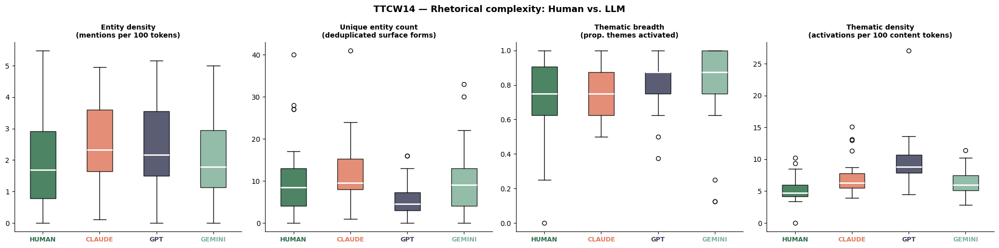

Saved: ttcw14_boxplots.png


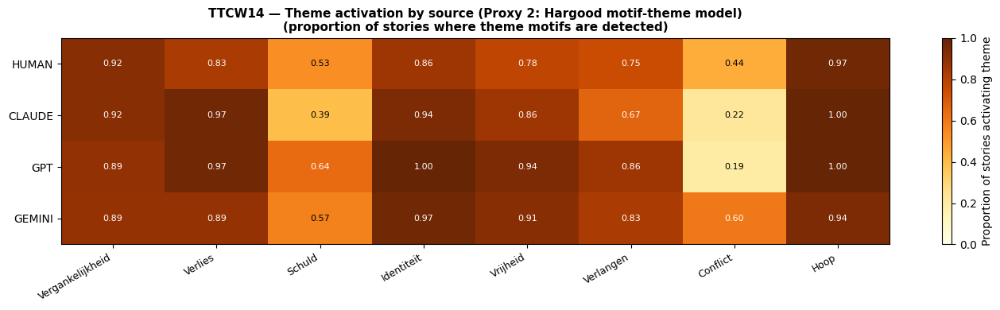

Saved: ttcw14_theme_heatmap.png


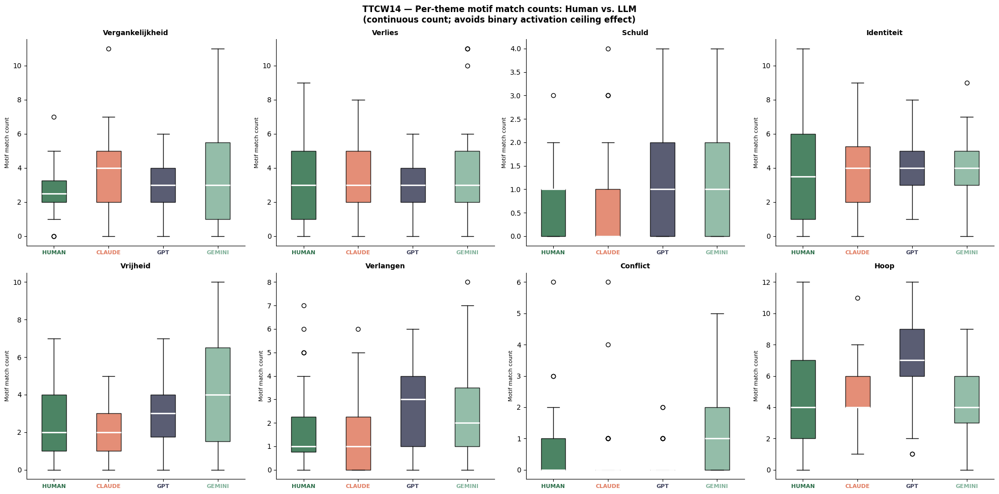

Saved: ttcw14_per_theme_boxplots.png


In [54]:
print("\nStep 2: Source-level aggregation...")
df_source = compute_ttcw14_source_metrics(df_rc)
print(df_source.to_string(index=False))
 
print("\nStep 4: Normality tests (main metrics)...")
test_normality_ttcw14(df_rc)

print("\nStep 5: Kruskal-Wallis (main metrics)...")
kruskal_results = test_ttcw14_kruskal(df_rc)

print("\nStep 6: Mann-Whitney U (main metrics)...")
mw_results = test_ttcw14_mannwhitney(df_rc, kruskal_results)

print("\nStep 7: GPT-4o vs. GPT-5.5 (main metrics)...")
gpt_comparison = test_ttcw14_gpt_version_comparison(df_rc, paired=True)
gpt55_vs_human = test_ttcw14_gpt55_vs_human(df_rc, gpt_comparison)
 
print("\nStep 8: Per-theme count significance tests...")
theme_count_results = test_per_theme_counts(df_rc)
 
print("\nStep 9: Plots...")
plot_ttcw14_boxplots(df_rc)
plot_theme_heatmap(df_rc)
plot_per_theme_boxplots(df_rc)

Beaty, R. E., & Johnson, D. R. (2020). Automating creativity assessment with SemDis: An open platform for computing semantic distance. Behavior Research Methods, 53(2), 757–780. https://doi.org/10.3758/s13428-020-01453-w

Chakrabarty, T., Laban, P., Agarwal, D., Muresan, S., & Wu, C. (2024). Art or Artifice? Large Language Models and the False Promise of Creativity. CHI ’24: Proceedings of the 2024 CHI Conference on Human Factors in Computing Systems, 30. https://doi.org/10.1145/3613904.3642731

Kruskal, W. H., & Wallis, W. A. (1952). Use of ranks in One-Criterion variance analysis. Journal of the American Statistical Association, 47(260), 583–621. https://doi.org/10.1080/01621459.1952.10483441

Mann, H.B. and Whitney, D.R. (1947) On a Test of Whether One of Two Random Variables Is Stochastically Larger than the Other. Annals of Mathematical Statistics, 18, 50-60.
http://dx.doi.org/10.1214/aoms/1177730491

Shannon, C. E. (1948). A mathematical theory of communication. In The Bell System Technical Journal (Vol. 27, pp. 379–423) [Journal-article].

Shapiro, S.S. and Wilk, M.B. (1965) An Analysis of Variance Test for Normality (Complete Samples). Biometrika, 52, 591-611.
https://doi.org/10.1093/biomet/52.3-4.591

Solissa, N. V., Van Cranenburgh, A., & Pianzola, F. (2025). Event Detection between Literary Studies and NLP. A Survey, a Narratological Reflection, and a Case Study. University of Groningen Research Database (University of Groningen / Centre for Information Technology). https://doi.org/10.48694/jcls.4215

Vauth, M., & Gius, E. (2021). Richtlinien für die Annotation narratologischer Ereigniskonzepte. Zenodo (CERN European Organization for Nuclear Research). https://doi.org/10.5281/zenodo.5078175

Vauth, M., Hatzel, H. O., Gius, E., & Biemann, C. (2021). Automated event annotation in literary texts. TUbilio (Technical University of Darmstadt), 333–345. https://ceur-ws.org/Vol-2989/short_paper18.pdf>


